<html>
    <h2>1.Installing Dependencies</h2>
</html>

In [1]:
!pip install tensorflow==2.11.0
!pip install gym
!pip install keras
!pip install keras-rl2
!pip install stable_baselines3
!pip install numpy --upgrade 

<html>
    <h2>2.Importing Required Packages</h2>
</html>

In [2]:
from gym import Env
from gym.spaces import Discrete, Box
from floris.tools import FlorisInterface
import matplotlib.pyplot as plt
import numpy as np
import math
import gym
import stable_baselines3.common.env_checker
import random
import statistics
from os import path
from gym import spaces
from floris.tools.visualization import visualize_cut_plane

<html>
    <h2>3.Creating a Custom Environment(Wind_farm) using openAI gym</h2>
</html>

In [3]:
class wind_farm(gym.Env):
    global a1,a2,p1,p2
    a1=[]
    a2=[]
    p1=[]
    p2=[]
    def __init__(self):
        # Actions we can take are Absolute Angle Representation (theta(0-360 deg))
        self.action_space = Box(low=np.array([0,0]),high=np.array([360,360]))
        # dataframe least and highest values
        self.observation_space = Box(low=np.array([0,1,1,0,-1,-0.5]), high=np.array([360,18,18,1,1.5,0.5]))
        # Set state space
        n=2
        self.state = np.array([random.randint(0,n-1),random.sample(range(1,18),2),random.sample(range(0,360),2)],dtype=object)

    
    def farm_power(self,wind_d,wind_s,s1,s2):
        
        
        fi = FlorisInterface("inputs/gch.yaml")
        
        fi.floris.solver

        # 2. Modify the inputs with a more complex wind turbine layout
        D = 126.0  # Design the layout based on turbine diameter
        x = [6 * D,0]
        y = [5 * D, 0]

        # Pass the new data to FlorisInterface
        fi.reinitialize(
            layout_x=x,
            layout_y=y,
            wind_directions=wind_d,
            wind_speeds=wind_s
        )

        yaw_angles_1 = np.zeros( (2, 1, 2) )  # Construct the yaw array with dimensions for two wind directions, one wind speed, and two turbines
        yaw_angles_1[0, :, 0] = 50        # yaw the first turbine 25 degrees
        yaw_angles_1[0, :, 1] = 50        # yaw the second turbine 25 degrees
        # 3. Calculate the velocities at each turbine for all atmospheric conditions
        a1.append(yaw_angles_1[0].reshape(2,))  
        fi.calculate_wake(yaw_angles=yaw_angles_1)

        # 4. Get the total farm power
        turbine_powers = fi.get_turbine_powers() / 1000.0  # Given in W, so convert to kW
        farm_power_baseline = np.sum(turbine_powers, 2)  # Sum over the third dimension
        
        # 5. Develop the yaw control settings
        yaw_angles_2 = np.zeros( (2, 1, 2) )  # Construct the yaw array with dimensions for two wind directions, one wind speed, and two turbines
        yaw_angles_2[0, :, 0] = s1         # yaw the first turbine s1 degrees
        yaw_angles_2[0, :, 1] = s2            # yaw the second turbine s2 degrees
        
        a2.append(yaw_angles_2[0].reshape(2,))  
        # 6. Calculate the velocities at each turbine for all atmospheric conditions with the new yaw settings
        fi.calculate_wake(yaw_angles=yaw_angles_2)

        # 7. Get the total farm power
        turbine_powers = fi.get_turbine_powers() / 1000.0
        farm_power_yaw = np.sum(turbine_powers, 2)

        # 8. Compare farm power with and without wake steering
        print('farm_power_baseline : {}, farm_power_yaw : {}'.format(farm_power_baseline[0],farm_power_yaw[0]))
        p1.append(farm_power_baseline[0])
        p2.append(farm_power_yaw[0])
        if farm_power_baseline.all()>0:
            difference = 100 * (farm_power_yaw - farm_power_baseline) / farm_power_baseline
        else:
            difference = 100 * (farm_power_yaw - farm_power_baseline)
        
#         print('Predefined_yaw_angle list:',a1)
#         print('Power generated list:',p1)
        x3 = a1
        y3 = p1
        plt.scatter(x3, y3, color ="green")
        plt.title('Scatter Plot of Power generated vs predefined_yaw_angle')
        plt.xlabel('yaw_angle')
        plt.ylabel('Power generated')
        plt.grid()
        plt.show()
        
#         print('Changed_yaw_angle list:',a2)
#         print('Power generated list:',p2)
        x4 = a2
        y4 = p2
        plt.scatter(x4, y4, color ="red")
        plt.title('Scatter Plot of Power generated vs changed_yaw_angle')
        plt.xlabel('yaw_angle')
        plt.ylabel('Power generated')
        plt.grid()
        plt.show()
        
        power_list = [np.amax(farm_power_baseline[0]),np.amax(farm_power_yaw)]
        print('Power_list:',power_list)
        return power_list

    def step(self, action):
        global max_pow 
        max_pow=-1000
        speed = env.observation_space.sample()[1:3]
        # Apply action
        #Absolute angle representation formula
#         print(action)
#         print(action[0])
#         print(action[1])
        self.state1 = math.radians(action[0] - 1*math.radians(180))
        self.state2 = math.radians(action[1] - 2*math.radians(180))
        print('Predefined Yaw Angle 1:',self.state1+50)
        print('Predefined Yaw Angle 2:',self.state2+50)
        print('Changed Yaw Angle 1:',self.state1)
        print('Changed Yaw Angle 2:',self.state2)
        if self.state1 >= 0 and self.state2 >= 0: 
            r = env.farm_power(action,speed,self.state1,self.state2)
            if r[1]>=max_pow:
                #self.reward = env.farm_power(action,speed,self.state1,self.state2)
                self.reward = r[1]
                max_pow=r[1]
                self.baseline_power = r[0]
        #any angle negative,reward is negative
            else: 
                self.reward = -1 
                self.baseline_power = -1
        else:
            self.reward = -1
            self.baseline_power = -1
        # Check if optimization is done
        if self.time_length <= 0: 
            done = True
        else:
            done = False
        # Set placeholder for info
        info = {'power':self.baseline_power}
        
        # Return step information
        return self.observation_space.sample(), self.reward, done, info

    def render(self):
        # Implement viz
        pass
    
    #Assuming that the agent is coming back to original state
    def reset(self):
        self.time_length = 60
        return self.observation_space.sample()

<html>
    <h2>4.Initialising and checking the Environment</h2>
</html>

In [4]:
env = wind_farm()
# stable_baselines3.common.env_checker.check_env(env , warn= True) 

C:\Users\manoh\AppData\Local\Programs\Python\Python310\lib\site-packages\gym\spaces\box.py:73: UserWarning: WARN: Box bound precision lowered by casting to float32
  logger.warn(


<html>
    <h2>5.Importing Packages required to run SAC Algorithm</h2>
</html>

In [5]:
from stable_baselines3.sac.policies import CnnPolicy, MlpPolicy, MultiInputPolicy
from stable_baselines3.sac.sac import SAC
from stable_baselines3 import A2C
import stable_baselines3.common.env_checker

__all__ = ["CnnPolicy", "MlpPolicy", "MultiInputPolicy", "SAC"]

<html>
    <h2>6.Building Agent</h2>
</html>

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Predefined Yaw Angle 1: 52.844207996478715
Predefined Yaw Angle 2: 51.59706818929594
Changed Yaw Angle 1: 2.844207996478712
Changed Yaw Angle 2: 1.597068189295942
farm_power_baseline : [3711.84794935 1940.99907495], farm_power_yaw : [8439.24651414 4464.38843114]


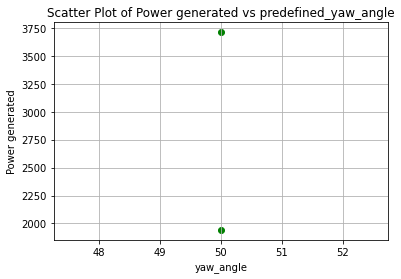

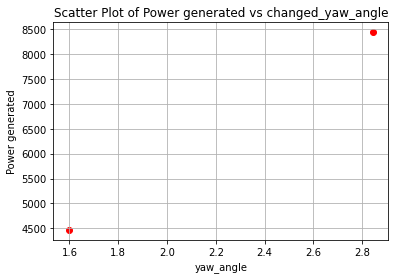

Power_list: [3711.8479493492964, 8451.597520769372]
Predefined Yaw Angle 1: 54.077891272479235
Predefined Yaw Angle 2: 53.82844324867347
Changed Yaw Angle 1: 4.077891272479237
Changed Yaw Angle 2: 3.828443248673472
farm_power_baseline : [   0.         2509.62463685], farm_power_yaw : [  34.10946949 5466.09689229]


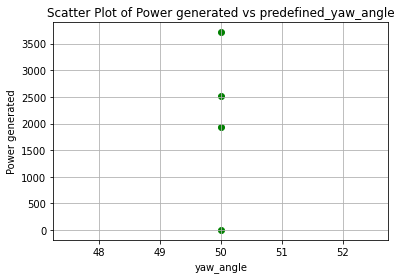

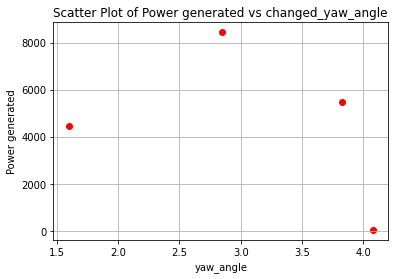

Power_list: [2509.6246368542743, 5466.0968922854045]
Predefined Yaw Angle 1: 50.549538919053816
Predefined Yaw Angle 2: 51.254202044756724
Changed Yaw Angle 1: 0.5495389190538136
Changed Yaw Angle 2: 1.254202044756726
farm_power_baseline : [ 876.1958857  9999.98788733], farm_power_yaw : [ 2120.08588629 10000.00859123]


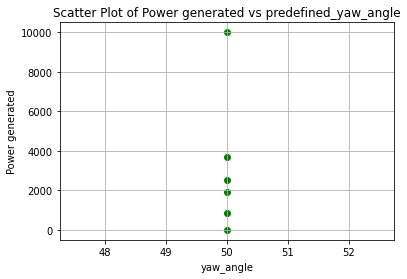

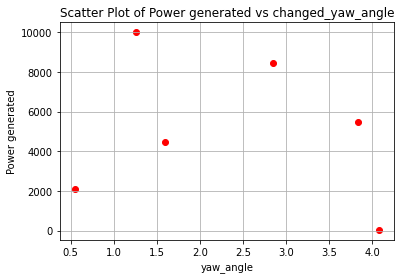

Power_list: [9999.987887330488, 10000.008638724894]
Predefined Yaw Angle 1: 50.361966524656594
Predefined Yaw Angle 2: 51.42192313651996
Changed Yaw Angle 1: 0.36196652465659374
Changed Yaw Angle 2: 1.4219231365199543
farm_power_baseline : [9.04318822 0.        ], farm_power_yaw : [161.18351944  45.6676844 ]


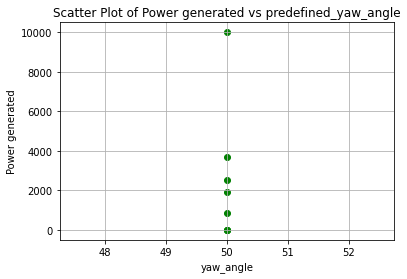

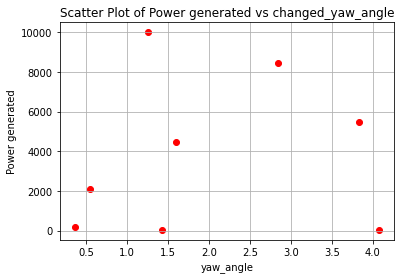

Power_list: [9.043188220681234, 161.26397128449472]
Predefined Yaw Angle 1: 53.746109337554984
Predefined Yaw Angle 2: 51.142254470438594
Changed Yaw Angle 1: 3.7461093375549845
Changed Yaw Angle 2: 1.142254470438591
farm_power_baseline : [  199.34547414 10000.00592297], farm_power_yaw : [  613.69911922 10000.00782517]


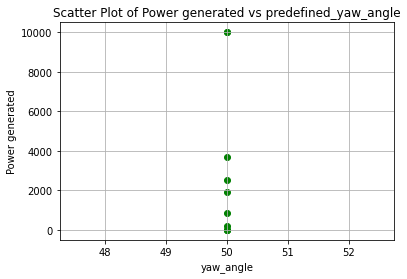

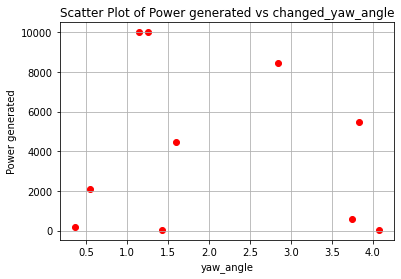

Power_list: [10000.005922965991, 10000.007825172092]
Predefined Yaw Angle 1: 56.05949857323038
Predefined Yaw Angle 2: 52.307054685370055
Changed Yaw Angle 1: 6.0594985732303766
Changed Yaw Angle 2: 2.307054685370052
farm_power_baseline : [6347.67883448    0.        ], farm_power_yaw : [10000.00500612     0.        ]


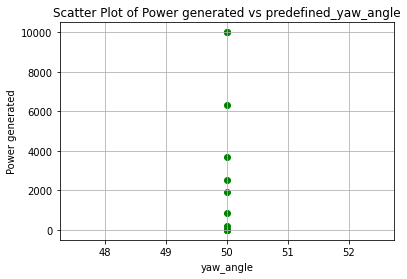

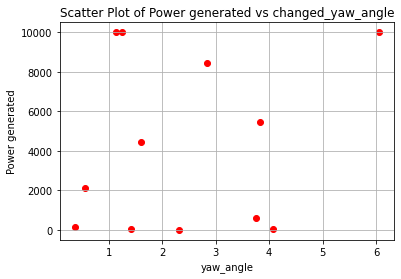

Power_list: [6347.678834480665, 10000.005546972165]
Predefined Yaw Angle 1: 52.55571787560257
Predefined Yaw Angle 2: 51.51759320393941
Changed Yaw Angle 1: 2.5557178756025705
Changed Yaw Angle 2: 1.5175932039394158
farm_power_baseline : [   0.         9999.99672578], farm_power_yaw : [   0.         9999.97745969]


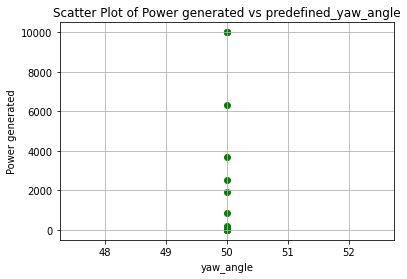

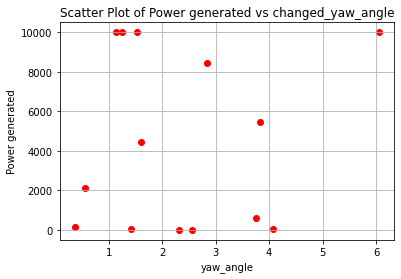

Power_list: [9999.996725783316, 9999.977459685802]
Predefined Yaw Angle 1: 50.05463015317472
Predefined Yaw Angle 2: 52.569404548566524
Changed Yaw Angle 1: 0.054630153174721335
Changed Yaw Angle 2: 2.569404548566521
farm_power_baseline : [   0.       2736.767207], farm_power_yaw : [  32.39406731 6267.87042034]


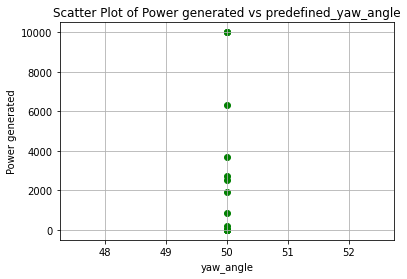

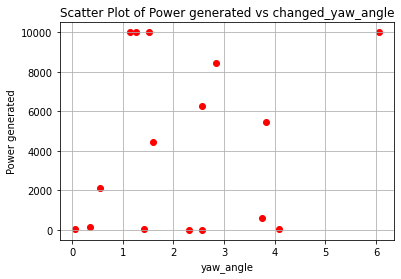

Power_list: [2736.7672069978503, 6273.685175523014]
Predefined Yaw Angle 1: 55.73515591249515
Predefined Yaw Angle 2: 54.07154777825248
Changed Yaw Angle 1: 5.735155912495153
Changed Yaw Angle 2: 4.071547778252484
farm_power_baseline : [   0.         9617.16776969], farm_power_yaw : [    0.         10000.00130432]


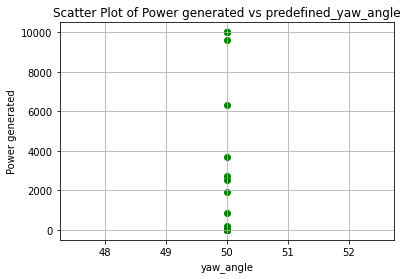

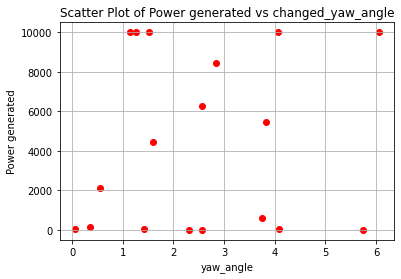

Power_list: [9617.167769687458, 10000.001304323258]
Predefined Yaw Angle 1: 50.718728078367945
Predefined Yaw Angle 2: 53.71349349285849
Changed Yaw Angle 1: 0.7187280783679479
Changed Yaw Angle 2: 3.7134934928584906
farm_power_baseline : [ 160.50539604 1491.94831617], farm_power_yaw : [ 533.71564154 3515.30368797]


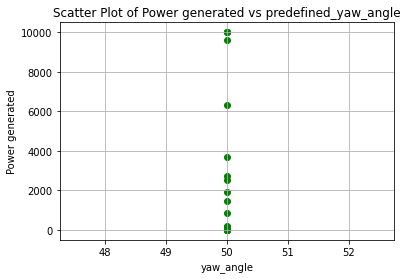

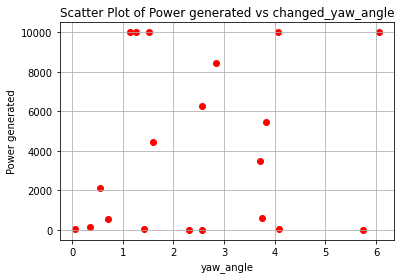

Power_list: [1491.9483161676878, 3847.5771031316103]
Predefined Yaw Angle 1: 54.68074971685993
Predefined Yaw Angle 2: 54.19012396052383
Changed Yaw Angle 1: 4.680749716859928
Changed Yaw Angle 2: 4.190123960523826
farm_power_baseline : [   0.         1183.09122283], farm_power_yaw : [   0.         2772.57421413]


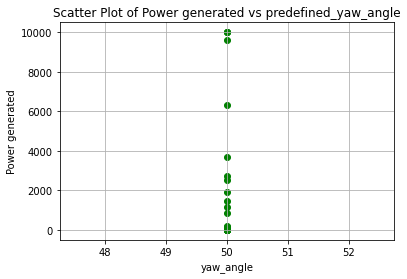

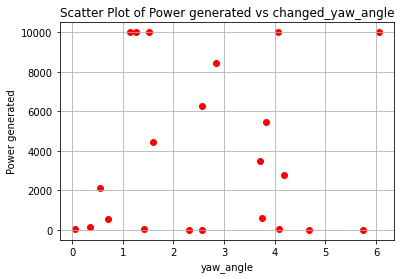

Power_list: [1183.0912228346313, 2787.468054837921]
Predefined Yaw Angle 1: 52.64135980993734
Predefined Yaw Angle 2: 50.681239647562016
Changed Yaw Angle 1: 2.6413598099373385
Changed Yaw Angle 2: 0.6812396475620182
farm_power_baseline : [  12.31011623 2955.03398779], farm_power_yaw : [ 167.78221511 6748.24551154]


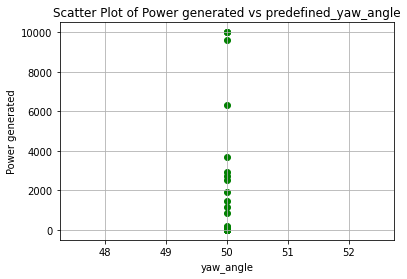

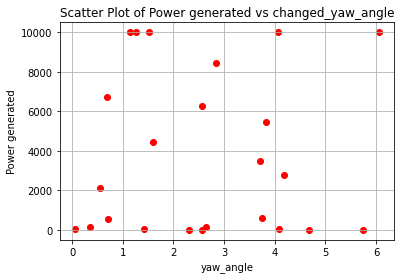

Power_list: [2955.0339877862916, 6748.245511540814]
Predefined Yaw Angle 1: 52.314785153892515
Predefined Yaw Angle 2: 52.653727419213375
Changed Yaw Angle 1: 2.314785153892519
Changed Yaw Angle 2: 2.6537274192133733
farm_power_baseline : [   0.         1549.18009069], farm_power_yaw : [   0.         3589.13362788]


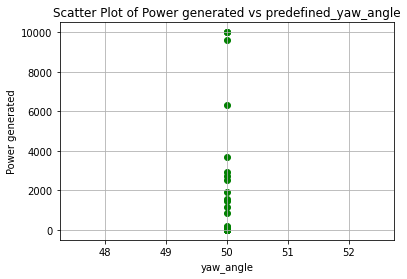

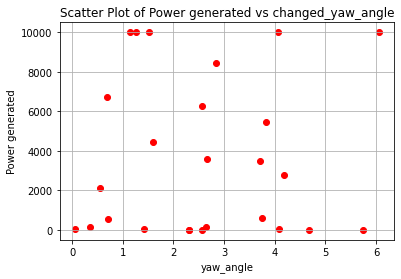

Power_list: [1549.1800906930855, 3595.6837867381028]
Predefined Yaw Angle 1: 54.655926392339296
Predefined Yaw Angle 2: 50.41786812919237
Changed Yaw Angle 1: 4.6559263923393
Changed Yaw Angle 2: 0.41786812919236777
farm_power_baseline : [4854.30952121   41.46253809], farm_power_yaw : [9999.99408409  239.81860106]


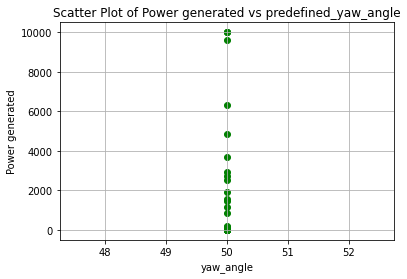

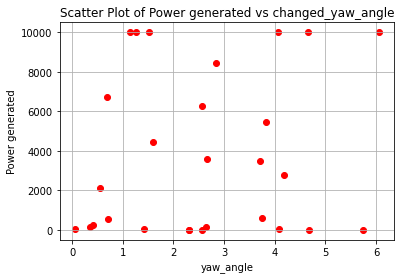

Power_list: [4854.309521211842, 9999.994331431139]
Predefined Yaw Angle 1: 50.485754013838516
Predefined Yaw Angle 2: 51.95639093831714
Changed Yaw Angle 1: 0.48575401383851646
Changed Yaw Angle 2: 1.956390938317139
farm_power_baseline : [  0.53672033 127.68243112], farm_power_yaw : [143.4132902  444.25547803]


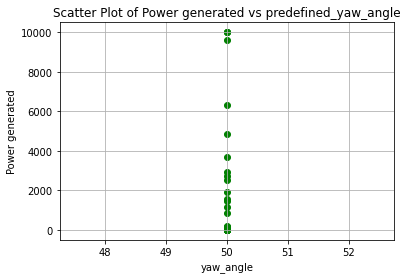

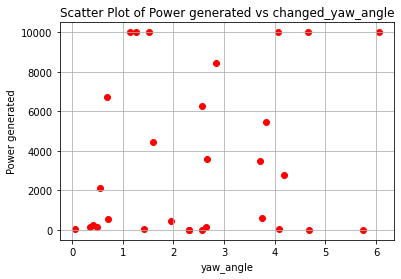

Power_list: [127.68243111760164, 444.5773071235297]
Predefined Yaw Angle 1: 53.32594241237318
Predefined Yaw Angle 2: 53.81890034353939
Changed Yaw Angle 1: 3.325942412373183
Changed Yaw Angle 2: 3.818900343539391
farm_power_baseline : [9999.99045831 4875.65475193], farm_power_yaw : [10000.01389636  9999.9943819 ]


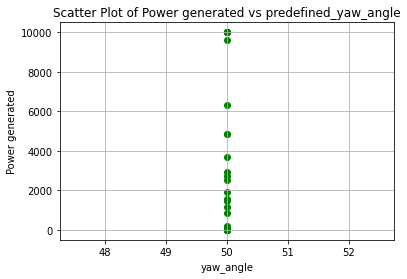

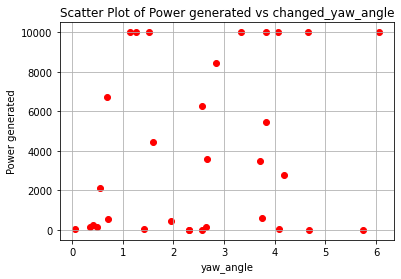

Power_list: [9999.990458313921, 10000.013896364902]
Predefined Yaw Angle 1: 50.475599280733505
Predefined Yaw Angle 2: 55.50904463668954
Changed Yaw Angle 1: 0.47559928073350344
Changed Yaw Angle 2: 5.509044636689535
farm_power_baseline : [0. 0.], farm_power_yaw : [0. 0.]


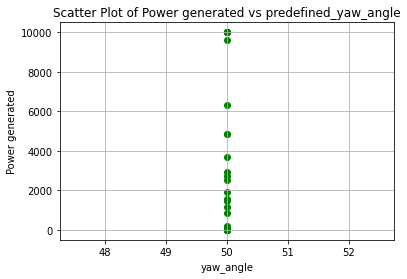

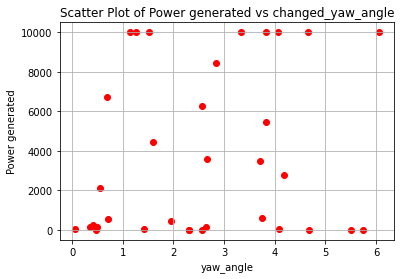

Power_list: [0.0, 0.0]
Predefined Yaw Angle 1: 53.6753291736834
Predefined Yaw Angle 2: 51.42418109765018
Changed Yaw Angle 1: 3.6753291736834037
Changed Yaw Angle 2: 1.4241810976501779
farm_power_baseline : [ 0.         45.98213067], farm_power_yaw : [  0.        252.5059608]


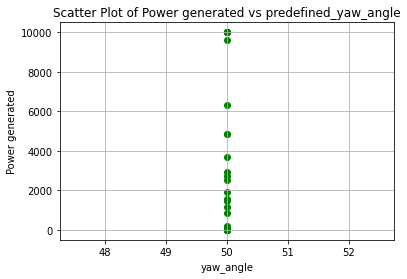

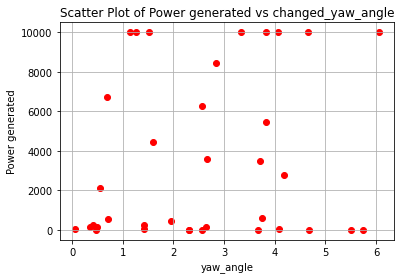

Power_list: [45.9821306722555, 253.3591483635204]
Predefined Yaw Angle 1: 56.19336822437761
Predefined Yaw Angle 2: 53.270719525815224
Changed Yaw Angle 1: 6.1933682243776085
Changed Yaw Angle 2: 3.270719525815225
farm_power_baseline : [   0.         7989.95883631], farm_power_yaw : [  94.11284125 9999.99492733]


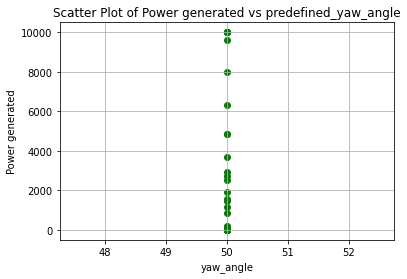

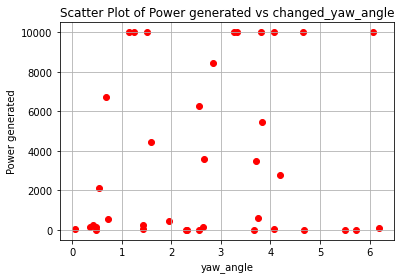

Power_list: [7989.958836310347, 9999.99514675379]
Predefined Yaw Angle 1: 51.45254227618916
Predefined Yaw Angle 2: 55.95726849658754
Changed Yaw Angle 1: 1.4525422761891609
Changed Yaw Angle 2: 5.957268496587539
farm_power_baseline : [10000.00296458 10000.00366684], farm_power_yaw : [10000.01390289 10000.01381911]


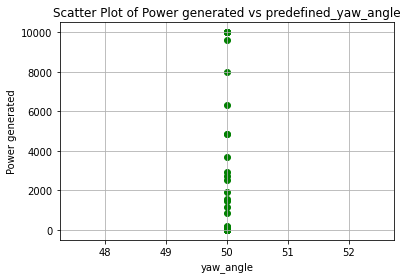

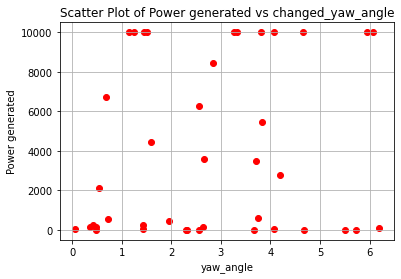

Power_list: [10000.003666844716, 10000.013902894523]
Predefined Yaw Angle 1: 56.01841292182929
Predefined Yaw Angle 2: 51.56434539634992
Changed Yaw Angle 1: 6.018412921829288
Changed Yaw Angle 2: 1.5643453963499203
farm_power_baseline : [1729.47471016 2008.62101416], farm_power_yaw : [3973.89996384 4593.07419006]


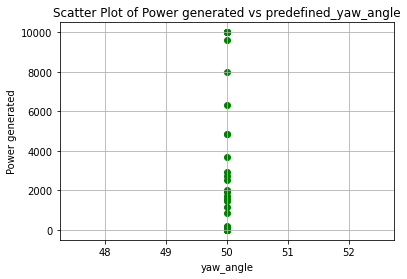

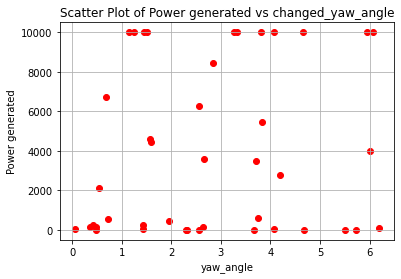

Power_list: [2008.6210141566175, 4618.088597424124]
Predefined Yaw Angle 1: 50.77232905557478
Predefined Yaw Angle 2: 51.448069785786245
Changed Yaw Angle 1: 0.772329055574782
Changed Yaw Angle 2: 1.4480697857862432
farm_power_baseline : [1747.76821541  787.55877654], farm_power_yaw : [3608.53114342 1695.00253218]


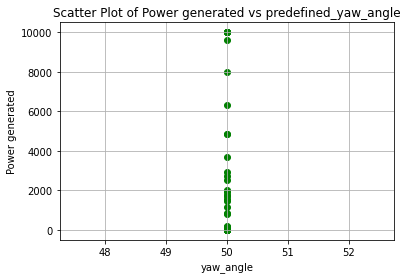

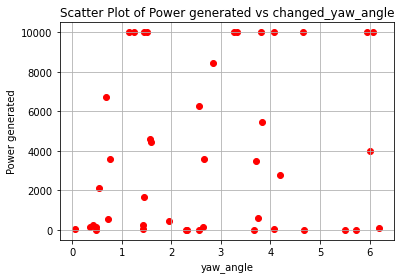

Power_list: [1747.768215407233, 4619.089648939412]
Predefined Yaw Angle 1: 51.42511171696135
Predefined Yaw Angle 2: 52.971571700572696
Changed Yaw Angle 1: 1.4251117169613448
Changed Yaw Angle 2: 2.971571700572695
farm_power_baseline : [ 742.32885639 9999.99902052], farm_power_yaw : [ 1821.39079282 10000.01433333]


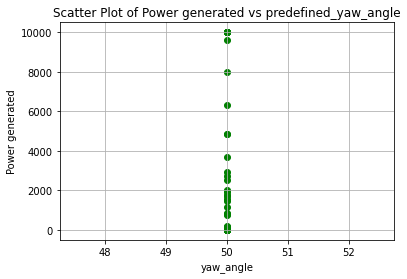

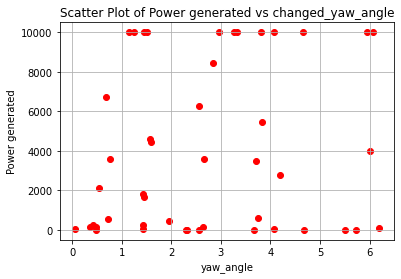

Power_list: [9999.999020521776, 10000.014333327978]
Predefined Yaw Angle 1: 53.33269432468486
Predefined Yaw Angle 2: 53.30319943846983
Changed Yaw Angle 1: 3.3326943246848613
Changed Yaw Angle 2: 3.3031994384698313
farm_power_baseline : [3835.30695866 9999.99495642], farm_power_yaw : [ 8694.2478869  10000.00268832]


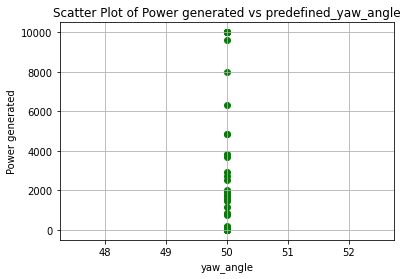

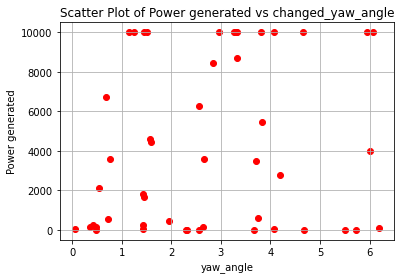

Power_list: [9999.994956415134, 10000.002688317876]
Predefined Yaw Angle 1: 53.69695670489594
Predefined Yaw Angle 2: 53.437946068564024
Changed Yaw Angle 1: 3.6969567048959373
Changed Yaw Angle 2: 3.4379460685640253
farm_power_baseline : [1499.73518982 9999.99662221], farm_power_yaw : [3472.85361897 9999.97501943]


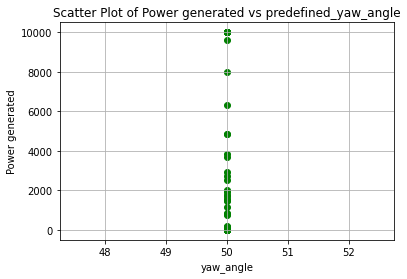

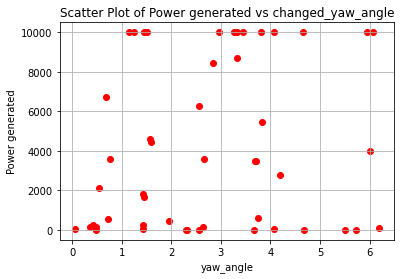

Power_list: [9999.996622206228, 9999.976585372851]
Predefined Yaw Angle 1: 52.08499270133838
Predefined Yaw Angle 2: 55.92333556324218
Changed Yaw Angle 1: 2.0849927013383773
Changed Yaw Angle 2: 5.923335563242186
farm_power_baseline : [1314.4145935  3591.67102123], farm_power_yaw : [3065.69598208 8144.95875144]


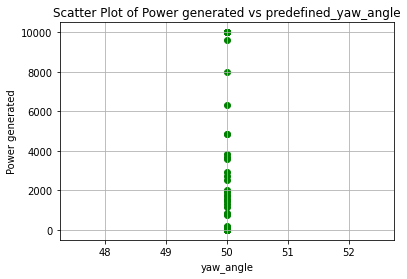

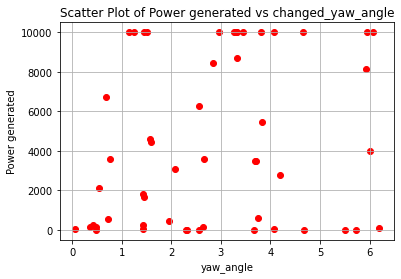

Power_list: [3591.6710212275493, 8190.244046268919]
Predefined Yaw Angle 1: 53.10292823742551
Predefined Yaw Angle 2: 52.01484173160609
Changed Yaw Angle 1: 3.102928237425512
Changed Yaw Angle 2: 2.014841731606089
farm_power_baseline : [2145.53919109 9999.98874111], farm_power_yaw : [ 4911.72141085 10000.01025483]


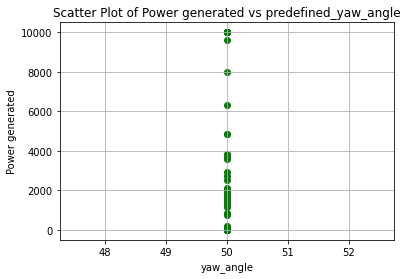

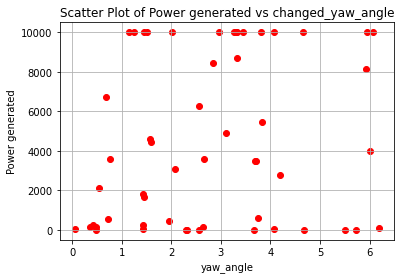

Power_list: [9999.988741108478, 10000.01060282927]
Predefined Yaw Angle 1: 55.827950564885654
Predefined Yaw Angle 2: 53.73867581149406
Changed Yaw Angle 1: 5.827950564885656
Changed Yaw Angle 2: 3.738675811494062
farm_power_baseline : [10000.00442406  4800.63380783], farm_power_yaw : [9999.97580213 9999.99286774]


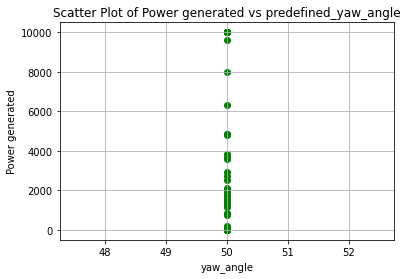

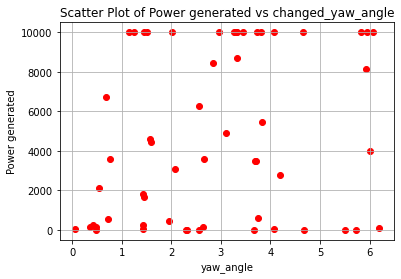

Power_list: [10000.004424057248, 9999.993082313758]
Predefined Yaw Angle 1: 55.934394450495034
Predefined Yaw Angle 2: 53.34955628461651
Changed Yaw Angle 1: 5.934394450495033
Changed Yaw Angle 2: 3.3495562846165132
farm_power_baseline : [ 9999.99658246 10000.0023803 ], farm_power_yaw : [9999.97602997 9999.96171067]


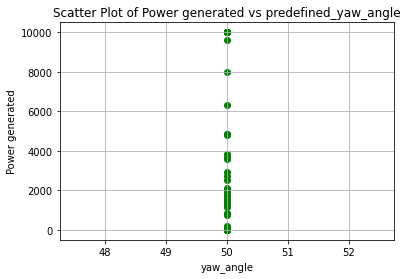

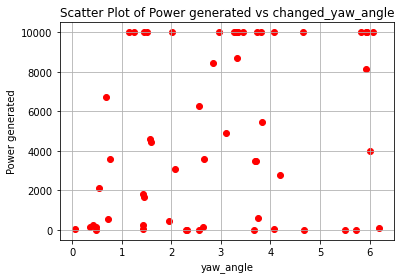

Power_list: [10000.002380297805, 9999.978204936]
Predefined Yaw Angle 1: 55.42554213048472
Predefined Yaw Angle 2: 51.93741311923118
Changed Yaw Angle 1: 5.425542130484721
Changed Yaw Angle 2: 1.9374131192311799
farm_power_baseline : [7428.10669444    0.        ], farm_power_yaw : [10000.00106939   131.80425724]


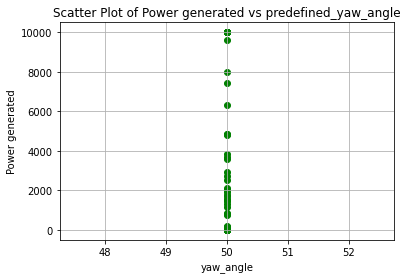

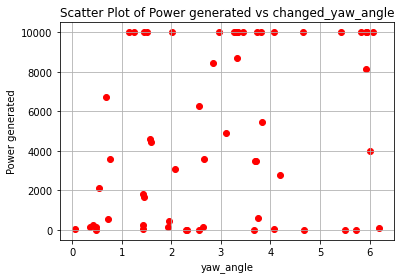

Power_list: [7428.106694440157, 10000.001069391245]
Predefined Yaw Angle 1: 51.63092280337349
Predefined Yaw Angle 2: 50.02087365161621
Changed Yaw Angle 1: 1.630922803373486
Changed Yaw Angle 2: 0.020873651616211616
farm_power_baseline : [6702.50174732    0.        ], farm_power_yaw : [10000.00528293     0.        ]


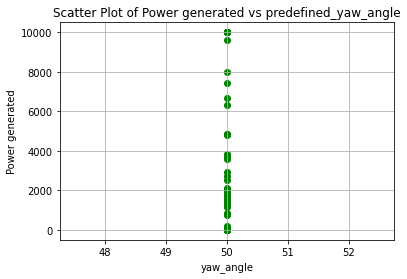

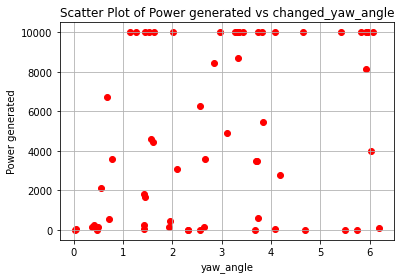

Power_list: [6702.501747318137, 10000.005282927814]
Predefined Yaw Angle 1: 53.398646976448454
Predefined Yaw Angle 2: 50.735046220805
Changed Yaw Angle 1: 3.3986469764484557
Changed Yaw Angle 2: 0.7350462208050064
farm_power_baseline : [0. 0.], farm_power_yaw : [0. 0.]


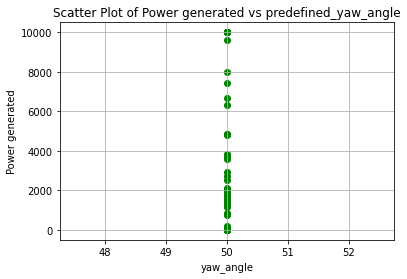

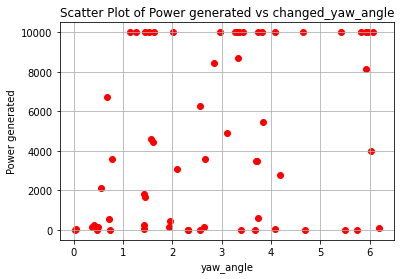

Power_list: [0.0, 0.0]
Predefined Yaw Angle 1: 55.48540466546752
Predefined Yaw Angle 2: 51.285759837883894
Changed Yaw Angle 1: 5.485404665467522
Changed Yaw Angle 2: 1.2857598378838924
farm_power_baseline : [   0.         3183.62635037], farm_power_yaw : [   0.         7240.65526466]


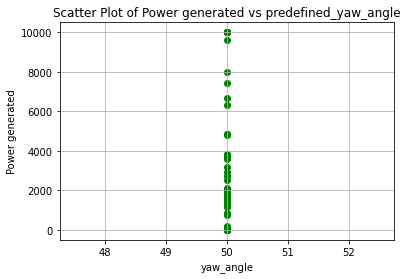

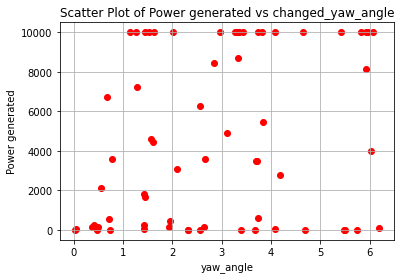

Power_list: [3183.626350370498, 7272.727291490072]
Predefined Yaw Angle 1: 51.42096703935685
Predefined Yaw Angle 2: 52.37869691448649
Changed Yaw Angle 1: 1.4209670393568545
Changed Yaw Angle 2: 2.378696914486492
farm_power_baseline : [6754.97678139  338.81424589], farm_power_yaw : [10000.0051688    929.88485612]


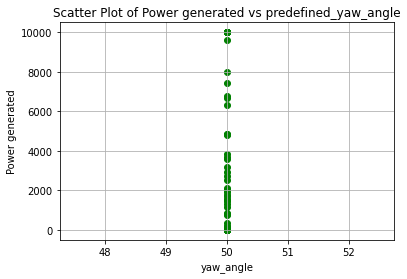

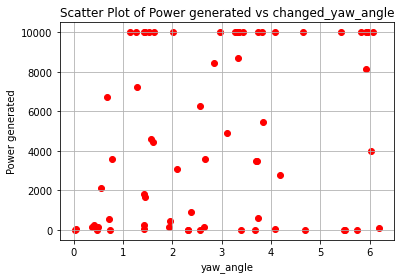

Power_list: [6754.9767813907, 10000.005168796895]
Predefined Yaw Angle 1: 50.831790651655474
Predefined Yaw Angle 2: 53.434591284538854
Changed Yaw Angle 1: 0.8317906516554717
Changed Yaw Angle 2: 3.4345912845388527
farm_power_baseline : [1407.80323481 2566.66104849], farm_power_yaw : [2505.78301176 4511.02566865]


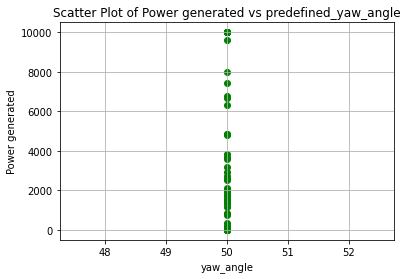

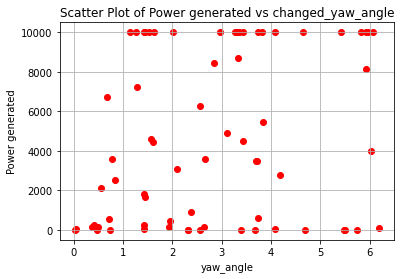

Power_list: [2566.6610484871867, 6216.100497708323]
Predefined Yaw Angle 1: 55.60952981018615
Predefined Yaw Angle 2: 52.170944250481625
Changed Yaw Angle 1: 5.609529810186153
Changed Yaw Angle 2: 2.1709442504816288
farm_power_baseline : [7916.84303166 1151.21993337], farm_power_yaw : [9999.99529686 2709.74617499]


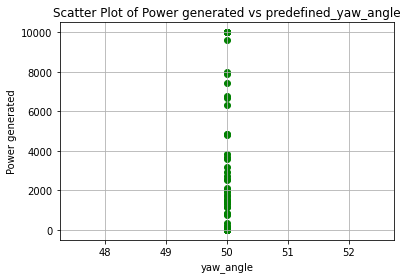

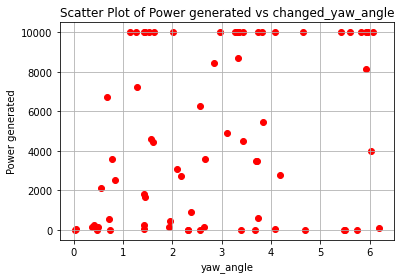

Power_list: [7916.843031658093, 9999.99529686464]
Predefined Yaw Angle 1: 52.189397670817186
Predefined Yaw Angle 2: 50.111795718930985
Changed Yaw Angle 1: 2.18939767081719
Changed Yaw Angle 2: 0.11179571893098217
farm_power_baseline : [2187.23834721 1101.05845371], farm_power_yaw : [5019.34730335 2620.51478577]


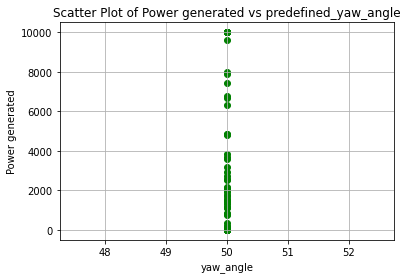

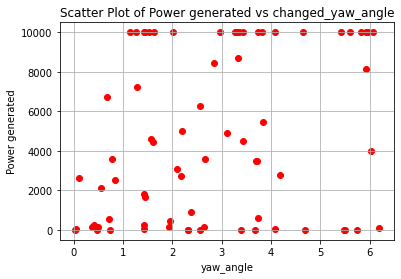

Power_list: [2187.238347207234, 5022.9161582835495]
Predefined Yaw Angle 1: 49.99123060736916
Predefined Yaw Angle 2: 53.45979197898595
Changed Yaw Angle 1: -0.008769392630841269
Changed Yaw Angle 2: 3.4597919789859453
Predefined Yaw Angle 1: 55.46800357090494
Predefined Yaw Angle 2: 51.28571549625174
Changed Yaw Angle 1: 5.468003570904944
Changed Yaw Angle 2: 1.2857154962517425
farm_power_baseline : [10000.00499756  1221.48809901], farm_power_yaw : [9999.98911609 2857.73946532]


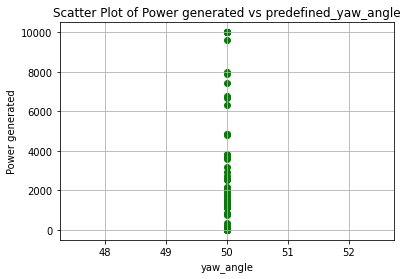

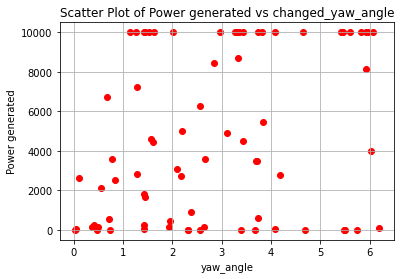

Power_list: [10000.004997560894, 9999.98911608756]
Predefined Yaw Angle 1: 50.737116007272455
Predefined Yaw Angle 2: 51.99095943505664
Changed Yaw Angle 1: 0.7371160072724545
Changed Yaw Angle 2: 1.99095943505664
farm_power_baseline : [1531.13317112 9999.99282328], farm_power_yaw : [ 3515.46776062 10000.00789913]


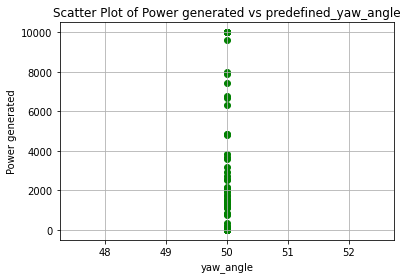

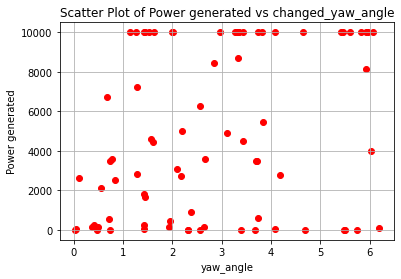

Power_list: [9999.992823284956, 10000.00789912629]
Predefined Yaw Angle 1: 53.724673287624825
Predefined Yaw Angle 2: 52.23966552451447
Changed Yaw Angle 1: 3.724673287624828
Changed Yaw Angle 2: 2.239665524514469
farm_power_baseline : [ 4474.17383525 10000.00429111], farm_power_yaw : [9999.98758992 9999.9706797 ]


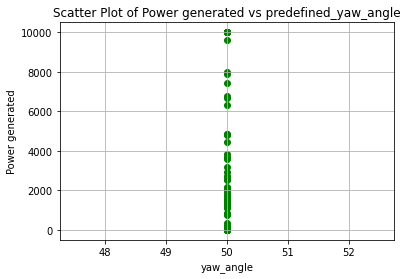

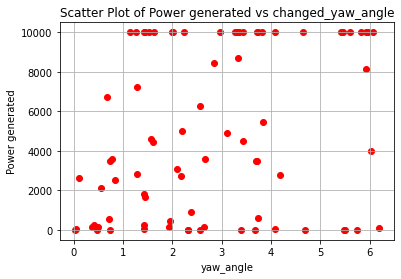

Power_list: [10000.004291107916, 9999.987808080252]
Predefined Yaw Angle 1: 53.69267087975367
Predefined Yaw Angle 2: 55.86712528737832
Changed Yaw Angle 1: 3.6926708797536727
Changed Yaw Angle 2: 5.867125287378319
farm_power_baseline : [4182.99247927 8283.6539502 ], farm_power_yaw : [9433.44933566 9999.99792662]


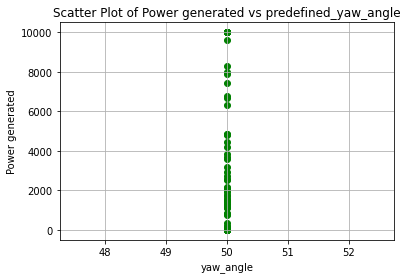

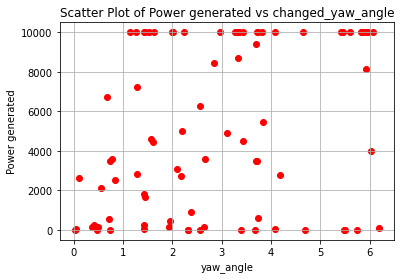

Power_list: [8283.653950199274, 9999.998572981374]
Predefined Yaw Angle 1: 54.547920296434484
Predefined Yaw Angle 2: 51.80351337436363
Changed Yaw Angle 1: 4.547920296434483
Changed Yaw Angle 2: 1.803513374363631
farm_power_baseline : [107.45459874 910.48803868], farm_power_yaw : [ 397.98878063 2185.20834986]


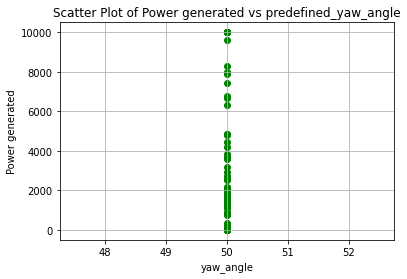

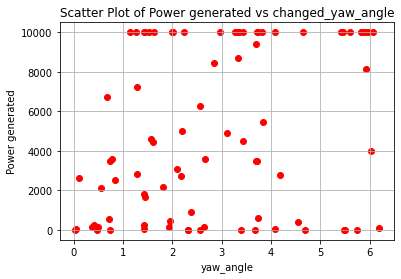

Power_list: [910.4880386844787, 2192.5462810522718]
Predefined Yaw Angle 1: 51.89566032364527
Predefined Yaw Angle 2: 55.807872616285145
Changed Yaw Angle 1: 1.8956603236452652
Changed Yaw Angle 2: 5.807872616285146
farm_power_baseline : [   0.         6622.09439071], farm_power_yaw : [    0.         10000.00556546]


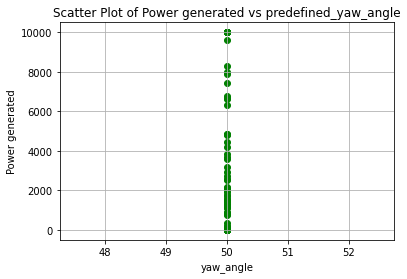

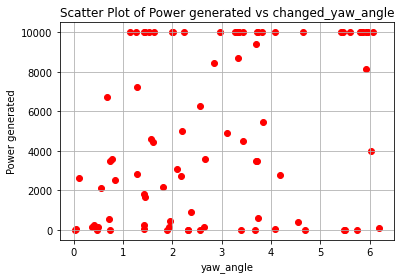

Power_list: [6622.094390714089, 10000.005565455673]
Predefined Yaw Angle 1: 54.61299144187726
Predefined Yaw Angle 2: 52.31286756708137
Changed Yaw Angle 1: 4.61299144187726
Changed Yaw Angle 2: 2.3128675670813683
farm_power_baseline : [10000.00464918  2441.74582066], farm_power_yaw : [9999.98019218 5573.56917623]


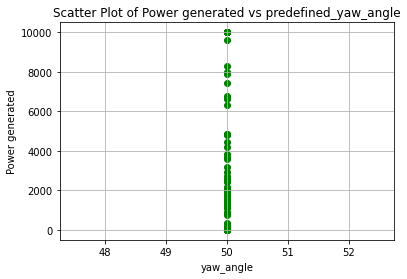

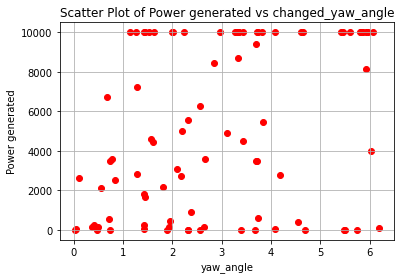

Power_list: [10000.00464917753, 9999.980192178082]
Predefined Yaw Angle 1: 53.66840388958476
Predefined Yaw Angle 2: 54.88122571499208
Changed Yaw Angle 1: 3.6684038895847615
Changed Yaw Angle 2: 4.881225714992075
farm_power_baseline : [   0.         3516.04223519], farm_power_yaw : [   0.         7983.23232692]


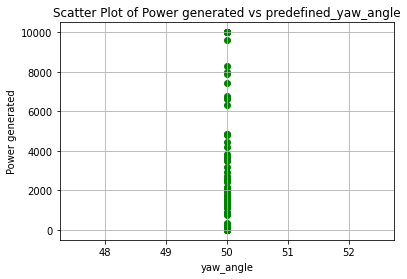

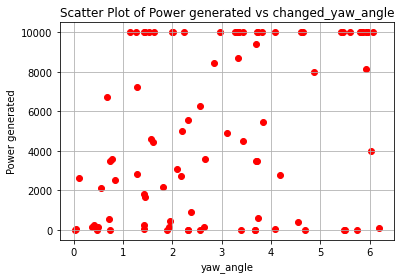

Power_list: [3516.042235192831, 8025.787595291789]
Predefined Yaw Angle 1: 51.42374245268688
Predefined Yaw Angle 2: 50.1164897900236
Changed Yaw Angle 1: 1.4237424526868805
Changed Yaw Angle 2: 0.11648979002359902
farm_power_baseline : [1361.57699289 4036.07089439], farm_power_yaw : [3189.67815395 9176.03707079]


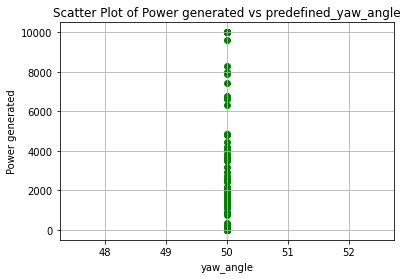

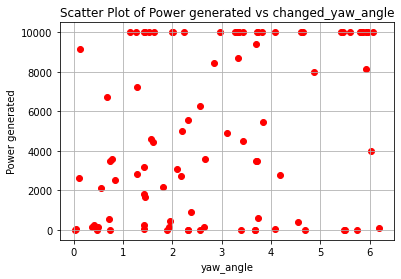

Power_list: [4036.070894389544, 9178.627596350887]
Predefined Yaw Angle 1: 50.760811682808516
Predefined Yaw Angle 2: 54.2828408486105
Changed Yaw Angle 1: 0.7608116828085163
Changed Yaw Angle 2: 4.282840848610498
farm_power_baseline : [2996.58992898    0.        ], farm_power_yaw : [6366.6014788    0.       ]


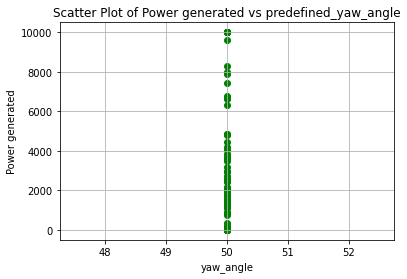

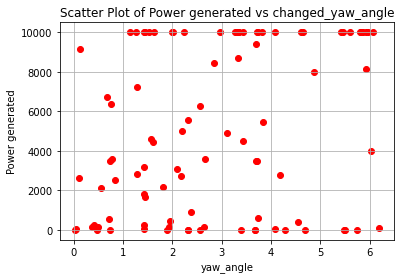

Power_list: [2996.589928980965, 7833.8787261973785]
Predefined Yaw Angle 1: 55.95375669688435
Predefined Yaw Angle 2: 51.26011852343444
Changed Yaw Angle 1: 5.953756696884345
Changed Yaw Angle 2: 1.260118523434446
farm_power_baseline : [1981.63904943    0.        ], farm_power_yaw : [4535.62262254  125.25369579]


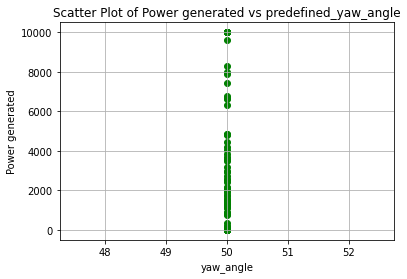

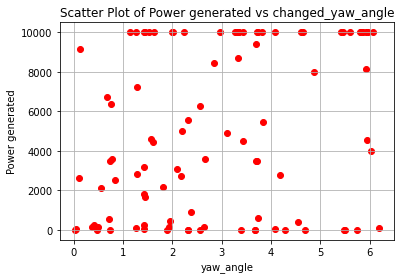

Power_list: [1981.639049425667, 4559.4768126337685]
Predefined Yaw Angle 1: 50.50811151750584
Predefined Yaw Angle 2: 50.502309577086756
Changed Yaw Angle 1: 0.5081115175058407
Changed Yaw Angle 2: 0.5023095770867554
farm_power_baseline : [ 563.60176281 3195.40968834], farm_power_yaw : [1425.42952121 7298.86843705]


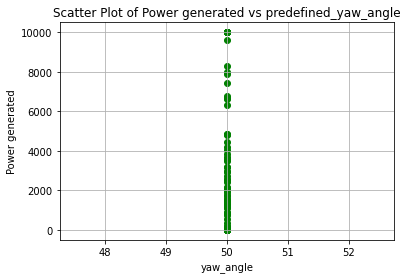

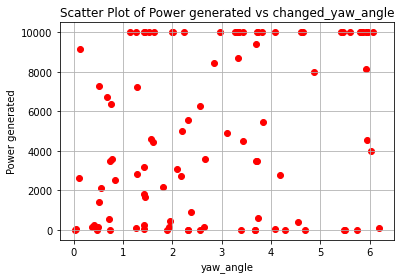

Power_list: [3195.4096883360953, 7299.247361468149]
Predefined Yaw Angle 1: 52.29252299139222
Predefined Yaw Angle 2: 55.29023346257423
Changed Yaw Angle 1: 2.2925229913922194
Changed Yaw Angle 2: 5.290233462574227
farm_power_baseline : [9999.98790263  275.95842835], farm_power_yaw : [10000.00783177   768.19164531]


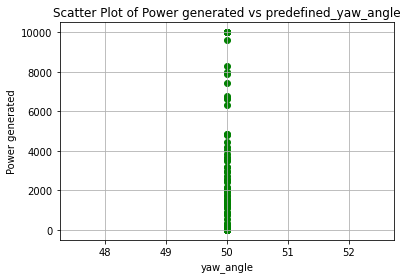

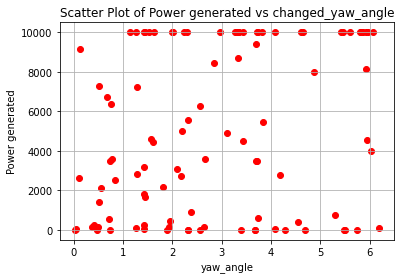

Power_list: [9999.98790262566, 10000.00867391119]
Predefined Yaw Angle 1: 54.1636780827773
Predefined Yaw Angle 2: 51.46941595402961
Changed Yaw Angle 1: 4.163678082777305
Changed Yaw Angle 2: 1.46941595402961
farm_power_baseline : [6889.54406314 3130.62801844], farm_power_yaw : [10000.00487553  7124.98688444]


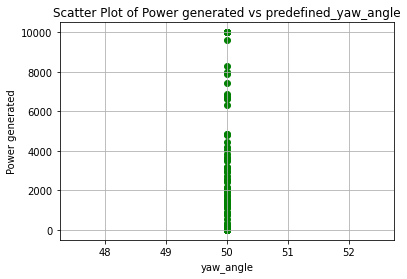

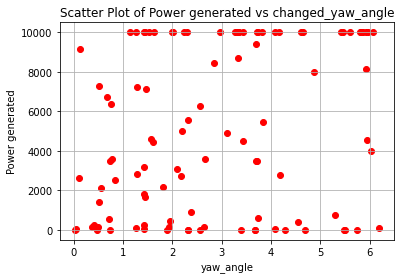

Power_list: [6889.544063139923, 10000.00487553356]
Predefined Yaw Angle 1: 51.693196564407245
Predefined Yaw Angle 2: 55.328231977639696
Changed Yaw Angle 1: 1.6931965644072446
Changed Yaw Angle 2: 5.328231977639695
farm_power_baseline : [9999.99156692 1268.43627838], farm_power_yaw : [10000.01629915  2964.69117455]


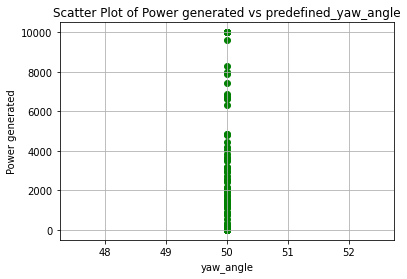

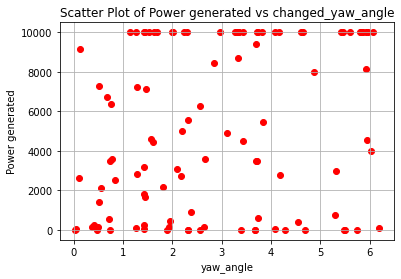

Power_list: [9999.991566924771, 10000.017103580396]
Predefined Yaw Angle 1: 54.99644722406454
Predefined Yaw Angle 2: 53.945359482637365
Changed Yaw Angle 1: 4.9964472240645375
Changed Yaw Angle 2: 3.9453594826373677
farm_power_baseline : [  0.         401.72572956], farm_power_yaw : [   0.         1051.10788398]


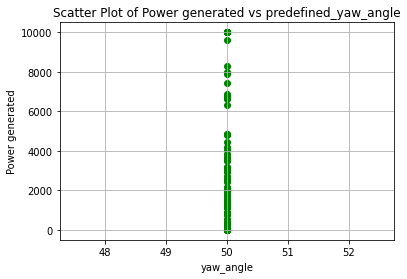

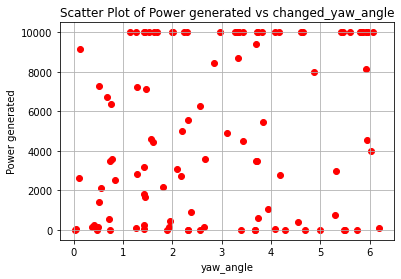

Power_list: [401.72572956151987, 1051.1078839774068]
Predefined Yaw Angle 1: 55.73138753955269
Predefined Yaw Angle 2: 55.319202263647675
Changed Yaw Angle 1: 5.73138753955269
Changed Yaw Angle 2: 5.319202263647672
farm_power_baseline : [  0.        549.4468505], farm_power_yaw : [   0.         1384.89645311]


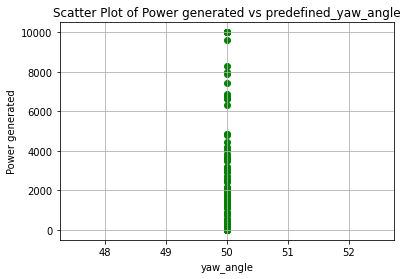

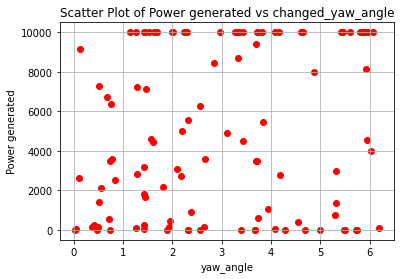

Power_list: [549.4468505022644, 1396.9920048002755]
Predefined Yaw Angle 1: 51.296620585951636
Predefined Yaw Angle 2: 52.02049269312313
Changed Yaw Angle 1: 1.2966205859516378
Changed Yaw Angle 2: 2.020492693123128
farm_power_baseline : [10000.00309234     0.        ], farm_power_yaw : [9999.96269923    0.        ]


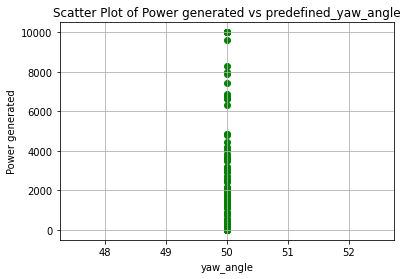

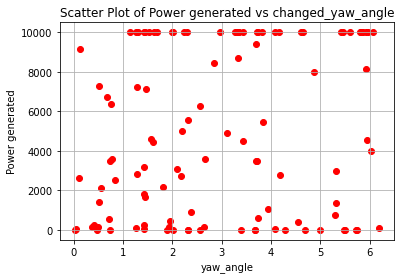

Power_list: [10000.003092341998, 9999.96269922871]
Predefined Yaw Angle 1: 55.67083471321534
Predefined Yaw Angle 2: 53.82188787765024
Changed Yaw Angle 1: 5.670834713215341
Changed Yaw Angle 2: 3.821887877650242
farm_power_baseline : [189.34642003 638.08948694], farm_power_yaw : [ 586.66490649 1580.32432583]


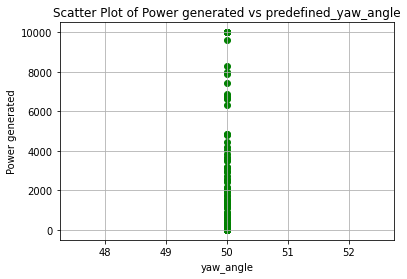

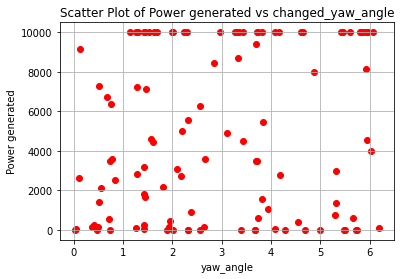

Power_list: [638.0894869372647, 1580.324325825427]
Predefined Yaw Angle 1: 53.48213334819691
Predefined Yaw Angle 2: 55.2471451140334
Changed Yaw Angle 1: 3.4821333481969137
Changed Yaw Angle 2: 5.2471451140333984
farm_power_baseline : [3864.77410531    0.        ], farm_power_yaw : [8737.50579961    0.        ]


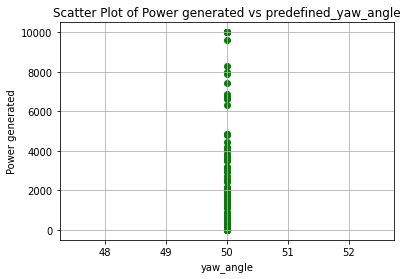

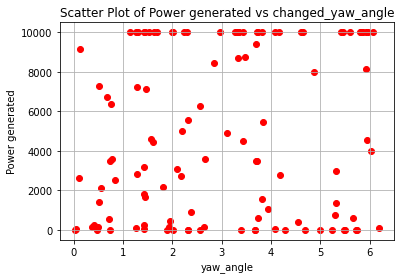

Power_list: [3864.7741053092386, 8784.1720242684]
Predefined Yaw Angle 1: 54.709229028925016
Predefined Yaw Angle 2: 55.735018648872725
Changed Yaw Angle 1: 4.709229028925018
Changed Yaw Angle 2: 5.735018648872721
farm_power_baseline : [9999.99596882    0.        ], farm_power_yaw : [9999.99903381   72.79115567]


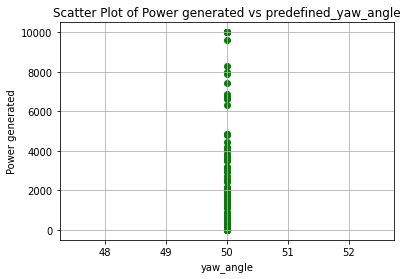

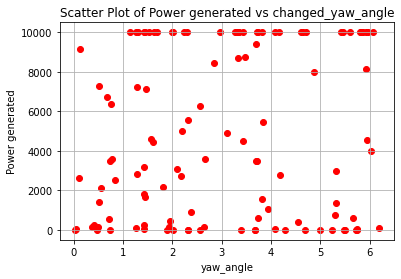

Power_list: [9999.995968819156, 9999.999033813478]
Predefined Yaw Angle 1: 54.29536394183067
Predefined Yaw Angle 2: 51.10971703350444
Changed Yaw Angle 1: 4.295363941830671
Changed Yaw Angle 2: 1.109717033504439
farm_power_baseline : [ 536.82182889 1572.25793746], farm_power_yaw : [1369.02981045 3636.36006852]


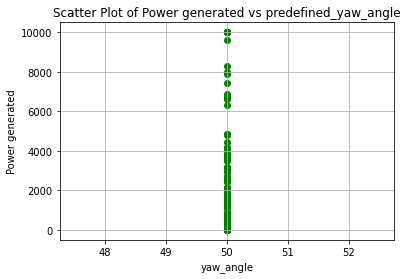

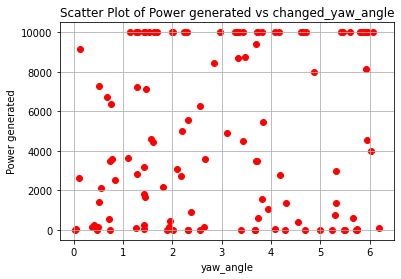

Power_list: [1572.2579374589936, 3646.804706621617]
Predefined Yaw Angle 1: 52.10213653453965
Predefined Yaw Angle 2: 55.149403906234184
Changed Yaw Angle 1: 2.1021365345396537
Changed Yaw Angle 2: 5.149403906234182
farm_power_baseline : [ 7747.81951916 10000.00078705], farm_power_yaw : [ 9999.99714659 10000.01415262]


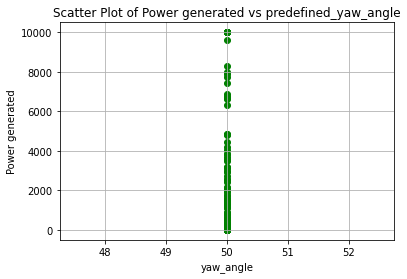

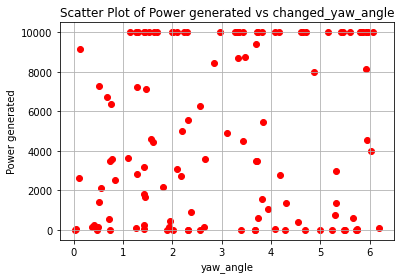

Power_list: [10000.00078704616, 10000.014152622138]
Predefined Yaw Angle 1: 52.90280686152427
Predefined Yaw Angle 2: 53.02208281170379
Changed Yaw Angle 1: 2.9028068615242706
Changed Yaw Angle 2: 3.022082811703792
farm_power_baseline : [491.7748434  914.97717153], farm_power_yaw : [1264.04340728 2196.57425429]


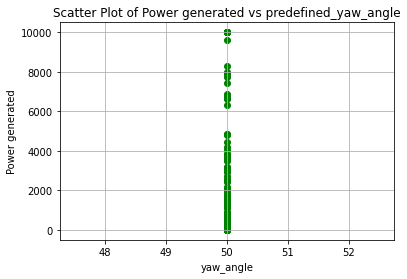

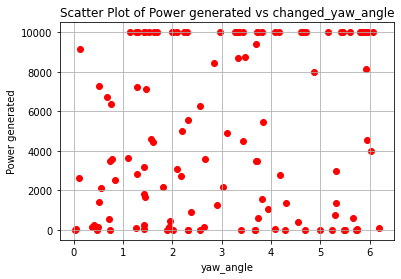

Power_list: [914.9771715283937, 2201.9649879582184]
Predefined Yaw Angle 1: 51.00689855333425
Predefined Yaw Angle 2: 51.94956299275634
Changed Yaw Angle 1: 1.0068985533342527
Changed Yaw Angle 2: 1.9495629927563394
farm_power_baseline : [ 370.43308967 6773.28598274], farm_power_yaw : [  989.48292026 10000.00512386]


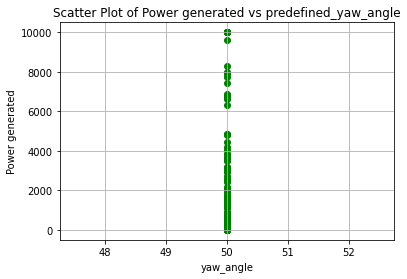

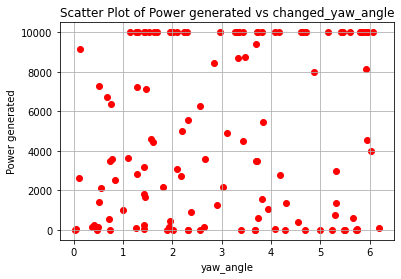

Power_list: [6773.2859827408465, 10000.005123856115]
Predefined Yaw Angle 1: 54.51182807207729
Predefined Yaw Angle 2: 53.23880793173724
Changed Yaw Angle 1: 4.511828072077292
Changed Yaw Angle 2: 3.238807931737241
farm_power_baseline : [ 754.12619469 2830.5874924 ], farm_power_yaw : [1845.737198   6462.00665966]


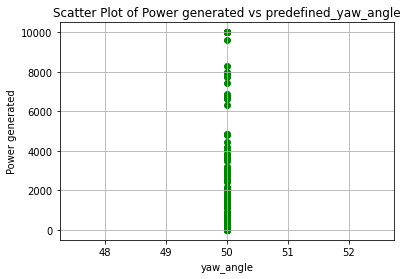

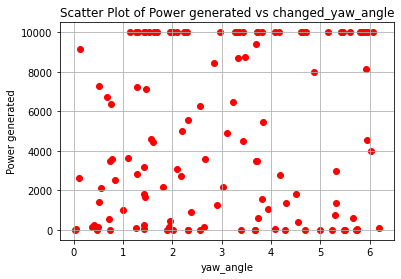

Power_list: [2830.5874923957745, 6489.481831370917]
Predefined Yaw Angle 1: 54.59542097026935
Predefined Yaw Angle 2: 50.967152760609345
Changed Yaw Angle 1: 4.595420970269354
Changed Yaw Angle 2: 0.9671527606093446
farm_power_baseline : [1409.55277845  244.76976144], farm_power_yaw : [3289.94423673  704.58328148]


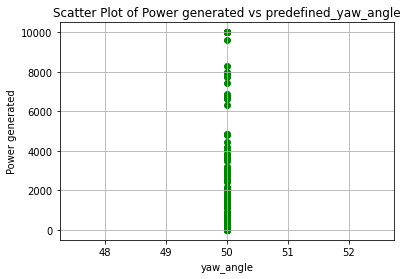

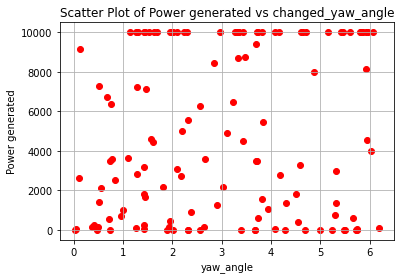

Power_list: [1409.5527784522153, 3294.954998121121]
Predefined Yaw Angle 1: 55.5668989927206
Predefined Yaw Angle 2: 51.01374496361736
Changed Yaw Angle 1: 5.5668989927206
Changed Yaw Angle 2: 1.0137449636173625
farm_power_baseline : [10000.0048993   6431.54382613], farm_power_yaw : [ 9999.98683191 10000.00597424]


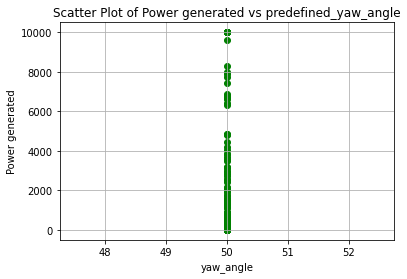

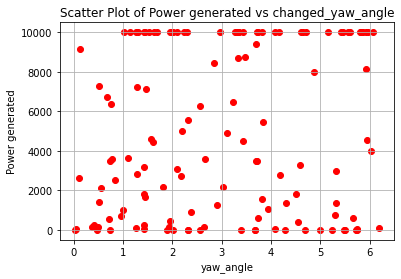

Power_list: [10000.004899295602, 10000.005977219127]
Predefined Yaw Angle 1: 52.05814963544703
Predefined Yaw Angle 2: 54.96832546370755
Changed Yaw Angle 1: 2.058149635447033
Changed Yaw Angle 2: 4.9683254637075525
farm_power_baseline : [1692.09094584    0.        ], farm_power_yaw : [3896.53951589  101.72493886]


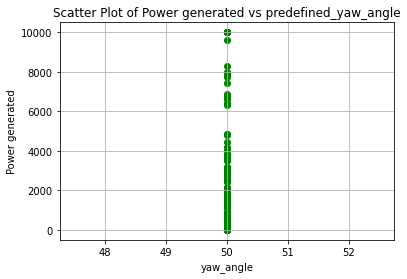

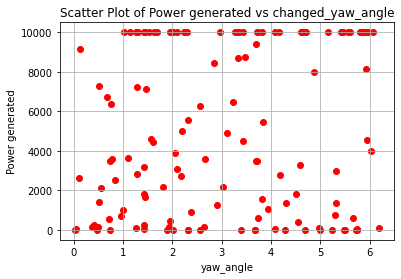

Power_list: [1692.0909458359606, 3912.25335774252]
Predefined Yaw Angle 1: 53.10177695288627
Predefined Yaw Angle 2: 55.12555849446583
Changed Yaw Angle 1: 3.1017769528862704
Changed Yaw Angle 2: 5.125558494465831
farm_power_baseline : [ 3425.85188543 10000.00439969], farm_power_yaw : [7789.03057962 9999.97445523]


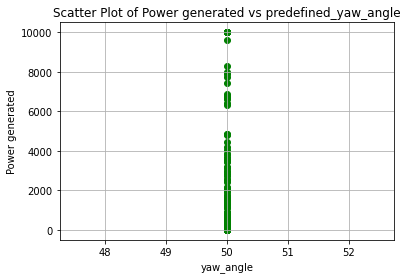

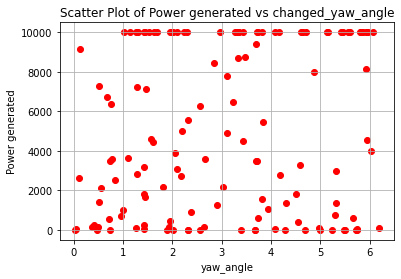

Power_list: [10000.004399685082, 9999.974455227148]
Predefined Yaw Angle 1: 55.27895055881018
Predefined Yaw Angle 2: 49.90726994063994
Changed Yaw Angle 1: 5.278950558810181
Changed Yaw Angle 2: -0.09273005936005942
Predefined Yaw Angle 1: 53.93163286225707
Predefined Yaw Angle 2: 55.56966563995079
Changed Yaw Angle 1: 3.9316328622570658
Changed Yaw Angle 2: 5.569665639950791
farm_power_baseline : [1063.26576017 3071.55401922], farm_power_yaw : [2052.35693455 5796.15018635]


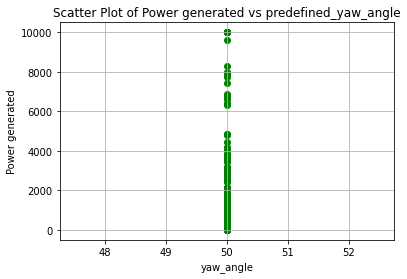

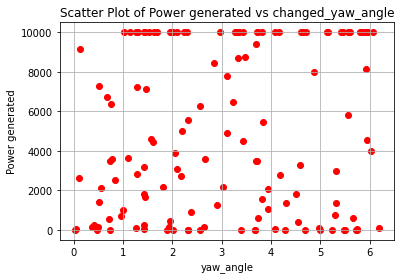

Power_list: [3071.5540192214958, 7877.702789660707]
Predefined Yaw Angle 1: 52.95455288045284
Predefined Yaw Angle 2: 53.315342387776155
Changed Yaw Angle 1: 2.9545528804528374
Changed Yaw Angle 2: 3.3153423877761563
farm_power_baseline : [0. 0.], farm_power_yaw : [ 0.        48.2977843]


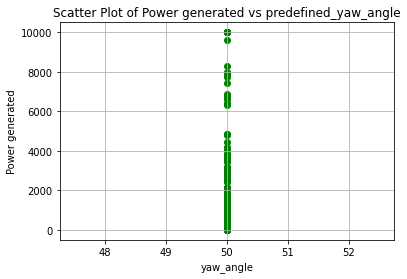

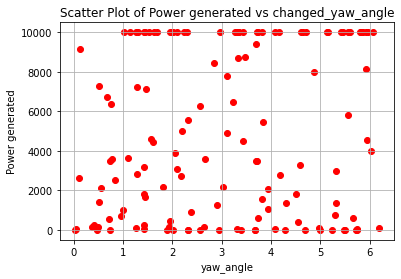

Power_list: [0.0, 48.689229538387856]
Predefined Yaw Angle 1: 51.84216487419663
Predefined Yaw Angle 2: 55.23223833614779
Changed Yaw Angle 1: 1.8421648741966254
Changed Yaw Angle 2: 5.232238336147789
farm_power_baseline : [1528.7060272   337.37956086], farm_power_yaw : [3534.14307508  922.84701386]


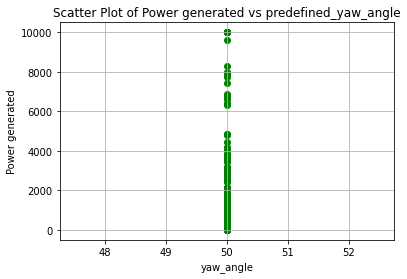

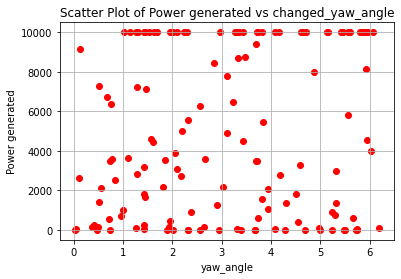

Power_list: [1528.706027200099, 3550.3305804318907]
Predefined Yaw Angle 1: 55.723684612415745
Predefined Yaw Angle 2: 50.19085565063162
Changed Yaw Angle 1: 5.723684612415745
Changed Yaw Angle 2: 0.19085565063161947
farm_power_baseline : [   0.         3091.56102377], farm_power_yaw : [  96.01859825 7031.63503619]


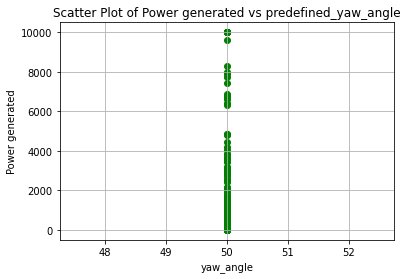

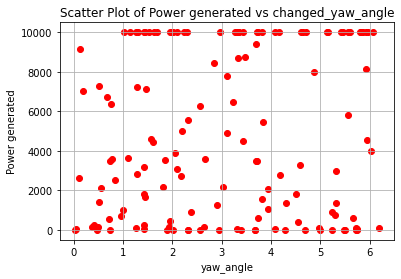

Power_list: [3091.561023771426, 7064.44653422793]
Predefined Yaw Angle 1: 56.009522224846165
Predefined Yaw Angle 2: 49.94120626951568
Changed Yaw Angle 1: 6.009522224846168
Changed Yaw Angle 2: -0.05879373048431595
Predefined Yaw Angle 1: 53.20621920662035
Predefined Yaw Angle 2: 50.91774945791269
Changed Yaw Angle 1: 3.2062192066203443
Changed Yaw Angle 2: 0.9177494579126935
farm_power_baseline : [   0.         9999.99408819], farm_power_yaw : [    0.         10000.00697311]


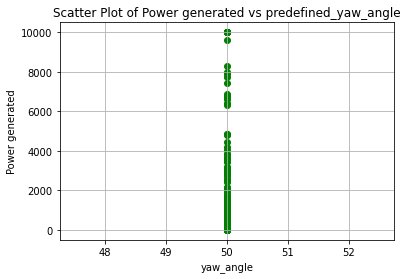

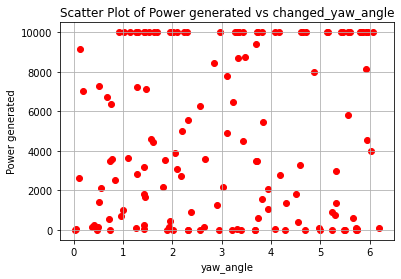

Power_list: [9999.994088191728, 10000.006973113432]
Predefined Yaw Angle 1: 55.47787218064034
Predefined Yaw Angle 2: 56.06468656652367
Changed Yaw Angle 1: 5.477872180640341
Changed Yaw Angle 2: 6.064686566523667
farm_power_baseline : [9609.92011128 8505.00767161], farm_power_yaw : [10000.00142753 10000.0002488 ]


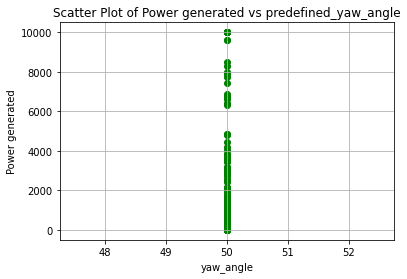

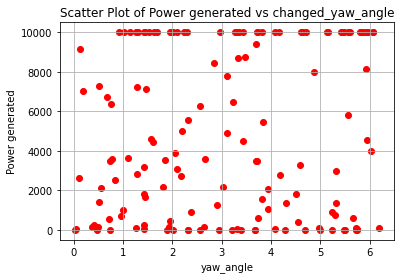

Power_list: [9609.920111278929, 10000.001427525605]
Predefined Yaw Angle 1: 55.19378319978166
Predefined Yaw Angle 2: 50.859413446866725
Changed Yaw Angle 1: 5.193783199781665
Changed Yaw Angle 2: 0.8594134468667257
farm_power_baseline : [ 542.52126654 2384.83390773], farm_power_yaw : [1378.31151446 5451.62016941]


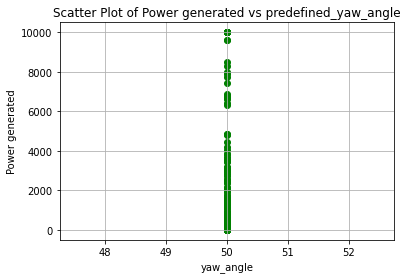

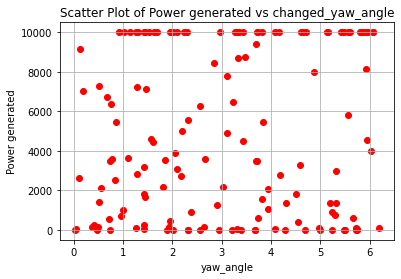

Power_list: [2384.833907725992, 5451.620169414241]
Predefined Yaw Angle 1: 53.227450992094894
Predefined Yaw Angle 2: 54.55175540389401
Changed Yaw Angle 1: 3.2274509920948917
Changed Yaw Angle 2: 4.5517554038940125
farm_power_baseline : [142.48154384 749.53229312], farm_power_yaw : [ 474.80090315 1833.90868028]


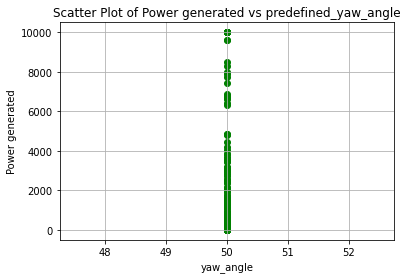

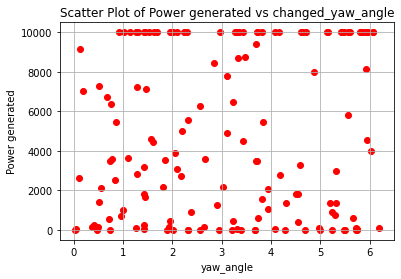

Power_list: [749.5322931154949, 1842.9339148184733]
Predefined Yaw Angle 1: 50.114460089401305
Predefined Yaw Angle 2: 51.72583549011069
Changed Yaw Angle 1: 0.1144600894013042
Changed Yaw Angle 2: 1.7258354901106903
farm_power_baseline : [3855.52406889 8752.43190375], farm_power_yaw : [ 8760.53839894 10000.0040007 ]


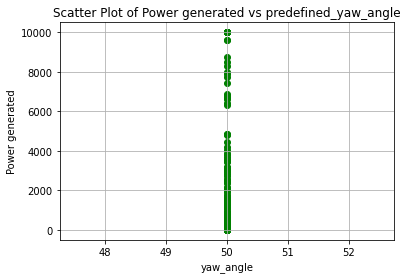

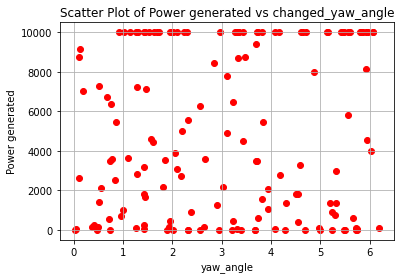

Power_list: [8752.431903752597, 10000.004041713306]
Predefined Yaw Angle 1: 55.21527490977861
Predefined Yaw Angle 2: 54.90024814202629
Changed Yaw Angle 1: 5.215274909778604
Changed Yaw Angle 2: 4.900248142026293
farm_power_baseline : [3637.20438187 5759.42159556], farm_power_yaw : [8230.21455761 9999.99634773]


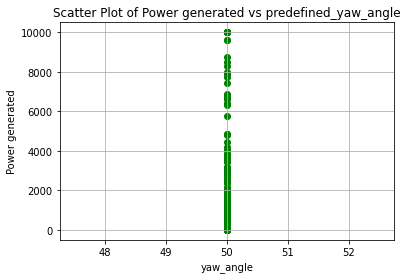

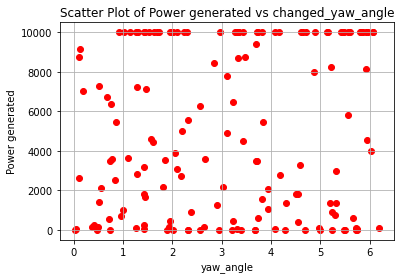

Power_list: [5759.421595555381, 9999.99698564214]
Predefined Yaw Angle 1: 53.4136909071302
Predefined Yaw Angle 2: 55.8802898252788
Changed Yaw Angle 1: 3.413690907130204
Changed Yaw Angle 2: 5.880289825278799
farm_power_baseline : [1520.88533436 6113.66508396], farm_power_yaw : [ 3508.72308241 10000.00155395]


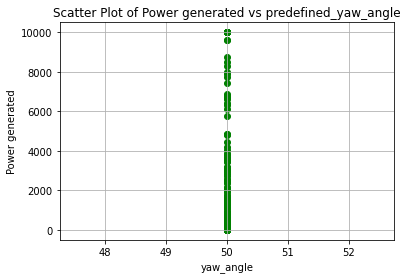

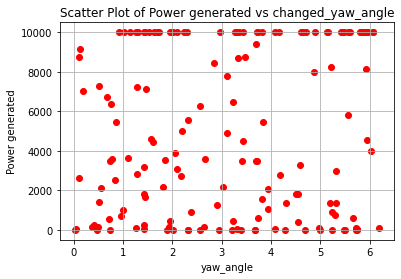

Power_list: [6113.665083955488, 10000.002141202007]
Predefined Yaw Angle 1: 55.259033309649695
Predefined Yaw Angle 2: 51.860632453949485
Changed Yaw Angle 1: 5.259033309649697
Changed Yaw Angle 2: 1.8606324539494867
farm_power_baseline : [7942.9475047   406.54560628], farm_power_yaw : [9999.99493547 1062.10979765]


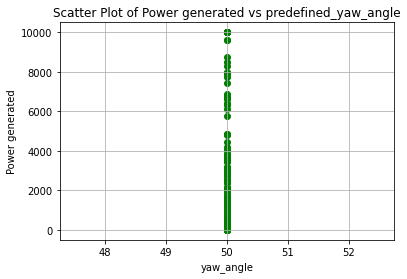

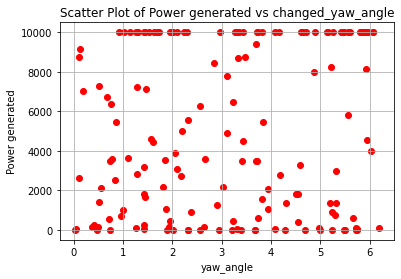

Power_list: [7942.947504698376, 9999.994935468607]
Predefined Yaw Angle 1: 50.14783166167838
Predefined Yaw Angle 2: 51.71454914656899
Changed Yaw Angle 1: 0.14783166167838274
Changed Yaw Angle 2: 1.7145491465689888
farm_power_baseline : [  133.5686106  10000.00565728], farm_power_yaw : [ 457.36096044 9999.99943504]


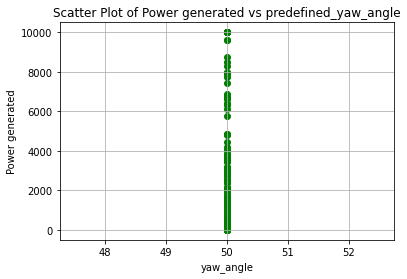

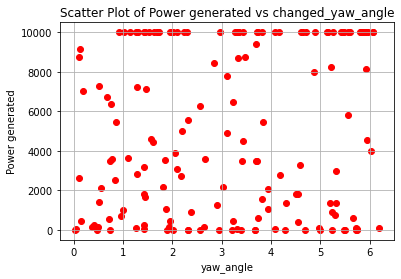

Power_list: [10000.00565728128, 9999.999435038384]
Predefined Yaw Angle 1: 51.4781139489761
Predefined Yaw Angle 2: 54.871443391675996
Changed Yaw Angle 1: 1.4781139489761017
Changed Yaw Angle 2: 4.871443391675997
farm_power_baseline : [265.94649603 394.83867123], farm_power_yaw : [ 748.20329355 1039.68078322]


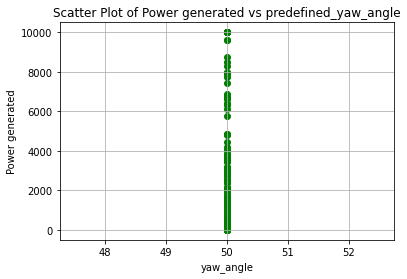

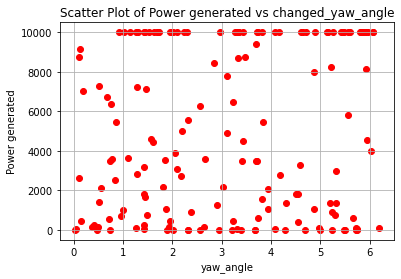

Power_list: [394.8386712251339, 1043.632140258707]
Predefined Yaw Angle 1: 54.84491868436121
Predefined Yaw Angle 2: 52.25962831372959
Changed Yaw Angle 1: 4.844918684361209
Changed Yaw Angle 2: 2.2596283137295945
farm_power_baseline : [ 7533.6092405  10000.00223509], farm_power_yaw : [ 9999.99970476 10000.01397623]


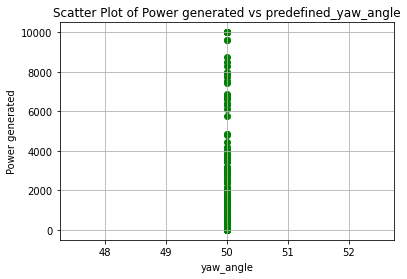

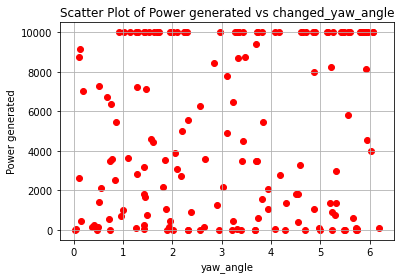

Power_list: [10000.002235090105, 10000.013976226503]
Predefined Yaw Angle 1: 52.24811398126682
Predefined Yaw Angle 2: 55.814672199180336
Changed Yaw Angle 1: 2.248113981266821
Changed Yaw Angle 2: 5.814672199180337
farm_power_baseline : [5117.43981407  661.46074089], farm_power_yaw : [9999.99688698 1634.21937511]


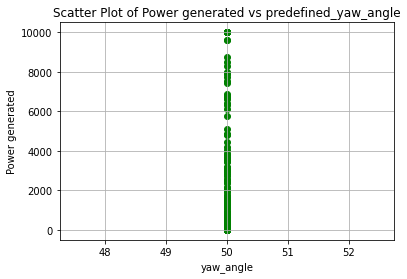

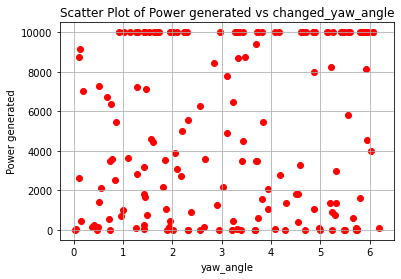

Power_list: [5117.43981406898, 9999.996886984352]
Predefined Yaw Angle 1: 53.053058415484905
Predefined Yaw Angle 2: 50.1450182374108
Changed Yaw Angle 1: 3.053058415484906
Changed Yaw Angle 2: 0.14501823741080033
farm_power_baseline : [ 671.73956542 6406.09067496], farm_power_yaw : [ 1664.29296082 10000.00606562]


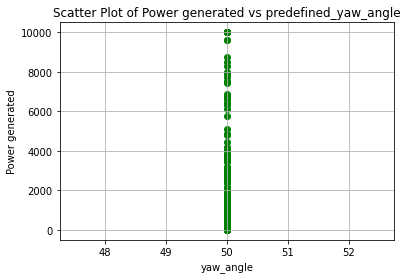

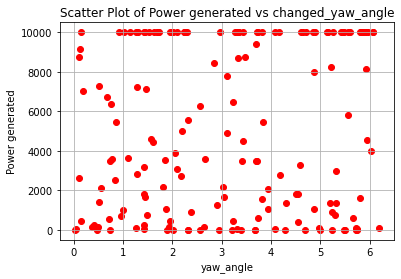

Power_list: [6406.090674964031, 10000.006065616184]
Predefined Yaw Angle 1: 56.111085601441864
Predefined Yaw Angle 2: 53.308494335349124
Changed Yaw Angle 1: 6.111085601441866
Changed Yaw Angle 2: 3.3084943353491267
farm_power_baseline : [  0.        602.5713324], farm_power_yaw : [  17.62953978 1500.97390538]


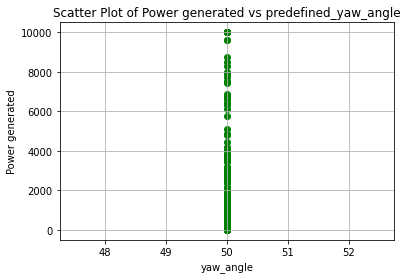

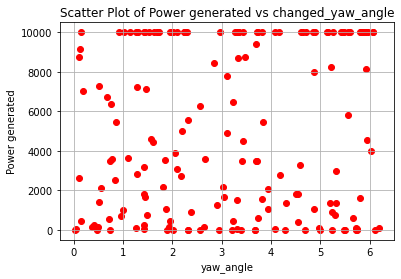

Power_list: [602.5713324009971, 1512.405443751526]
Predefined Yaw Angle 1: 56.148142422745885
Predefined Yaw Angle 2: 52.15795148647146
Changed Yaw Angle 1: 6.148142422745883
Changed Yaw Angle 2: 2.1579514864714593
farm_power_baseline : [ 509.02133233 1561.01536304], farm_power_yaw : [1299.80418091 3599.41947729]


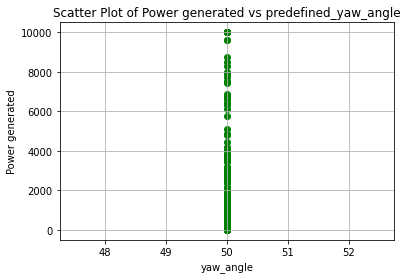

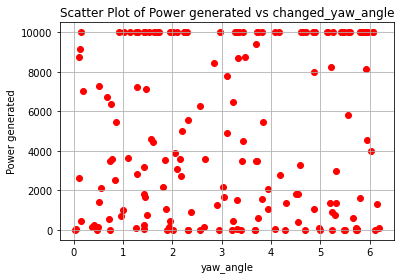

Power_list: [1561.015363035673, 3621.900739148524]
Predefined Yaw Angle 1: 54.81516265286953
Predefined Yaw Angle 2: 52.30491377016974
Changed Yaw Angle 1: 4.815162652869535
Changed Yaw Angle 2: 2.3049137701697378
farm_power_baseline : [5980.04180756    0.        ], farm_power_yaw : [9999.99983714   88.79713249]


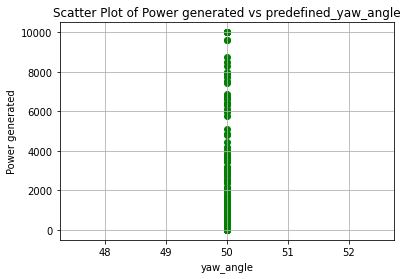

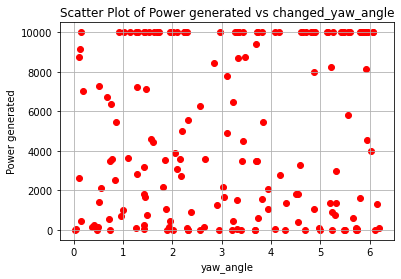

Power_list: [5980.041807561085, 10000.00019648651]
Predefined Yaw Angle 1: 54.75835955734702
Predefined Yaw Angle 2: 54.404696713764274
Changed Yaw Angle 1: 4.758359557347018
Changed Yaw Angle 2: 4.404696713764272
farm_power_baseline : [9999.99630709    0.        ], farm_power_yaw : [9999.98681697   54.68462576]


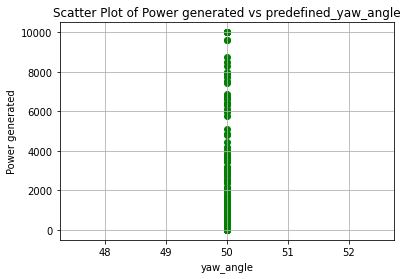

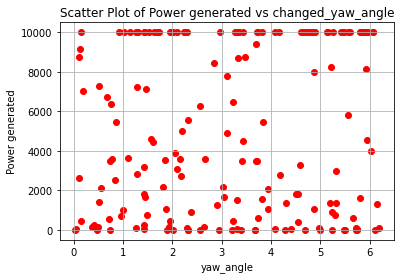

Power_list: [9999.99630709006, 9999.989425965889]
Predefined Yaw Angle 1: 50.25178056482052
Predefined Yaw Angle 2: 50.145011679376616
Changed Yaw Angle 1: 0.2517805648205191
Changed Yaw Angle 2: 0.14501167937661602
farm_power_baseline : [1100.91597366 5579.88341144], farm_power_yaw : [2621.9743409  9999.99590172]


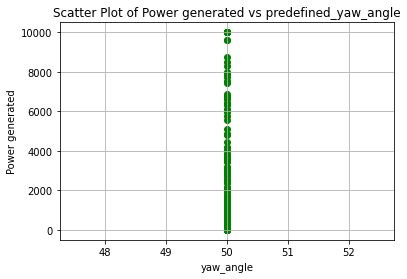

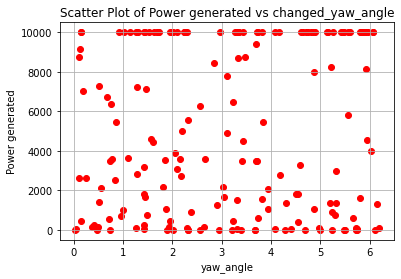

Power_list: [5579.883411441552, 9999.995901722541]
Predefined Yaw Angle 1: 52.216882558531246
Predefined Yaw Angle 2: 50.41683994927452
Changed Yaw Angle 1: 2.2168825585312435
Changed Yaw Angle 2: 0.4168399492745154
farm_power_baseline : [  300.01755668 10000.00513829], farm_power_yaw : [ 831.68605839 9999.99082406]


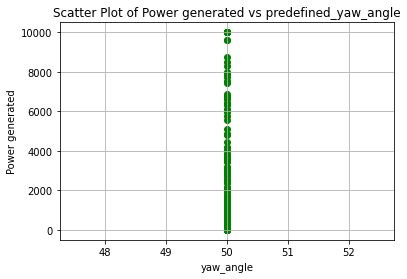

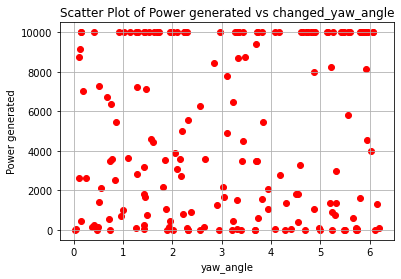

Power_list: [10000.005138287364, 9999.990824064658]
Predefined Yaw Angle 1: 52.158011385264224
Predefined Yaw Angle 2: 55.99423849884002
Changed Yaw Angle 1: 2.1580113852642246
Changed Yaw Angle 2: 5.994238498840019
farm_power_baseline : [   0.         6570.40781638], farm_power_yaw : [    0.         10000.00570835]


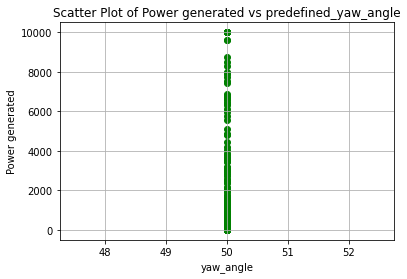

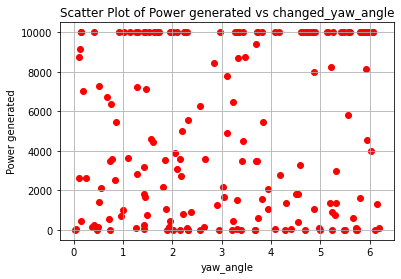

Power_list: [6570.407816380927, 10000.005708354125]
Predefined Yaw Angle 1: 51.64463288982327
Predefined Yaw Angle 2: 53.8431939653192
Changed Yaw Angle 1: 1.6446328898232683
Changed Yaw Angle 2: 3.8431939653192027
farm_power_baseline : [8016.53052882 6082.68760702], farm_power_yaw : [ 9999.99522432 10000.00146878]


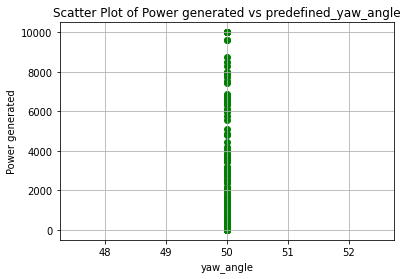

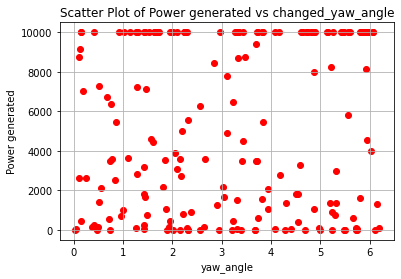

Power_list: [8016.5305288160835, 10000.001468775325]
Predefined Yaw Angle 1: 53.973941969862935
Predefined Yaw Angle 2: 56.09245108615218
Changed Yaw Angle 1: 3.9739419698629366
Changed Yaw Angle 2: 6.092451086152179
farm_power_baseline : [1403.87867145 1666.89434867], farm_power_yaw : [2549.04679377 3008.64692611]


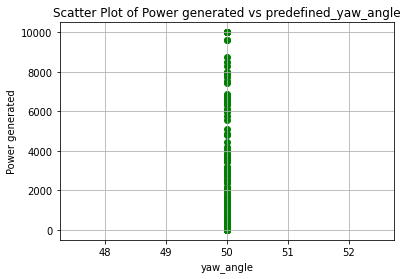

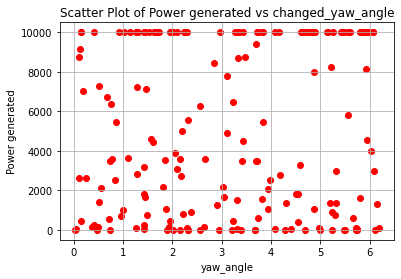

Power_list: [1666.8943486679914, 4066.8800841655543]
Predefined Yaw Angle 1: 50.4059113790935
Predefined Yaw Angle 2: 55.32763756008439
Changed Yaw Angle 1: 0.4059113790935049
Changed Yaw Angle 2: 5.32763756008439
farm_power_baseline : [1226.63787827    0.        ], farm_power_yaw : [2870.75529901    0.        ]


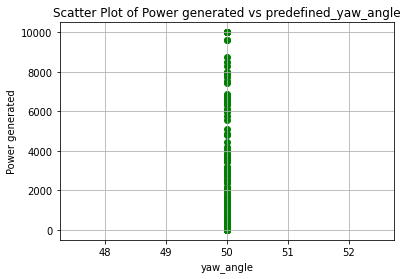

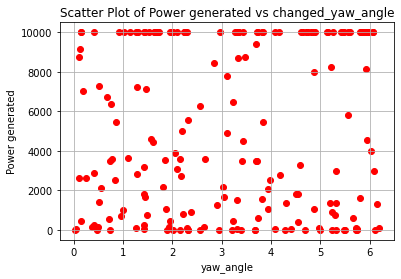

Power_list: [1226.6378782705146, 2883.095808705811]
Predefined Yaw Angle 1: 50.12207118741491
Predefined Yaw Angle 2: 53.64009730584812
Changed Yaw Angle 1: 0.12207118741491209
Changed Yaw Angle 2: 3.640097305848125
farm_power_baseline : [2.33841645e+00 9.99999680e+03], farm_power_yaw : [ 146.82394284 9999.98090868]


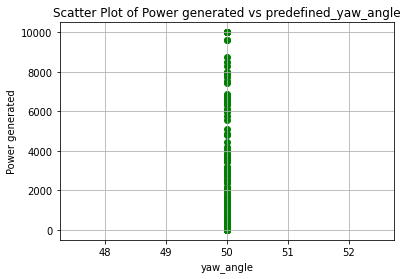

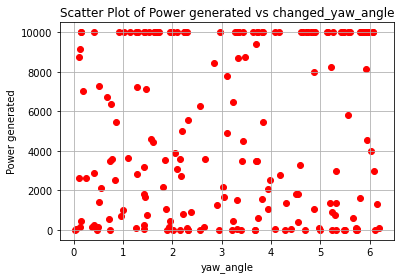

Power_list: [9999.996797101488, 9999.980908678815]
Predefined Yaw Angle 1: 51.77791744447901
Predefined Yaw Angle 2: 50.162299306632
Changed Yaw Angle 1: 1.777917444479009
Changed Yaw Angle 2: 0.16229930663199957
farm_power_baseline : [10000.00279045   157.50676095], farm_power_yaw : [9999.96106351  510.28734964]


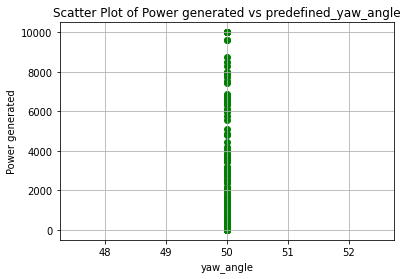

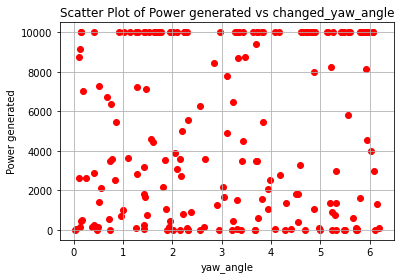

Power_list: [10000.002790454197, 9999.961063514142]
Predefined Yaw Angle 1: 54.28592410103077
Predefined Yaw Angle 2: 54.943976714493175
Changed Yaw Angle 1: 4.285924101030776
Changed Yaw Angle 2: 4.943976714493177
farm_power_baseline : [2315.81625981   22.75330957], farm_power_yaw : [5293.31453819  188.1372396 ]


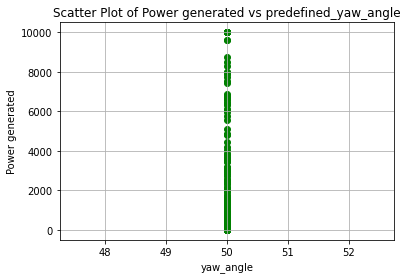

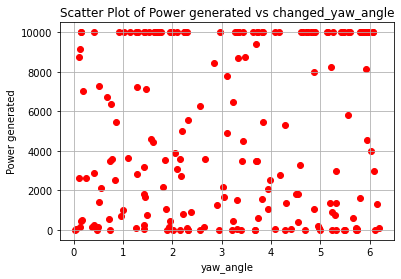

Power_list: [2315.8162598122503, 5325.726963129019]
Predefined Yaw Angle 1: 56.22835097582467
Predefined Yaw Angle 2: 50.64363594612816
Changed Yaw Angle 1: 6.228350975824671
Changed Yaw Angle 2: 0.6436359461281539
farm_power_baseline : [3855.1730127  4960.75140616], farm_power_yaw : [8717.19367052 9999.995537  ]


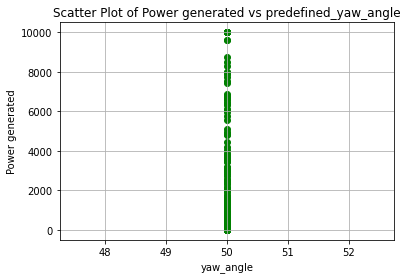

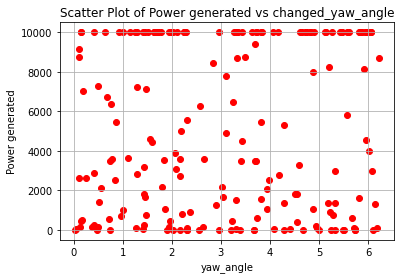

Power_list: [4960.751406157163, 9999.995537000887]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 49.89033772887679
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: -0.1096622711232151
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 49.89058846133223
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: -0.10941153866777334
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 49.89033772887679
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: -0.1096622711232151
Predefined Yaw Angle 1: 56.22835097582467
Predefined Yaw Angle 2: 56.164934874173085
Changed Yaw Angle 1: 6.228350975824671
Changed Yaw Angle 2: 6.164934874173084
farm_power_baseline : [10000.00536186   416.46468967], farm_power_yaw : [10000.0119016   1075.98834212]


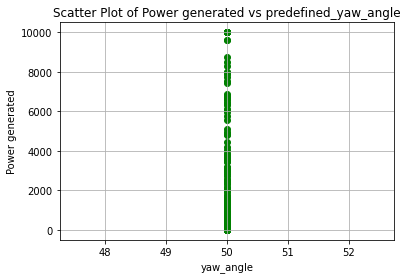

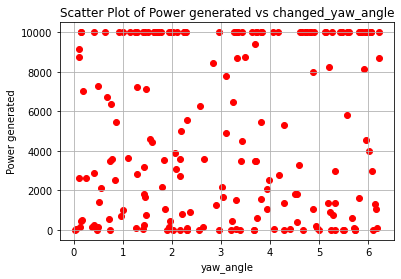

Power_list: [10000.005361863712, 10000.011901603411]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [3507.19886104 3685.7638861 ], farm_power_yaw : [7918.89350605 8305.80045327]


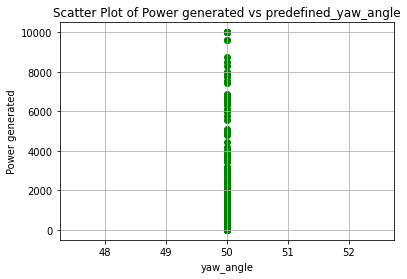

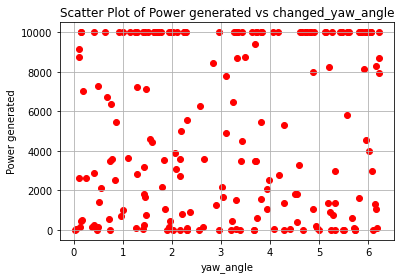

Power_list: [3685.763886095233, 8394.871486354237]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [3146.11604728    0.        ], farm_power_yaw : [7110.47398166    0.        ]


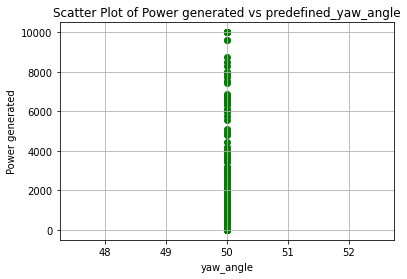

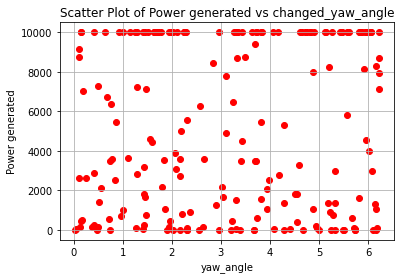

Power_list: [3146.116047278835, 7187.867175074183]
Predefined Yaw Angle 1: 56.228350443192454
Predefined Yaw Angle 2: 56.16495191840406
Changed Yaw Angle 1: 6.228350443192453
Changed Yaw Angle 2: 6.164951918404061
farm_power_baseline : [3494.43826273 2215.74301132], farm_power_yaw : [7891.36484691 5034.73413857]


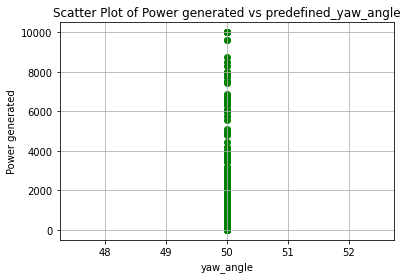

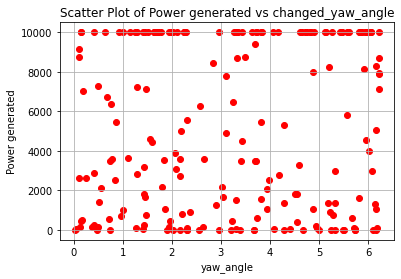

Power_list: [3494.438262730558, 7978.788156476936]
Predefined Yaw Angle 1: 52.917558377118326
Predefined Yaw Angle 2: 49.90190156964288
Changed Yaw Angle 1: 2.9175583771183287
Changed Yaw Angle 2: -0.09809843035711673
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [5387.04714119 1787.66246342], farm_power_yaw : [9999.99640541 4081.39345381]


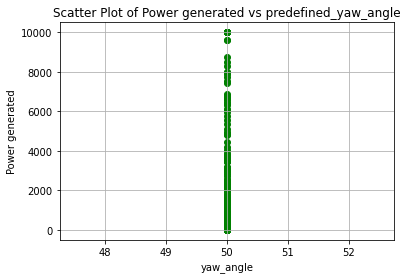

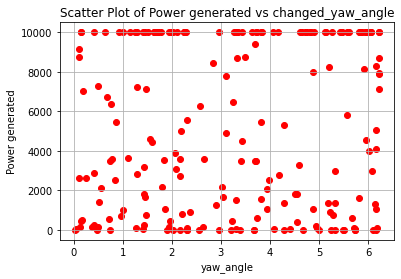

Power_list: [5387.047141193994, 9999.996405409162]
Predefined Yaw Angle 1: 54.74955621204765
Predefined Yaw Angle 2: 49.89035289641143
Changed Yaw Angle 1: 4.7495562120476515
Changed Yaw Angle 2: -0.10964710358856924
Predefined Yaw Angle 1: 56.22376820822086
Predefined Yaw Angle 2: 55.957793671954505
Changed Yaw Angle 1: 6.2237682082208625
Changed Yaw Angle 2: 5.957793671954503
farm_power_baseline : [1003.2308368  7440.82405479], farm_power_yaw : [ 2374.4619464  10000.00143023]


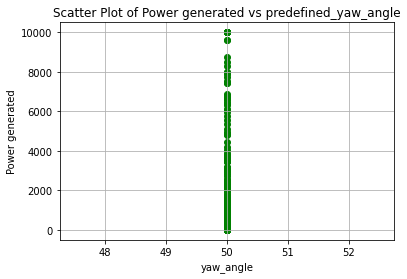

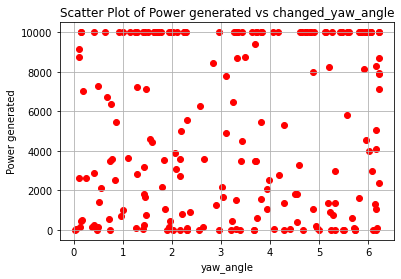

Power_list: [7440.824054792052, 10000.001430232922]
Predefined Yaw Angle 1: 56.22372879343673
Predefined Yaw Angle 2: 55.05479031481916
Changed Yaw Angle 1: 6.223728793436729
Changed Yaw Angle 2: 5.054790314819155
farm_power_baseline : [7612.66690517 9999.99168656], farm_power_yaw : [ 9999.99918034 10000.01572348]


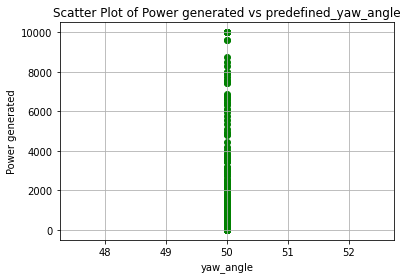

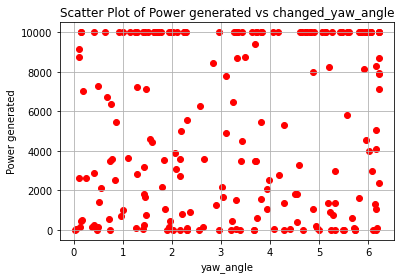

Power_list: [9999.99168656401, 10000.017378808801]
Predefined Yaw Angle 1: 56.22687505194855
Predefined Yaw Angle 2: 55.97843583356371
Changed Yaw Angle 1: 6.226875051948549
Changed Yaw Angle 2: 5.978435833563707
farm_power_baseline : [ 645.76897117 9999.99051185], farm_power_yaw : [ 1590.70566328 10000.01276723]


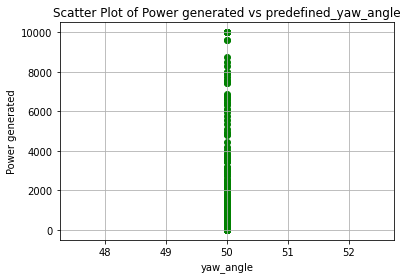

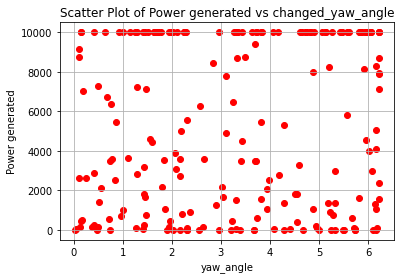

Power_list: [9999.99051184697, 10000.014676388575]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.17352303605637
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.1735230360563715
farm_power_baseline : [2457.19509523 1254.67845386], farm_power_yaw : [5567.65926432 2913.51480533]


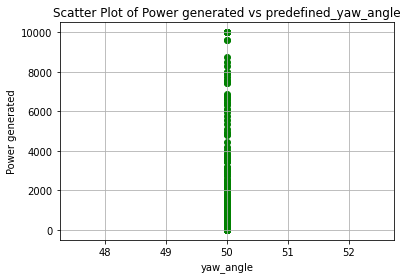

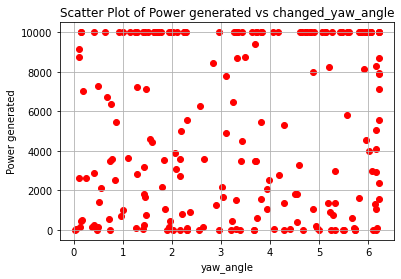

Power_list: [2457.195095227156, 5626.991172009934]
Predefined Yaw Angle 1: 49.948532499313
Predefined Yaw Angle 2: 55.41796506004104
Changed Yaw Angle 1: -0.051467500686999415
Changed Yaw Angle 2: 5.417965060041043
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 56.12123346594932
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 6.12123346594932
farm_power_baseline : [  64.10510465 9999.98738358], farm_power_yaw : [  298.46377835 10000.00555215]


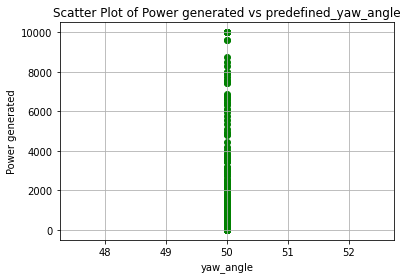

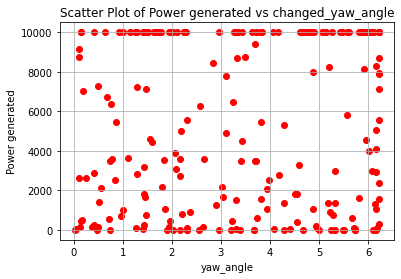

Power_list: [9999.98738358407, 10000.007479863221]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 54.66564069422129
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 4.665640694221289
Predefined Yaw Angle 1: 56.18018930540724
Predefined Yaw Angle 2: 55.900632647581475
Changed Yaw Angle 1: 6.180189305407242
Changed Yaw Angle 2: 5.900632647581478
farm_power_baseline : [ 435.60768192 1092.84910265], farm_power_yaw : [1121.60580106 2578.80921471]


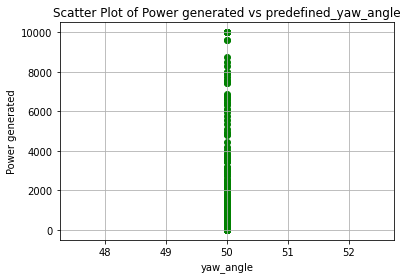

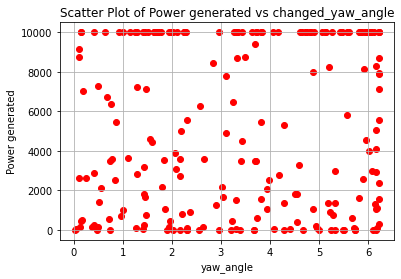

Power_list: [1092.8491026527877, 2605.7610494289847]
Predefined Yaw Angle 1: 55.52474381582574
Predefined Yaw Angle 2: 55.42983263849065
Changed Yaw Angle 1: 5.524743815825736
Changed Yaw Angle 2: 5.429832638490654
farm_power_baseline : [9999.99283706  598.46816582], farm_power_yaw : [10000.01733984  1489.08167825]


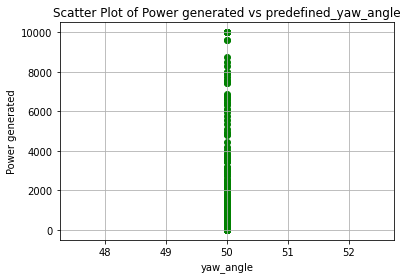

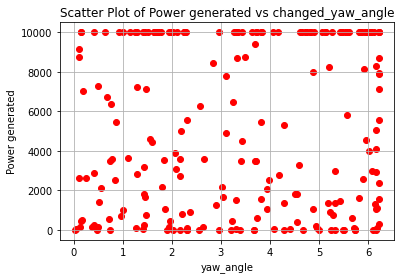

Power_list: [9999.992837056514, 10000.017339839715]
Predefined Yaw Angle 1: 56.22832594211042
Predefined Yaw Angle 2: 50.34573847501741
Changed Yaw Angle 1: 6.228325942110424
Changed Yaw Angle 2: 0.3457384750174164
farm_power_baseline : [9999.99690108  295.47633916], farm_power_yaw : [10000.01462827   815.34942304]


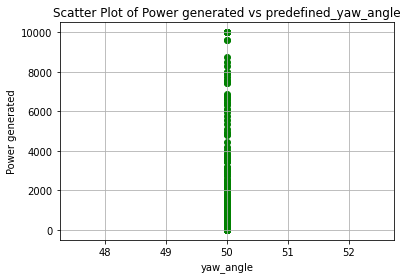

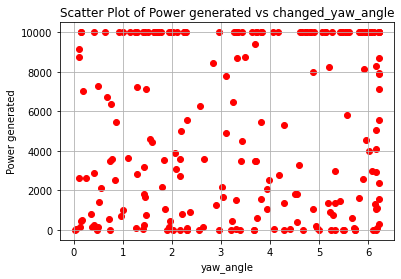

Power_list: [9999.996901081786, 10000.014628266377]
Predefined Yaw Angle 1: 49.94651334466996
Predefined Yaw Angle 2: 50.13163878241035
Changed Yaw Angle 1: -0.05348665533003785
Changed Yaw Angle 2: 0.13163878241035126
Predefined Yaw Angle 1: 56.22432800468199
Predefined Yaw Angle 2: 52.28944666319077
Changed Yaw Angle 1: 6.224328004681997
Changed Yaw Angle 2: 2.2894466631907755
farm_power_baseline : [8953.31799946  498.86884392], farm_power_yaw : [10000.00403444  1275.65004017]


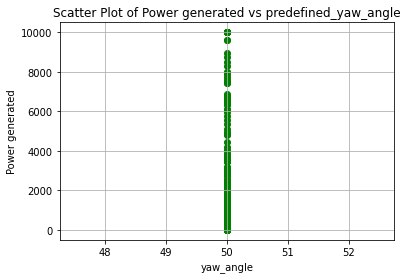

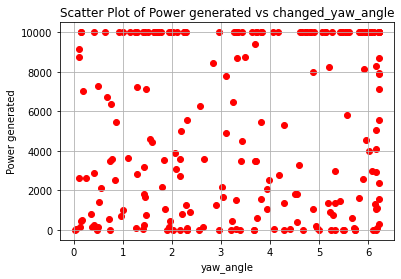

Power_list: [8953.317999460103, 10000.004034439267]
Predefined Yaw Angle 1: 49.94521006021151
Predefined Yaw Angle 2: 49.925064829342766
Changed Yaw Angle 1: -0.05478993978849538
Changed Yaw Angle 2: -0.07493517065723224
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 49.896377403722056
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: -0.10362259627794367
Predefined Yaw Angle 1: 55.259243699375816
Predefined Yaw Angle 2: 55.771232846007834
Changed Yaw Angle 1: 5.259243699375813
Changed Yaw Angle 2: 5.771232846007836
farm_power_baseline : [767.46641072 273.66155333], farm_power_yaw : [1871.04528582  760.25319104]


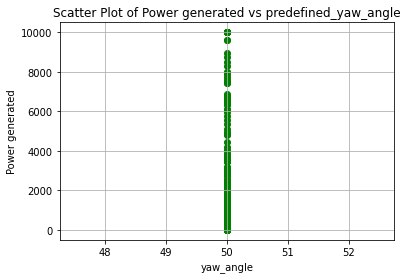

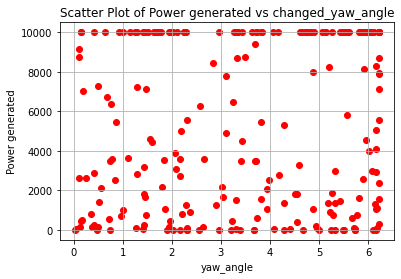

Power_list: [767.4664107167087, 1888.8523783940875]
Predefined Yaw Angle 1: 49.945170362466506
Predefined Yaw Angle 2: 54.37102903126349
Changed Yaw Angle 1: -0.054829637533494374
Changed Yaw Angle 2: 4.3710290312634905
Predefined Yaw Angle 1: 56.22835097582467
Predefined Yaw Angle 2: 54.77182625320493
Changed Yaw Angle 1: 6.228350975824671
Changed Yaw Angle 2: 4.771826253204928
farm_power_baseline : [ 412.93981178 1555.58589973], farm_power_yaw : [1070.530263   3577.31081287]


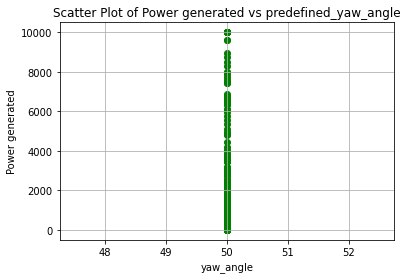

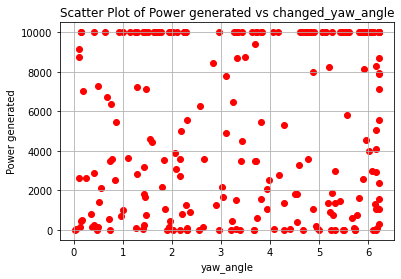

Power_list: [1555.5858997318749, 3609.8736410869446]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 55.64824487107467
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 5.648244871074668
Predefined Yaw Angle 1: 56.228239123058884
Predefined Yaw Angle 2: 55.63574612344671
Changed Yaw Angle 1: 6.228239123058888
Changed Yaw Angle 2: 5.635746123446709
farm_power_baseline : [9999.9958056  4812.87877671], farm_power_yaw : [10000.00541403  9999.99282268]


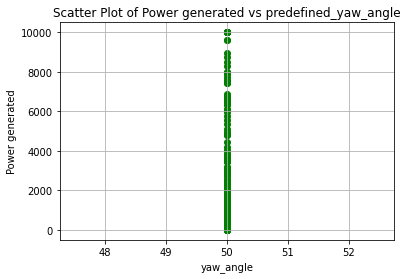

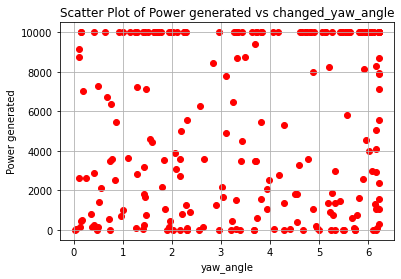

Power_list: [9999.995805597338, 10000.009861172355]
Predefined Yaw Angle 1: 56.22546837026077
Predefined Yaw Angle 2: 55.35864474465618
Changed Yaw Angle 1: 6.225468370260769
Changed Yaw Angle 2: 5.358644744656182
farm_power_baseline : [  0.         974.80205194], farm_power_yaw : [  61.9753049  2309.24689461]


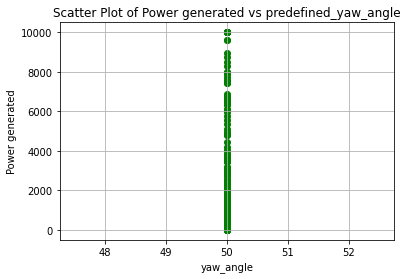

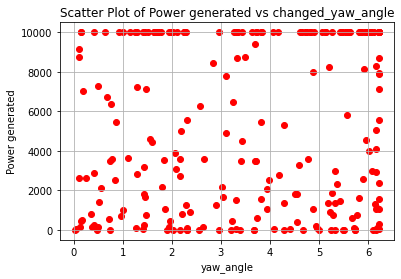

Power_list: [974.8020519430294, 2333.2757865966646]
Predefined Yaw Angle 1: 50.14416299082923
Predefined Yaw Angle 2: 55.215393842253036
Changed Yaw Angle 1: 0.14416299082923045
Changed Yaw Angle 2: 5.215393842253038
farm_power_baseline : [   0.         9999.99823031], farm_power_yaw : [6.38363904e+00 1.00000145e+04]


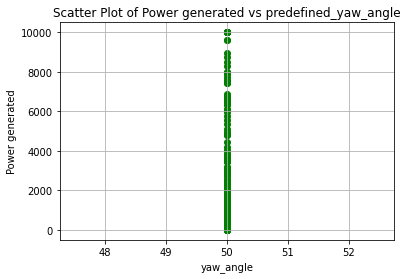

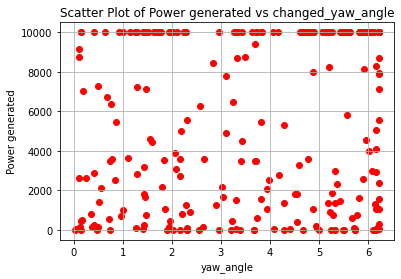

Power_list: [9999.998230309411, 10000.014452200283]
Predefined Yaw Angle 1: 49.94523271788672
Predefined Yaw Angle 2: 55.74665027124975
Changed Yaw Angle 1: -0.05476728211328369
Changed Yaw Angle 2: 5.7466502712497505
Predefined Yaw Angle 1: 56.226296613359786
Predefined Yaw Angle 2: 55.144837117596914
Changed Yaw Angle 1: 6.226296613359784
Changed Yaw Angle 2: 5.144837117596914
farm_power_baseline : [3465.45945682 5146.05481696], farm_power_yaw : [7841.70325324 9999.9968693 ]


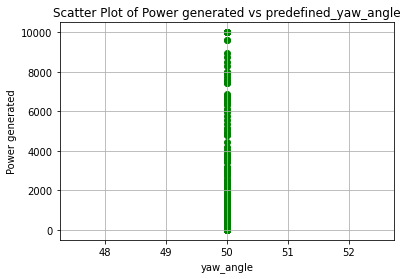

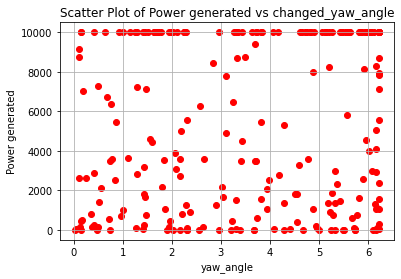

Power_list: [5146.054816961635, 9999.99686929772]
Predefined Yaw Angle 1: 51.48539156928696
Predefined Yaw Angle 2: 54.25038969809567
Changed Yaw Angle 1: 1.4853915692869613
Changed Yaw Angle 2: 4.250389698095664
farm_power_baseline : [ 888.2599885  9999.99995324], farm_power_yaw : [ 2139.73980695 10000.01423608]


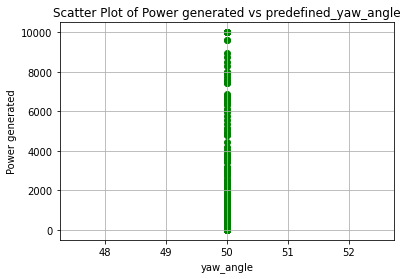

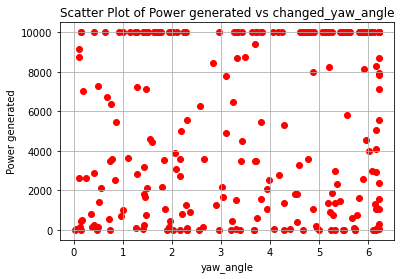

Power_list: [9999.99995323587, 10000.014236076884]
Predefined Yaw Angle 1: 49.9452417060554
Predefined Yaw Angle 2: 51.05882828613077
Changed Yaw Angle 1: -0.05475829394460467
Changed Yaw Angle 2: 1.058828286130769
Predefined Yaw Angle 1: 50.53352333404835
Predefined Yaw Angle 2: 50.47817740944803
Changed Yaw Angle 1: 0.5335233340483495
Changed Yaw Angle 2: 0.47817740944802967
farm_power_baseline : [ 467.59421379 7858.75099924], farm_power_yaw : [1210.38644985 9999.99549677]


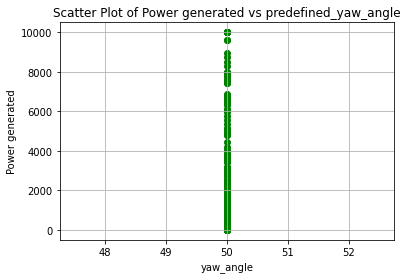

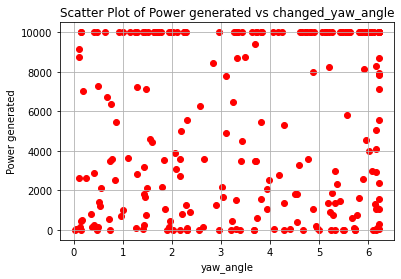

Power_list: [7858.750999240617, 9999.995496774309]
Predefined Yaw Angle 1: 49.94517111148056
Predefined Yaw Angle 2: 50.08791322264445
Changed Yaw Angle 1: -0.05482888851943779
Changed Yaw Angle 2: 0.08791322264445134
Predefined Yaw Angle 1: 49.94517054972002
Predefined Yaw Angle 2: 50.04786269202481
Changed Yaw Angle 1: -0.05482945027998023
Changed Yaw Angle 2: 0.04786269202480626
Predefined Yaw Angle 1: 49.945170362466506
Predefined Yaw Angle 2: 55.091009305644235
Changed Yaw Angle 1: -0.054829637533494374
Changed Yaw Angle 2: 5.091009305644233
Predefined Yaw Angle 1: 55.93513108085255
Predefined Yaw Angle 2: 50.208955192479586
Changed Yaw Angle 1: 5.935131080852549
Changed Yaw Angle 2: 0.20895519247958413
farm_power_baseline : [2423.04153666    0.        ], farm_power_yaw : [5527.12581515    0.        ]


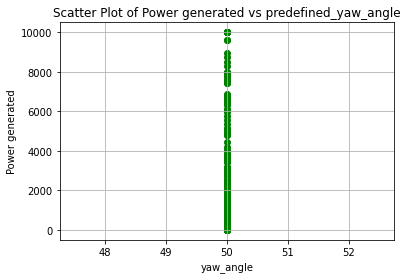

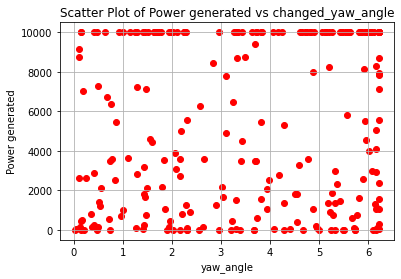

Power_list: [2423.041536661284, 5554.213342346677]
Predefined Yaw Angle 1: 54.38709040030794
Predefined Yaw Angle 2: 55.62636327429414
Changed Yaw Angle 1: 4.387090400307943
Changed Yaw Angle 2: 5.626363274294142
farm_power_baseline : [    0.         10000.00543752], farm_power_yaw : [   0.         9999.99764362]


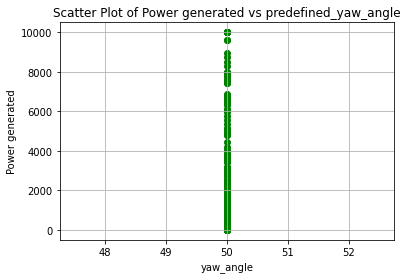

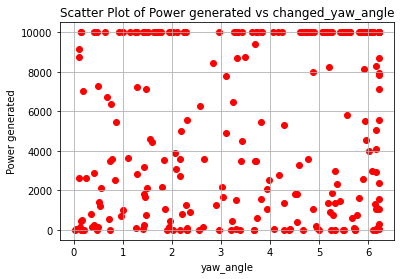

Power_list: [10000.005437516507, 9999.997643620747]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 54.587103008410416
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 4.587103008410416
farm_power_baseline : [ 4560.25794377 10000.00001872], farm_power_yaw : [ 9999.98861141 10000.01428784]


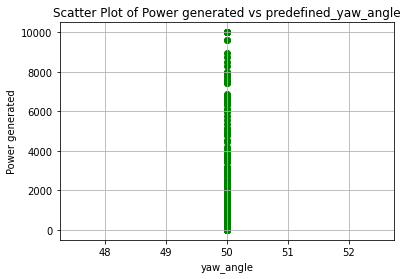

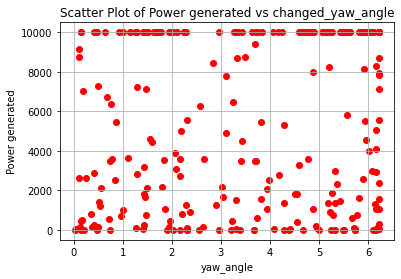

Power_list: [10000.000018722587, 10000.014287844162]
Predefined Yaw Angle 1: 49.945178039860586
Predefined Yaw Angle 2: 52.6794109447661
Changed Yaw Angle 1: -0.05482196013941438
Changed Yaw Angle 2: 2.679410944766097
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 55.3078619910939
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 5.307861991093898
Predefined Yaw Angle 1: 50.00532817543517
Predefined Yaw Angle 2: 55.35834540534966
Changed Yaw Angle 1: 0.005328175435169277
Changed Yaw Angle 2: 5.358345405349658
farm_power_baseline : [ 973.95078466 1020.51175253], farm_power_yaw : [2321.02140374 2432.01557768]


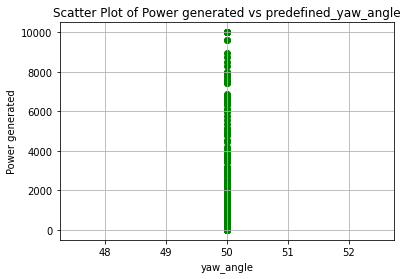

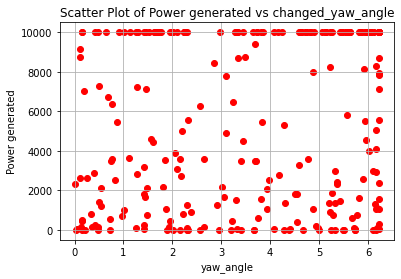

Power_list: [1020.5117525258812, 2442.390195385064]
Predefined Yaw Angle 1: 51.415872944823754
Predefined Yaw Angle 2: 54.9434984107614
Changed Yaw Angle 1: 1.4158729448237508
Changed Yaw Angle 2: 4.943498410761398
farm_power_baseline : [1355.38310976  421.88677095], farm_power_yaw : [3164.67533157 1097.96539905]


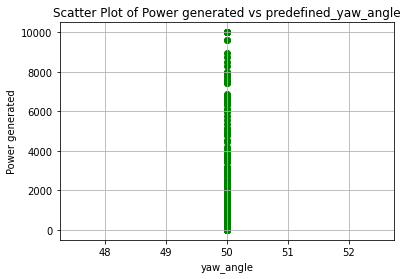

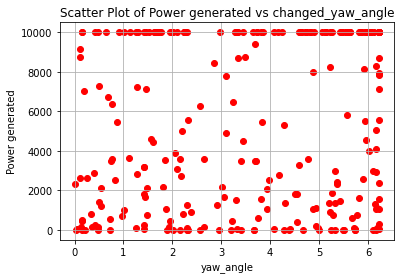

Power_list: [1355.3831097575285, 3176.475719990845]
Predefined Yaw Angle 1: 56.22834351897362
Predefined Yaw Angle 2: 54.33496210693666
Changed Yaw Angle 1: 6.2283435189736185
Changed Yaw Angle 2: 4.334962106936657
farm_power_baseline : [  421.31326947 10000.00508366], farm_power_yaw : [ 1090.89507171 10000.01199333]


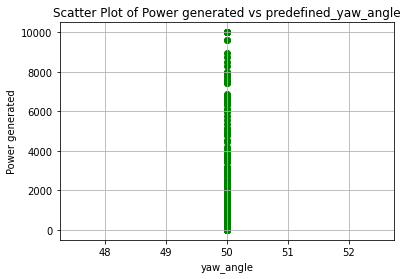

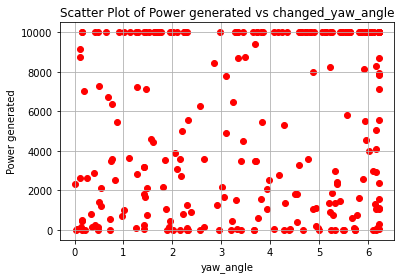

Power_list: [10000.00508365746, 10000.011993331]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 54.85802798400083
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 4.858027984000831
Predefined Yaw Angle 1: 49.94912122436148
Predefined Yaw Angle 2: 55.208352976963084
Changed Yaw Angle 1: -0.05087877563852378
Changed Yaw Angle 2: 5.208352976963087
Predefined Yaw Angle 1: 52.67764298294469
Predefined Yaw Angle 2: 50.687572178581036
Changed Yaw Angle 1: 2.677642982944687
Changed Yaw Angle 2: 0.6875721785810359
farm_power_baseline : [ 590.14087684 4091.87411949], farm_power_yaw : [1482.90057697 9297.86195395]


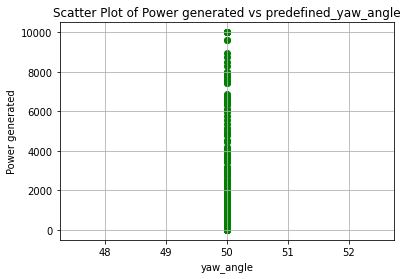

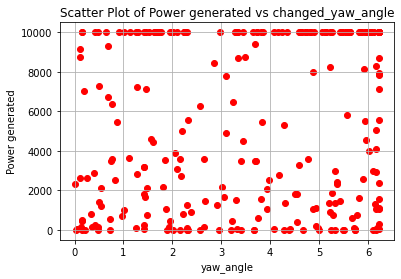

Power_list: [4091.8741194872478, 9297.861953951244]
Predefined Yaw Angle 1: 56.228000503825214
Predefined Yaw Angle 2: 50.7775703786689
Changed Yaw Angle 1: 6.228000503825217
Changed Yaw Angle 2: 0.7775703786689011
farm_power_baseline : [    0.         10000.00498256], farm_power_yaw : [   0.         9999.98909196]


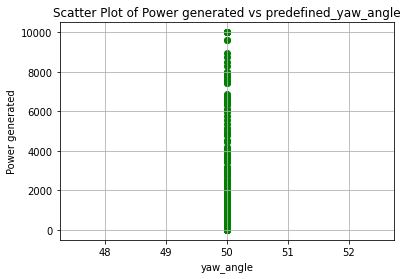

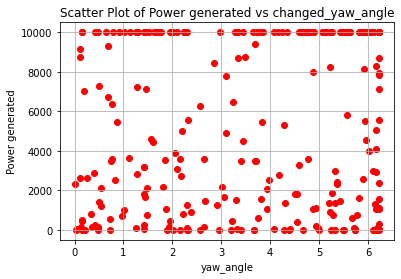

Power_list: [10000.004982556831, 9999.998763091267]
Predefined Yaw Angle 1: 56.228353106353545
Predefined Yaw Angle 2: 55.06867869990392
Changed Yaw Angle 1: 6.228353106353543
Changed Yaw Angle 2: 5.068678699903919
farm_power_baseline : [  0.         462.48286311], farm_power_yaw : [   0.        1186.2814843]


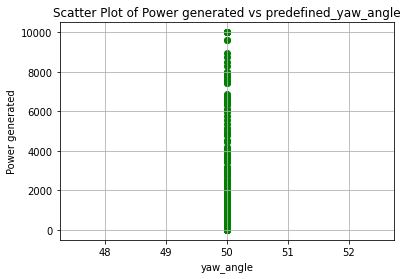

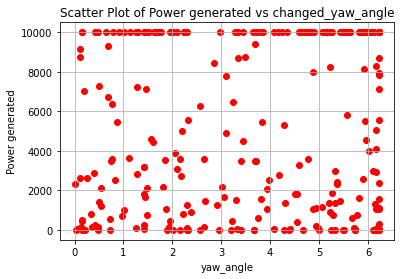

Power_list: [462.48286311204083, 1198.4269898729333]
Predefined Yaw Angle 1: 56.228330735800384
Predefined Yaw Angle 2: 54.775654280955806
Changed Yaw Angle 1: 6.2283307358003865
Changed Yaw Angle 2: 4.775654280955808
farm_power_baseline : [5951.29523005    0.        ], farm_power_yaw : [9999.99900259   50.08171403]


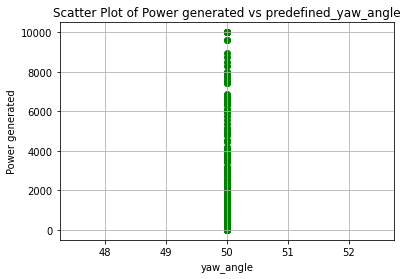

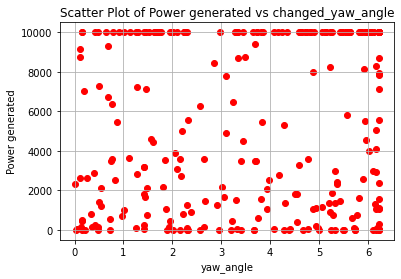

Power_list: [5951.295230053832, 9999.999778116926]
Predefined Yaw Angle 1: 56.22765802130903
Predefined Yaw Angle 2: 49.89888304299485
Changed Yaw Angle 1: 6.227658021309033
Changed Yaw Angle 2: -0.10111695700515341
Predefined Yaw Angle 1: 56.22810809553326
Predefined Yaw Angle 2: 55.509779136518176
Changed Yaw Angle 1: 6.228108095533256
Changed Yaw Angle 2: 5.509779136518179
farm_power_baseline : [ 920.77198856 1272.5682001 ], farm_power_yaw : [2192.85304787 2957.52426087]


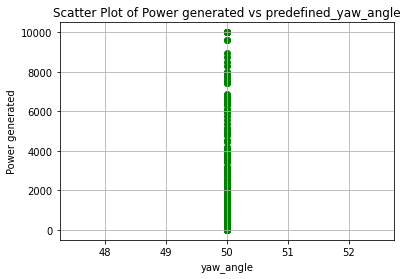

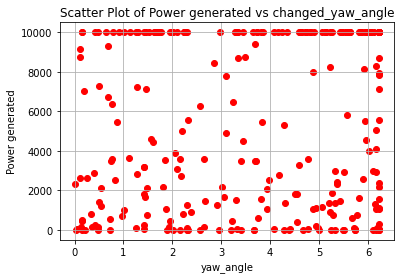

Power_list: [1272.5682001019, 2987.760141422816]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 54.641429896751376
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 4.6414298967513785
Predefined Yaw Angle 1: 56.226433499839814
Predefined Yaw Angle 2: 55.771992379550724
Changed Yaw Angle 1: 6.226433499839814
Changed Yaw Angle 2: 5.771992379550727
farm_power_baseline : [10000.00572791   628.05741225], farm_power_yaw : [10000.00332831  1551.95134853]


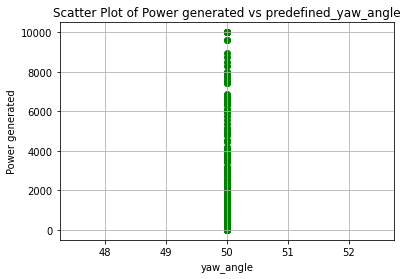

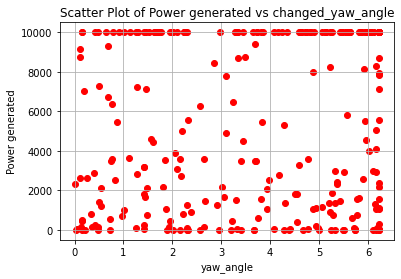

Power_list: [10000.00572791148, 10000.003328306828]
Predefined Yaw Angle 1: 51.370939957753876
Predefined Yaw Angle 2: 53.839128649915196
Changed Yaw Angle 1: 1.3709399577538794
Changed Yaw Angle 2: 3.839128649915197
farm_power_baseline : [8845.18217997    0.        ], farm_power_yaw : [10000.00434103     0.        ]


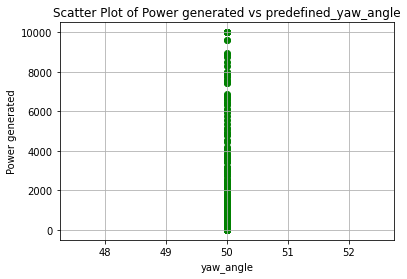

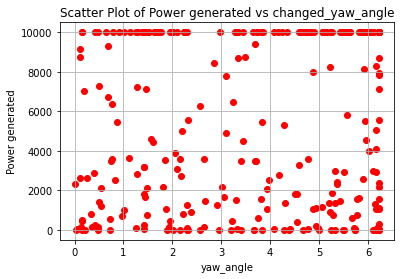

Power_list: [8845.182179966489, 10000.004341033333]
Predefined Yaw Angle 1: 56.15270495032541
Predefined Yaw Angle 2: 54.06347893278176
Changed Yaw Angle 1: 6.152704950325406
Changed Yaw Angle 2: 4.063478932781761
farm_power_baseline : [3659.14539373 9999.99871067], farm_power_yaw : [ 8274.16625911 10000.01443555]


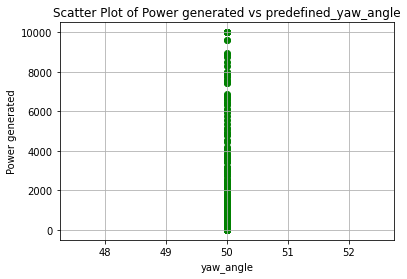

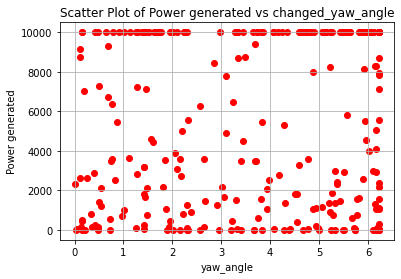

Power_list: [9999.998710665104, 10000.014435546189]
Predefined Yaw Angle 1: 56.22625506804678
Predefined Yaw Angle 2: 53.25059162061252
Changed Yaw Angle 1: 6.226255068046779
Changed Yaw Angle 2: 3.2505916206125147
farm_power_baseline : [9287.22061213 5521.85696913], farm_power_yaw : [10000.00267482  9999.99609374]


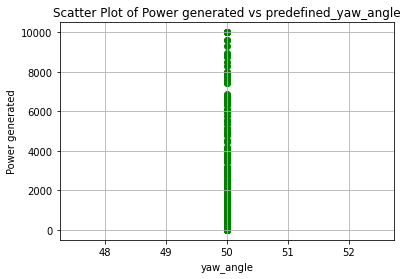

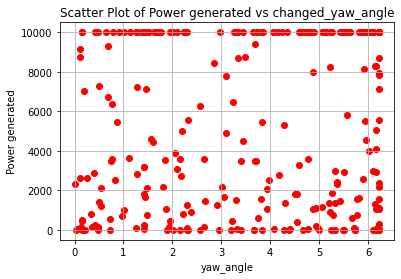

Power_list: [9287.220612129071, 10000.00267481996]
Predefined Yaw Angle 1: 56.12992107456756
Predefined Yaw Angle 2: 53.60302823400309
Changed Yaw Angle 1: 6.1299210745675605
Changed Yaw Angle 2: 3.603028234003094
farm_power_baseline : [ 383.30255448 1456.09148104], farm_power_yaw : [1013.06107925 3369.34992975]


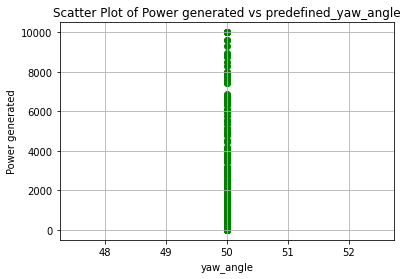

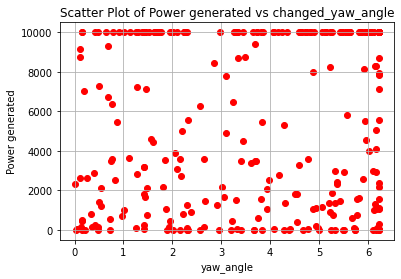

Power_list: [1456.0914810377765, 3392.431089950127]
Predefined Yaw Angle 1: 50.04610506659738
Predefined Yaw Angle 2: 50.93502511758793
Changed Yaw Angle 1: 0.046105066597376655
Changed Yaw Angle 2: 0.9350251175879285
farm_power_baseline : [10000.00596863  1321.65208058], farm_power_yaw : [10000.0045701   3099.22282804]


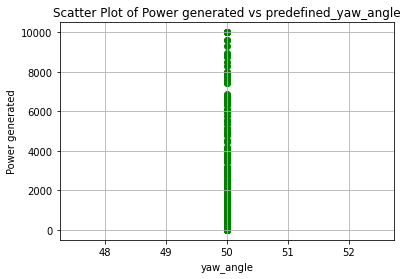

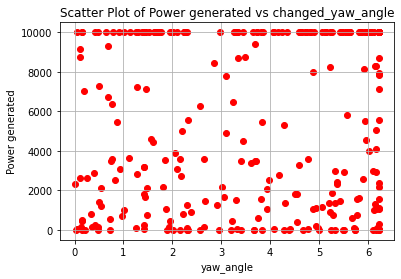

Power_list: [10000.00596862909, 10000.004593516582]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 51.43934180794572
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 1.4393418079457265
farm_power_baseline : [ 104.77468213 4744.61846034], farm_power_yaw : [ 390.76883252 9999.99198605]


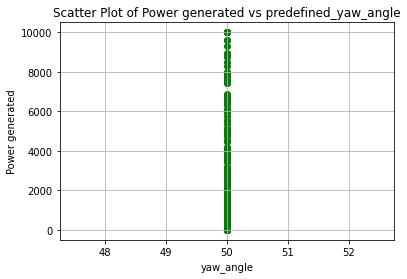

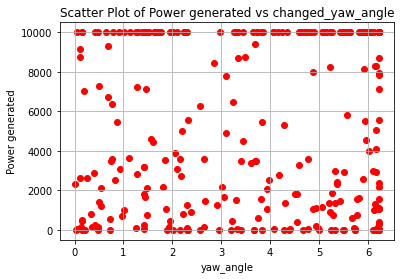

Power_list: [4744.618460340345, 9999.99244493306]
Predefined Yaw Angle 1: 50.640031268681945
Predefined Yaw Angle 2: 53.73703130952094
Changed Yaw Angle 1: 0.6400312686819429
Changed Yaw Angle 2: 3.737031309520938
farm_power_baseline : [ 2454.17603346 10000.00512503], farm_power_yaw : [ 5644.33407376 10000.01021219]


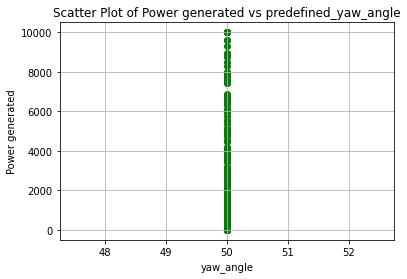

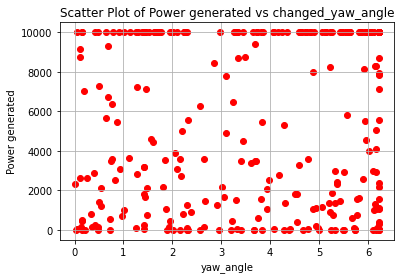

Power_list: [10000.005125031192, 10000.010212190835]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 55.47743131665364
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 5.47743131665364
farm_power_baseline : [2642.41314566 8308.43599408], farm_power_yaw : [5992.54014368 9999.99793589]


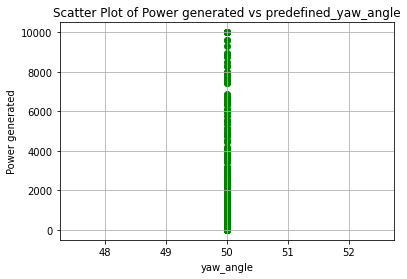

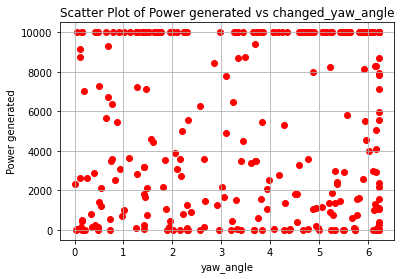

Power_list: [8308.435994083995, 9999.998862086888]
Predefined Yaw Angle 1: 49.94524189330891
Predefined Yaw Angle 2: 52.70610700416527
Changed Yaw Angle 1: -0.054758106691090526
Changed Yaw Angle 2: 2.7061070041652697
Predefined Yaw Angle 1: 49.945169051691906
Predefined Yaw Angle 2: 52.82145676677598
Changed Yaw Angle 1: -0.054830948308093395
Changed Yaw Angle 2: 2.8214567667759805
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 50.462797387836716
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 0.46279738783671304
farm_power_baseline : [  62.52830825 8544.13608933], farm_power_yaw : [  296.26270417 10000.00108147]


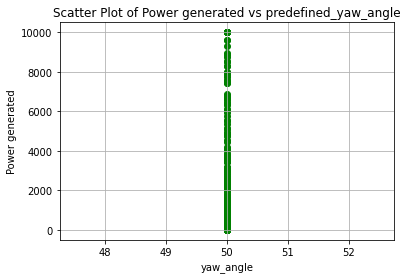

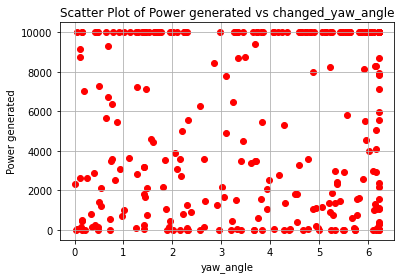

Power_list: [8544.136089331558, 10000.001611748292]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 53.547004113099426
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 3.5470041130994243
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 52.486420182683545
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 2.4864201826835433
farm_power_baseline : [5412.9609174   661.97566704], farm_power_yaw : [9999.99630491 1633.87978737]


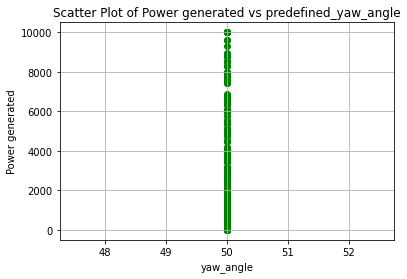

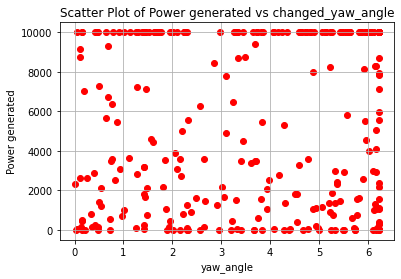

Power_list: [5412.96091740255, 9999.996304907556]
Predefined Yaw Angle 1: 49.94771195441401
Predefined Yaw Angle 2: 50.82499774899477
Changed Yaw Angle 1: -0.05228804558598805
Changed Yaw Angle 2: 0.824997748994768
Predefined Yaw Angle 1: 56.222166050509074
Predefined Yaw Angle 2: 51.4751349593125
Changed Yaw Angle 1: 6.222166050509071
Changed Yaw Angle 2: 1.4751349593125005
farm_power_baseline : [ 927.40014923 8746.0508822 ], farm_power_yaw : [ 2215.42410405 10000.00340678]


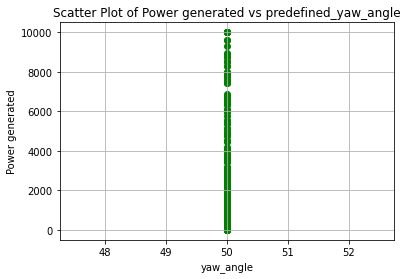

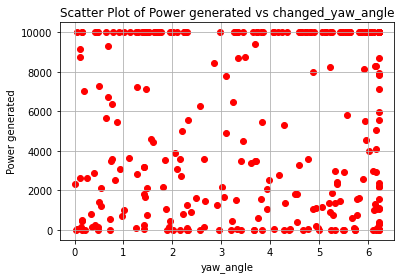

Power_list: [8746.050882195037, 10000.003967272738]
Predefined Yaw Angle 1: 54.88991918256471
Predefined Yaw Angle 2: 54.37425358671136
Changed Yaw Angle 1: 4.889919182564714
Changed Yaw Angle 2: 4.374253586711359
farm_power_baseline : [691.36948345   0.        ], farm_power_yaw : [1699.72973503    0.        ]


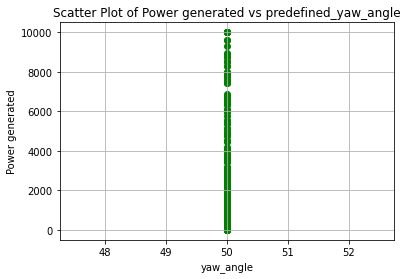

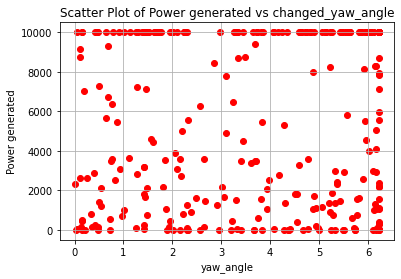

Power_list: [691.369483445841, 1710.3257270914128]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 54.59953517701113
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 4.599535177011124
farm_power_baseline : [10000.00517199 10000.00245972], farm_power_yaw : [9999.99356378 9999.96292798]


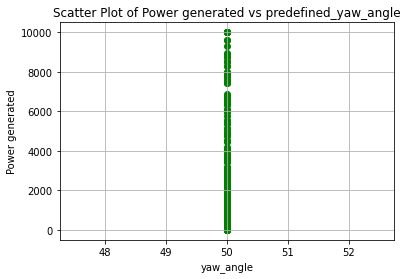

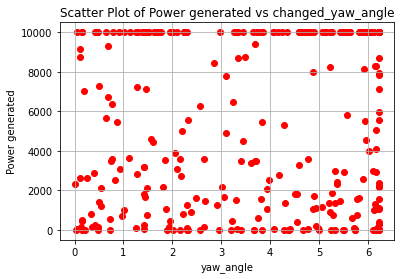

Power_list: [10000.005171989878, 9999.993563782113]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 55.440211509890915
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 5.440211509890911
farm_power_baseline : [9999.99119228 9999.99792363], farm_power_yaw : [10000.01448445 10000.01455032]


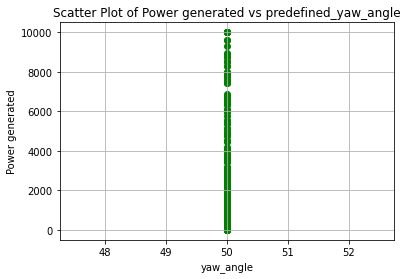

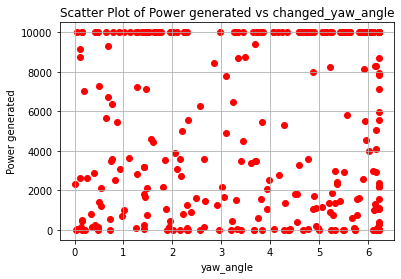

Power_list: [9999.997923626768, 10000.016241714922]
Predefined Yaw Angle 1: 49.945830805610896
Predefined Yaw Angle 2: 54.600831071197554
Changed Yaw Angle 1: -0.05416919438910074
Changed Yaw Angle 2: 4.600831071197557
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 53.986951667277786
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 3.986951667277789
Predefined Yaw Angle 1: 49.945169987959474
Predefined Yaw Angle 2: 54.78676392375918
Changed Yaw Angle 1: -0.054830012040522666
Changed Yaw Angle 2: 4.786763923759183
Predefined Yaw Angle 1: 49.97219048279726
Predefined Yaw Angle 2: 56.15957286563432
Changed Yaw Angle 1: -0.027809517202740667
Changed Yaw Angle 2: 6.159572865634319
Predefined Yaw Angle 1: 50.46771139705885
Predefined Yaw Angle 2: 53.68781209783464
Changed Yaw Angle 1: 0.4677113970588523
Changed Yaw Angle 2: 3.6878120978346387
farm_power_baseline : [10000.00519171  2080.30325476], farm_power_yaw : [9999.99206498 4764.75952402]


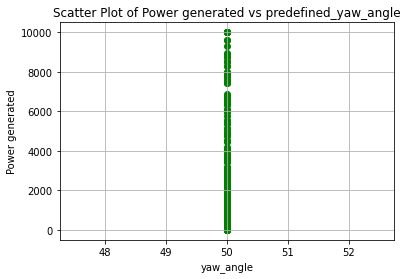

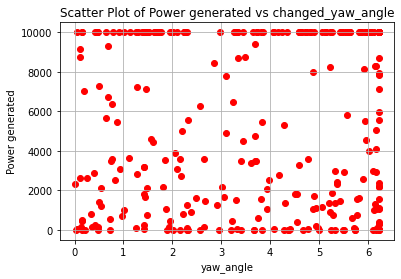

Power_list: [10000.005191707656, 9999.992064982362]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 55.645370254994035
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 5.645370254994037
Predefined Yaw Angle 1: 55.469803867801836
Predefined Yaw Angle 2: 50.29755663115473
Changed Yaw Angle 1: 5.469803867801837
Changed Yaw Angle 2: 0.2975566311547301
farm_power_baseline : [9999.99740949 9492.55375101], farm_power_yaw : [10000.01455433 10000.00171806]


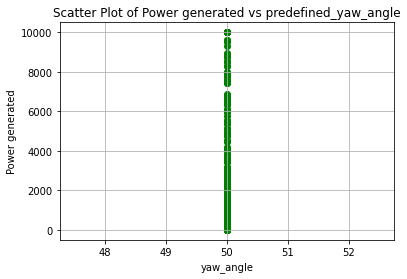

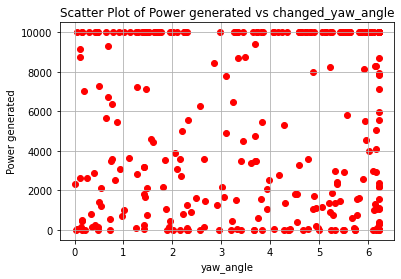

Power_list: [9999.99740949466, 10000.014554332989]
Predefined Yaw Angle 1: 49.94520968570448
Predefined Yaw Angle 2: 51.3934624665825
Changed Yaw Angle 1: -0.054790314295523675
Changed Yaw Angle 2: 1.3934624665824955
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 55.65899818292419
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 5.658998182924191
Predefined Yaw Angle 1: 51.41877352672501
Predefined Yaw Angle 2: 54.63947353861461
Changed Yaw Angle 1: 1.4187735267250108
Changed Yaw Angle 2: 4.639473538614606
farm_power_baseline : [9999.99673582  924.05222485], farm_power_yaw : [9999.99255286 2213.75773517]


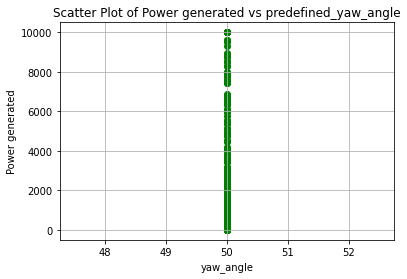

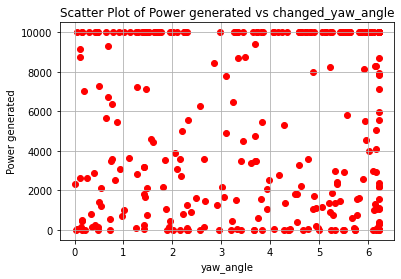

Power_list: [9999.99673582376, 9999.9925528563]
Predefined Yaw Angle 1: 49.94534712978386
Predefined Yaw Angle 2: 51.855158725802994
Changed Yaw Angle 1: -0.05465287021614037
Changed Yaw Angle 2: 1.8551587258029925
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 51.997860883863524
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 1.997860883863526
Predefined Yaw Angle 1: 55.83464149080837
Predefined Yaw Angle 2: 54.307299852694
Changed Yaw Angle 1: 5.83464149080837
Changed Yaw Angle 2: 4.307299852694004
farm_power_baseline : [   0.         9999.99518354], farm_power_yaw : [  128.16250904 10000.00338213]


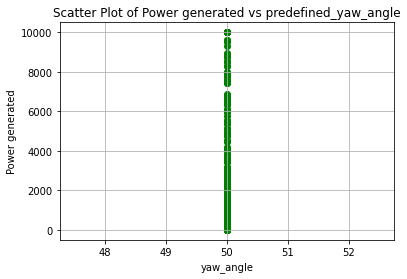

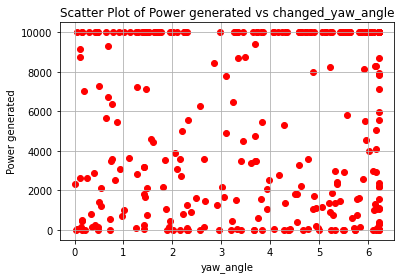

Power_list: [9999.995183538134, 10000.003382128663]
Predefined Yaw Angle 1: 52.66117506002807
Predefined Yaw Angle 2: 51.284605091235235
Changed Yaw Angle 1: 2.6611750600280732
Changed Yaw Angle 2: 1.284605091235234
farm_power_baseline : [9999.99656362  329.10350001], farm_power_yaw : [9999.97843516  905.05969845]


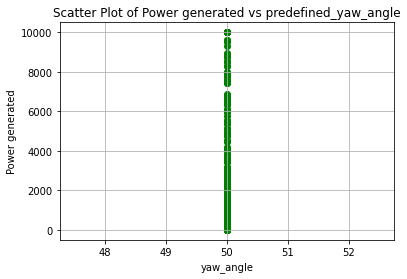

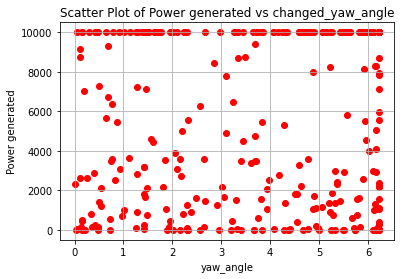

Power_list: [9999.9965636211, 9999.97897264406]
Predefined Yaw Angle 1: 49.9464781410093
Predefined Yaw Angle 2: 53.51444297403157
Changed Yaw Angle 1: -0.05352185899069734
Changed Yaw Angle 2: 3.5144429740315704
Predefined Yaw Angle 1: 56.227480122148215
Predefined Yaw Angle 2: 53.437200117142694
Changed Yaw Angle 1: 6.227480122148215
Changed Yaw Angle 2: 3.437200117142694
farm_power_baseline : [4293.42919115 3343.50783151], farm_power_yaw : [9656.35054212 7582.43492136]


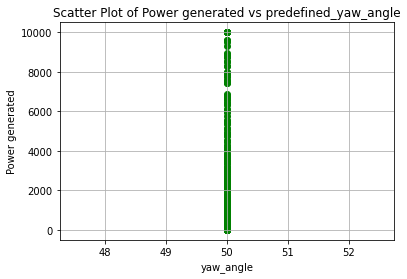

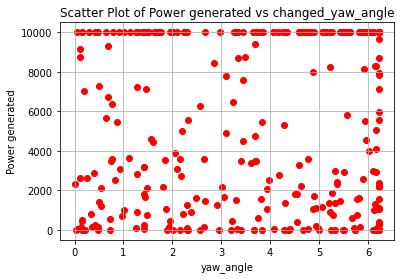

Power_list: [4293.429191147589, 9721.899126202758]
Predefined Yaw Angle 1: 55.54846299375842
Predefined Yaw Angle 2: 53.687169477063605
Changed Yaw Angle 1: 5.548462993758418
Changed Yaw Angle 2: 3.6871694770636028
farm_power_baseline : [7204.3649867  9999.99350191], farm_power_yaw : [10000.00397911 10000.0125075 ]


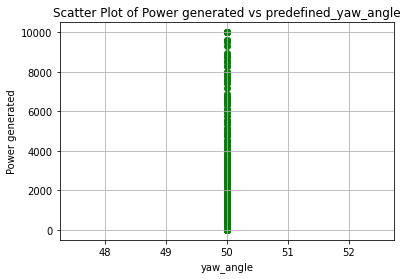

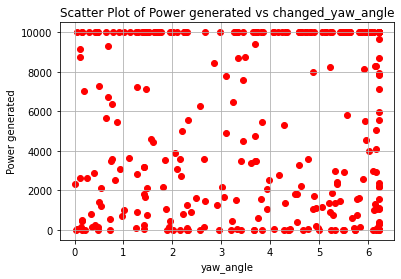

Power_list: [9999.993501906176, 10000.012507502197]
Predefined Yaw Angle 1: 55.983048273081906
Predefined Yaw Angle 2: 50.11893868315922
Changed Yaw Angle 1: 5.983048273081908
Changed Yaw Angle 2: 0.11893868315922458
farm_power_baseline : [378.49093864   0.        ], farm_power_yaw : [1005.75094502    0.        ]


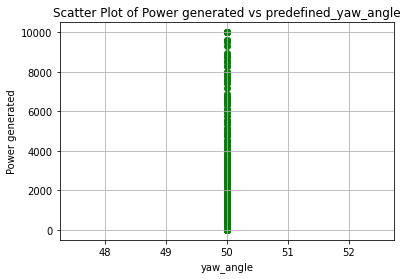

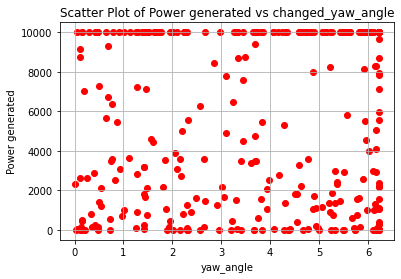

Power_list: [378.490938644394, 1011.1557445093482]
Predefined Yaw Angle 1: 56.20832027600175
Predefined Yaw Angle 2: 52.36384766088043
Changed Yaw Angle 1: 6.208320276001749
Changed Yaw Angle 2: 2.3638476608804284
farm_power_baseline : [9999.99696909   98.01055825], farm_power_yaw : [9999.99055268  375.5871791 ]


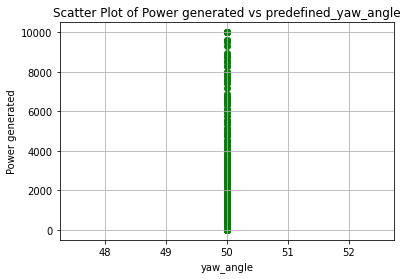

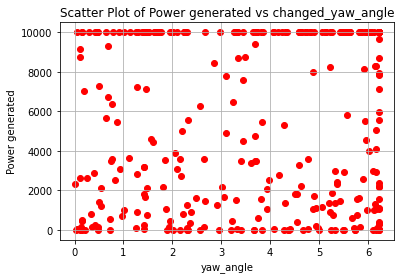

Power_list: [9999.996969088481, 9999.990552676289]
Predefined Yaw Angle 1: 56.22323078231288
Predefined Yaw Angle 2: 51.16821509790274
Changed Yaw Angle 1: 6.223230782312885
Changed Yaw Angle 2: 1.1682150979027381
farm_power_baseline : [215.82696922 896.97741256], farm_power_yaw : [ 642.41442619 2151.96190791]


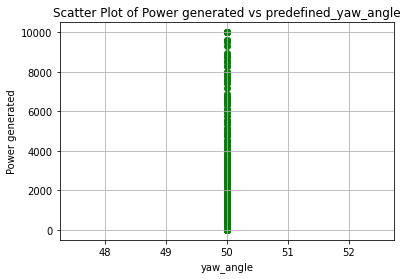

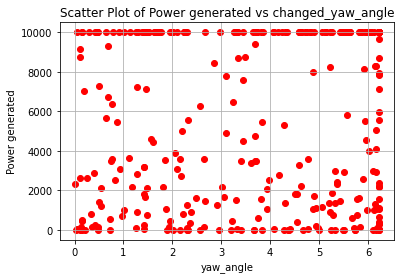

Power_list: [896.9774125594686, 2164.199463867818]
Predefined Yaw Angle 1: 49.946786173040074
Predefined Yaw Angle 2: 53.26398838616005
Changed Yaw Angle 1: -0.053213826959926845
Changed Yaw Angle 2: 3.2639883861600496
Predefined Yaw Angle 1: 51.04060545088208
Predefined Yaw Angle 2: 50.953451795486295
Changed Yaw Angle 1: 1.040605450882086
Changed Yaw Angle 2: 0.9534517954862957
farm_power_baseline : [ 175.42429448 1248.60378012], farm_power_yaw : [ 552.62940604 2930.85666401]


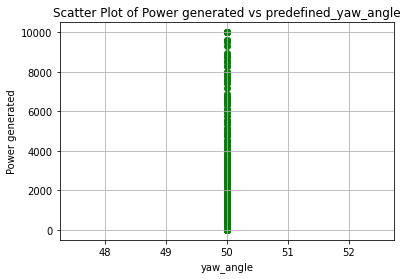

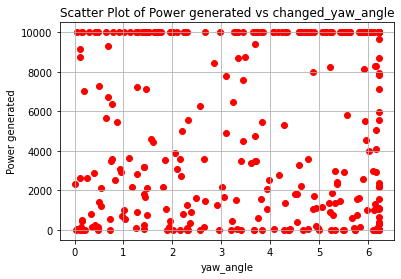

Power_list: [1248.6037801156372, 2930.8566640084637]
Predefined Yaw Angle 1: 56.228114487119875
Predefined Yaw Angle 2: 52.32509413964592
Changed Yaw Angle 1: 6.228114487119872
Changed Yaw Angle 2: 2.3250941396459224
farm_power_baseline : [8498.73173401 5584.89997528], farm_power_yaw : [10000.00048237  9999.99595972]


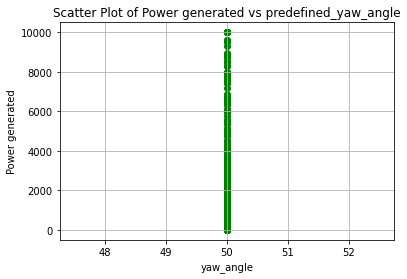

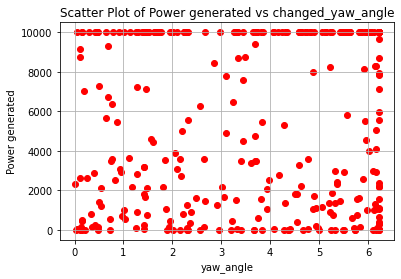

Power_list: [8498.731734012523, 10000.001082064191]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 53.274690032684425
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 3.2746900326844237
Predefined Yaw Angle 1: 56.198735026606336
Predefined Yaw Angle 2: 55.23778037437624
Changed Yaw Angle 1: 6.198735026606336
Changed Yaw Angle 2: 5.237780374376244
farm_power_baseline : [6949.13203758 1626.1076091 ], farm_power_yaw : [10000.00484171  3730.76381965]


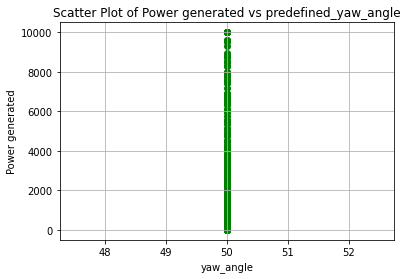

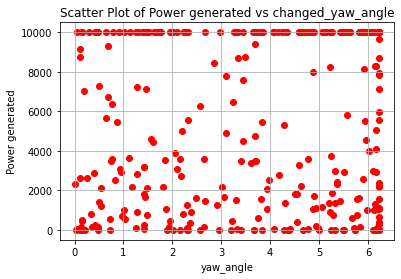

Power_list: [6949.132037580721, 10000.004841713106]
Predefined Yaw Angle 1: 55.50075139756521
Predefined Yaw Angle 2: 52.91457978692889
Changed Yaw Angle 1: 5.500751397565212
Changed Yaw Angle 2: 2.9145797869288903
farm_power_baseline : [1851.45361861  490.58359569], farm_power_yaw : [4252.24349755 1257.18157895]


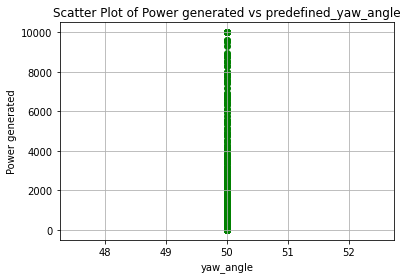

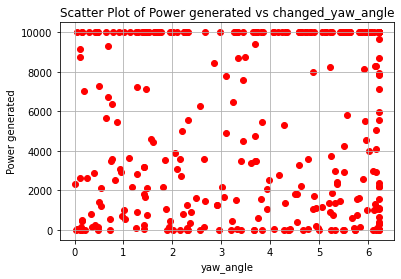

Power_list: [1851.4536186110147, 4276.680488132044]
Predefined Yaw Angle 1: 49.945169051691906
Predefined Yaw Angle 2: 49.91022330306505
Changed Yaw Angle 1: -0.054830948308093395
Changed Yaw Angle 2: -0.08977669693494561
Predefined Yaw Angle 1: 49.945169051691906
Predefined Yaw Angle 2: 51.840030239756636
Changed Yaw Angle 1: -0.054830948308093395
Changed Yaw Angle 2: 1.840030239756634
Predefined Yaw Angle 1: 50.06624099457287
Predefined Yaw Angle 2: 55.29156291259039
Changed Yaw Angle 1: 0.06624099457287039
Changed Yaw Angle 2: 5.291562912590394
farm_power_baseline : [347.15963973   0.        ], farm_power_yaw : [944.76962502   0.        ]


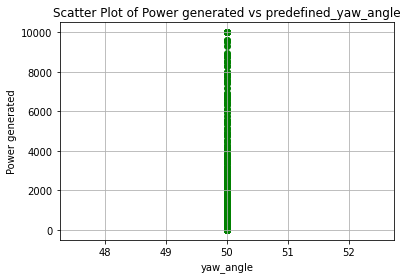

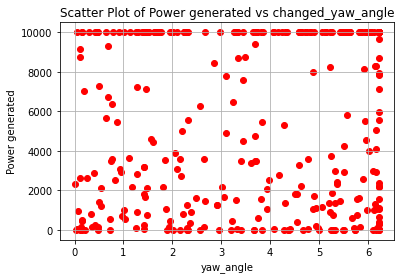

Power_list: [347.15963973019836, 948.9130048600791]
Predefined Yaw Angle 1: 53.90471442890687
Predefined Yaw Angle 2: 51.300375798578465
Changed Yaw Angle 1: 3.9047144289068716
Changed Yaw Angle 2: 1.3003757985784652
farm_power_baseline : [8612.18257793 3326.75200415], farm_power_yaw : [10000.00154365  6990.62367024]


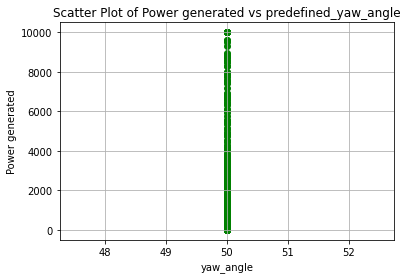

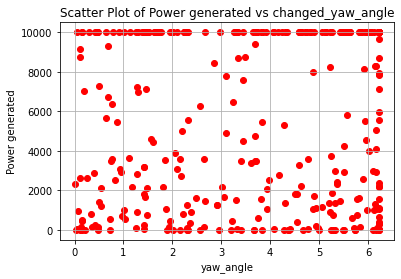

Power_list: [8612.182577927608, 10000.003592115425]
Predefined Yaw Angle 1: 56.01554363207084
Predefined Yaw Angle 2: 49.99475385034266
Changed Yaw Angle 1: 6.0155436320708375
Changed Yaw Angle 2: -0.005246149657337976
Predefined Yaw Angle 1: 56.22579008012045
Predefined Yaw Angle 2: 55.220885813053
Changed Yaw Angle 1: 6.225790080120451
Changed Yaw Angle 2: 5.220885813052999
farm_power_baseline : [2365.52670287 1775.07799755], farm_power_yaw : [5381.33829755 4059.63085817]


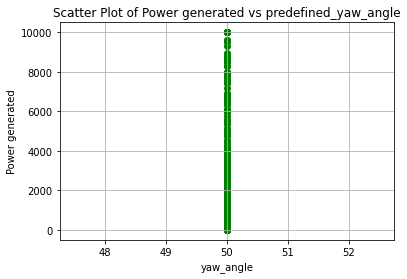

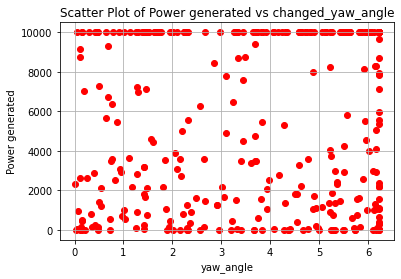

Power_list: [2365.526702868012, 5431.6549632880415]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 52.93138486603951
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 2.9313848660395085
farm_power_baseline : [ 155.90909748 3303.99130195], farm_power_yaw : [ 503.12484039 7496.53734591]


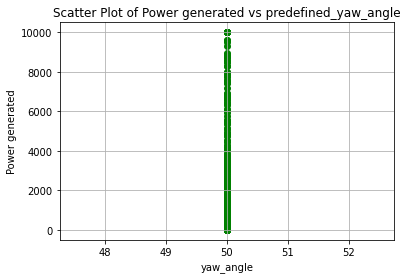

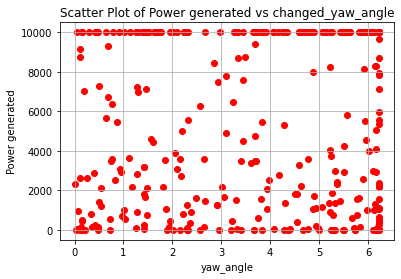

Power_list: [3303.9913019484457, 7545.030711122202]
Predefined Yaw Angle 1: 56.22835363898576
Predefined Yaw Angle 2: 52.737298479484494
Changed Yaw Angle 1: 6.2283536389857606
Changed Yaw Angle 2: 2.7372984794844957
farm_power_baseline : [6940.17389696    0.        ], farm_power_yaw : [10000.00481641     0.        ]


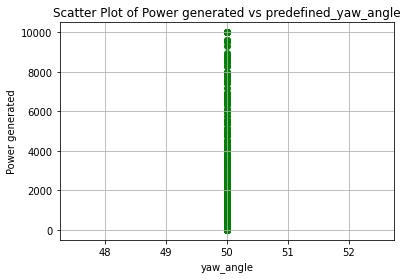

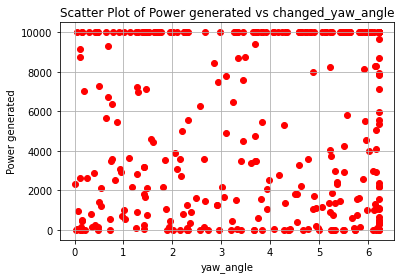

Power_list: [6940.173896955487, 10000.004816409964]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 53.291204560920114
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 3.2912045609201144
farm_power_baseline : [3999.89053357 9999.99253536], farm_power_yaw : [ 9032.1949806  10000.01695914]


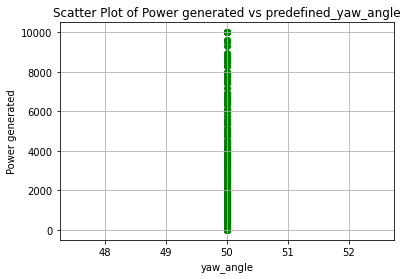

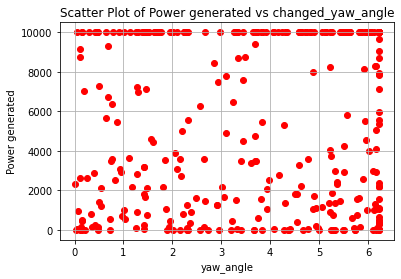

Power_list: [9999.99253535882, 10000.016959142104]
Predefined Yaw Angle 1: 56.22827480941749
Predefined Yaw Angle 2: 54.40042713390466
Changed Yaw Angle 1: 6.228274809417495
Changed Yaw Angle 2: 4.400427133904658
farm_power_baseline : [9057.48633596 1018.86615185], farm_power_yaw : [10000.00367602  2417.45911287]


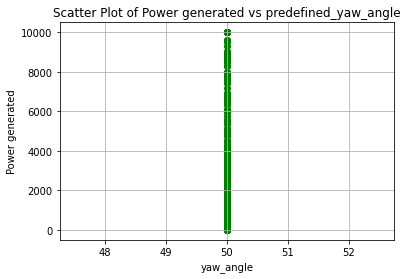

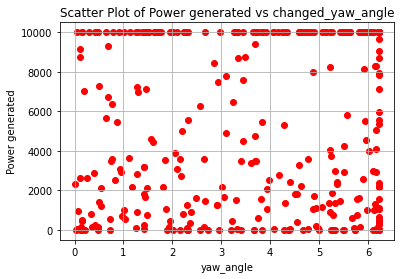

Power_list: [9057.48633596052, 10000.003676021284]
Predefined Yaw Angle 1: 56.2281922514237
Predefined Yaw Angle 2: 50.71687607189864
Changed Yaw Angle 1: 6.228192251423702
Changed Yaw Angle 2: 0.716876071898641
farm_power_baseline : [  21.66811758 3250.85091424], farm_power_yaw : [ 186.01916969 7384.81204086]


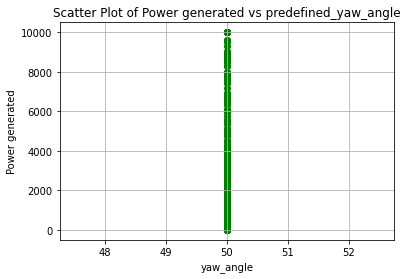

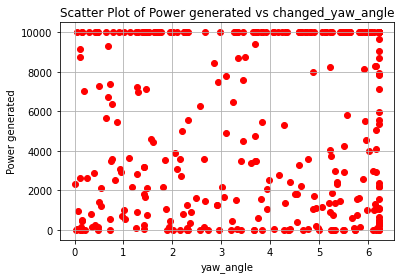

Power_list: [3250.850914235576, 7384.812040864352]
Predefined Yaw Angle 1: 56.226228436435875
Predefined Yaw Angle 2: 55.38334077007671
Changed Yaw Angle 1: 6.2262284364358775
Changed Yaw Angle 2: 5.383340770076705
farm_power_baseline : [1300.83999333    0.        ], farm_power_yaw : [3022.35321172   92.16054072]


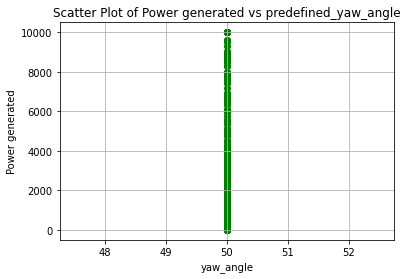

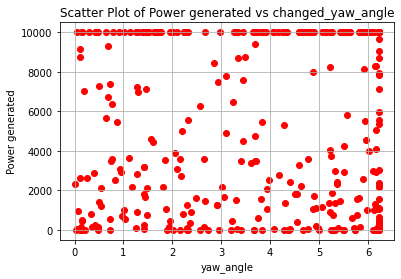

Power_list: [1300.839993328646, 3052.1848668512102]
Predefined Yaw Angle 1: 56.09686964754302
Predefined Yaw Angle 2: 50.2270463120806
Changed Yaw Angle 1: 6.096869647543023
Changed Yaw Angle 2: 0.2270463120806014
farm_power_baseline : [2085.2101099  4622.85033634], farm_power_yaw : [4760.08447669 9999.98993645]


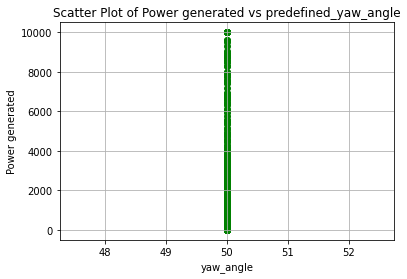

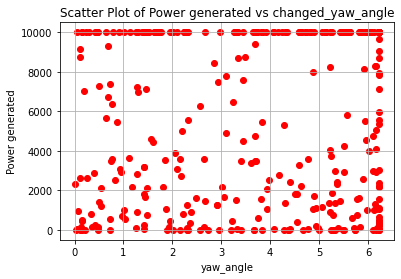

Power_list: [4622.8503363418795, 9999.99035073016]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 50.93859768161124
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 0.9385976816112425
Predefined Yaw Angle 1: 49.94516923894542
Predefined Yaw Angle 2: 50.64830866199778
Changed Yaw Angle 1: -0.05483076105457925
Changed Yaw Angle 2: 0.6483086619977797
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 55.703273236046755
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 5.703273236046758
farm_power_baseline : [10000.00173554   642.24017187], farm_power_yaw : [10000.01410065  1583.63848933]


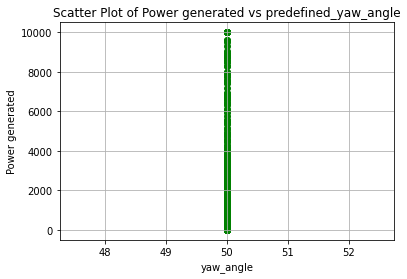

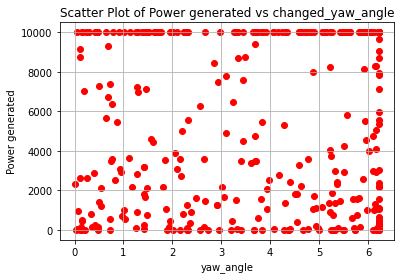

Power_list: [10000.001735540545, 10000.014100646356]
Predefined Yaw Angle 1: 56.22834458423806
Predefined Yaw Angle 2: 54.531384884716
Changed Yaw Angle 1: 6.228344584238055
Changed Yaw Angle 2: 4.5313848847159965
farm_power_baseline : [1424.76199457 8040.30537123], farm_power_yaw : [3304.39807135 9999.99494424]


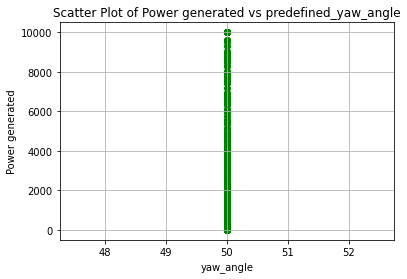

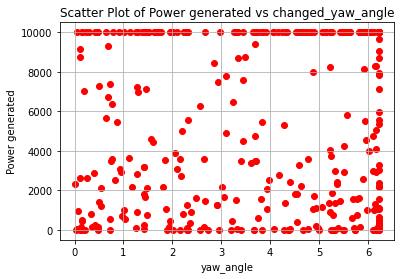

Power_list: [8040.305371234516, 9999.99573409308]
Predefined Yaw Angle 1: 52.57545749191835
Predefined Yaw Angle 2: 51.812594620522745
Changed Yaw Angle 1: 2.5754574919183466
Changed Yaw Angle 2: 1.8125946205227466
farm_power_baseline : [ 886.71939924 1868.97136943], farm_power_yaw : [2139.66009534 4308.46151074]


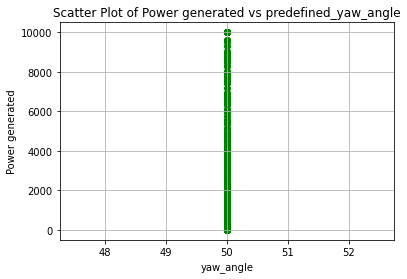

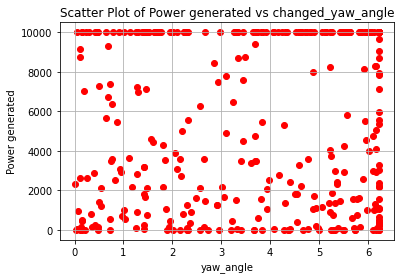

Power_list: [1868.9713694301472, 4314.733559925006]
Predefined Yaw Angle 1: 56.1644862423557
Predefined Yaw Angle 2: 54.59234091364238
Changed Yaw Angle 1: 6.164486242355698
Changed Yaw Angle 2: 4.592340913642384
farm_power_baseline : [153.68714711   0.        ], farm_power_yaw : [497.26260044   0.        ]


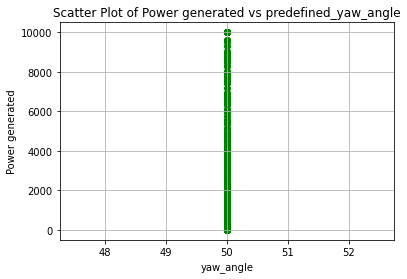

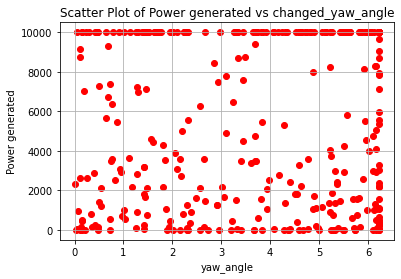

Power_list: [153.6871471138455, 502.1003735113472]
Predefined Yaw Angle 1: 49.94517111148056
Predefined Yaw Angle 2: 56.03214912958951
Changed Yaw Angle 1: -0.05482888851943779
Changed Yaw Angle 2: 6.0321491295895155
Predefined Yaw Angle 1: 55.87829815792582
Predefined Yaw Angle 2: 55.110028004252925
Changed Yaw Angle 1: 5.878298157925822
Changed Yaw Angle 2: 5.110028004252925
farm_power_baseline : [ 0.         53.56664939], farm_power_yaw : [  0.         270.67571839]


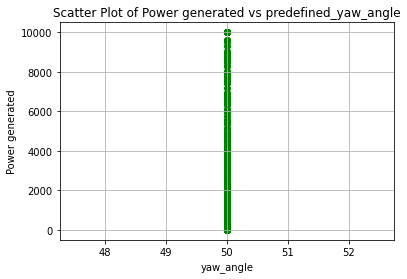

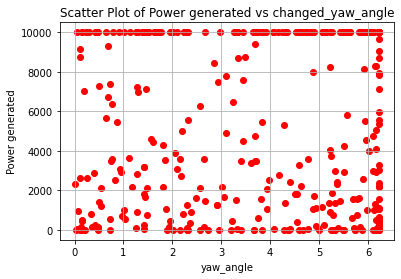

Power_list: [53.56664939409487, 273.99928931867476]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 53.5377142082689
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 3.5377142082689006
farm_power_baseline : [1.00000025e+04 8.42144545e+00], farm_power_yaw : [10000.01397365   158.05572872]


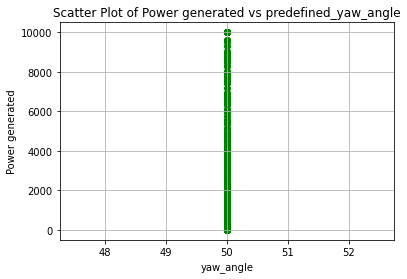

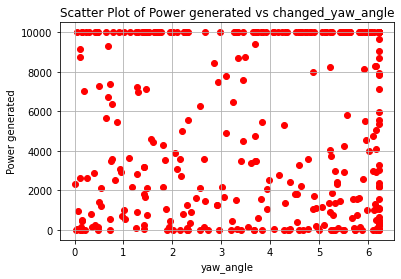

Power_list: [10000.002546234353, 10000.013973650557]
Predefined Yaw Angle 1: 56.2083809960746
Predefined Yaw Angle 2: 55.72310526405236
Changed Yaw Angle 1: 6.208380996074602
Changed Yaw Angle 2: 5.72310526405236
farm_power_baseline : [2779.90047038    0.        ], farm_power_yaw : [6311.73207251   41.65535358]


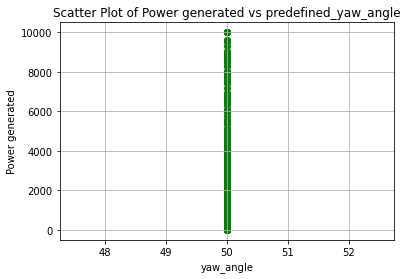

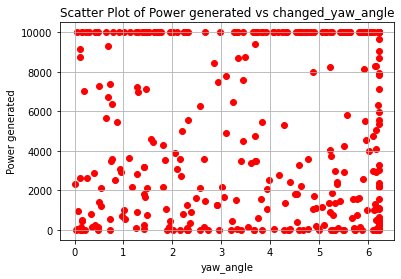

Power_list: [2779.9004703767114, 6374.851269276588]
Predefined Yaw Angle 1: 49.973599378237694
Predefined Yaw Angle 2: 52.96644032178433
Changed Yaw Angle 1: -0.026400621762304687
Changed Yaw Angle 2: 2.9664403217843303
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 52.997446174775575
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 2.997446174775578
Predefined Yaw Angle 1: 56.22614534580987
Predefined Yaw Angle 2: 53.96902939208988
Changed Yaw Angle 1: 6.226145345809868
Changed Yaw Angle 2: 3.9690293920898827
farm_power_baseline : [4964.34276779    0.        ], farm_power_yaw : [9999.99541768    0.        ]


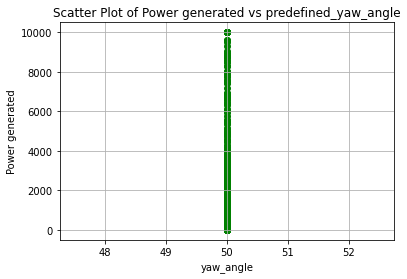

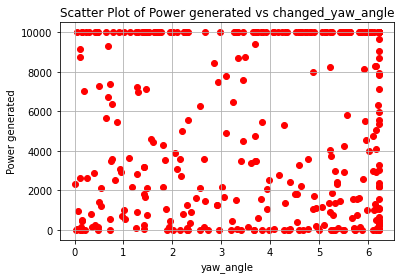

Power_list: [4964.342767786905, 9999.995417684015]
Predefined Yaw Angle 1: 52.01853671212876
Predefined Yaw Angle 2: 52.53547161522117
Changed Yaw Angle 1: 2.0185367121287583
Changed Yaw Angle 2: 2.5354716152211676
farm_power_baseline : [5023.03742775 9999.98898718], farm_power_yaw : [ 9999.9968235  10000.01090161]


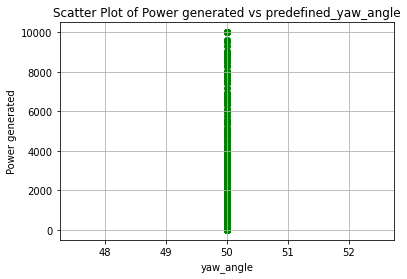

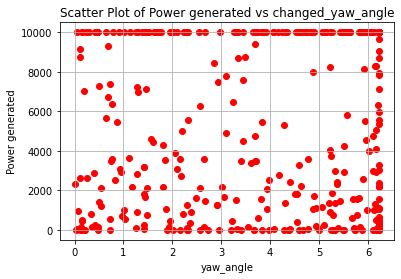

Power_list: [9999.988987184803, 10000.011168924433]
Predefined Yaw Angle 1: 50.12615070079648
Predefined Yaw Angle 2: 51.36678824510426
Changed Yaw Angle 1: 0.12615070079647953
Changed Yaw Angle 2: 1.3667882451042617
farm_power_baseline : [1512.1922369  5153.79356634], farm_power_yaw : [3512.76219587 9999.99675871]


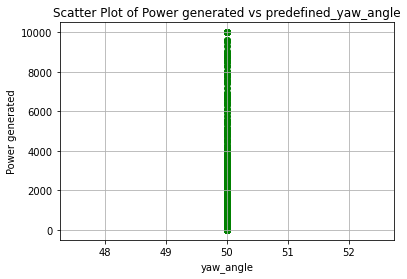

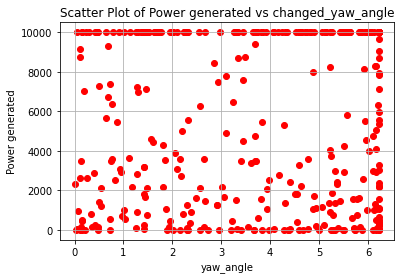

Power_list: [5153.7935663436765, 9999.996758706482]
Predefined Yaw Angle 1: 50.060988724915774
Predefined Yaw Angle 2: 52.75922295315857
Changed Yaw Angle 1: 0.06098872491577293
Changed Yaw Angle 2: 2.759222953158573
farm_power_baseline : [ 788.02236917 1435.11172651], farm_power_yaw : [1933.35788985 3348.04090167]


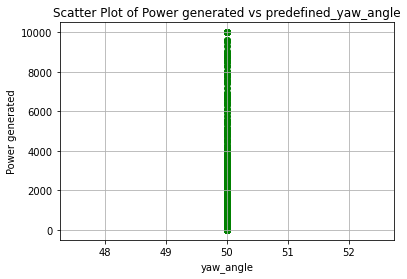

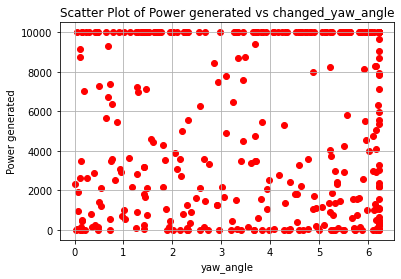

Power_list: [1435.1117265121934, 3351.5035435740906]
Predefined Yaw Angle 1: 56.22833552949035
Predefined Yaw Angle 2: 54.17612878267935
Changed Yaw Angle 1: 6.228335529490349
Changed Yaw Angle 2: 4.17612878267935
farm_power_baseline : [5277.74054247 6078.35200869], farm_power_yaw : [ 9999.99659247 10000.00091435]


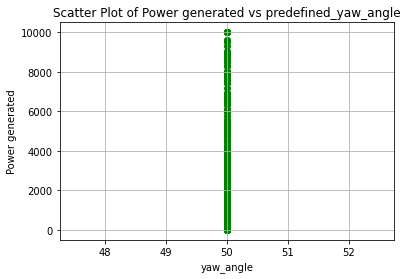

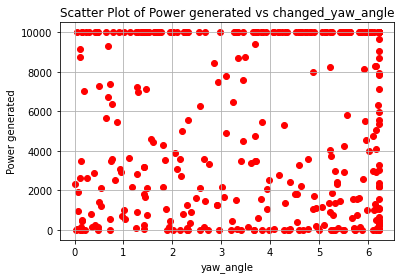

Power_list: [6078.352008687775, 10000.00162722873]
Predefined Yaw Angle 1: 56.18670765849132
Predefined Yaw Angle 2: 50.57359394393171
Changed Yaw Angle 1: 6.18670765849132
Changed Yaw Angle 2: 0.5735939439317156
farm_power_baseline : [ 212.13601244 2063.29464227], farm_power_yaw : [ 634.90283738 4711.66175073]


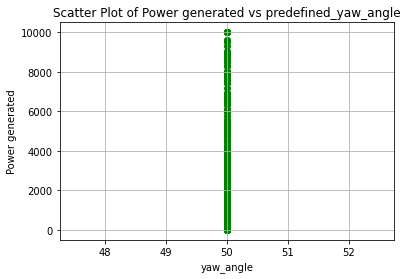

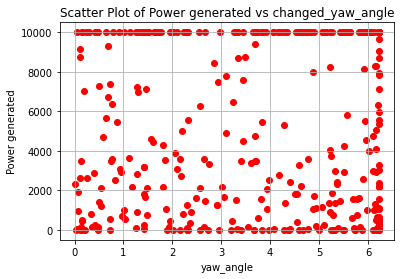

Power_list: [2063.294642273185, 4725.913336685735]
Predefined Yaw Angle 1: 55.67763056768501
Predefined Yaw Angle 2: 50.90720274078473
Changed Yaw Angle 1: 5.677630567685005
Changed Yaw Angle 2: 0.9072027407847344
farm_power_baseline : [364.85025628 643.99541344], farm_power_yaw : [ 979.11062093 1596.76341249]


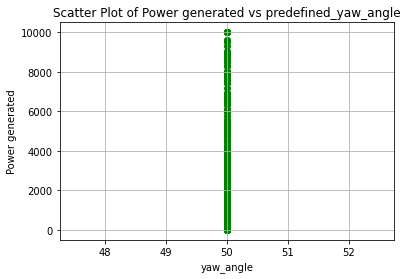

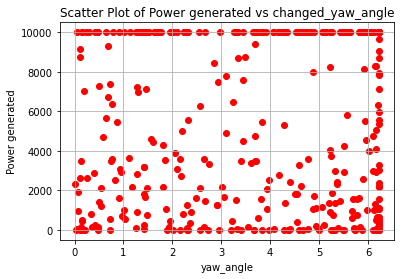

Power_list: [643.9954134371047, 1596.76341248944]
Predefined Yaw Angle 1: 56.227930729004655
Predefined Yaw Angle 2: 55.85002033632896
Changed Yaw Angle 1: 6.227930729004656
Changed Yaw Angle 2: 5.850020336328958
farm_power_baseline : [8096.6788756   126.62756229], farm_power_yaw : [9999.9954174   436.47428281]


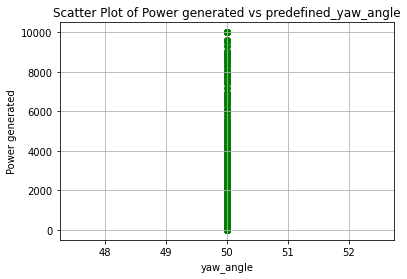

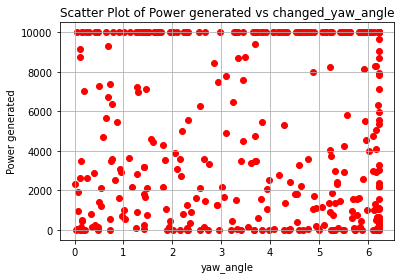

Power_list: [8096.678875595373, 9999.996391742588]
Predefined Yaw Angle 1: 56.22835363898576
Predefined Yaw Angle 2: 53.5664390637865
Changed Yaw Angle 1: 6.2283536389857606
Changed Yaw Angle 2: 3.5664390637864956
farm_power_baseline : [449.60918297 609.71930225], farm_power_yaw : [1158.48240939 1516.10432853]


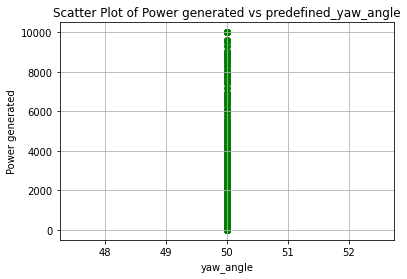

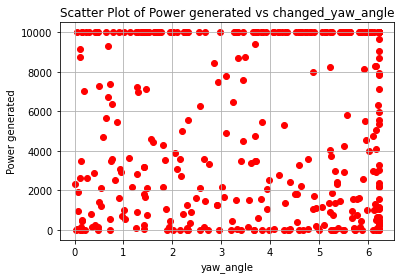

Power_list: [609.7193022514575, 1528.3373064102107]
Predefined Yaw Angle 1: 55.73121070565631
Predefined Yaw Angle 2: 55.37523517298294
Changed Yaw Angle 1: 5.731210705656309
Changed Yaw Angle 2: 5.37523517298294
farm_power_baseline : [2009.15697751  202.80842564], farm_power_yaw : [4579.31060234  613.03650659]


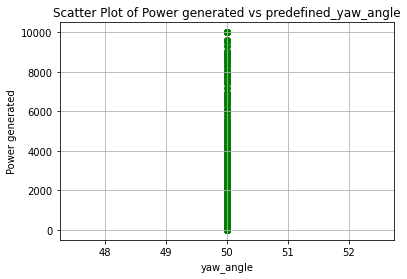

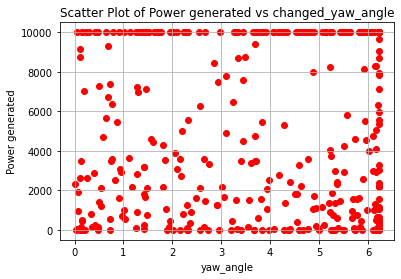

Power_list: [2009.1569775073542, 4619.2528480219635]
Predefined Yaw Angle 1: 49.94516942619894
Predefined Yaw Angle 2: 55.01908265092337
Changed Yaw Angle 1: -0.054830573801065104
Changed Yaw Angle 2: 5.019082650923373
Predefined Yaw Angle 1: 50.48754212677342
Predefined Yaw Angle 2: 54.287657974390235
Changed Yaw Angle 1: 0.4875421267734229
Changed Yaw Angle 2: 4.287657974390233
farm_power_baseline : [  0.         952.98447787], farm_power_yaw : [   0.         2275.92065201]


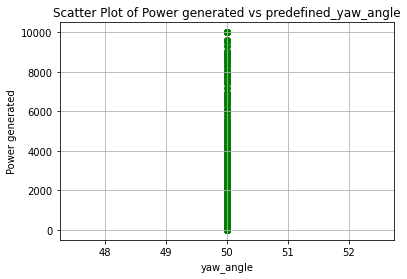

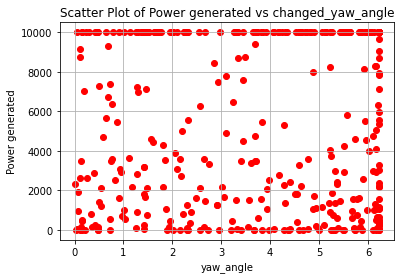

Power_list: [952.9844778670946, 2281.708770238687]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 55.52203553648694
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 5.522035536486942
Predefined Yaw Angle 1: 49.948360600587016
Predefined Yaw Angle 2: 51.76366715813386
Changed Yaw Angle 1: -0.05163939941298563
Changed Yaw Angle 2: 1.7636671581338652
Predefined Yaw Angle 1: 50.07485727777279
Predefined Yaw Angle 2: 51.95826686898899
Changed Yaw Angle 1: 0.07485727777279348
Changed Yaw Angle 2: 1.9582668689889908
farm_power_baseline : [ 955.63725662 6719.83296482], farm_power_yaw : [ 2286.20593094 10000.0052441 ]


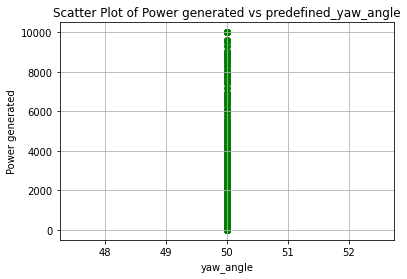

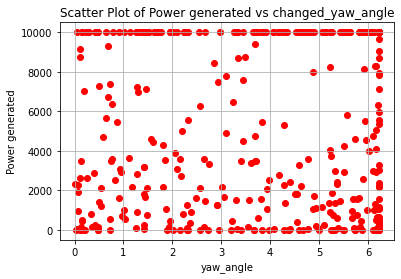

Power_list: [6719.832964820762, 10000.00524409956]
Predefined Yaw Angle 1: 49.946935601344364
Predefined Yaw Angle 2: 50.75034441679183
Changed Yaw Angle 1: -0.05306439865563818
Changed Yaw Angle 2: 0.7503444167918303
Predefined Yaw Angle 1: 49.94790819609684
Predefined Yaw Angle 2: 52.40482412267682
Changed Yaw Angle 1: -0.052091803903162835
Changed Yaw Angle 2: 2.4048241226768234
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 55.112967068831935
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 5.112967068831937
Predefined Yaw Angle 1: 49.94517054972002
Predefined Yaw Angle 2: 51.62296716458086
Changed Yaw Angle 1: -0.05482945027998023
Changed Yaw Angle 2: 1.6229671645808534
Predefined Yaw Angle 1: 56.21880354331674
Predefined Yaw Angle 2: 51.02985549031569
Changed Yaw Angle 1: 6.218803543316737
Changed Yaw Angle 2: 1.029855490315688
farm_power_baseline : [ 294.72676576 9999.99615671], farm_power_yaw : [  813.33130535 10000.01291706]


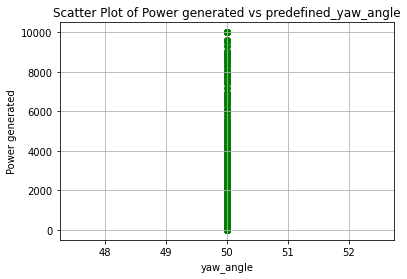

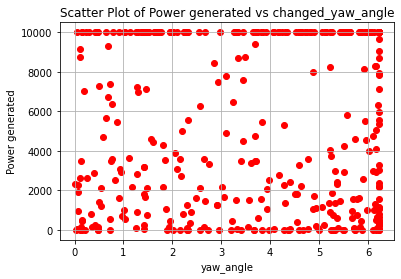

Power_list: [9999.996156713118, 10000.014659319424]
Predefined Yaw Angle 1: 52.708260280732894
Predefined Yaw Angle 2: 50.59206842557165
Changed Yaw Angle 1: 2.708260280732892
Changed Yaw Angle 2: 0.5920684255716498
farm_power_baseline : [6812.62111288 9999.99632553], farm_power_yaw : [10000.00503043  9999.98819814]


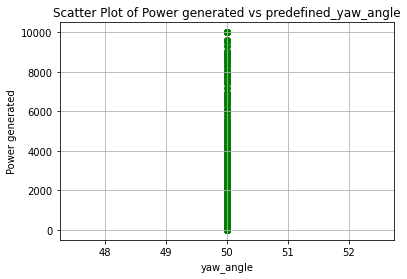

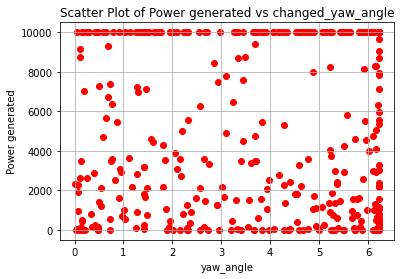

Power_list: [9999.996325525333, 10000.005030430126]
Predefined Yaw Angle 1: 56.204470942962146
Predefined Yaw Angle 2: 52.58025160368641
Changed Yaw Angle 1: 6.204470942962148
Changed Yaw Angle 2: 2.580251603686414
farm_power_baseline : [2594.73126417 1378.76708706], farm_power_yaw : [5901.51233498 3209.49670736]


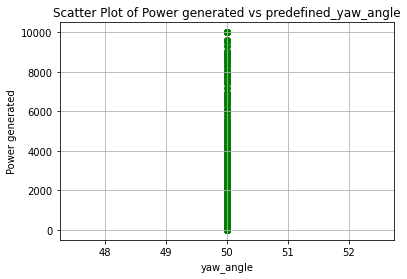

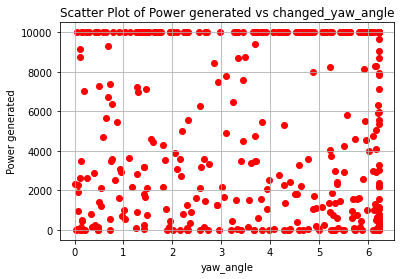

Power_list: [2594.731264168028, 5940.549669811631]
Predefined Yaw Angle 1: 56.22798772065198
Predefined Yaw Angle 2: 52.154237708331344
Changed Yaw Angle 1: 6.227987720651984
Changed Yaw Angle 2: 2.1542377083313435
farm_power_baseline : [9999.99412526 5450.15795542], farm_power_yaw : [10000.00886373  9999.99622812]


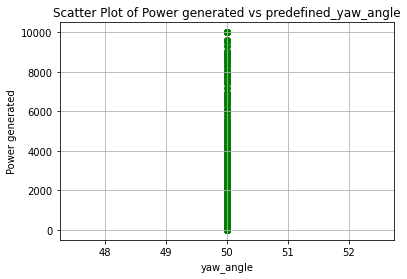

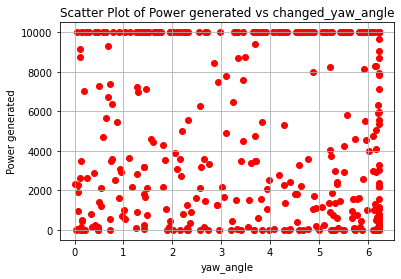

Power_list: [9999.994125263043, 10000.008863729565]
Predefined Yaw Angle 1: 56.22799198170973
Predefined Yaw Angle 2: 54.946272359352825
Changed Yaw Angle 1: 6.227991981709728
Changed Yaw Angle 2: 4.946272359352824
farm_power_baseline : [9999.99036251  826.96073085], farm_power_yaw : [10000.01271329  1998.43366119]


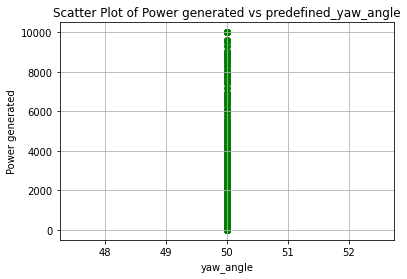

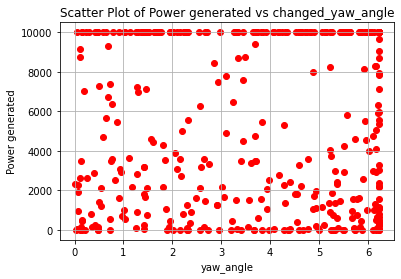

Power_list: [9999.990362510358, 10000.014332841765]
Predefined Yaw Angle 1: 56.17330929504713
Predefined Yaw Angle 2: 54.342004570123265
Changed Yaw Angle 1: 6.173309295047131
Changed Yaw Angle 2: 4.342004570123263
farm_power_baseline : [10000.00493999  1177.21404537], farm_power_yaw : [9999.98926822 2754.16056244]


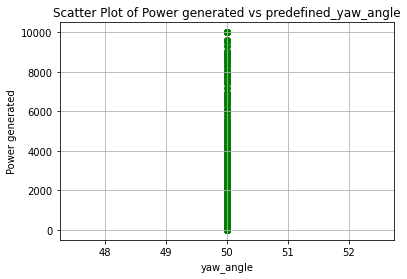

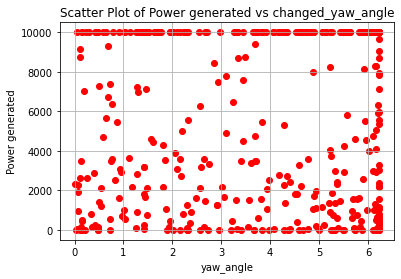

Power_list: [10000.004939987788, 9999.989268220252]
Predefined Yaw Angle 1: 49.96820422998812
Predefined Yaw Angle 2: 52.9936447786356
Changed Yaw Angle 1: -0.0317957700118849
Changed Yaw Angle 2: 2.993644778635599
Predefined Yaw Angle 1: 56.207299220039815
Predefined Yaw Angle 2: 50.2376752210177
Changed Yaw Angle 1: 6.207299220039813
Changed Yaw Angle 2: 0.23767522101770303
farm_power_baseline : [10000.00521191   158.89318383], farm_power_yaw : [9999.9933845  510.435983 ]


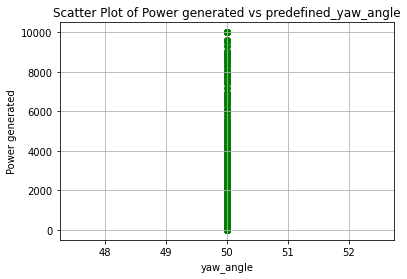

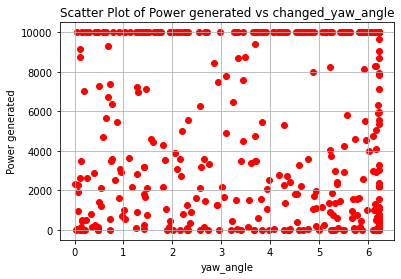

Power_list: [10000.005211905434, 9999.993384497608]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 53.60111661697263
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 3.6011166169726354
farm_power_baseline : [4411.43600535 1622.69799024], farm_power_yaw : [9896.37662438 3730.79199681]


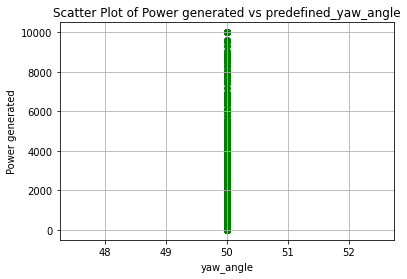

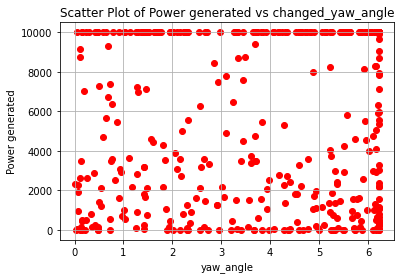

Power_list: [4411.436005354841, 9964.029061659565]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 51.614616956140964
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 1.6146169561409645
farm_power_baseline : [10000.0049587   4660.65895608], farm_power_yaw : [10000.01174238  9999.99053894]


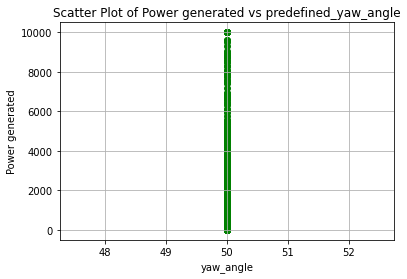

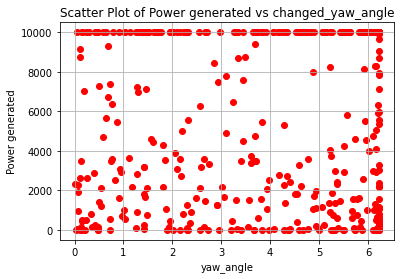

Power_list: [10000.004958702695, 10000.011742382634]
Predefined Yaw Angle 1: 56.011584044162106
Predefined Yaw Angle 2: 53.71629860043467
Changed Yaw Angle 1: 6.011584044162108
Changed Yaw Angle 2: 3.7162986004346714
farm_power_baseline : [ 906.91048089 5763.18454209], farm_power_yaw : [2169.74474894 9999.99641807]


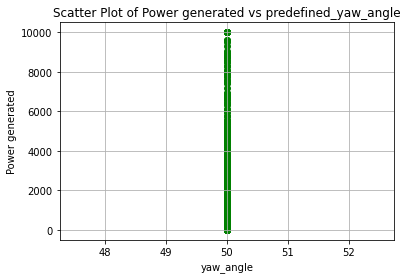

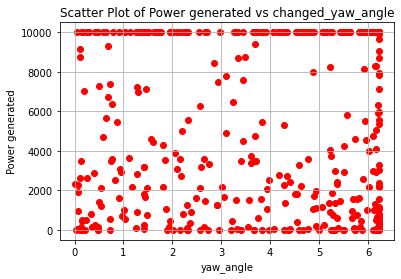

Power_list: [5763.1845420918025, 9999.997001354626]
Predefined Yaw Angle 1: 56.180613280652786
Predefined Yaw Angle 2: 54.48582778584466
Changed Yaw Angle 1: 6.180613280652783
Changed Yaw Angle 2: 4.485827785844665
farm_power_baseline : [1531.96498985 2506.912407  ], farm_power_yaw : [3526.84637814 5687.64399734]


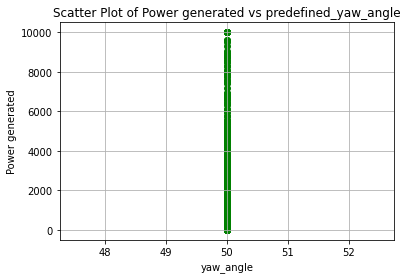

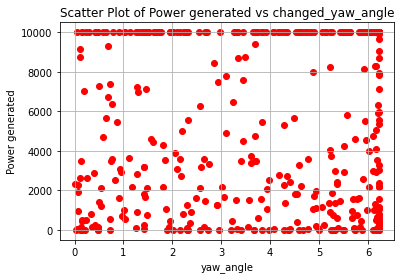

Power_list: [2506.912407001535, 5734.576598416543]
Predefined Yaw Angle 1: 56.14768329377395
Predefined Yaw Angle 2: 55.67921849981673
Changed Yaw Angle 1: 6.1476832937739525
Changed Yaw Angle 2: 5.679218499816726
farm_power_baseline : [ 9999.99200099 10000.00588653], farm_power_yaw : [10000.01629602 10000.00589751]


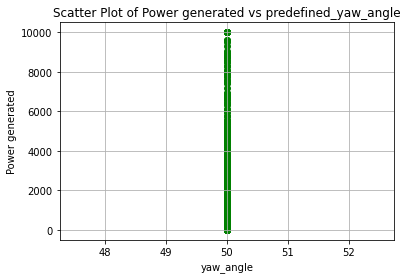

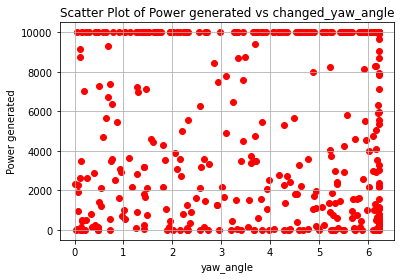

Power_list: [10000.005886532806, 10000.01810214894]
Predefined Yaw Angle 1: 49.94517729084653
Predefined Yaw Angle 2: 51.41260207270468
Changed Yaw Angle 1: -0.05482270915347097
Changed Yaw Angle 2: 1.4126020727046769
Predefined Yaw Angle 1: 56.22804098387378
Predefined Yaw Angle 2: 54.0898753865583
Changed Yaw Angle 1: 6.228040983873786
Changed Yaw Angle 2: 4.089875386558299
farm_power_baseline : [0. 0.], farm_power_yaw : [ 0.         15.18303556]


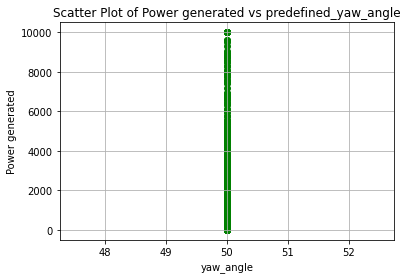

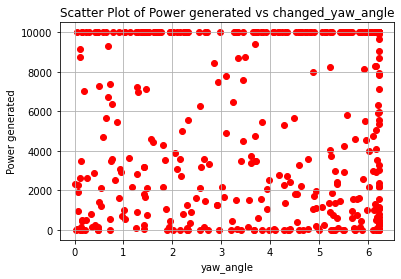

Power_list: [0.0, 16.18063577904005]
Predefined Yaw Angle 1: 56.22806548495581
Predefined Yaw Angle 2: 53.64661406103555
Changed Yaw Angle 1: 6.228065484955814
Changed Yaw Angle 2: 3.646614061035549
farm_power_baseline : [3436.89838816 5558.58058357], farm_power_yaw : [7794.67391609 9999.99602453]


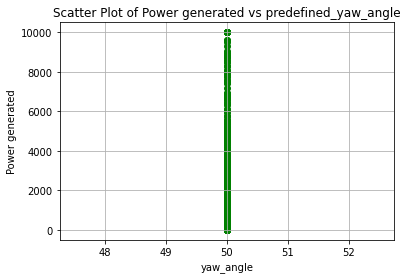

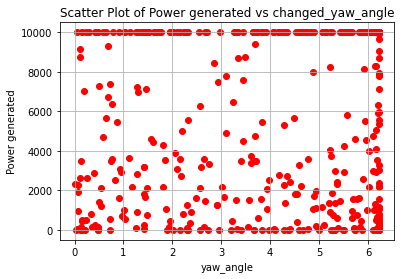

Power_list: [5558.580583566404, 9999.996024528818]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 54.40397819290217
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 4.403978192902169
Predefined Yaw Angle 1: 49.94603884426512
Predefined Yaw Angle 2: 55.739830448330274
Changed Yaw Angle 1: -0.05396115573488432
Changed Yaw Angle 2: 5.739830448330276
Predefined Yaw Angle 1: 49.94639106812522
Predefined Yaw Angle 2: 54.63139297523509
Changed Yaw Angle 1: -0.05360893187477532
Changed Yaw Angle 2: 4.631392975235088
Predefined Yaw Angle 1: 49.945169987959474
Predefined Yaw Angle 2: 53.66408093567705
Changed Yaw Angle 1: -0.054830012040522666
Changed Yaw Angle 2: 3.6640809356770516
Predefined Yaw Angle 1: 49.94517092422705
Predefined Yaw Angle 2: 55.9471740507917
Changed Yaw Angle 1: -0.054829075772951937
Changed Yaw Angle 2: 5.947174050791703
Predefined Yaw Angle 1: 54.49864595731362
Predefined Yaw Angle 2: 50.20256723442038
Changed Yaw Angle 1: 4.4986459573136

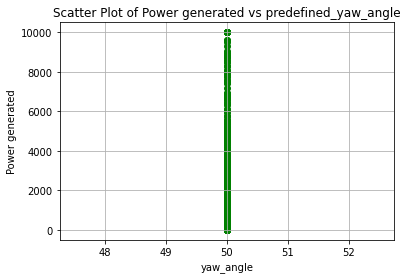

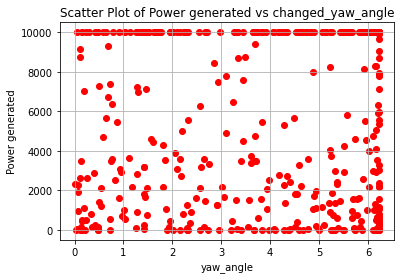

Power_list: [428.4295323787495, 1118.2329794902753]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 51.86981170443672
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 1.8698117044367175
farm_power_baseline : [7273.71799902 2022.24347189], farm_power_yaw : [10000.00309477  4620.26396651]


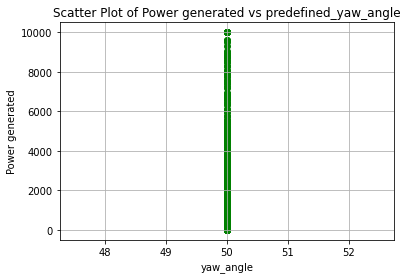

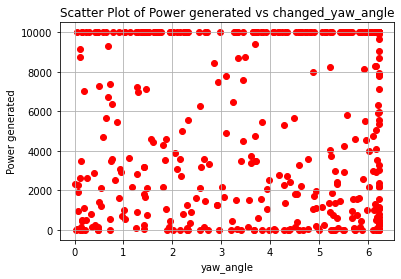

Power_list: [7273.7179990150735, 10000.003094772052]
Predefined Yaw Angle 1: 49.94518515549412
Predefined Yaw Angle 2: 54.7060823932708
Changed Yaw Angle 1: -0.05481484450587683
Changed Yaw Angle 2: 4.706082393270796
Predefined Yaw Angle 1: 49.94552296083364
Predefined Yaw Angle 2: 52.488012486699304
Changed Yaw Angle 1: -0.054477039166357086
Changed Yaw Angle 2: 2.4880124866993016
Predefined Yaw Angle 1: 53.910525180089316
Predefined Yaw Angle 2: 52.00508603990091
Changed Yaw Angle 1: 3.9105251800893157
Changed Yaw Angle 2: 2.005086039900911
farm_power_baseline : [ 230.89240364 8348.45453048], farm_power_yaw : [  577.25976544 10000.00425134]


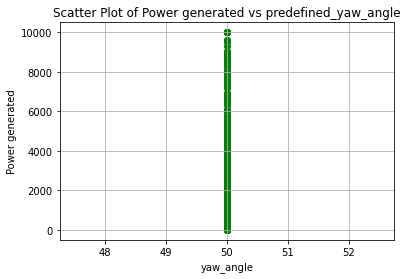

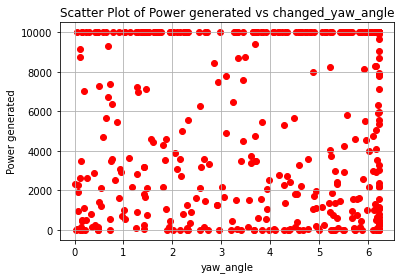

Power_list: [8348.454530478473, 10000.004351432843]
Predefined Yaw Angle 1: 49.971013032700306
Predefined Yaw Angle 2: 51.56395697430493
Changed Yaw Angle 1: -0.02898696729969195
Changed Yaw Angle 2: 1.5639569743049322
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 53.58240018714767
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 3.5824001871476674
Predefined Yaw Angle 1: 54.99871410678441
Predefined Yaw Angle 2: 55.19866919060734
Changed Yaw Angle 1: 4.998714106784413
Changed Yaw Angle 2: 5.19866919060734
farm_power_baseline : [9999.989385   1992.01285821], farm_power_yaw : [10000.01075795  4548.45469652]


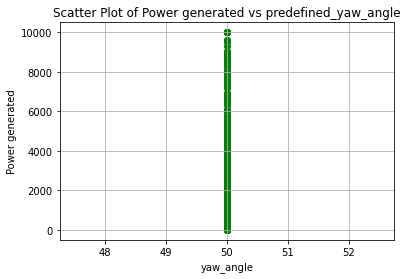

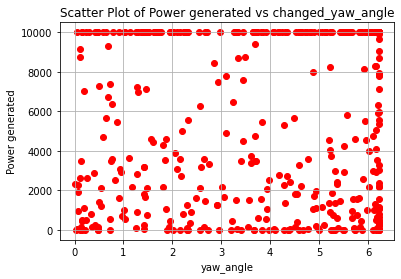

Power_list: [9999.989385002911, 10000.012084099466]
Predefined Yaw Angle 1: 50.057330540263415
Predefined Yaw Angle 2: 56.06857052065744
Changed Yaw Angle 1: 0.05733054026341284
Changed Yaw Angle 2: 6.068570520657439
farm_power_baseline : [9999.99678128 1530.33988807], farm_power_yaw : [10000.01458217  3534.56668374]


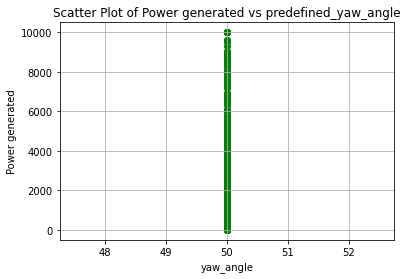

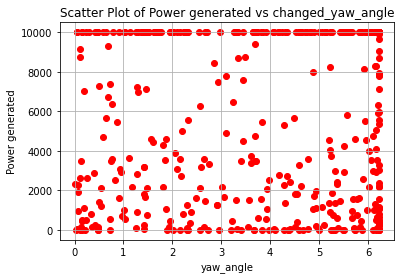

Power_list: [9999.996781277327, 10000.01458467045]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 53.275542776865464
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 3.2755427768654672
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 50.00648284454705
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 0.006482844547048127
farm_power_baseline : [204.74939283   0.        ], farm_power_yaw : [619.52715437   0.        ]


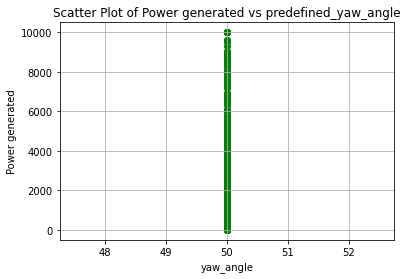

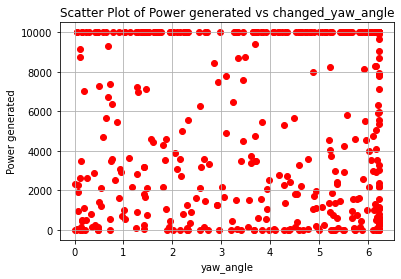

Power_list: [204.74939283158895, 623.6863196335403]
Predefined Yaw Angle 1: 56.16258421270516
Predefined Yaw Angle 2: 52.98443716548276
Changed Yaw Angle 1: 6.162584212705164
Changed Yaw Angle 2: 2.984437165482759
farm_power_baseline : [  0.         654.80246926], farm_power_yaw : [   0.         1617.46332565]


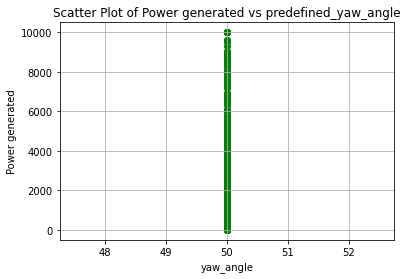

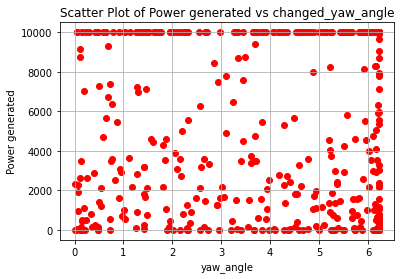

Power_list: [654.8024692631817, 1628.8222979910809]
Predefined Yaw Angle 1: 56.22835363898576
Predefined Yaw Angle 2: 56.07626332778224
Changed Yaw Angle 1: 6.2283536389857606
Changed Yaw Angle 2: 6.076263327782242
farm_power_baseline : [2733.03291364   45.25139555], farm_power_yaw : [6198.29534033  247.25065458]


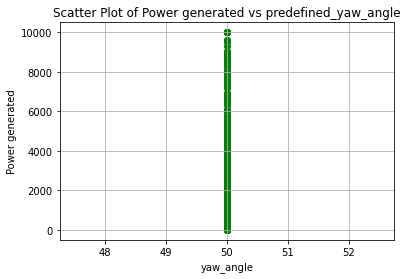

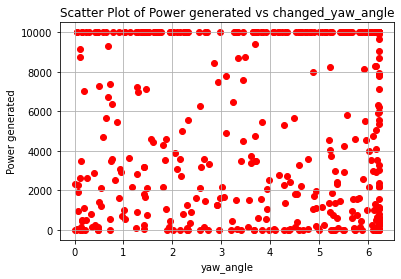

Power_list: [2733.0329136398736, 6264.926648058072]
Predefined Yaw Angle 1: 56.21711616445006
Predefined Yaw Angle 2: 50.33362502022016
Changed Yaw Angle 1: 6.217116164450062
Changed Yaw Angle 2: 0.3336250202201637
farm_power_baseline : [5900.13924068 9979.22250075], farm_power_yaw : [ 9999.99854694 10000.00525661]


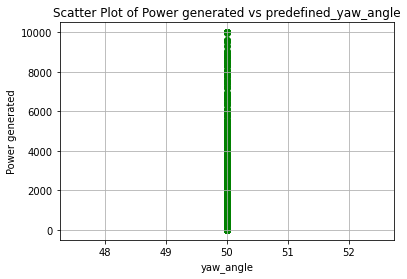

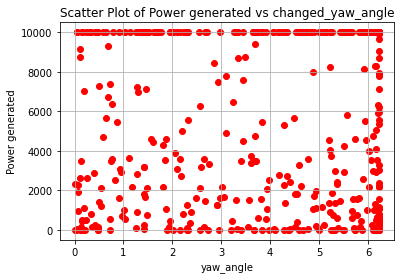

Power_list: [9979.222500745565, 10000.006234162298]
Predefined Yaw Angle 1: 50.24982210944439
Predefined Yaw Angle 2: 50.275343504108
Changed Yaw Angle 1: 0.24982210944438843
Changed Yaw Angle 2: 0.2753435041080018
farm_power_baseline : [ 456.3972507  3124.37919239], farm_power_yaw : [1184.0697182  7138.55280289]


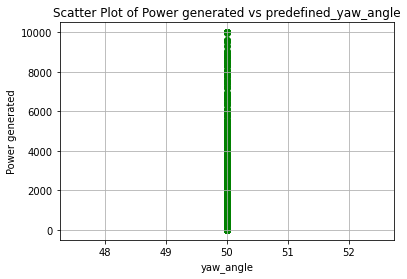

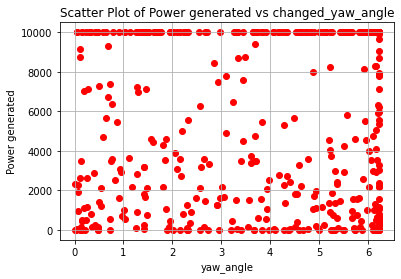

Power_list: [3124.3791923870695, 7138.691565052508]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 54.03333035134541
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 4.03333035134541
farm_power_baseline : [3835.74038558  967.2091779 ], farm_power_yaw : [8656.4047765  2295.58969951]


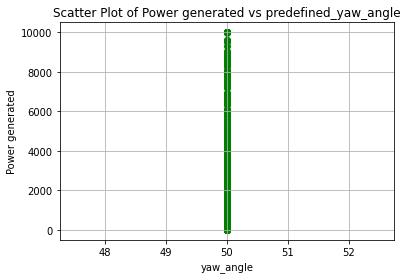

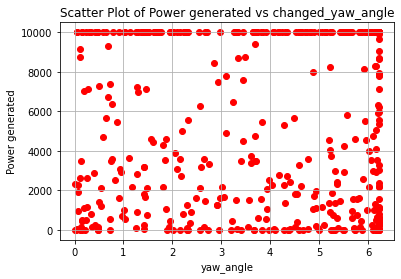

Power_list: [3835.740385578925, 8656.404776496163]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 55.56117281923453
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 5.561172819234528
Predefined Yaw Angle 1: 50.007399199301624
Predefined Yaw Angle 2: 53.23202539307303
Changed Yaw Angle 1: 0.007399199301626209
Changed Yaw Angle 2: 3.2320253930730276
farm_power_baseline : [7137.33149294 6208.89897791], farm_power_yaw : [10000.00425756 10000.00339383]


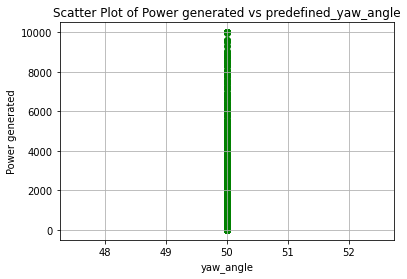

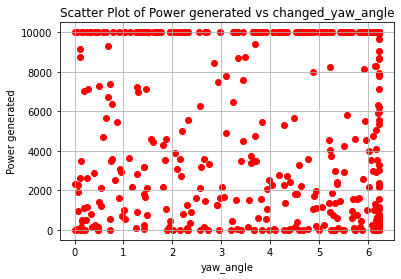

Power_list: [7137.331492935085, 10000.004257560782]
Predefined Yaw Angle 1: 56.22765482551573
Predefined Yaw Angle 2: 52.70434638836862
Changed Yaw Angle 1: 6.2276548255157245
Changed Yaw Angle 2: 2.7043463883686183
farm_power_baseline : [10000.00480915   460.28938796], farm_power_yaw : [9999.98540465 1184.59043814]


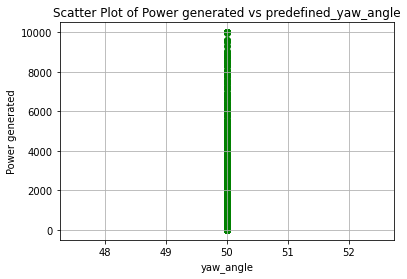

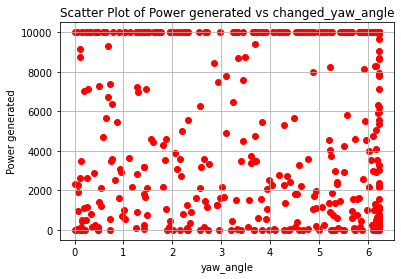

Power_list: [10000.00480914717, 9999.985404651346]
Predefined Yaw Angle 1: 49.94589222476354
Predefined Yaw Angle 2: 54.64967664138292
Changed Yaw Angle 1: -0.054107775236460785
Changed Yaw Angle 2: 4.649676641382918
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 53.06400682621604
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 3.0640068262160374
farm_power_baseline : [  25.3632479  1265.27847033], farm_power_yaw : [ 194.60247258 2950.11901904]


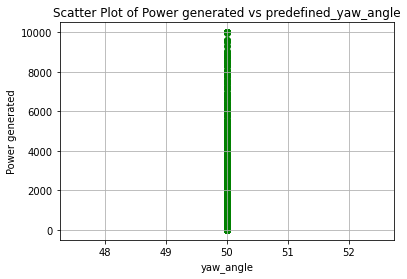

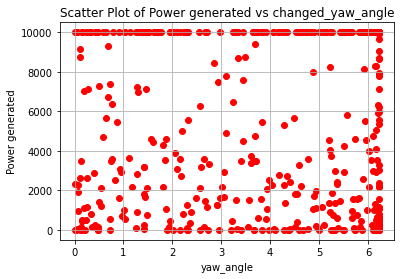

Power_list: [1265.2784703345942, 2971.1485726079454]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 51.48865090131881
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 1.488650901318816
farm_power_baseline : [1591.12792097    0.        ], farm_power_yaw : [3666.75939829   32.87356456]


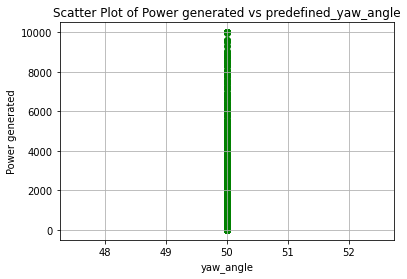

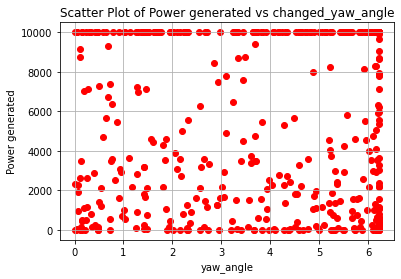

Power_list: [1591.1279209675179, 3688.604696218821]
Predefined Yaw Angle 1: 49.94516923894542
Predefined Yaw Angle 2: 51.87536426215148
Changed Yaw Angle 1: -0.05483076105457925
Changed Yaw Angle 2: 1.8753642621514781
Predefined Yaw Angle 1: 49.948127469961904
Predefined Yaw Angle 2: 56.11307247510488
Changed Yaw Angle 1: -0.05187253003809764
Changed Yaw Angle 2: 6.113072475104881
Predefined Yaw Angle 1: 56.227240970282324
Predefined Yaw Angle 2: 55.69942869669712
Changed Yaw Angle 1: 6.227240970282326
Changed Yaw Angle 2: 5.69942869669712
farm_power_baseline : [8453.73154778    0.        ], farm_power_yaw : [9999.99959191    0.        ]


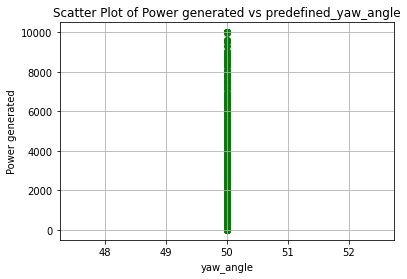

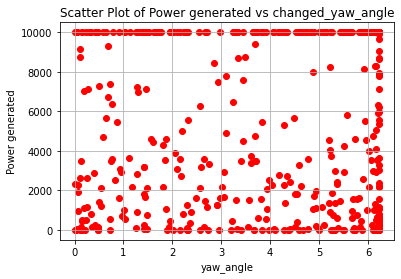

Power_list: [8453.731547781257, 10000.000557095045]
Predefined Yaw Angle 1: 56.22834351897362
Predefined Yaw Angle 2: 52.21914773252817
Changed Yaw Angle 1: 6.2283435189736185
Changed Yaw Angle 2: 2.219147732528172
farm_power_baseline : [3749.85909762   45.02493681], farm_power_yaw : [8483.33871128  248.35251716]


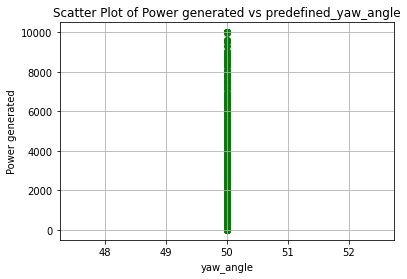

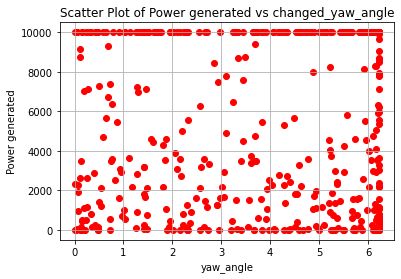

Power_list: [3749.8590976168657, 8534.26185430448]
Predefined Yaw Angle 1: 56.07749621587713
Predefined Yaw Angle 2: 50.46233299912163
Changed Yaw Angle 1: 6.077496215877132
Changed Yaw Angle 2: 0.4623329991216305
farm_power_baseline : [2993.63247226  330.75017565], farm_power_yaw : [6806.12753499  905.09046877]


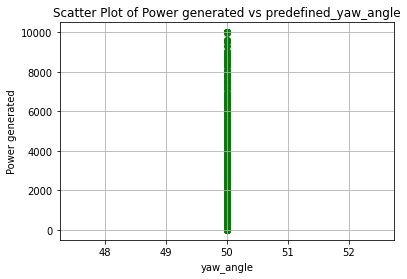

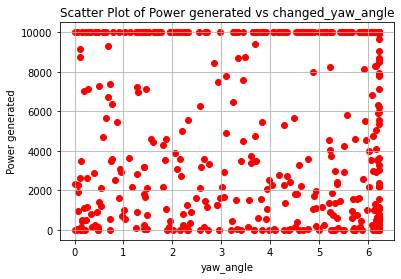

Power_list: [2993.632472258367, 6842.896398168245]
Predefined Yaw Angle 1: 55.93307938154875
Predefined Yaw Angle 2: 52.83025079101153
Changed Yaw Angle 1: 5.933079381548752
Changed Yaw Angle 2: 2.8302507910115313
farm_power_baseline : [179.59968722   0.        ], farm_power_yaw : [560.50870905   0.        ]


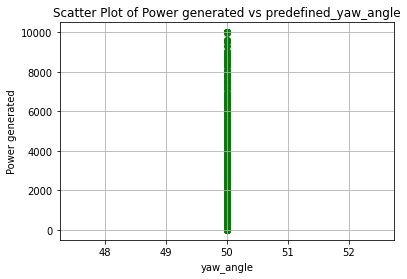

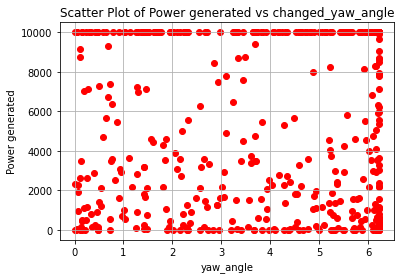

Power_list: [179.59968722010007, 565.020578844856]
Predefined Yaw Angle 1: 55.858056535744566
Predefined Yaw Angle 2: 55.39133451440469
Changed Yaw Angle 1: 5.8580565357445655
Changed Yaw Angle 2: 5.3913345144046865
farm_power_baseline : [   0.         4832.55357515], farm_power_yaw : [   0.         9999.99324094]


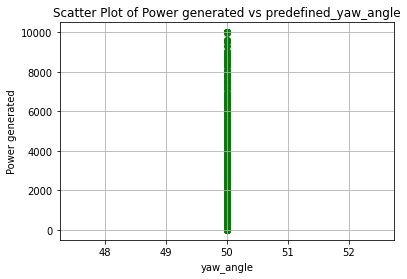

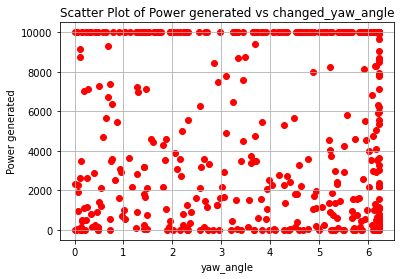

Power_list: [4832.553575150772, 9999.993957266222]
Predefined Yaw Angle 1: 56.22449684909511
Predefined Yaw Angle 2: 52.488655906418664
Changed Yaw Angle 1: 6.224496849095108
Changed Yaw Angle 2: 2.4886559064186646
farm_power_baseline : [  5.4286336  218.02994236], farm_power_yaw : [152.07848473 646.46795506]


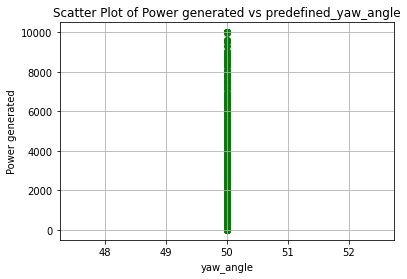

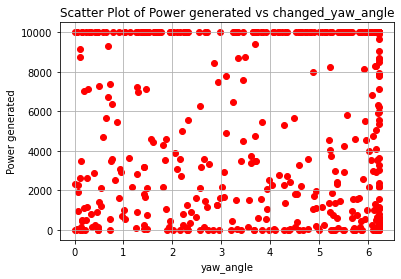

Power_list: [218.02994236319472, 651.345253232178]
Predefined Yaw Angle 1: 50.03159010628715
Predefined Yaw Angle 2: 55.23631616840892
Changed Yaw Angle 1: 0.03159010628714504
Changed Yaw Angle 2: 5.236316168408918
farm_power_baseline : [8810.41472614  894.70068903], farm_power_yaw : [10000.00418089  2151.05983428]


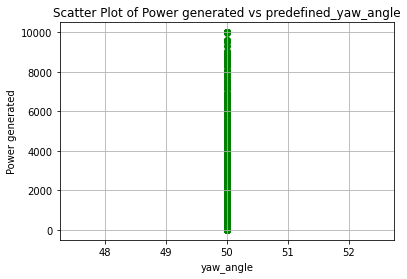

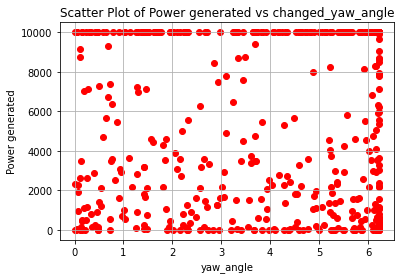

Power_list: [8810.41472614046, 10000.004399080057]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 51.21765508564341
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 1.217655085643405
Predefined Yaw Angle 1: 50.10032431329603
Predefined Yaw Angle 2: 56.124960826210994
Changed Yaw Angle 1: 0.10032431329602942
Changed Yaw Angle 2: 6.1249608262109945
farm_power_baseline : [9.3047351 6.7661109], farm_power_yaw : [160.40485011 155.13124488]


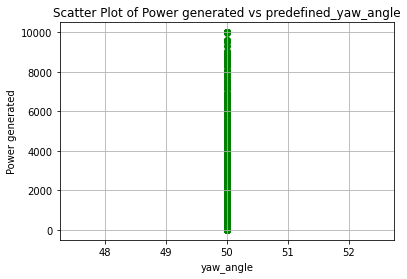

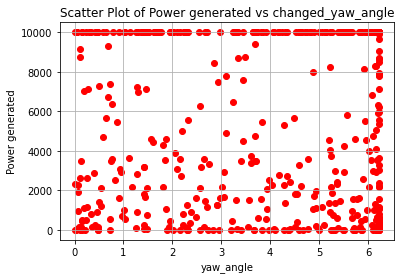

Power_list: [9.304735102265873, 161.80826996474775]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 53.56004587927365
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 3.5600458792736513
farm_power_baseline : [9999.99605814    0.        ], farm_power_yaw : [9999.99635142   22.86153882]


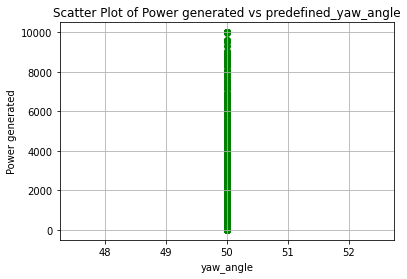

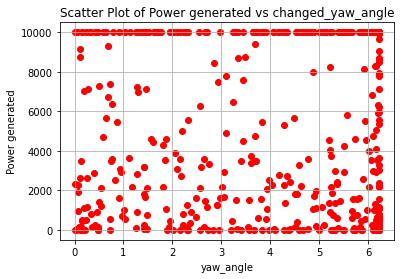

Power_list: [9999.996058144503, 9999.999570188633]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 52.96064927799395
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 2.9606492779939533
farm_power_baseline : [10000.00558416  5142.07879868], farm_power_yaw : [9999.99996351 9999.99685072]


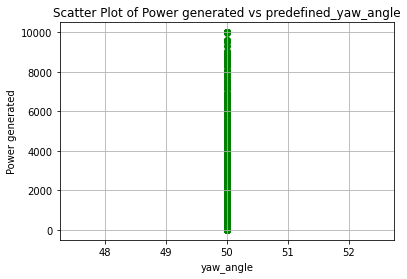

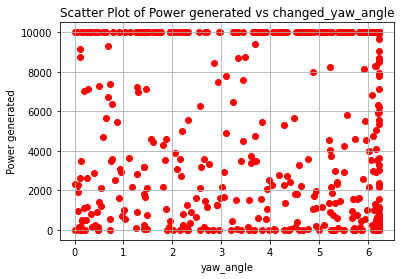

Power_list: [10000.005584164783, 9999.999963508671]
Predefined Yaw Angle 1: 55.92991075248378
Predefined Yaw Angle 2: 53.805116887001574
Changed Yaw Angle 1: 5.929910752483775
Changed Yaw Angle 2: 3.805116887001577
farm_power_baseline : [   0.         7237.59216405], farm_power_yaw : [   85.98892059 10000.0036338 ]


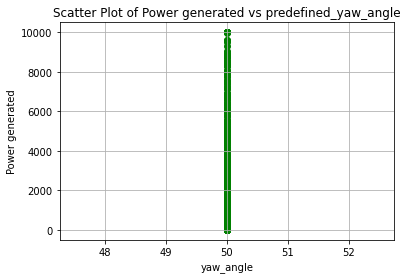

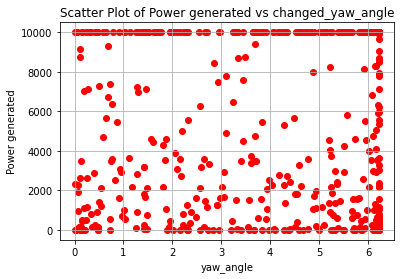

Power_list: [7237.592164053182, 10000.004014661898]
Predefined Yaw Angle 1: 56.228329137903735
Predefined Yaw Angle 2: 53.067174922648796
Changed Yaw Angle 1: 6.228329137903732
Changed Yaw Angle 2: 3.0671749226487957
farm_power_baseline : [10000.00304951  3701.80852681], farm_power_yaw : [9999.96508826 8373.86027767]


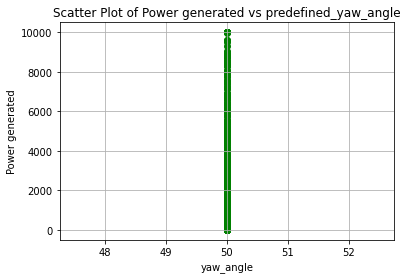

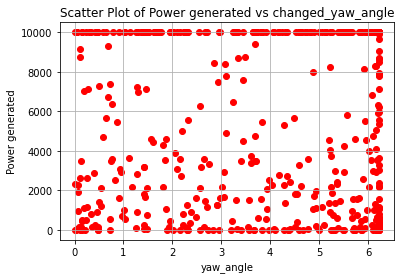

Power_list: [10000.003049513529, 9999.965088264495]
Predefined Yaw Angle 1: 56.2283429863414
Predefined Yaw Angle 2: 52.50493607647843
Changed Yaw Angle 1: 6.228342986341401
Changed Yaw Angle 2: 2.504936076478428
farm_power_baseline : [9999.99671797    0.        ], farm_power_yaw : [9999.97952482  108.60638069]


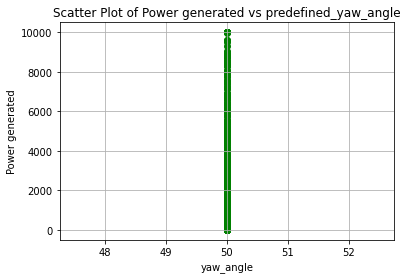

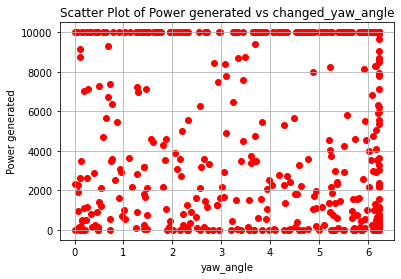

Power_list: [9999.996717972967, 9999.979524816248]
Predefined Yaw Angle 1: 49.945200697535796
Predefined Yaw Angle 2: 52.796927721555804
Changed Yaw Angle 1: -0.05479930246420269
Changed Yaw Angle 2: 2.796927721555806
Predefined Yaw Angle 1: 56.21077997158454
Predefined Yaw Angle 2: 51.20154003157123
Changed Yaw Angle 1: 6.210779971584546
Changed Yaw Angle 2: 1.2015400315712266
farm_power_baseline : [7488.44380034 2372.40457978], farm_power_yaw : [10000.00040883  5415.78282455]


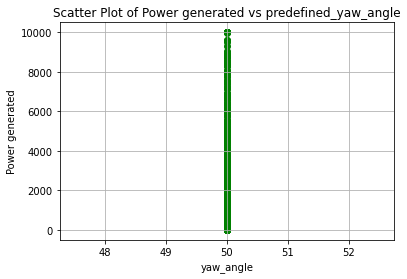

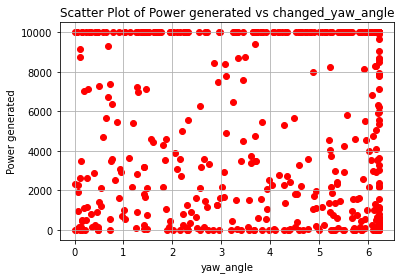

Power_list: [7488.443800344526, 10000.00040882784]
Predefined Yaw Angle 1: 56.22829078838404
Predefined Yaw Angle 2: 51.719879463490784
Changed Yaw Angle 1: 6.228290788384035
Changed Yaw Angle 2: 1.7198794634907824
farm_power_baseline : [1533.49374172 4018.69557421], farm_power_yaw : [3538.950453   9085.54025739]


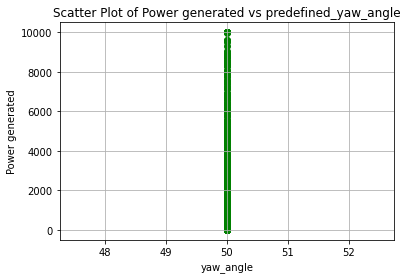

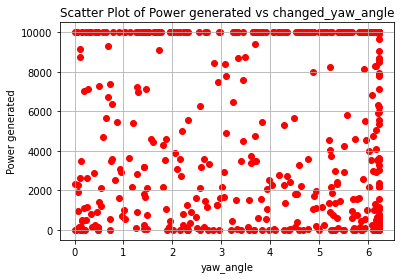

Power_list: [4018.6955742091377, 9138.466269642331]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 55.9751569496296
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 5.975156949629602
Predefined Yaw Angle 1: 56.22832487684599
Predefined Yaw Angle 2: 55.49121264266258
Changed Yaw Angle 1: 6.2283248768459885
Changed Yaw Angle 2: 5.491212642662583
farm_power_baseline : [9999.99461729    0.        ], farm_power_yaw : [10000.0077016     0.       ]


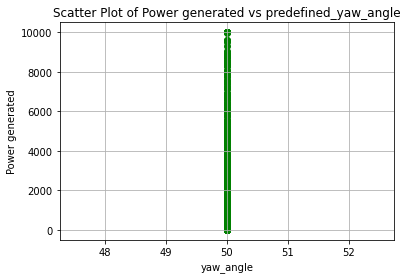

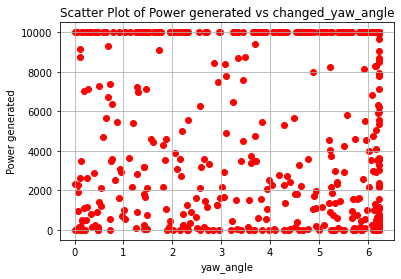

Power_list: [9999.99461728607, 10000.007701598275]
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 54.675901853901365
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 4.675901853901364
farm_power_baseline : [ 139.01093619 2975.97716118], farm_power_yaw : [ 464.76381677 6743.03317447]


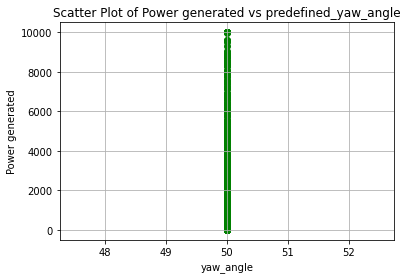

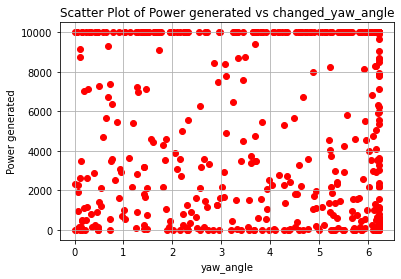

Power_list: [2975.977161179166, 6802.959443296981]
Predefined Yaw Angle 1: 55.72305876955958
Predefined Yaw Angle 2: 54.94711178772842
Changed Yaw Angle 1: 5.723058769559577
Changed Yaw Angle 2: 4.947111787728418
farm_power_baseline : [ 168.13591956 3247.61314281], farm_power_yaw : [ 529.28932763 7359.26929084]


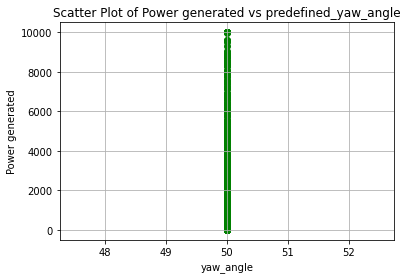

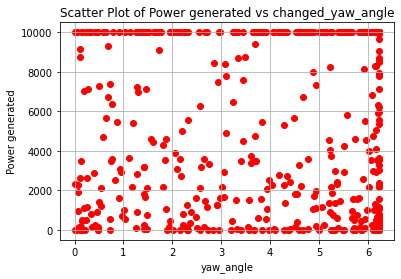

Power_list: [3247.6131428108383, 7417.485563431986]
Predefined Yaw Angle 1: 49.973981749913584
Predefined Yaw Angle 2: 55.051491190860766
Changed Yaw Angle 1: -0.026018250086418154
Changed Yaw Angle 2: 5.051491190860765
Predefined Yaw Angle 1: 55.58201509506789
Predefined Yaw Angle 2: 50.387519977121826
Changed Yaw Angle 1: 5.582015095067891
Changed Yaw Angle 2: 0.3875199771218289
farm_power_baseline : [ 403.9787111  2881.88660812], farm_power_yaw : [1056.98880457 6567.75944296]


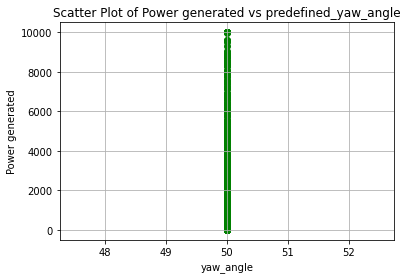

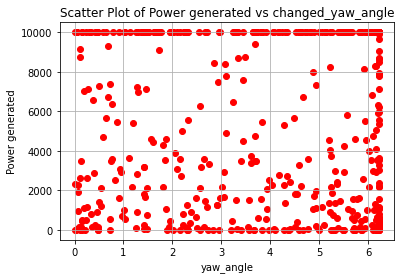

Power_list: [2881.8866081221063, 6595.806737033063]
Predefined Yaw Angle 1: 52.746549879305505
Predefined Yaw Angle 2: 51.7017818191451
Changed Yaw Angle 1: 2.7465498793055065
Changed Yaw Angle 2: 1.7017818191450944
farm_power_baseline : [2081.82461925 6729.17472952], farm_power_yaw : [ 4770.27374182 10000.00523727]


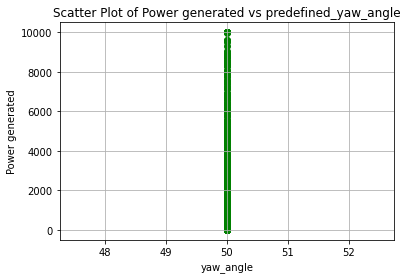

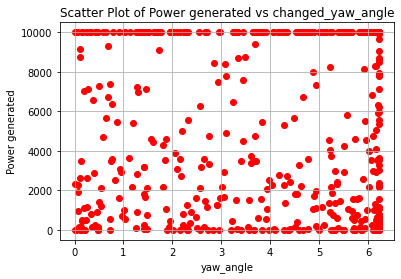

Power_list: [6729.174729523701, 10000.005237269406]
Predefined Yaw Angle 1: 49.945170362466506
Predefined Yaw Angle 2: 50.5296485901521
Changed Yaw Angle 1: -0.054829637533494374
Changed Yaw Angle 2: 0.5296485901521001
Predefined Yaw Angle 1: 54.74845419598858
Predefined Yaw Angle 2: 49.93640640018757
Changed Yaw Angle 1: 4.748454195988577
Changed Yaw Angle 2: -0.0635935998124254
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 55.29877635071898
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 5.298776350718983
farm_power_baseline : [2809.10931473 1818.40217167], farm_power_yaw : [6383.94154648 4162.43312528]


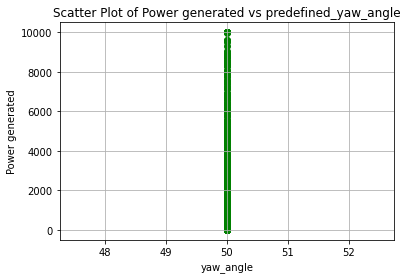

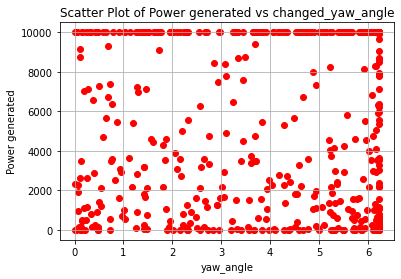

Power_list: [2809.1093147250617, 6443.358598755095]
Predefined Yaw Angle 1: 49.94691481620429
Predefined Yaw Angle 2: 54.43032591083076
Changed Yaw Angle 1: -0.05308518379570841
Changed Yaw Angle 2: 4.430325910830759
Predefined Yaw Angle 1: 49.95048536621203
Predefined Yaw Angle 2: 55.72053105254269
Changed Yaw Angle 1: -0.049514633787968734
Changed Yaw Angle 2: 5.72053105254269
Predefined Yaw Angle 1: 56.22229761066692
Predefined Yaw Angle 2: 51.003918298669134
Changed Yaw Angle 1: 6.222297610666921
Changed Yaw Angle 2: 1.0039182986691337
farm_power_baseline : [1237.05442043 3928.74379953], farm_power_yaw : [2889.6154738  8880.58642335]


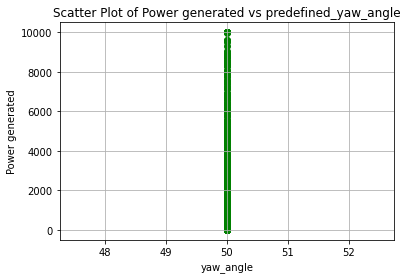

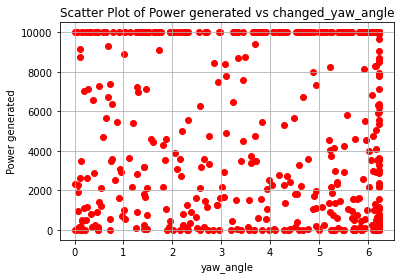

Power_list: [3928.7437995340097, 8929.464557655298]
Predefined Yaw Angle 1: 49.94516886443839
Predefined Yaw Angle 2: 54.194779166109285
Changed Yaw Angle 1: -0.05483113556160755
Changed Yaw Angle 2: 4.194779166109284
Predefined Yaw Angle 1: 49.94516980070596
Predefined Yaw Angle 2: 55.49714137188132
Changed Yaw Angle 1: -0.05483019929403681
Changed Yaw Angle 2: 5.497141371881317
Predefined Yaw Angle 1: 49.94518702802927
Predefined Yaw Angle 2: 50.42444167629004
Changed Yaw Angle 1: -0.05481297197073536
Changed Yaw Angle 2: 0.4244416762900376
Predefined Yaw Angle 1: 56.22808838814119
Predefined Yaw Angle 2: 53.21664297461673
Changed Yaw Angle 1: 6.228088388141189
Changed Yaw Angle 2: 3.2166429746167298
farm_power_baseline : [  0.         604.36856291], farm_power_yaw : [   0.         1504.77038747]


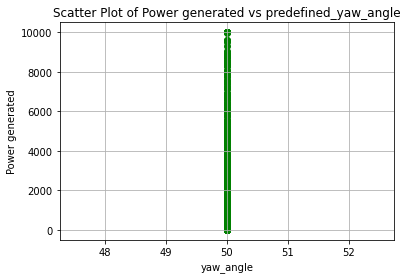

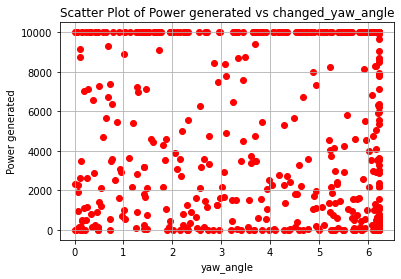

Power_list: [604.3685629087598, 1516.4112520610252]
Predefined Yaw Angle 1: 56.2283280726393
Predefined Yaw Angle 2: 53.75443426829628
Changed Yaw Angle 1: 6.228328072639297
Changed Yaw Angle 2: 3.754434268296279
farm_power_baseline : [3156.8544975  1785.21108819], farm_power_yaw : [7158.87690337 4089.79311197]


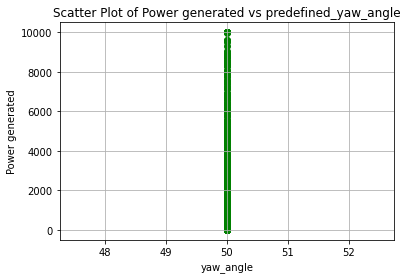

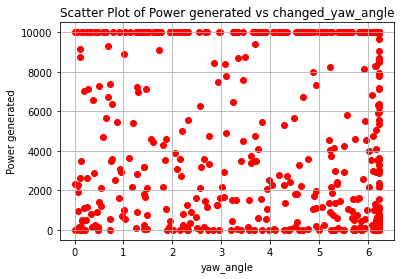

Power_list: [3156.8544975042805, 7158.876903367625]
Predefined Yaw Angle 1: 54.60761878069413
Predefined Yaw Angle 2: 55.055698452750875
Changed Yaw Angle 1: 4.607618780694135
Changed Yaw Angle 2: 5.055698452750873
farm_power_baseline : [ 478.43225299 4833.20089601], farm_power_yaw : [1227.09053986 9999.99343959]


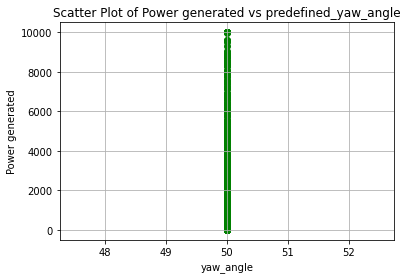

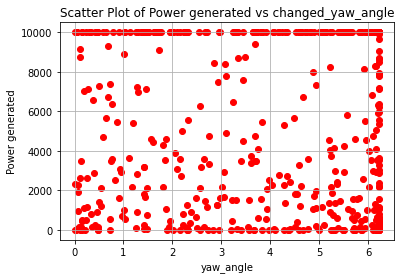

Power_list: [4833.200896013518, 9999.99396839903]
Predefined Yaw Angle 1: 50.91930545402684
Predefined Yaw Angle 2: 54.903193065559705
Changed Yaw Angle 1: 0.919305454026838
Changed Yaw Angle 2: 4.903193065559703
farm_power_baseline : [1684.04683308 5339.05538647], farm_power_yaw : [3546.08331076 9999.99429169]


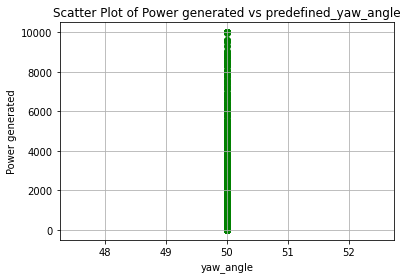

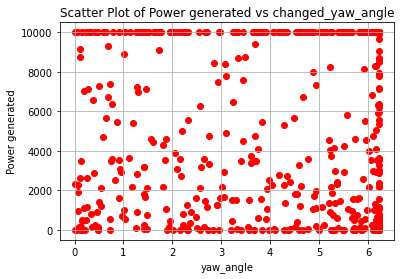

Power_list: [5339.055386469045, 9999.996368612094]
Predefined Yaw Angle 1: 55.04754529589989
Predefined Yaw Angle 2: 53.73782493152578
Changed Yaw Angle 1: 5.047545295899888
Changed Yaw Angle 2: 3.7378249315257817
farm_power_baseline : [10000.00427392     0.        ], farm_power_yaw : [9999.97149778    0.        ]


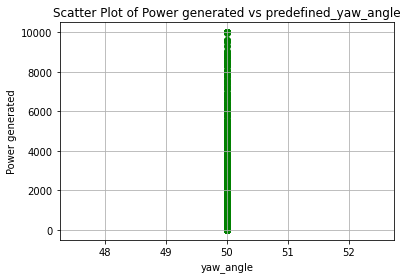

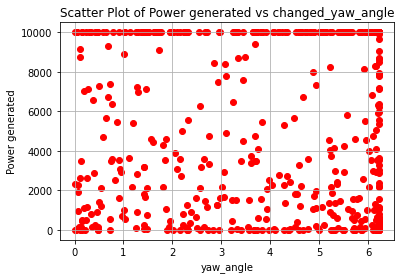

Power_list: [10000.004273924922, 9999.971497776376]
Predefined Yaw Angle 1: 55.27774467946859
Predefined Yaw Angle 2: 51.796320842049596
Changed Yaw Angle 1: 5.277744679468593
Changed Yaw Angle 2: 1.7963208420495993
farm_power_baseline : [3012.88550997  103.94775456], farm_power_yaw : [6855.62738968  389.69283667]


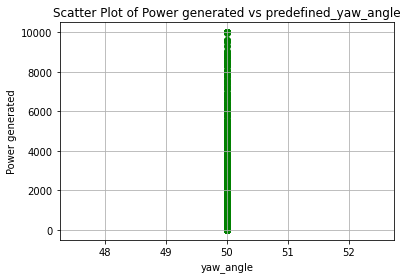

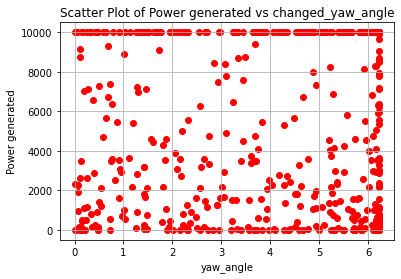

Power_list: [3012.8855099675375, 6886.457749542218]
Predefined Yaw Angle 1: 55.85399681297885
Predefined Yaw Angle 2: 53.88892603387415
Changed Yaw Angle 1: 5.853996812978848
Changed Yaw Angle 2: 3.8889260338741525
farm_power_baseline : [2332.9178428  3331.74856351], farm_power_yaw : [5324.68757762 7557.1311939 ]


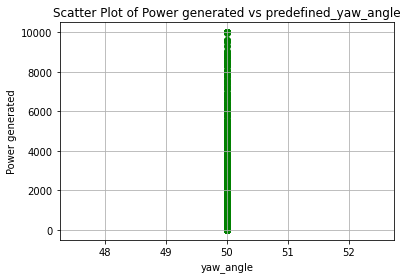

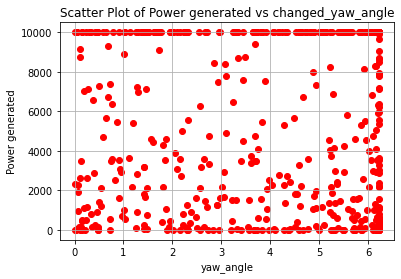

Power_list: [3331.7485635091502, 7557.131193902895]
Predefined Yaw Angle 1: 55.562978286963784
Predefined Yaw Angle 2: 51.90910491526613
Changed Yaw Angle 1: 5.562978286963785
Changed Yaw Angle 2: 1.9091049152661281
farm_power_baseline : [3253.73027671    0.        ], farm_power_yaw : [7396.11253218   68.35819023]


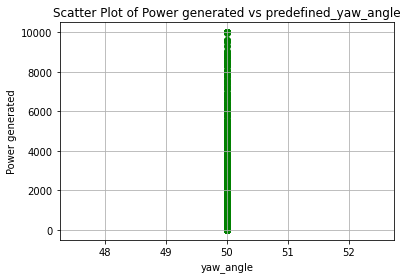

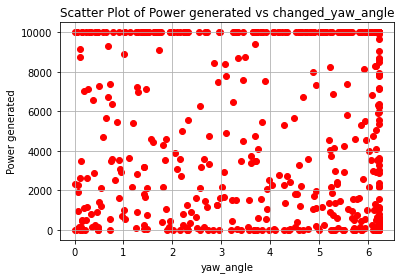

Power_list: [3253.7302767135902, 7431.324446414365]
Predefined Yaw Angle 1: 55.309326574203624
Predefined Yaw Angle 2: 55.601235284144806
Changed Yaw Angle 1: 5.309326574203625
Changed Yaw Angle 2: 5.601235284144808
farm_power_baseline : [10000.00414448   895.27951704], farm_power_yaw : [9999.97113041 2142.46748796]


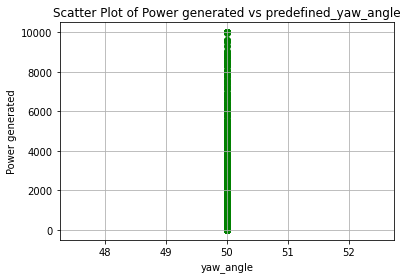

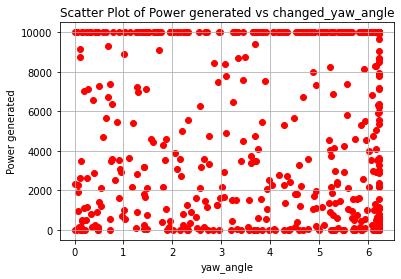

Power_list: [10000.004144479886, 9999.971130413243]
Predefined Yaw Angle 1: 55.14142332222183
Predefined Yaw Angle 2: 52.25050272593833
Changed Yaw Angle 1: 5.1414233222218355
Changed Yaw Angle 2: 2.250502725938329
farm_power_baseline : [  0.         102.09117527], farm_power_yaw : [  0.         385.56017811]


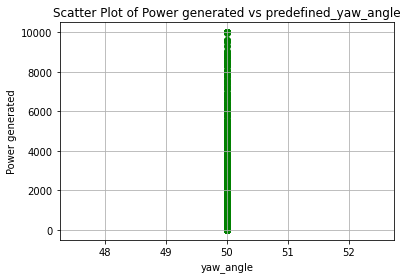

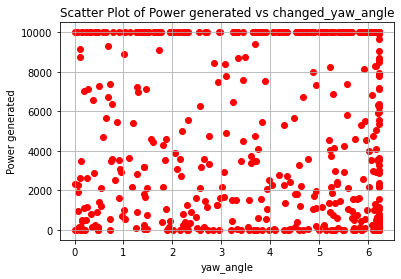

Power_list: [102.09117526590272, 387.96736684614746]
Predefined Yaw Angle 1: 54.81131172193328
Predefined Yaw Angle 2: 54.86712587491676
Changed Yaw Angle 1: 4.811311721933281
Changed Yaw Angle 2: 4.86712587491676
farm_power_baseline : [   0.         9999.99581258], farm_power_yaw : [   0.        9999.9993913]


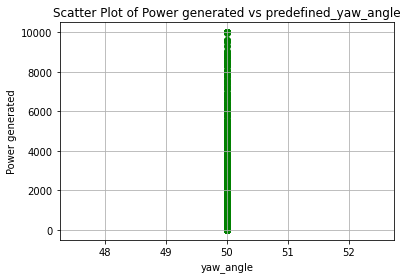

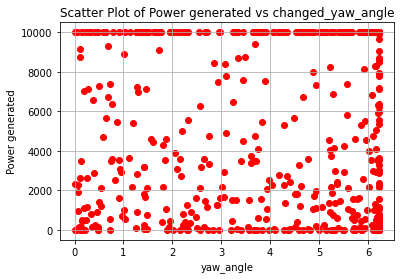

Power_list: [9999.995812583878, 9999.999391296242]
Predefined Yaw Angle 1: 54.90906837606682
Predefined Yaw Angle 2: 51.5585500915018
Changed Yaw Angle 1: 4.90906837606682
Changed Yaw Angle 2: 1.558550091501799
farm_power_baseline : [10000.00455306  8121.75999251], farm_power_yaw : [10000.01238889  9999.99632996]


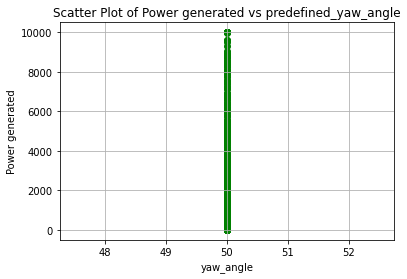

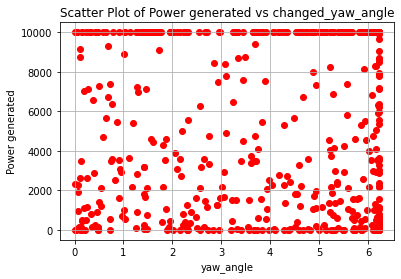

Power_list: [10000.004553056355, 10000.012388888012]
Predefined Yaw Angle 1: 53.116231792334894
Predefined Yaw Angle 2: 52.214860309489254
Changed Yaw Angle 1: 3.1162317923348937
Changed Yaw Angle 2: 2.214860309489253
farm_power_baseline : [1215.78064779 6285.66688683], farm_power_yaw : [ 2852.05419613 10000.00445707]


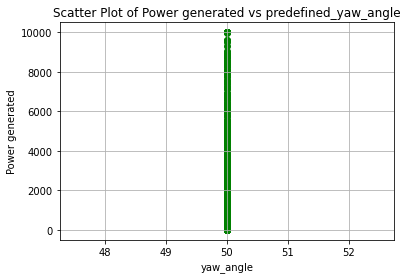

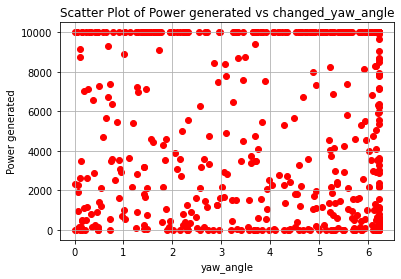

Power_list: [6285.666886834975, 10000.00464446776]
Predefined Yaw Angle 1: 55.842082362894054
Predefined Yaw Angle 2: 52.82046074452829
Changed Yaw Angle 1: 5.842082362894052
Changed Yaw Angle 2: 2.820460744528291
farm_power_baseline : [3910.62027859 9999.99746103], farm_power_yaw : [ 8835.95409888 10000.0145662 ]


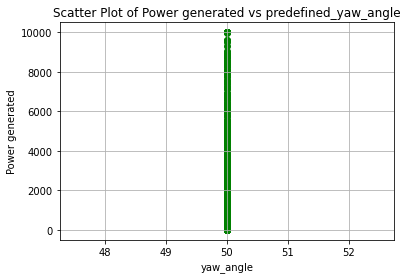

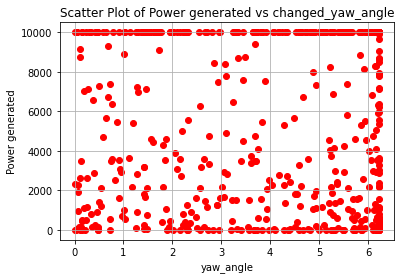

Power_list: [9999.997461027644, 10000.014566196554]
Predefined Yaw Angle 1: 55.659262213014514
Predefined Yaw Angle 2: 50.702566108413315
Changed Yaw Angle 1: 5.659262213014511
Changed Yaw Angle 2: 0.7025661084133182
farm_power_baseline : [   0.         9999.99142365], farm_power_yaw : [   14.26038803 10000.01593753]


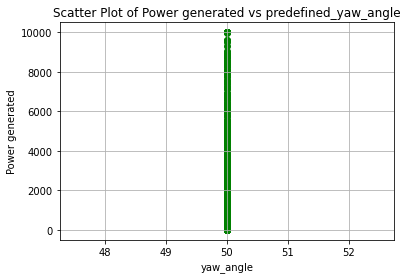

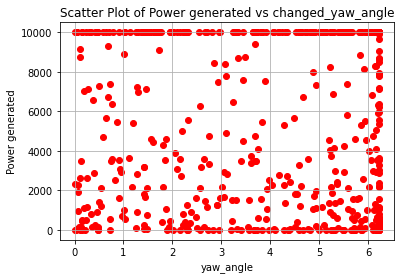

Power_list: [9999.991423651492, 10000.015937527043]
Predefined Yaw Angle 1: 54.59044192429534
Predefined Yaw Angle 2: 56.103950615739144
Changed Yaw Angle 1: 4.590441924295342
Changed Yaw Angle 2: 6.103950615739142
farm_power_baseline : [ 413.42776409 9999.99914326], farm_power_yaw : [ 1072.23970571 10000.01438992]


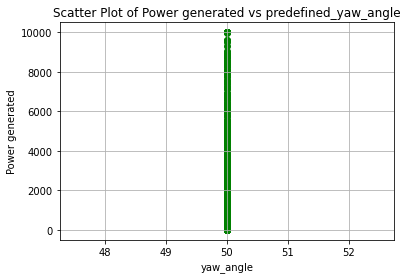

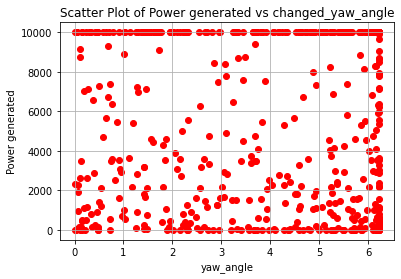

Power_list: [9999.999143260711, 10000.014389924496]
Predefined Yaw Angle 1: 54.43254257063232
Predefined Yaw Angle 2: 55.703073498965004
Changed Yaw Angle 1: 4.432542570632325
Changed Yaw Angle 2: 5.7030734989650025
farm_power_baseline : [8988.58203301  606.1201758 ], farm_power_yaw : [10000.00393084  1507.94558802]


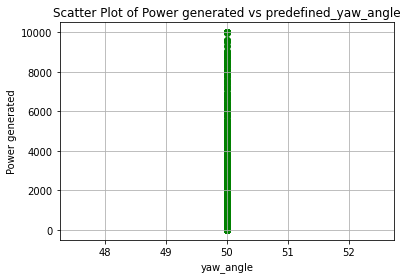

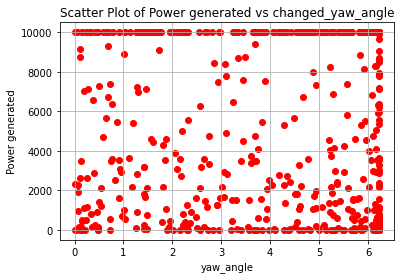

Power_list: [8988.58203301114, 10000.003930840912]
Predefined Yaw Angle 1: 52.75870135072732
Predefined Yaw Angle 2: 55.93907697581343
Changed Yaw Angle 1: 2.75870135072732
Changed Yaw Angle 2: 5.939076975813426
farm_power_baseline : [1740.1701339  2029.78988953], farm_power_yaw : [3995.23700285 4636.23824911]


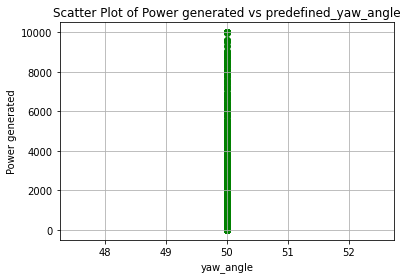

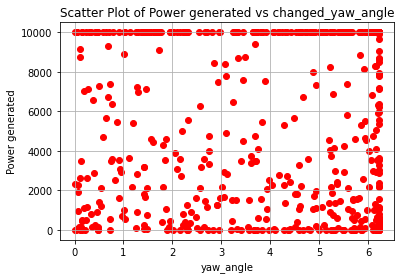

Power_list: [2029.789889529015, 4664.072853202117]
Predefined Yaw Angle 1: 54.146634384433014
Predefined Yaw Angle 2: 55.169840471807234
Changed Yaw Angle 1: 4.146634384433016
Changed Yaw Angle 2: 5.169840471807233
farm_power_baseline : [ 0.         71.29488642], farm_power_yaw : [  0.         318.03367353]


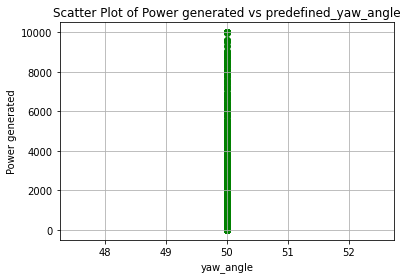

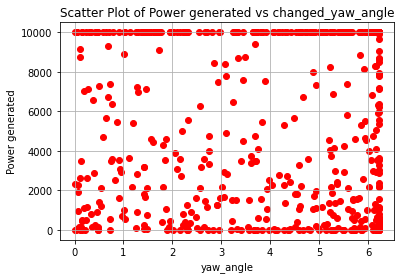

Power_list: [71.29488642354889, 322.3596372059523]
Predefined Yaw Angle 1: 54.31269952263043
Predefined Yaw Angle 2: 50.966432175797394
Changed Yaw Angle 1: 4.3126995226304325
Changed Yaw Angle 2: 0.9664321757973964
farm_power_baseline : [9999.99187555  226.71794573], farm_power_yaw : [10000.01731021   667.30259967]


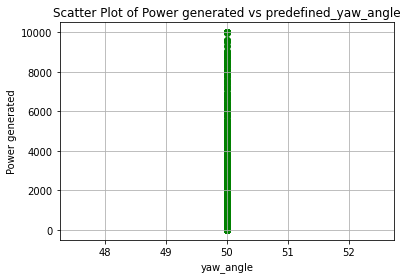

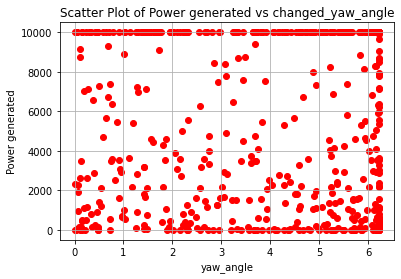

Power_list: [9999.991875549935, 10000.017808020173]
Predefined Yaw Angle 1: 55.57305835168974
Predefined Yaw Angle 2: 51.4006053309422
Changed Yaw Angle 1: 5.573058351689736
Changed Yaw Angle 2: 1.4006053309421969
farm_power_baseline : [898.59475715   0.        ], farm_power_yaw : [2157.50894803   26.14433821]


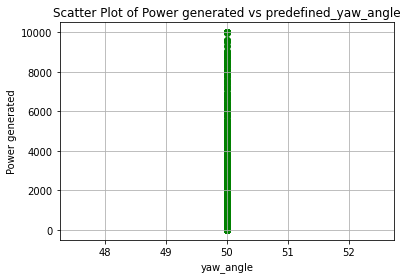

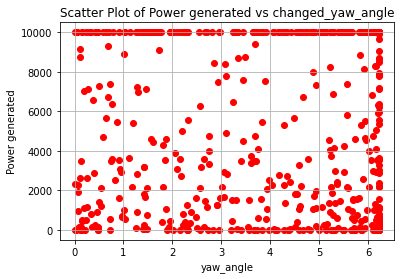

Power_list: [898.5947571464776, 2167.5928352864225]
Predefined Yaw Angle 1: 51.18935538146208
Predefined Yaw Angle 2: 54.31458599512035
Changed Yaw Angle 1: 1.1893553814620803
Changed Yaw Angle 2: 4.314585995120352
farm_power_baseline : [ 173.01140234 1768.52445199], farm_power_yaw : [ 544.96095321 4070.52019877]


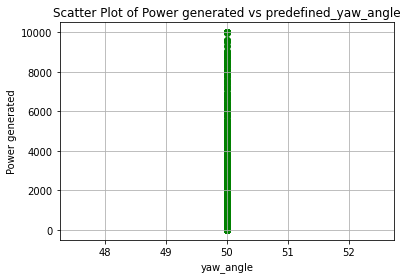

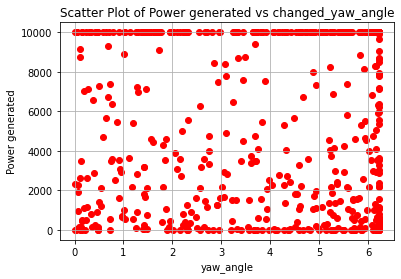

Power_list: [1768.524451990415, 4081.5653545292216]
Predefined Yaw Angle 1: 54.73139505130997
Predefined Yaw Angle 2: 51.24490175359795
Changed Yaw Angle 1: 4.731395051309965
Changed Yaw Angle 2: 1.2449017535979512
farm_power_baseline : [  65.87197503 2980.88434102], farm_power_yaw : [ 306.21656183 6790.40146065]


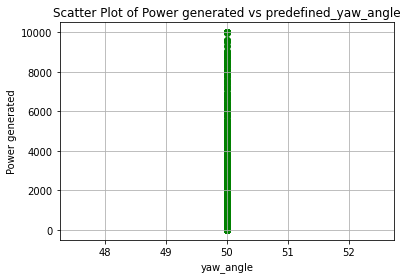

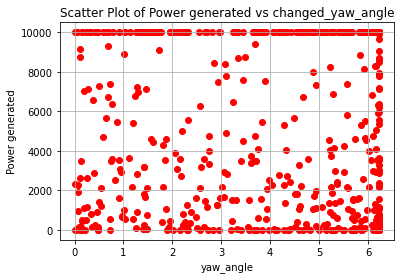

Power_list: [2980.884341023221, 6814.0610292218535]
Predefined Yaw Angle 1: 55.778932421861654
Predefined Yaw Angle 2: 54.96302630577051
Changed Yaw Angle 1: 5.778932421861657
Changed Yaw Angle 2: 4.963026305770513
farm_power_baseline : [8773.12536105   89.40054233], farm_power_yaw : [10000.00348688   355.53813312]


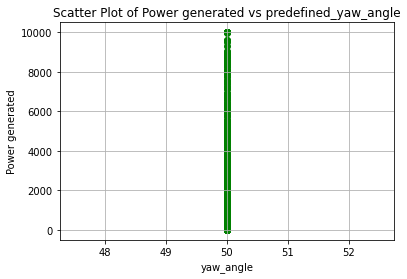

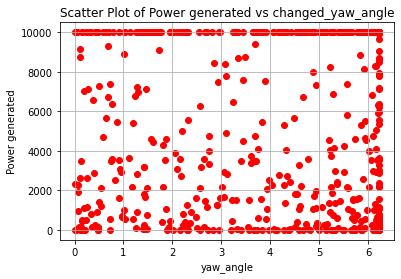

Power_list: [8773.125361045944, 10000.004283121787]
Predefined Yaw Angle 1: 52.835360176389145
Predefined Yaw Angle 2: 55.78067215417551
Changed Yaw Angle 1: 2.8353601763891416
Changed Yaw Angle 2: 5.780672154175513
farm_power_baseline : [425.68355799   0.        ], farm_power_yaw : [1104.12981418    0.        ]


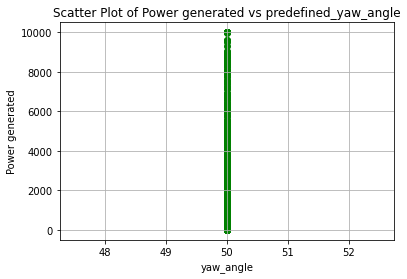

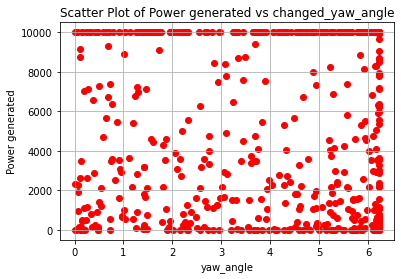

Power_list: [425.68355799285825, 1111.7663375004693]
Predefined Yaw Angle 1: 51.46861445336779
Predefined Yaw Angle 2: 54.6630068279032
Changed Yaw Angle 1: 1.4686144533677892
Changed Yaw Angle 2: 4.6630068279032
farm_power_baseline : [   0.         6691.21964462], farm_power_yaw : [    0.         10000.00536014]


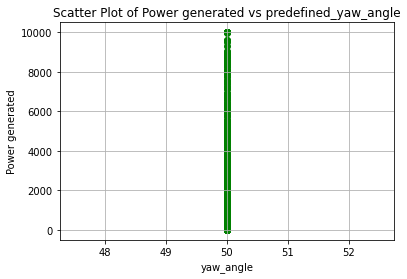

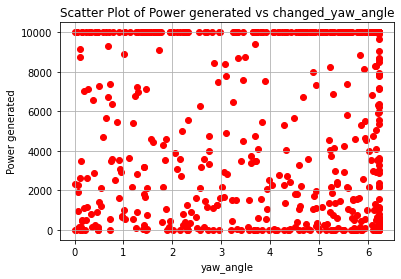

Power_list: [6691.219644616012, 10000.005360140694]
Predefined Yaw Angle 1: 54.57440809663641
Predefined Yaw Angle 2: 55.082061084381564
Changed Yaw Angle 1: 4.57440809663641
Changed Yaw Angle 2: 5.082061084381567
farm_power_baseline : [ 343.43174008 3199.87566202], farm_power_yaw : [ 934.60667889 7262.16965666]


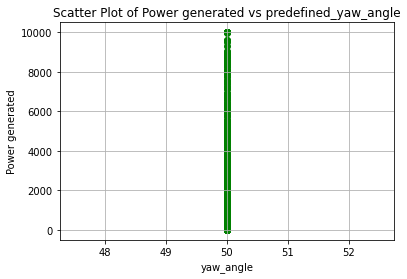

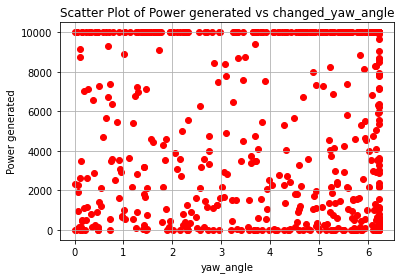

Power_list: [3199.875662015322, 7309.488350831243]
Predefined Yaw Angle 1: 55.791726247738396
Predefined Yaw Angle 2: 52.80059036700299
Changed Yaw Angle 1: 5.7917262477383975
Changed Yaw Angle 2: 2.8005903670029917
farm_power_baseline : [6705.63294925 5783.74708406], farm_power_yaw : [10000.00536686  9999.99682343]


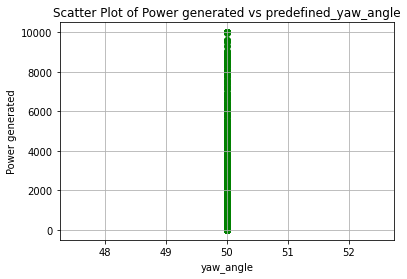

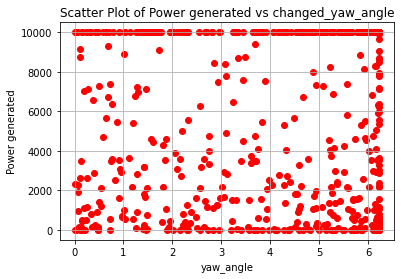

Power_list: [6705.632949249638, 10000.005366862071]
Predefined Yaw Angle 1: 55.98770347866737
Predefined Yaw Angle 2: 55.565471161233916
Changed Yaw Angle 1: 5.987703478667367
Changed Yaw Angle 2: 5.565471161233916
farm_power_baseline : [9999.99952474  866.16351888], farm_power_yaw : [10000.01435723  2079.35748613]


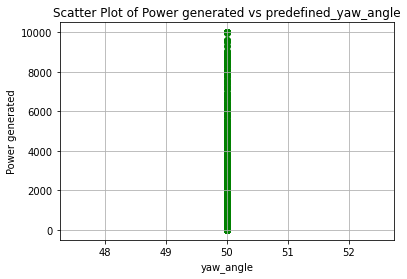

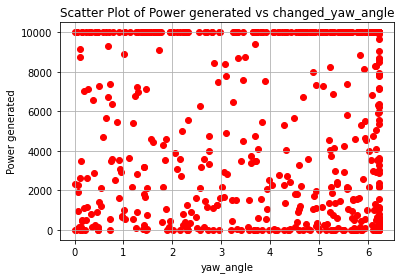

Power_list: [9999.999524742541, 10000.014357230011]
Predefined Yaw Angle 1: 55.64566677564966
Predefined Yaw Angle 2: 56.16391914453333
Changed Yaw Angle 1: 5.645666775649656
Changed Yaw Angle 2: 6.163919144533328
farm_power_baseline : [ 627.67536469 9999.99540481], farm_power_yaw : [ 1551.63351092 10000.00324209]


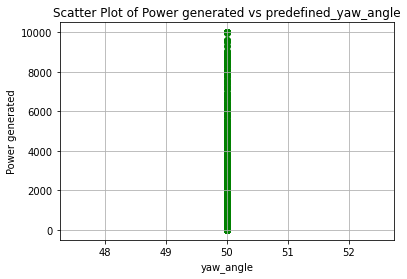

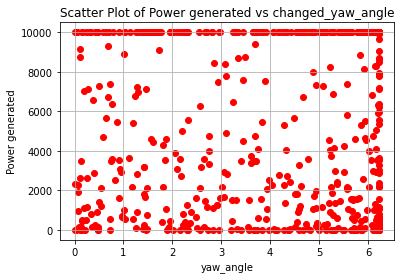

Power_list: [9999.995404813837, 10000.003242092836]
Predefined Yaw Angle 1: 55.65162746280147
Predefined Yaw Angle 2: 54.68912018765586
Changed Yaw Angle 1: 5.651627462801471
Changed Yaw Angle 2: 4.689120187655863
farm_power_baseline : [7416.25730208 8798.63974722], farm_power_yaw : [10000.00147768 10000.00384001]


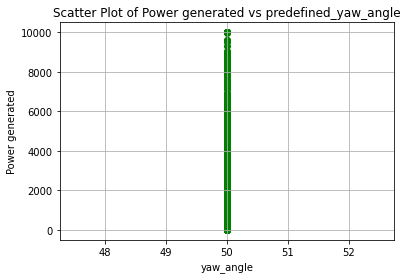

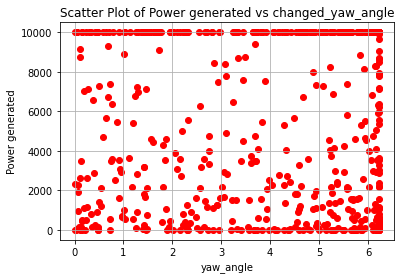

Power_list: [8798.639747218098, 10000.004450508939]
Predefined Yaw Angle 1: 54.894460404855515
Predefined Yaw Angle 2: 51.45459173413779
Changed Yaw Angle 1: 4.894460404855517
Changed Yaw Angle 2: 1.4545917341377927
farm_power_baseline : [3365.16523188 5696.58108912], farm_power_yaw : [7656.57293862 9999.99586563]


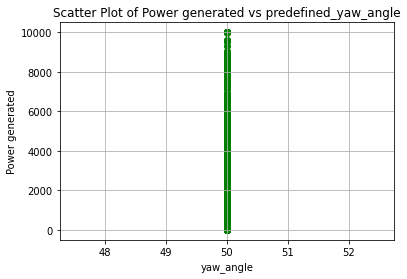

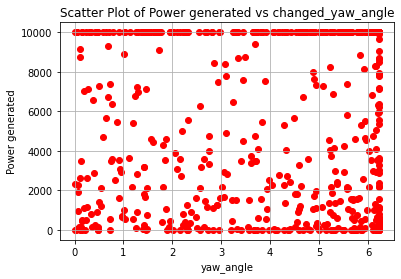

Power_list: [5696.581089115153, 9999.996041723409]
Predefined Yaw Angle 1: 55.093597210101755
Predefined Yaw Angle 2: 55.5346850190326
Changed Yaw Angle 1: 5.093597210101756
Changed Yaw Angle 2: 5.5346850190326
farm_power_baseline : [4894.83950247    0.        ], farm_power_yaw : [9999.99432609    0.        ]


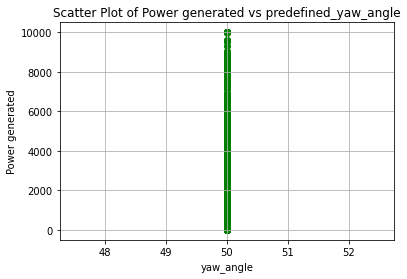

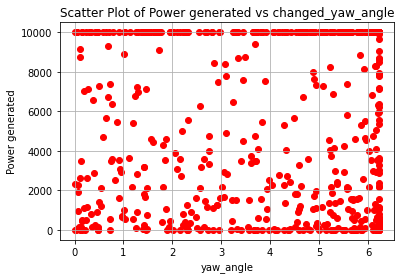

Power_list: [4894.839502467066, 9999.99496822404]
Predefined Yaw Angle 1: 50.004205590617865
Predefined Yaw Angle 2: 52.07653745352525
Changed Yaw Angle 1: 0.004205590617862829
Changed Yaw Angle 2: 2.0765374535252463
farm_power_baseline : [7823.38782183 9949.68030278], farm_power_yaw : [ 9999.99594731 10000.00555591]


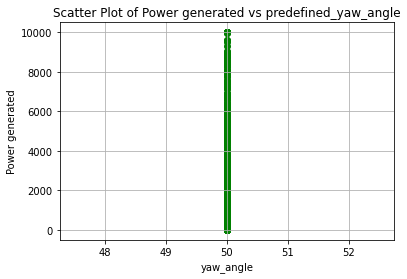

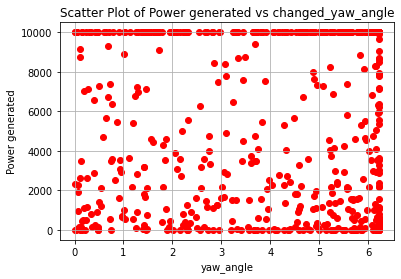

Power_list: [9949.68030278021, 10000.005664521997]
Predefined Yaw Angle 1: 55.01515539809013
Predefined Yaw Angle 2: 55.610503617370505
Changed Yaw Angle 1: 5.015155398090126
Changed Yaw Angle 2: 5.610503617370502
farm_power_baseline : [8194.30672708 1819.0491759 ], farm_power_yaw : [9999.99677186 4170.46581795]


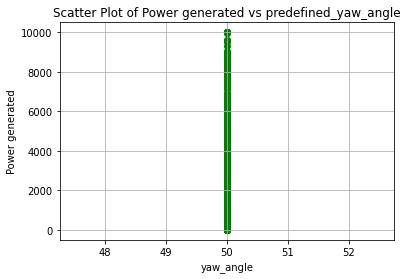

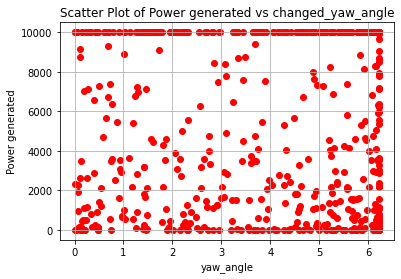

Power_list: [8194.306727082141, 9999.997530662538]
Predefined Yaw Angle 1: 55.51007352664492
Predefined Yaw Angle 2: 55.166149330536385
Changed Yaw Angle 1: 5.510073526644926
Changed Yaw Angle 2: 5.166149330536383
farm_power_baseline : [4223.74719909 8848.08433621], farm_power_yaw : [ 9505.40175988 10000.00434462]


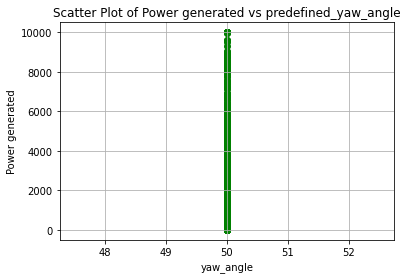

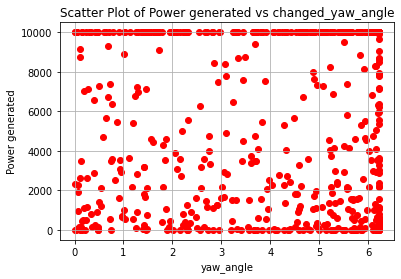

Power_list: [8848.084336214, 10000.004344622446]
Predefined Yaw Angle 1: 55.89023923962152
Predefined Yaw Angle 2: 51.222256229058736
Changed Yaw Angle 1: 5.890239239621519
Changed Yaw Angle 2: 1.2222562290587349
farm_power_baseline : [9999.99631957 9999.99578221], farm_power_yaw : [ 9999.98667267 10000.00853156]


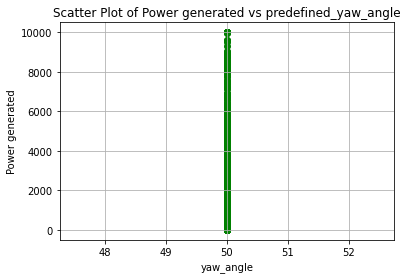

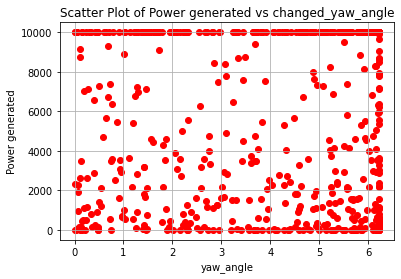

Power_list: [9999.99631956638, 10000.010814278778]
Predefined Yaw Angle 1: 54.60696097990488
Predefined Yaw Angle 2: 50.83384210697492
Changed Yaw Angle 1: 4.606960979904885
Changed Yaw Angle 2: 0.8338421069749211
farm_power_baseline : [10000.00529292  7116.28993445], farm_power_yaw : [ 9999.99408029 10000.0043357 ]


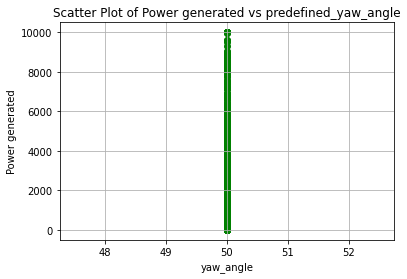

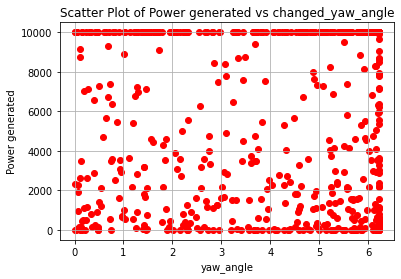

Power_list: [10000.005292923064, 10000.004335702171]
Predefined Yaw Angle 1: 55.55176424824568
Predefined Yaw Angle 2: 55.94134811959105
Changed Yaw Angle 1: 5.55176424824568
Changed Yaw Angle 2: 5.941348119591046
farm_power_baseline : [8097.65696479  592.02951538], farm_power_yaw : [9999.99552071 1473.33078457]


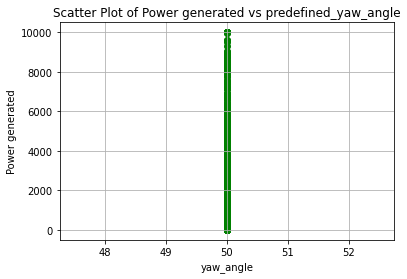

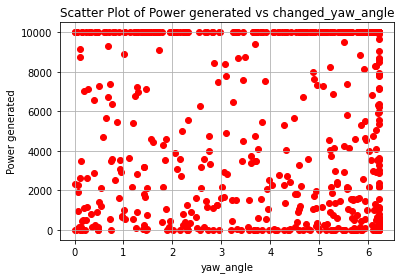

Power_list: [8097.656964787758, 9999.99640315291]
Predefined Yaw Angle 1: 55.81541240247356
Predefined Yaw Angle 2: 55.739748955600916
Changed Yaw Angle 1: 5.815412402473562
Changed Yaw Angle 2: 5.73974895560092
farm_power_baseline : [ 1453.17353867 10000.00440603], farm_power_yaw : [3356.2758661  9999.97649082]


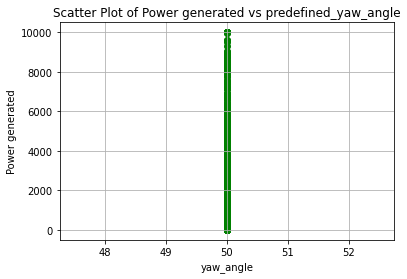

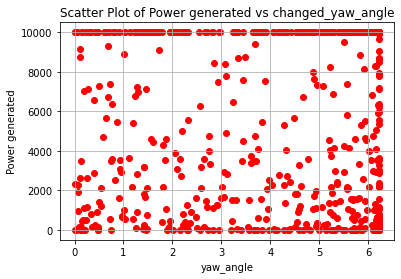

Power_list: [10000.004406032953, 9999.976490818917]
Predefined Yaw Angle 1: 55.94211601975961
Predefined Yaw Angle 2: 55.84715051393829
Changed Yaw Angle 1: 5.942116019759609
Changed Yaw Angle 2: 5.847150513938289
farm_power_baseline : [9999.99599948 9999.98971862], farm_power_yaw : [ 9999.99760622 10000.01107704]


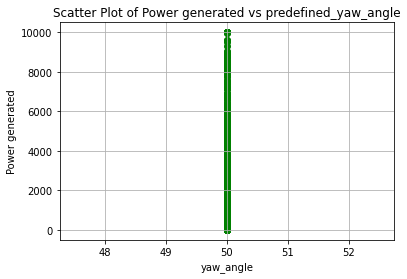

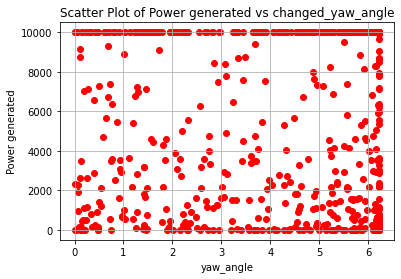

Power_list: [9999.995999480674, 10000.012851571571]
Predefined Yaw Angle 1: 56.192741316257006
Predefined Yaw Angle 2: 54.075444781875596
Changed Yaw Angle 1: 6.1927413162570035
Changed Yaw Angle 2: 4.075444781875596
farm_power_baseline : [ 366.41072357 1288.57895932], farm_power_yaw : [ 978.92548343 3000.11738412]


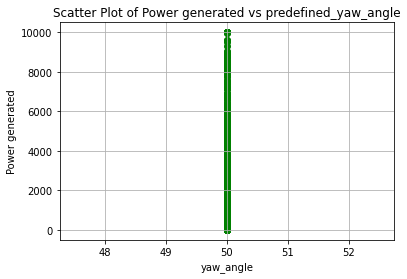

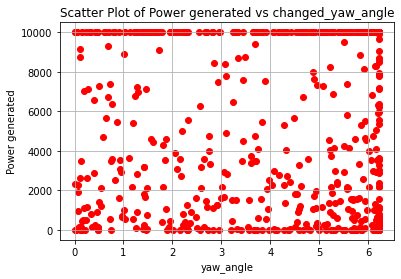

Power_list: [1288.5789593192467, 3000.117384123893]
Predefined Yaw Angle 1: 54.95541962957521
Predefined Yaw Angle 2: 53.58017058868305
Changed Yaw Angle 1: 4.955419629575212
Changed Yaw Angle 2: 3.580170588683053
farm_power_baseline : [8820.5696956  4725.42418165], farm_power_yaw : [10000.00431395  9999.99169575]


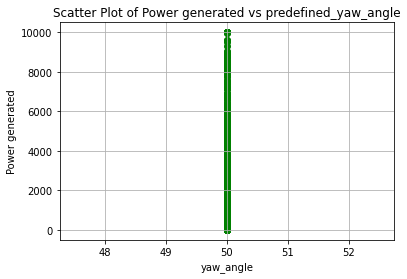

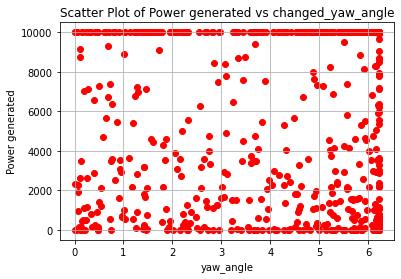

Power_list: [8820.569695603332, 10000.004356777383]
Predefined Yaw Angle 1: 56.21657767327765
Predefined Yaw Angle 2: 55.31178269685071
Changed Yaw Angle 1: 6.216577673277649
Changed Yaw Angle 2: 5.311782696850712
farm_power_baseline : [453.3797872   0.       ], farm_power_yaw : [1164.4648435    0.       ]


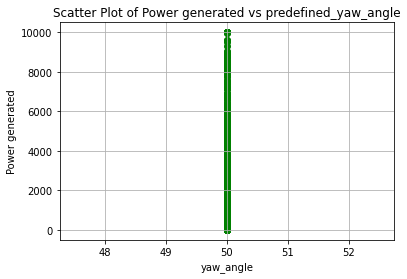

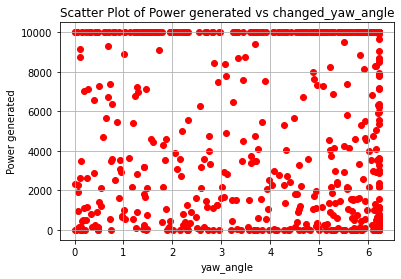

Power_list: [453.3797872044995, 1176.989669407543]
Predefined Yaw Angle 1: 56.22833499685813
Predefined Yaw Angle 2: 52.94779526467658
Changed Yaw Angle 1: 6.2283349968581305
Changed Yaw Angle 2: 2.947795264676577
farm_power_baseline : [9584.63578376 2941.10699339], farm_power_yaw : [10000.00142885  6677.78044523]


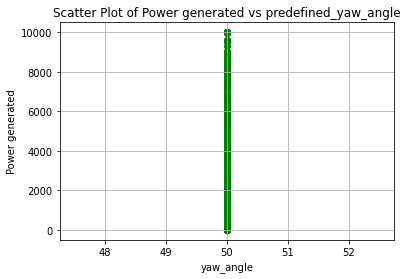

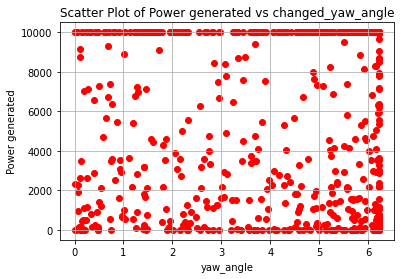

Power_list: [9584.635783758415, 10000.001428853093]
Predefined Yaw Angle 1: 56.22330481819119
Predefined Yaw Angle 2: 54.01863289792148
Changed Yaw Angle 1: 6.223304818191189
Changed Yaw Angle 2: 4.0186328979214805
farm_power_baseline : [1742.93858792 9232.35112992], farm_power_yaw : [ 3994.77421469 10000.00293224]


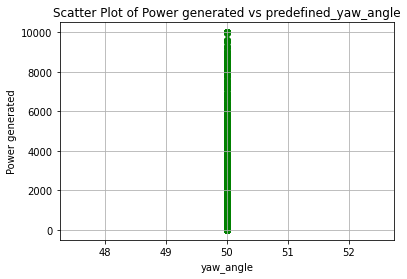

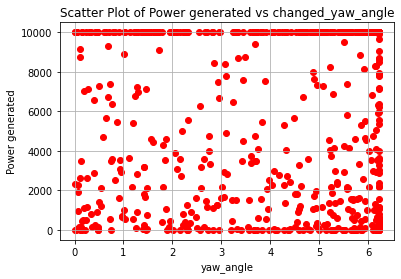

Power_list: [9232.351129919585, 10000.003219638025]
Predefined Yaw Angle 1: 56.143373233865766
Predefined Yaw Angle 2: 51.5084897203852
Changed Yaw Angle 1: 6.143373233865769
Changed Yaw Angle 2: 1.508489720385198
farm_power_baseline : [ 142.36682267 1557.23319119], farm_power_yaw : [ 473.83082779 3592.34920963]


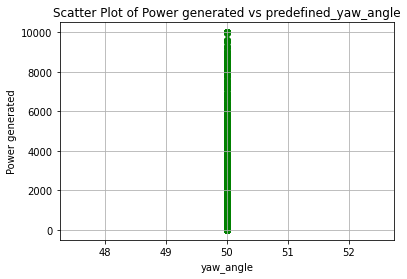

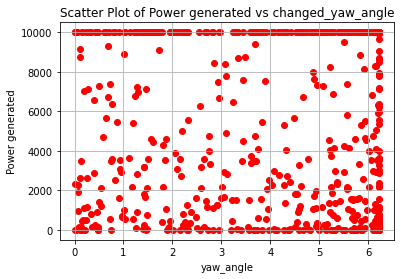

Power_list: [1557.2331911902556, 3613.5226455644374]
Predefined Yaw Angle 1: 55.57165486579527
Predefined Yaw Angle 2: 52.33626982884433
Changed Yaw Angle 1: 5.571654865795264
Changed Yaw Angle 2: 2.3362698288443307
farm_power_baseline : [4855.28381644 9999.99682089], farm_power_yaw : [ 9999.99393499 10000.01463424]


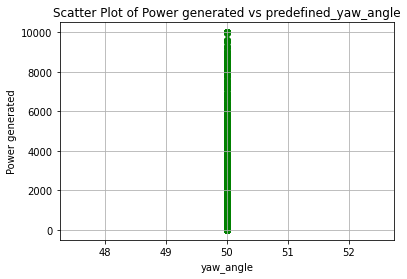

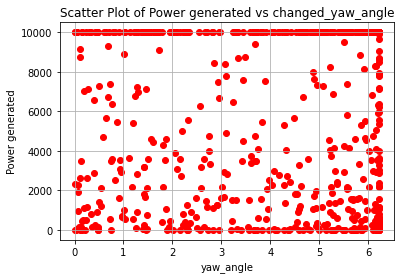

Power_list: [9999.996820892748, 10000.014634244948]
Predefined Yaw Angle 1: 52.5567594379049
Predefined Yaw Angle 2: 52.91201889122467
Changed Yaw Angle 1: 2.5567594379049003
Changed Yaw Angle 2: 2.9120188912246703
farm_power_baseline : [5185.8002053    0.       ], farm_power_yaw : [9999.9967143    0.       ]


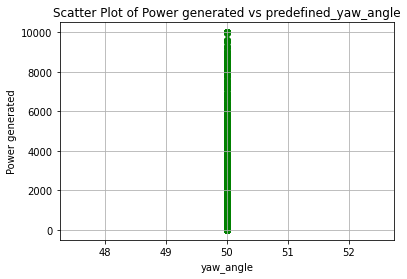

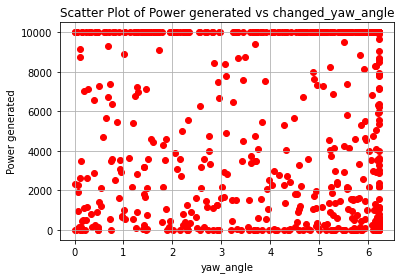

Power_list: [5185.800205296549, 9999.996714298519]
Predefined Yaw Angle 1: 56.15870132383583
Predefined Yaw Angle 2: 56.17065747472345
Changed Yaw Angle 1: 6.158701323835829
Changed Yaw Angle 2: 6.170657474723447
farm_power_baseline : [7964.63198459 6633.87446244], farm_power_yaw : [ 9999.99526965 10000.00562565]


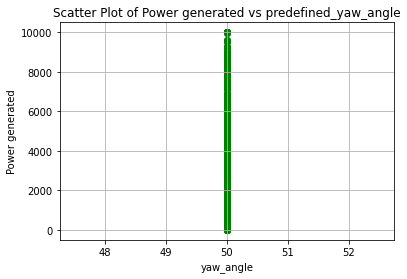

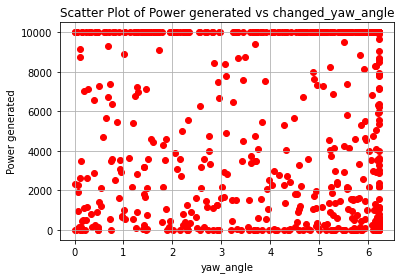

Power_list: [7964.631984594912, 10000.005625653273]
Predefined Yaw Angle 1: 55.35217630351078
Predefined Yaw Angle 2: 55.44431863692403
Changed Yaw Angle 1: 5.352176303510782
Changed Yaw Angle 2: 5.444318636924032
farm_power_baseline : [8011.13567983  714.41951333], farm_power_yaw : [9999.99461874 1747.21050274]


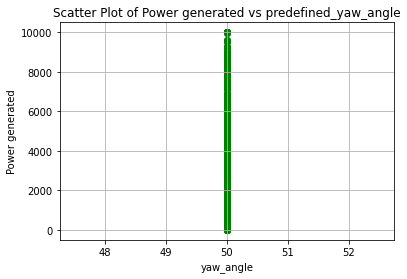

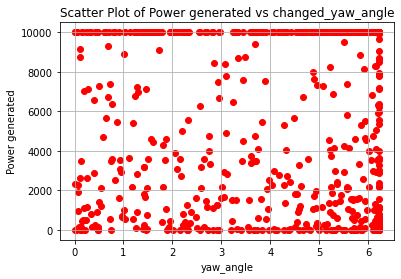

Power_list: [8011.135679832649, 9999.99539380142]
Predefined Yaw Angle 1: 55.451144163308086
Predefined Yaw Angle 2: 56.17156454739073
Changed Yaw Angle 1: 5.451144163308088
Changed Yaw Angle 2: 6.1715645473907275
farm_power_baseline : [10000.00590908     0.        ], farm_power_yaw : [10000.00618634     0.        ]


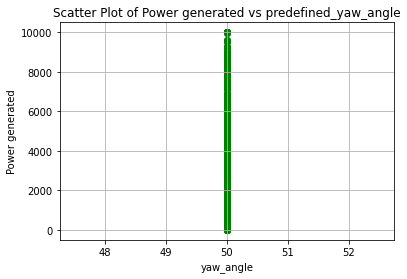

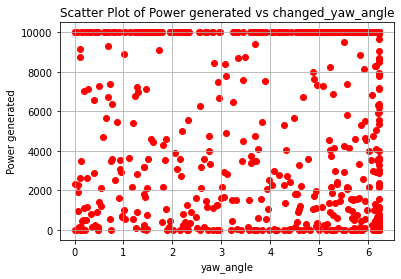

Power_list: [10000.005909076655, 10000.006186341132]
Predefined Yaw Angle 1: 53.96269970163728
Predefined Yaw Angle 2: 53.343895203087335
Changed Yaw Angle 1: 3.962699701637276
Changed Yaw Angle 2: 3.343895203087332
farm_power_baseline : [7109.36379212  558.18135274], farm_power_yaw : [9999.99812198 1056.56448804]


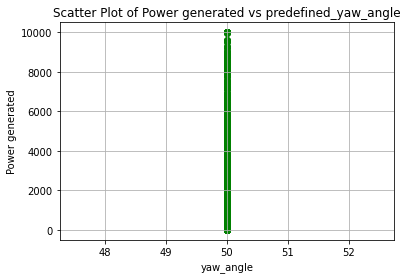

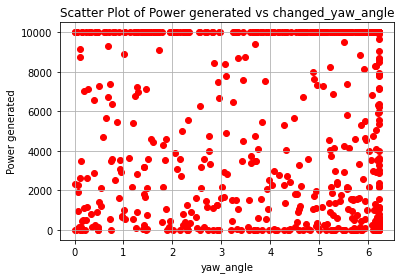

Power_list: [7109.36379212119, 9999.998994606436]
Predefined Yaw Angle 1: 53.81392993050716
Predefined Yaw Angle 2: 50.88902120686471
Changed Yaw Angle 1: 3.8139299305071606
Changed Yaw Angle 2: 0.889021206864709
farm_power_baseline : [   0.         1396.53590908], farm_power_yaw : [   0.         3313.24796097]


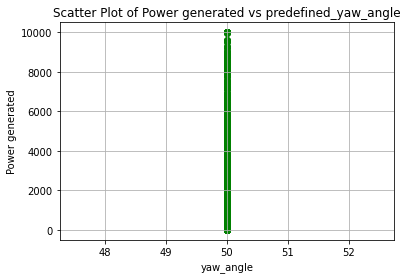

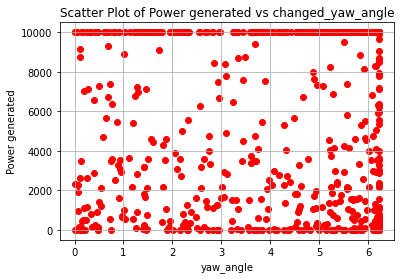

Power_list: [1396.5359090834627, 3313.247960965969]
Predefined Yaw Angle 1: 55.24073899085751
Predefined Yaw Angle 2: 54.474045961182156
Changed Yaw Angle 1: 5.240738990857506
Changed Yaw Angle 2: 4.474045961182155
farm_power_baseline : [2.91901136e+00 4.84290519e+03], farm_power_yaw : [ 146.7734742  9999.99359829]


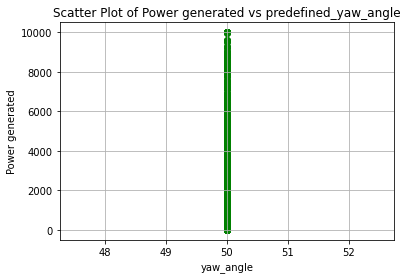

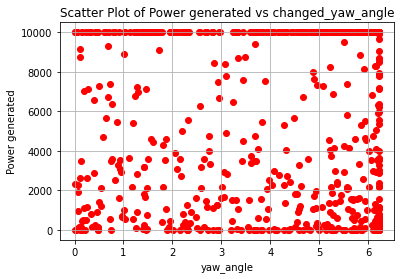

Power_list: [4842.9051857391605, 9999.994135296172]
Predefined Yaw Angle 1: 55.0741390899132
Predefined Yaw Angle 2: 51.88771906592252
Changed Yaw Angle 1: 5.074139089913201
Changed Yaw Angle 2: 1.8877190659225191
farm_power_baseline : [1437.47784668 1027.84104368], farm_power_yaw : [3342.78832    2449.27091319]


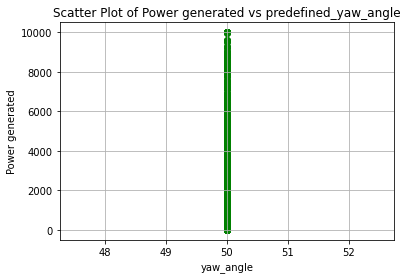

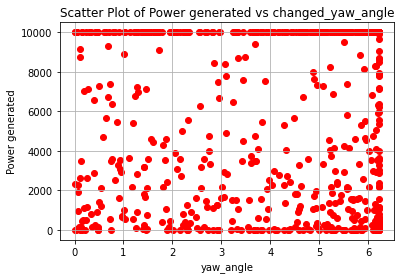

Power_list: [1437.477846678572, 3356.1196720134035]
Predefined Yaw Angle 1: 55.54871599406198
Predefined Yaw Angle 2: 50.12645074486979
Changed Yaw Angle 1: 5.5487159940619755
Changed Yaw Angle 2: 0.12645074486979516
farm_power_baseline : [ 793.71280737 7721.9074306 ], farm_power_yaw : [1938.45513501 9999.99743886]


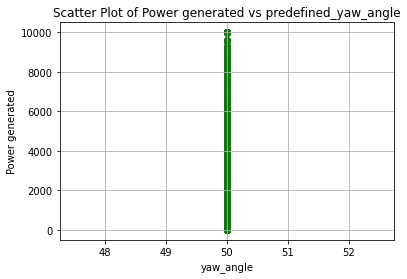

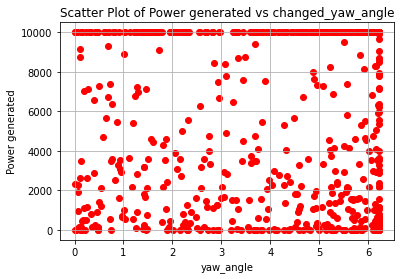

Power_list: [7721.907430602072, 9999.997438859951]
Predefined Yaw Angle 1: 56.18314861001054
Predefined Yaw Angle 2: 51.52326027758105
Changed Yaw Angle 1: 6.183148610010538
Changed Yaw Angle 2: 1.5232602775810498
farm_power_baseline : [7129.07246646   22.35956032], farm_power_yaw : [10000.00434994   187.40715672]


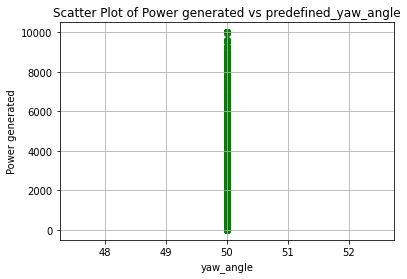

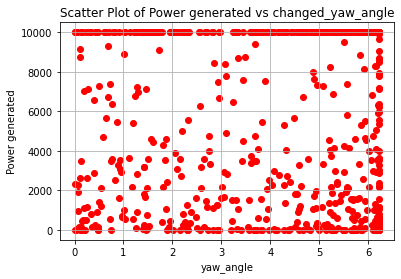

Power_list: [7129.072466459171, 10000.004349943618]
Predefined Yaw Angle 1: 55.985502642342524
Predefined Yaw Angle 2: 56.02017076363856
Changed Yaw Angle 1: 5.985502642342525
Changed Yaw Angle 2: 6.020170763638557
farm_power_baseline : [  0.         506.90654561], farm_power_yaw : [   0.         1289.10864113]


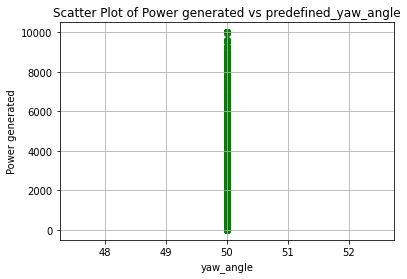

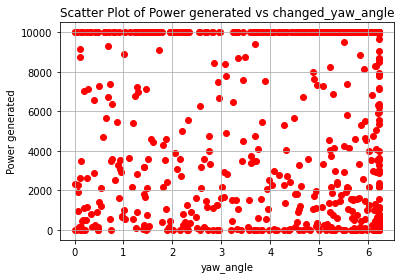

Power_list: [506.9065456128924, 1303.0426964424637]
Predefined Yaw Angle 1: 56.168397893364805
Predefined Yaw Angle 2: 56.1697482715273
Changed Yaw Angle 1: 6.168397893364807
Changed Yaw Angle 2: 6.169748271527293
farm_power_baseline : [0. 0.], farm_power_yaw : [0. 0.]


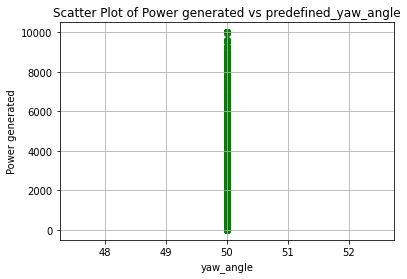

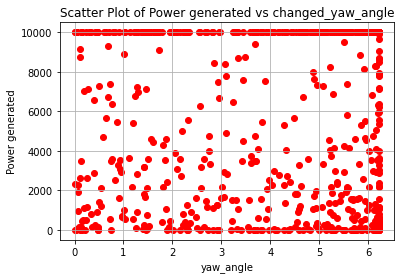

Power_list: [0.0, 0.0]
Predefined Yaw Angle 1: 55.85371664843217
Predefined Yaw Angle 2: 56.066609368830704
Changed Yaw Angle 1: 5.853716648432172
Changed Yaw Angle 2: 6.066609368830704
farm_power_baseline : [914.09005697  29.97233692], farm_power_yaw : [2178.28967133  205.96270107]


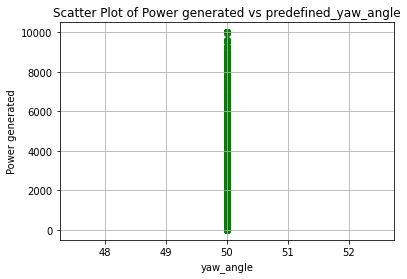

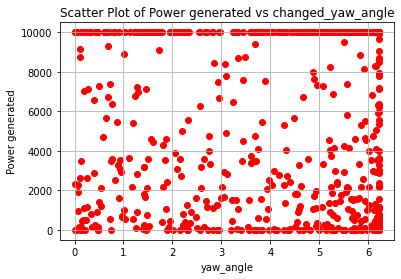

Power_list: [914.090056968088, 2200.103721578711]
Predefined Yaw Angle 1: 55.98559105929071
Predefined Yaw Angle 2: 55.98655634435958
Changed Yaw Angle 1: 5.985591059290716
Changed Yaw Angle 2: 5.986556344359577
farm_power_baseline : [ 4876.38461327 10000.00082513], farm_power_yaw : [ 9999.99387142 10000.01420961]


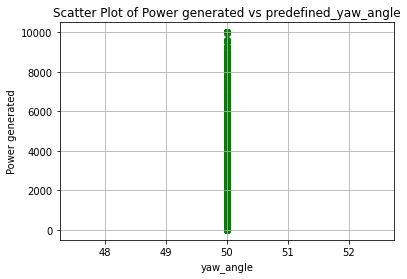

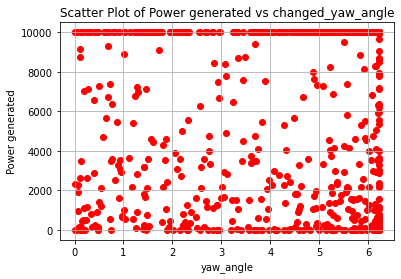

Power_list: [10000.000825134453, 10000.014209612365]
Predefined Yaw Angle 1: 55.96487486180321
Predefined Yaw Angle 2: 53.545128182427575
Changed Yaw Angle 1: 5.9648748618032075
Changed Yaw Angle 2: 3.545128182427572
farm_power_baseline : [2346.10807213  718.62652911], farm_power_yaw : [5353.67494149 1759.08651696]


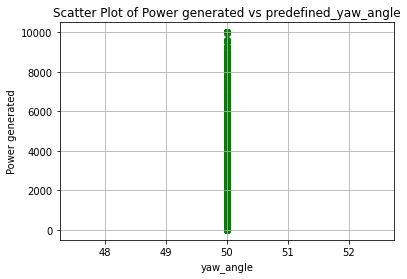

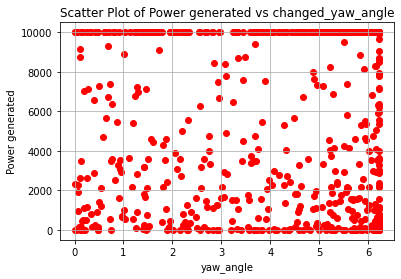

Power_list: [2346.10807213015, 5390.275784479738]
Predefined Yaw Angle 1: 56.12071772247246
Predefined Yaw Angle 2: 55.52888571944284
Changed Yaw Angle 1: 6.120717722472464
Changed Yaw Angle 2: 5.528885719442844
farm_power_baseline : [ 2154.79948403 10000.00494186], farm_power_yaw : [4894.00180134 9999.98998594]


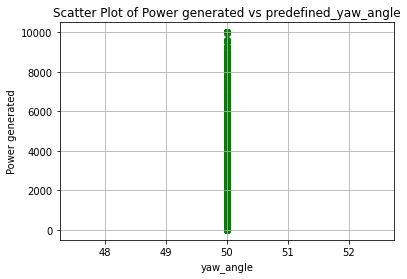

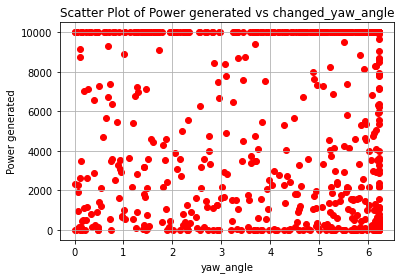

Power_list: [10000.004941864643, 9999.989985942677]
Predefined Yaw Angle 1: 55.3017189882337
Predefined Yaw Angle 2: 52.919533266556435
Changed Yaw Angle 1: 5.301718988233705
Changed Yaw Angle 2: 2.9195332665564377
farm_power_baseline : [ 2887.49419678 10000.00519731], farm_power_yaw : [6574.59412048 9999.99306285]


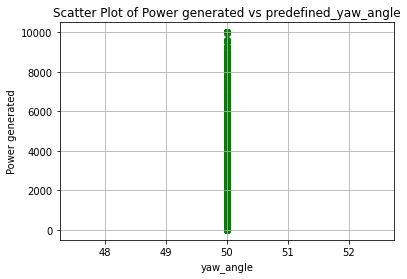

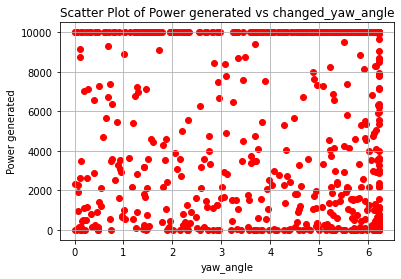

Power_list: [10000.00519731126, 9999.99306285178]
Predefined Yaw Angle 1: 51.67828219651253
Predefined Yaw Angle 2: 51.83588676057463
Changed Yaw Angle 1: 1.6782821965125285
Changed Yaw Angle 2: 1.835886760574634
farm_power_baseline : [ 231.5150404  5156.76602528], farm_power_yaw : [ 678.75044945 9999.99675921]


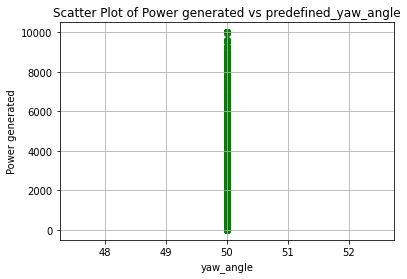

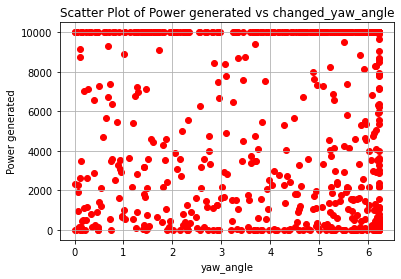

Power_list: [5156.766025282675, 9999.996759209143]
Predefined Yaw Angle 1: 52.03466042147448
Predefined Yaw Angle 2: 54.17119793992107
Changed Yaw Angle 1: 2.0346604214744795
Changed Yaw Angle 2: 4.171197939921068
farm_power_baseline : [9999.995913   5445.54084271], farm_power_yaw : [10000.00413154  9999.99620388]


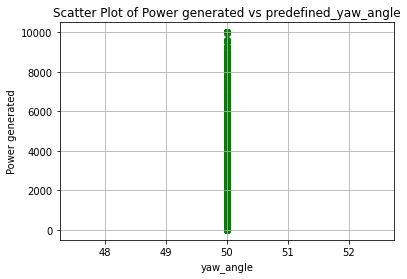

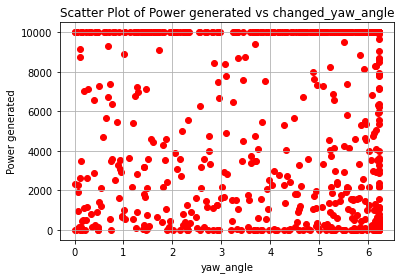

Power_list: [9999.995913000905, 10000.005484603163]
Predefined Yaw Angle 1: 55.76862119475309
Predefined Yaw Angle 2: 55.380687728998765
Changed Yaw Angle 1: 5.768621194753089
Changed Yaw Angle 2: 5.380687728998768
farm_power_baseline : [   0.         4727.97148867], farm_power_yaw : [1.68592896e+00 9.99999146e+03]


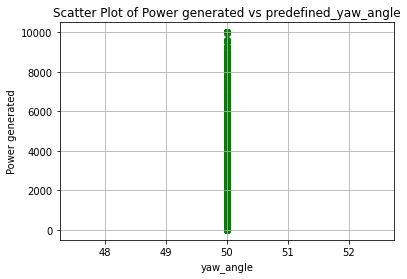

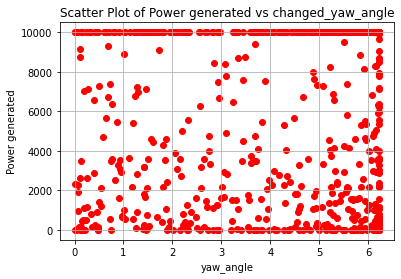

Power_list: [4727.9714886652855, 9999.992158633697]
Predefined Yaw Angle 1: 56.12282694605581
Predefined Yaw Angle 2: 56.06690657760836
Changed Yaw Angle 1: 6.122826946055807
Changed Yaw Angle 2: 6.066906577608357
farm_power_baseline : [10000.00354396  3011.91564672], farm_power_yaw : [10000.01388978  6810.57230829]


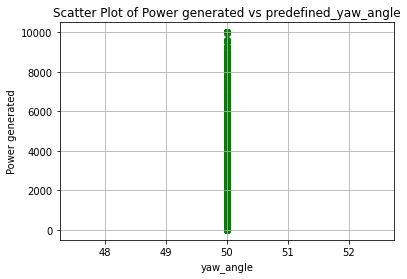

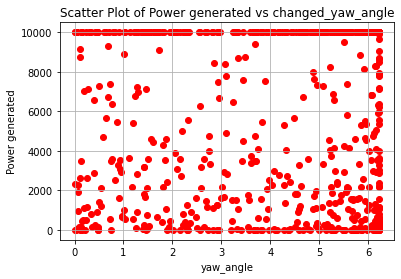

Power_list: [10000.003543956063, 10000.013889781205]
Predefined Yaw Angle 1: 56.21694891793361
Predefined Yaw Angle 2: 55.57957952342472
Changed Yaw Angle 1: 6.216948917933606
Changed Yaw Angle 2: 5.579579523424719
farm_power_baseline : [3994.54232    9999.99752277], farm_power_yaw : [ 8994.36169146 10000.01460015]


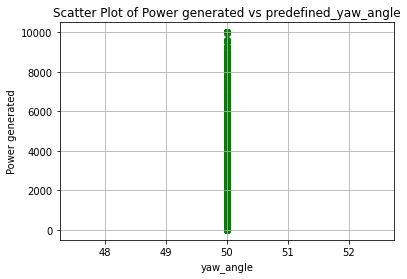

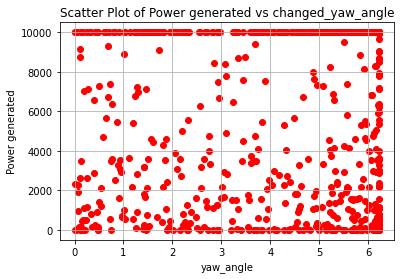

Power_list: [9999.997522771408, 10000.014600154605]
Predefined Yaw Angle 1: 56.04605493604765
Predefined Yaw Angle 2: 56.15745139150996
Changed Yaw Angle 1: 6.046054936047657
Changed Yaw Angle 2: 6.157451391509961
farm_power_baseline : [  87.03865552 3238.29537383], farm_power_yaw : [ 349.09749415 7320.72297467]


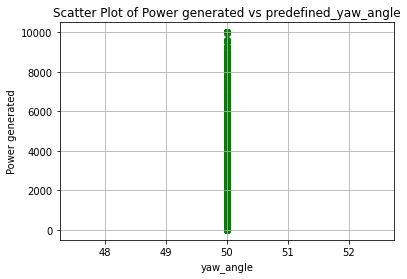

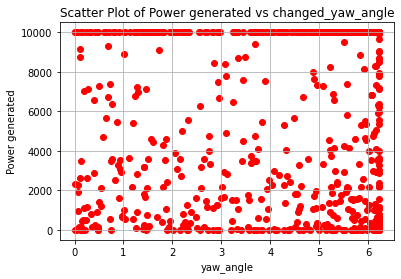

Power_list: [3238.2953738320443, 7396.405836127608]
Predefined Yaw Angle 1: 55.61691156009564
Predefined Yaw Angle 2: 55.386476908576384
Changed Yaw Angle 1: 5.616911560095635
Changed Yaw Angle 2: 5.386476908576382
farm_power_baseline : [10000.00492359   556.16024342], farm_power_yaw : [9999.9891613  1397.78458114]


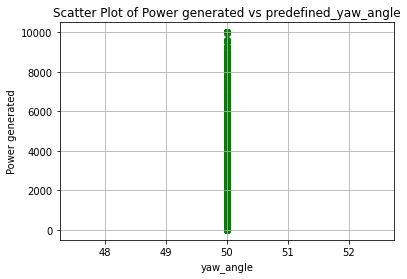

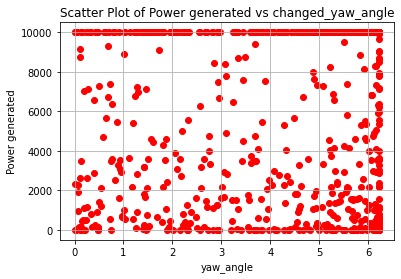

Power_list: [10000.004923586868, 9999.989161297168]
Predefined Yaw Angle 1: 55.727453517990426
Predefined Yaw Angle 2: 52.94381996411742
Changed Yaw Angle 1: 5.727453517990425
Changed Yaw Angle 2: 2.943819964117415
farm_power_baseline : [10000.00548546  5482.92897618], farm_power_yaw : [9999.99807338 9999.99615955]


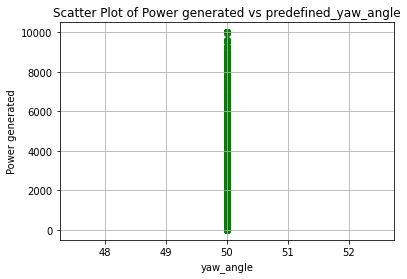

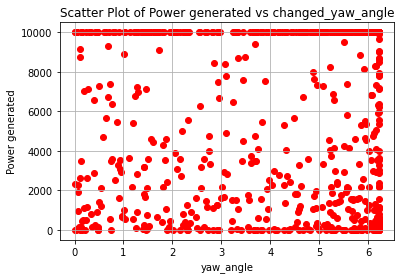

Power_list: [10000.00548545724, 9999.99807337698]
Predefined Yaw Angle 1: 52.9787506284334
Predefined Yaw Angle 2: 55.78506051101974
Changed Yaw Angle 1: 2.978750628433406
Changed Yaw Angle 2: 5.785060511019745
farm_power_baseline : [317.22928983 132.9707079 ], farm_power_yaw : [870.03772257 452.90077097]


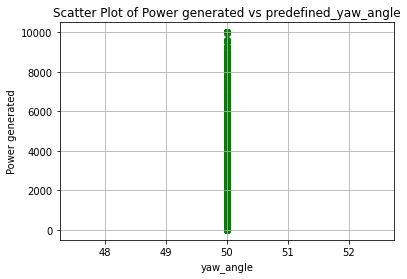

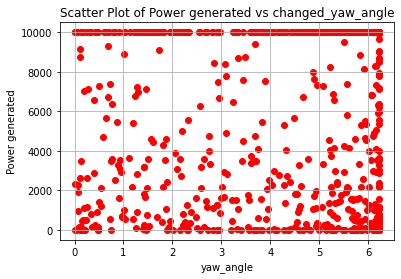

Power_list: [317.22928983487003, 876.1549413766181]
Predefined Yaw Angle 1: 56.18002898310962
Predefined Yaw Angle 2: 54.8802685748963
Changed Yaw Angle 1: 6.18002898310962
Changed Yaw Angle 2: 4.880268574896301
farm_power_baseline : [10000.00609377     0.        ], farm_power_yaw : [10000.0090457     0.       ]


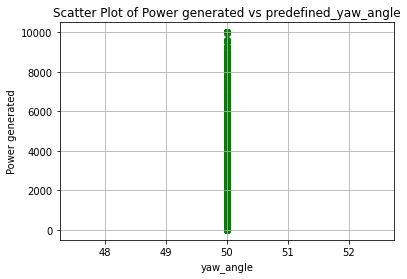

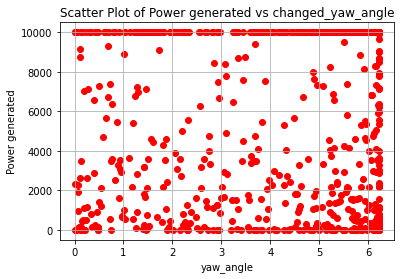

Power_list: [10000.006093769023, 10000.00904570147]
Predefined Yaw Angle 1: 56.05135462661691
Predefined Yaw Angle 2: 52.765968740199746
Changed Yaw Angle 1: 6.051354626616915
Changed Yaw Angle 2: 2.7659687401997437
farm_power_baseline : [1378.91331659 6755.13674819], farm_power_yaw : [ 3210.22597332 10000.00525503]


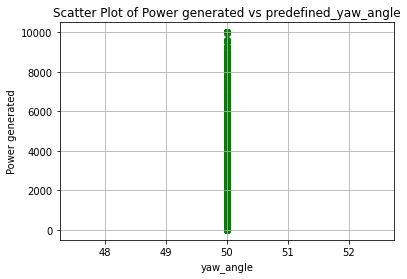

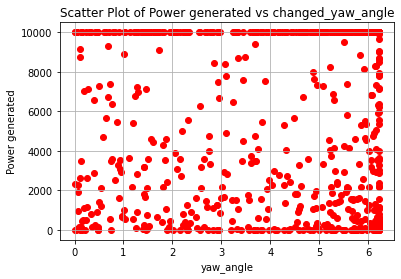

Power_list: [6755.13674818758, 10000.005255033808]
Predefined Yaw Angle 1: 50.48248814610424
Predefined Yaw Angle 2: 55.06550794031007
Changed Yaw Angle 1: 0.4824881461042387
Changed Yaw Angle 2: 5.06550794031007
farm_power_baseline : [   0.         1552.70354168], farm_power_yaw : [   0.         3589.80159222]


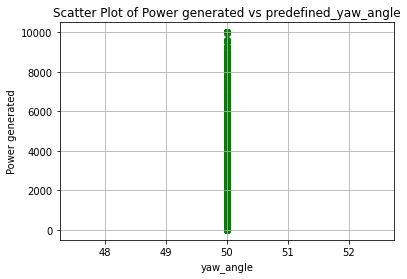

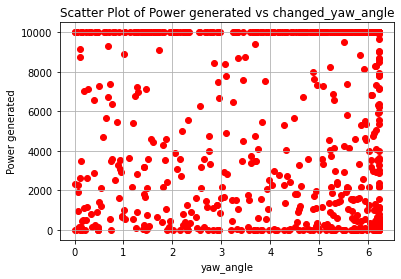

Power_list: [1552.7035416834979, 3603.488853387228]
Predefined Yaw Angle 1: 54.609212948922654
Predefined Yaw Angle 2: 53.963531562335525
Changed Yaw Angle 1: 4.609212948922656
Changed Yaw Angle 2: 3.963531562335523
farm_power_baseline : [168.22450702 130.99514922], farm_power_yaw : [531.17570477 448.96765083]


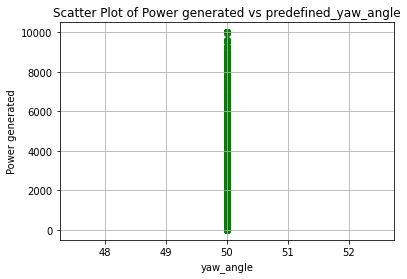

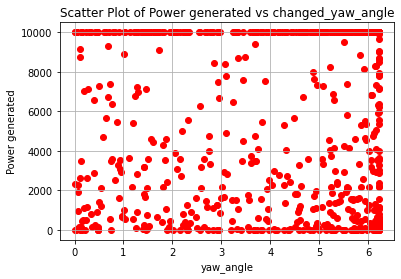

Power_list: [168.22450701595702, 531.1757047748988]
Predefined Yaw Angle 1: 56.00557169168515
Predefined Yaw Angle 2: 55.62006756147719
Changed Yaw Angle 1: 6.0055716916851445
Changed Yaw Angle 2: 5.620067561477194
farm_power_baseline : [3268.2972254    0.       ], farm_power_yaw : [7395.30620463    0.        ]


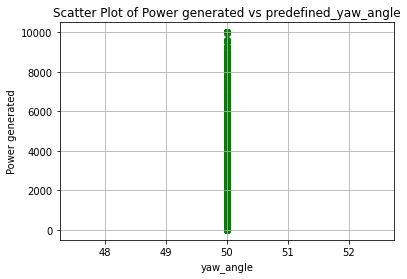

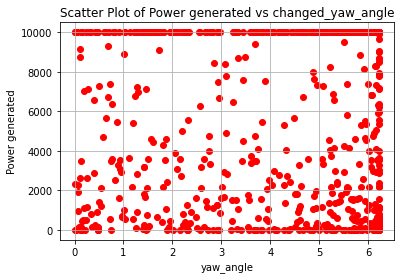

Power_list: [3268.297225398856, 7464.279471017477]
Predefined Yaw Angle 1: 55.39523162885409
Predefined Yaw Angle 2: 54.42435563629902
Changed Yaw Angle 1: 5.395231628854093
Changed Yaw Angle 2: 4.424355636299019
farm_power_baseline : [ 4705.2136313  10000.00491549], farm_power_yaw : [9999.99122214 9999.9882428 ]


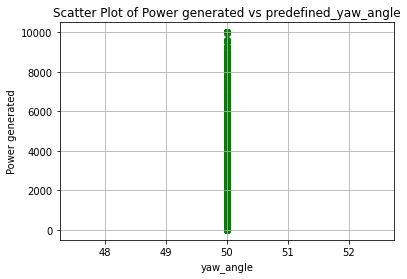

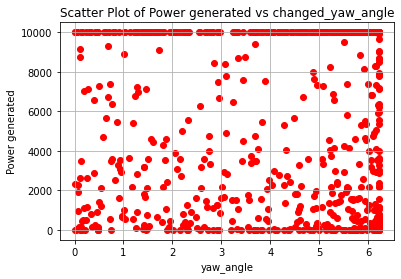

Power_list: [10000.004915491578, 9999.99176723758]
Predefined Yaw Angle 1: 55.86200227521563
Predefined Yaw Angle 2: 50.884563075199914
Changed Yaw Angle 1: 5.862002275215627
Changed Yaw Angle 2: 0.8845630751999163
farm_power_baseline : [9999.99660955    0.        ], farm_power_yaw : [9999.99404312    0.        ]


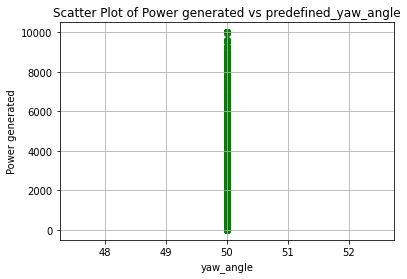

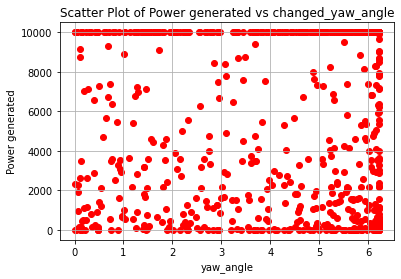

Power_list: [9999.9966095451, 9999.995508251874]
Predefined Yaw Angle 1: 55.51707178135744
Predefined Yaw Angle 2: 51.027573960209814
Changed Yaw Angle 1: 5.517071781357436
Changed Yaw Angle 2: 1.027573960209817
farm_power_baseline : [ 934.77730704 2082.86837265], farm_power_yaw : [2233.77612426 4758.75758805]


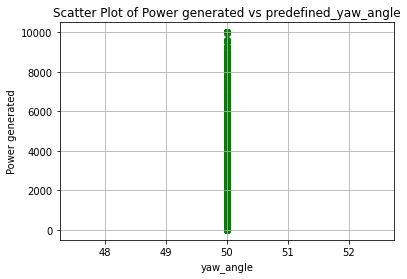

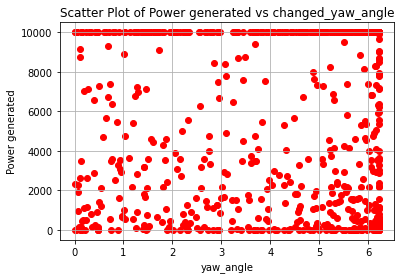

Power_list: [2082.868372654279, 4779.241922585561]
Predefined Yaw Angle 1: 56.086217535814924
Predefined Yaw Angle 2: 56.02198490897312
Changed Yaw Angle 1: 6.0862175358149235
Changed Yaw Angle 2: 6.021984908973119
farm_power_baseline : [373.69220419 868.75675275], farm_power_yaw : [ 990.5921003  2082.82150198]


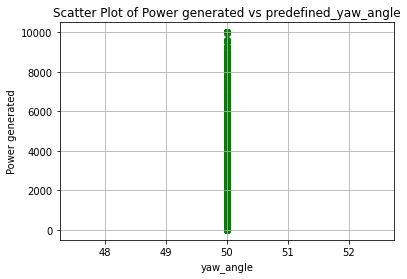

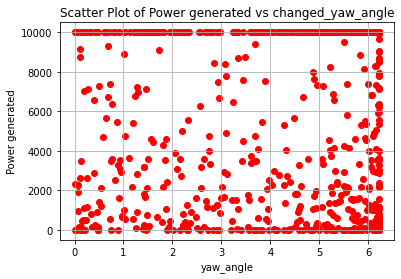

Power_list: [868.7567527460973, 2104.9893374891935]
Predefined Yaw Angle 1: 55.95645660959747
Predefined Yaw Angle 2: 55.99423583567893
Changed Yaw Angle 1: 5.956456609597467
Changed Yaw Angle 2: 5.994235835678929
farm_power_baseline : [9999.99841198  192.048671  ], farm_power_yaw : [10000.01449667   589.66888922]


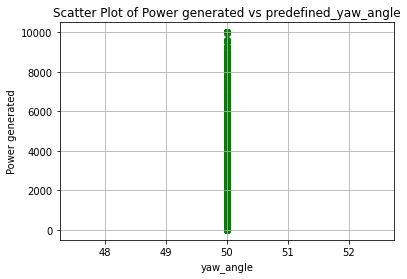

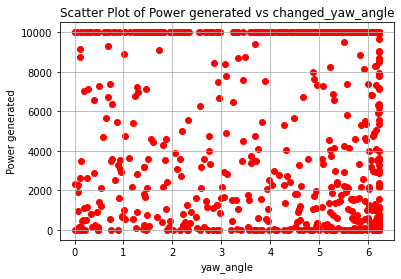

Power_list: [9999.998411977409, 10000.014496666714]
Predefined Yaw Angle 1: 56.16637868462631
Predefined Yaw Angle 2: 55.14561689116409
Changed Yaw Angle 1: 6.166378684626309
Changed Yaw Angle 2: 5.14561689116409
farm_power_baseline : [ 2609.42421649 10000.00476275], farm_power_yaw : [5919.13987517 9999.98534424]


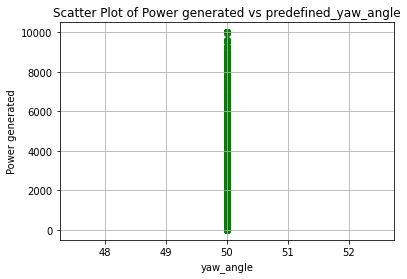

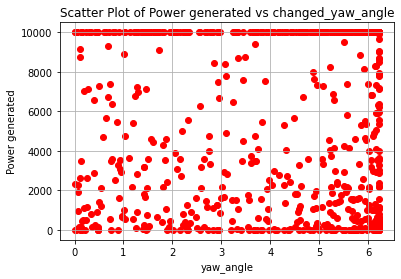

Power_list: [10000.00476274891, 9999.985344238417]
Predefined Yaw Angle 1: 56.18066654387459
Predefined Yaw Angle 2: 55.80987478079267
Changed Yaw Angle 1: 6.180666543874584
Changed Yaw Angle 2: 5.809874780792668
farm_power_baseline : [7460.3577781  2319.58642315], farm_power_yaw : [10000.00116011  5279.25488101]


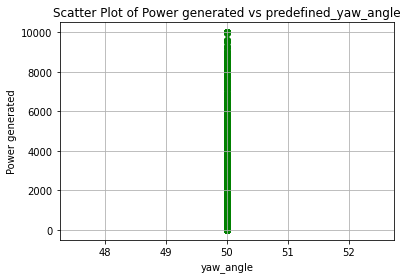

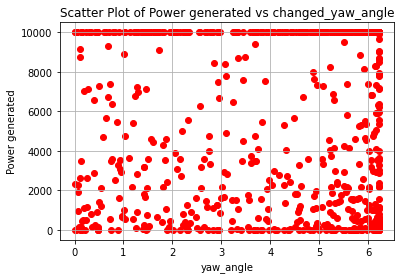

Power_list: [7460.357778099863, 10000.001160112408]
Predefined Yaw Angle 1: 49.95174614412278
Predefined Yaw Angle 2: 54.96777578725856
Changed Yaw Angle 1: -0.0482538558772224
Changed Yaw Angle 2: 4.96777578725856
Predefined Yaw Angle 1: 56.22835417161798
Predefined Yaw Angle 2: 52.753553083197794
Changed Yaw Angle 1: 6.228354171617979
Changed Yaw Angle 2: 2.753553083197794
farm_power_baseline : [2366.47992837 1175.57527473], farm_power_yaw : [5398.33676489 2754.86209247]


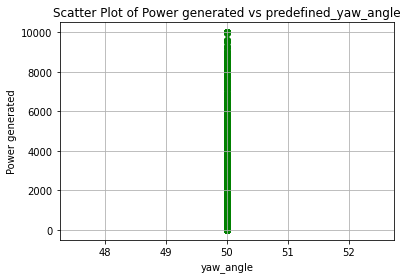

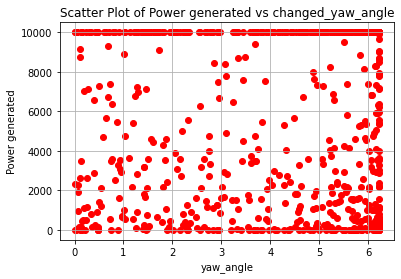

Power_list: [2366.479928374676, 5433.686191847165]
Predefined Yaw Angle 1: 54.37996537912755
Predefined Yaw Angle 2: 55.29284708886803
Changed Yaw Angle 1: 4.379965379127545
Changed Yaw Angle 2: 5.29284708886803
farm_power_baseline : [3639.6107838    0.       ], farm_power_yaw : [8240.0639494    0.       ]


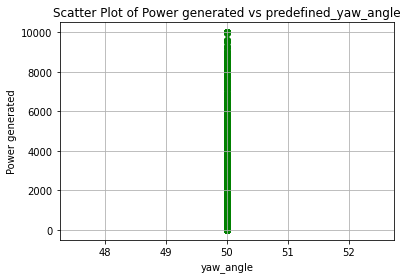

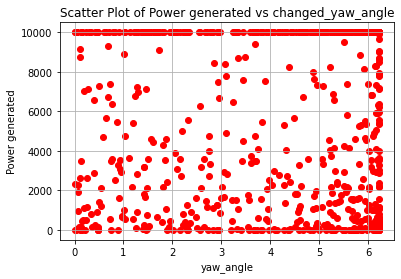

Power_list: [3639.6107837976488, 8294.500526362415]
Predefined Yaw Angle 1: 54.84957229205001
Predefined Yaw Angle 2: 52.59899413249006
Changed Yaw Angle 1: 4.849572292050014
Changed Yaw Angle 2: 2.5989941324900645
farm_power_baseline : [2803.88756219  802.17318541], farm_power_yaw : [6404.23095562 1956.33723348]


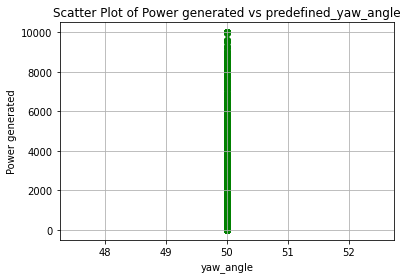

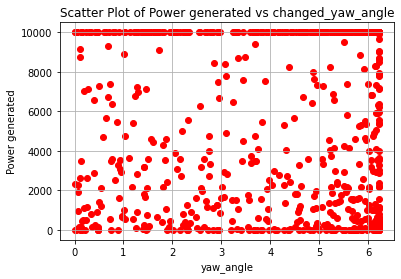

Power_list: [2803.8875621897514, 6431.111338400478]
Predefined Yaw Angle 1: 55.63518617149576
Predefined Yaw Angle 2: 55.95424367822143
Changed Yaw Angle 1: 5.635186171495758
Changed Yaw Angle 2: 5.954243678221427
farm_power_baseline : [188.59803513   0.        ], farm_power_yaw : [582.48902747   0.        ]


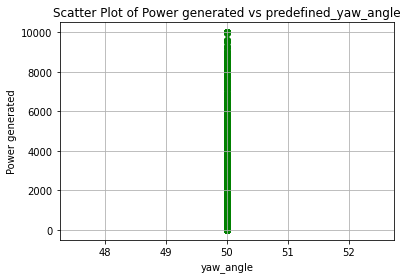

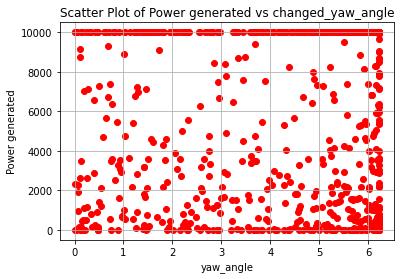

Power_list: [188.59803513047015, 589.5853278027403]
Predefined Yaw Angle 1: 55.88439626418989
Predefined Yaw Angle 2: 55.34687090947694
Changed Yaw Angle 1: 5.884396264189885
Changed Yaw Angle 2: 5.346870909476942
farm_power_baseline : [0. 0.], farm_power_yaw : [0. 0.]


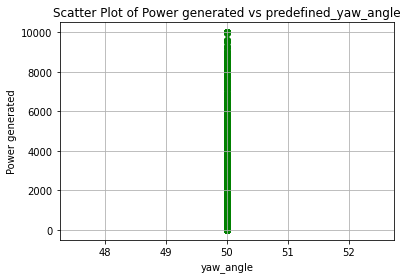

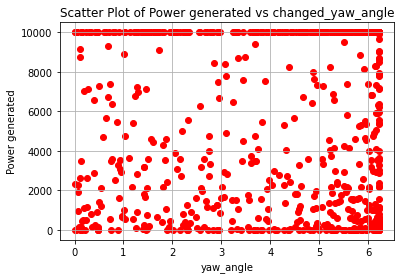

Power_list: [0.0, 0.0]
Predefined Yaw Angle 1: 55.531434209116235
Predefined Yaw Angle 2: 51.95756339498705
Changed Yaw Angle 1: 5.531434209116234
Changed Yaw Angle 2: 1.9575633949870463
farm_power_baseline : [ 574.93707741 1810.10381686], farm_power_yaw : [1442.76338238 4162.10533203]


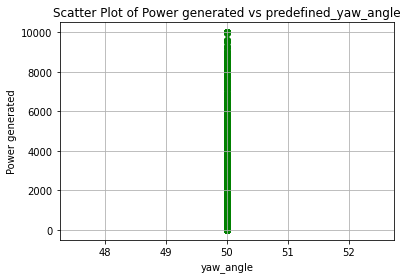

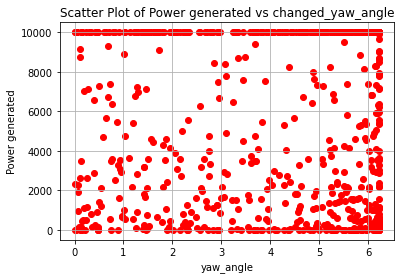

Power_list: [1810.1038168588782, 4183.662839616805]
Predefined Yaw Angle 1: 55.62036514739725
Predefined Yaw Angle 2: 55.91187012211718
Changed Yaw Angle 1: 5.62036514739725
Changed Yaw Angle 2: 5.911870122117176
farm_power_baseline : [10000.00439828   195.76961509], farm_power_yaw : [9999.97628183  597.90995913]


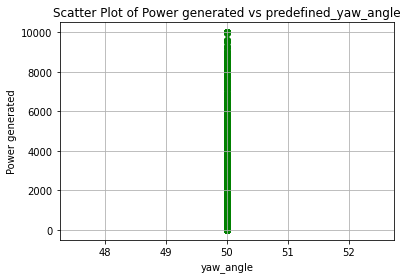

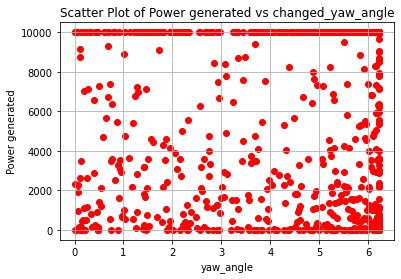

Power_list: [10000.004398282832, 9999.976281830473]
Predefined Yaw Angle 1: 56.104646077926056
Predefined Yaw Angle 2: 56.16362406628455
Changed Yaw Angle 1: 6.104646077926054
Changed Yaw Angle 2: 6.163624066284547
farm_power_baseline : [392.21899038   0.        ], farm_power_yaw : [1026.97165449    0.        ]


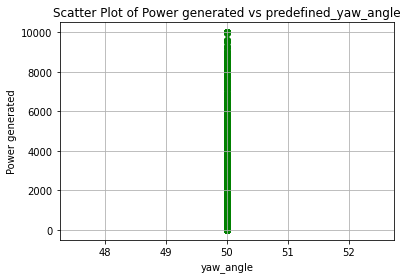

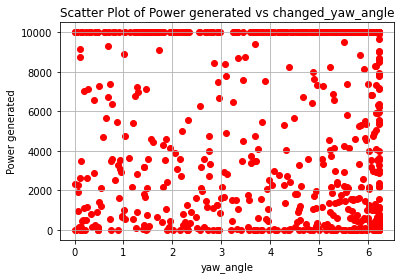

Power_list: [392.2189903787121, 1038.427883858915]
Predefined Yaw Angle 1: 54.870234161051286
Predefined Yaw Angle 2: 56.152148505147395
Changed Yaw Angle 1: 4.870234161051284
Changed Yaw Angle 2: 6.152148505147395
farm_power_baseline : [  307.23694776 10000.00330278], farm_power_yaw : [ 841.93817132 9999.9671434 ]


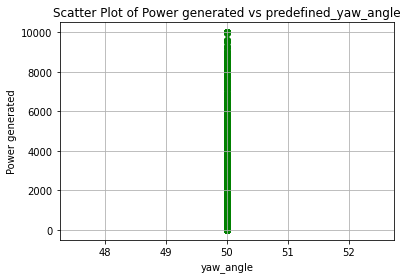

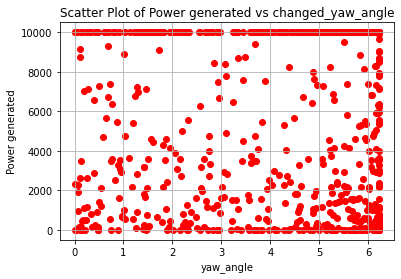

Power_list: [10000.003302780713, 9999.967143399252]
Predefined Yaw Angle 1: 56.20548667260191
Predefined Yaw Angle 2: 55.19768541890066
Changed Yaw Angle 1: 6.2054866726019045
Changed Yaw Angle 2: 5.197685418900665
farm_power_baseline : [9733.73169835 1802.44779477], farm_power_yaw : [10000.00090658  4123.58964714]


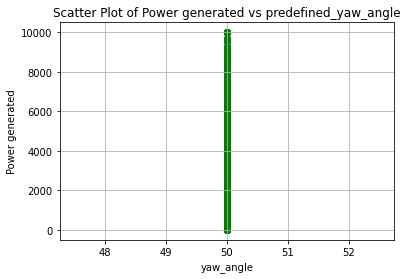

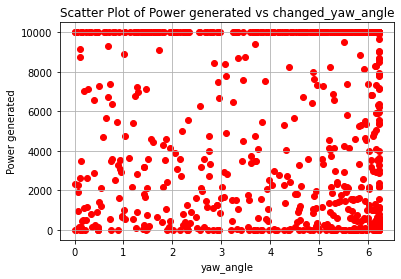

Power_list: [9733.73169835458, 10000.001500545177]
Predefined Yaw Angle 1: 55.61705377289785
Predefined Yaw Angle 2: 55.43941842051829
Changed Yaw Angle 1: 5.617053772897845
Changed Yaw Angle 2: 5.439418420518286
farm_power_baseline : [7113.46089202 2173.97744673], farm_power_yaw : [10000.00443694  4945.45551615]


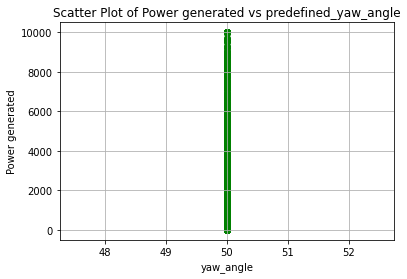

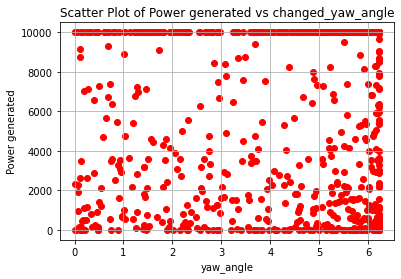

Power_list: [7113.460892022992, 10000.004436939404]
Predefined Yaw Angle 1: 56.207440900209804
Predefined Yaw Angle 2: 55.34219333333833
Changed Yaw Angle 1: 6.2074409002098045
Changed Yaw Angle 2: 5.342193333338327
farm_power_baseline : [2949.53867182 9999.99690351], farm_power_yaw : [6677.07445849 9999.98917394]


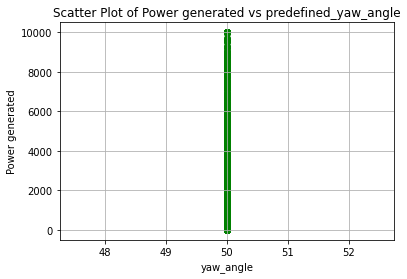

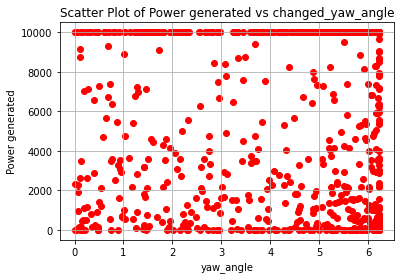

Power_list: [9999.996903513767, 9999.989173940608]
Predefined Yaw Angle 1: 55.807955551421344
Predefined Yaw Angle 2: 54.78576790151149
Changed Yaw Angle 1: 5.80795555142134
Changed Yaw Angle 2: 4.785767901511493
farm_power_baseline : [8422.55232768 9999.99385865], farm_power_yaw : [ 9999.99942727 10000.01125486]


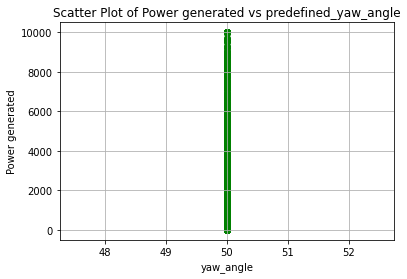

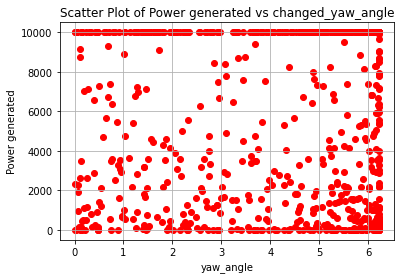

Power_list: [9999.993858649153, 10000.011254858458]
Predefined Yaw Angle 1: 56.011986714118926
Predefined Yaw Angle 2: 52.867480984102514
Changed Yaw Angle 1: 6.011986714118927
Changed Yaw Angle 2: 2.867480984102512
farm_power_baseline : [ 7442.26968066 10000.00240086], farm_power_yaw : [10000.0010352  10000.01398043]


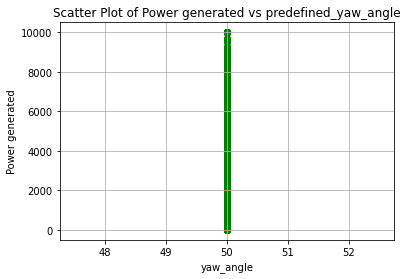

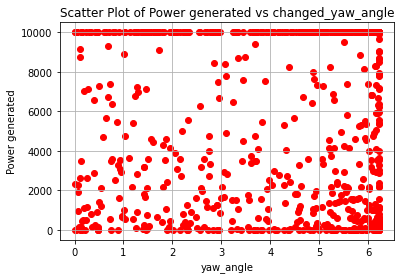

Power_list: [10000.002400858033, 10000.013980434322]
Predefined Yaw Angle 1: 55.85376298743514
Predefined Yaw Angle 2: 54.42662092112224
Changed Yaw Angle 1: 5.85376298743514
Changed Yaw Angle 2: 4.4266209211222405
farm_power_baseline : [5077.97798673  540.82010951], farm_power_yaw : [9999.99698484 1369.91752106]


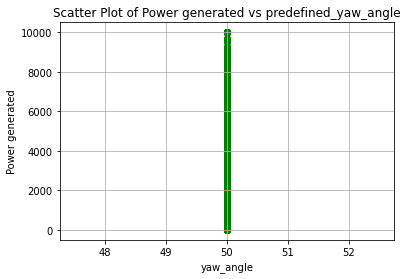

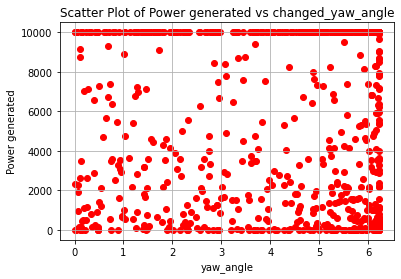

Power_list: [5077.977986727831, 9999.99698483559]
Predefined Yaw Angle 1: 54.89036339783454
Predefined Yaw Angle 2: 56.06115628018266
Changed Yaw Angle 1: 4.890363397834539
Changed Yaw Angle 2: 6.061156280182658
farm_power_baseline : [ 104.85984632 9999.99267526], farm_power_yaw : [  389.4387682  10000.01761706]


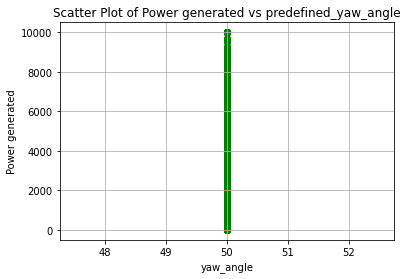

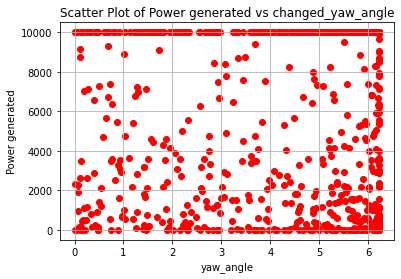

Power_list: [9999.99267526198, 10000.017617062113]
Predefined Yaw Angle 1: 52.934593819663235
Predefined Yaw Angle 2: 55.49213622692862
Changed Yaw Angle 1: 2.934593819663238
Changed Yaw Angle 2: 5.492136226928622
farm_power_baseline : [   0.         9999.98792059], farm_power_yaw : [  110.14992243 10000.00773283]


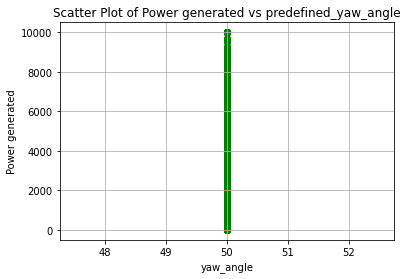

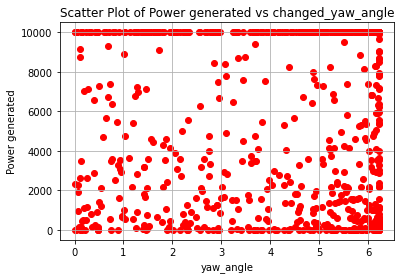

Power_list: [9999.987920585227, 10000.008715226926]
Predefined Yaw Angle 1: 56.02422926565002
Predefined Yaw Angle 2: 56.17136800610228
Changed Yaw Angle 1: 6.024229265650022
Changed Yaw Angle 2: 6.17136800610228
farm_power_baseline : [    0.        10000.0043245], farm_power_yaw : [   0.        9999.9748994]


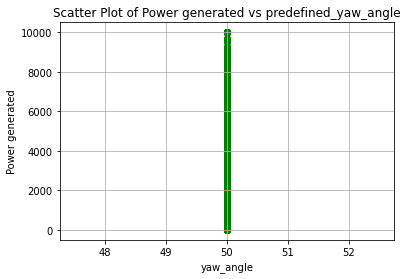

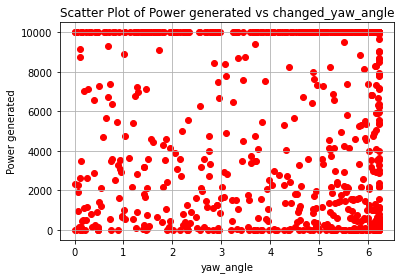

Power_list: [10000.004324502963, 9999.97489940362]
Predefined Yaw Angle 1: 55.74334939390489
Predefined Yaw Angle 2: 56.055223822538395
Changed Yaw Angle 1: 5.74334939390489
Changed Yaw Angle 2: 6.055223822538398
farm_power_baseline : [9999.99603894 9999.99587764], farm_power_yaw : [ 9999.99958862 10000.00254505]


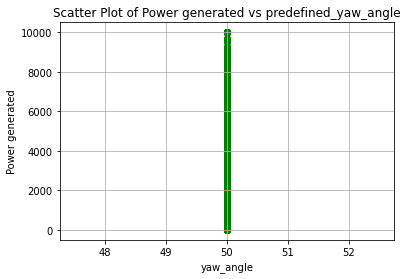

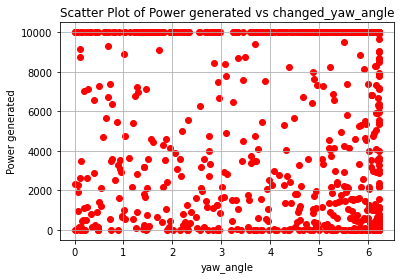

Power_list: [9999.996038943564, 10000.006925647333]
Predefined Yaw Angle 1: 56.068910184522714
Predefined Yaw Angle 2: 50.13303644263994
Changed Yaw Angle 1: 6.068910184522717
Changed Yaw Angle 2: 0.13303644263993847
farm_power_baseline : [2834.66385439   19.81826349], farm_power_yaw : [6465.09182097  182.27108929]


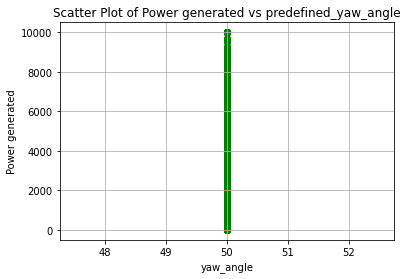

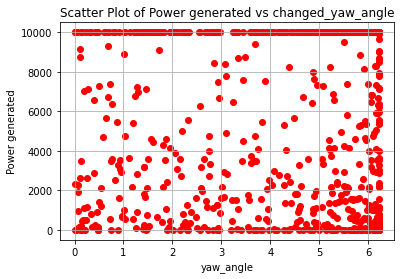

Power_list: [2834.663854392245, 6497.930686804095]
Predefined Yaw Angle 1: 56.07999319571519
Predefined Yaw Angle 2: 56.17260318021586
Changed Yaw Angle 1: 6.079993195715191
Changed Yaw Angle 2: 6.172603180215858
farm_power_baseline : [10000.00598808 10000.00601864], farm_power_yaw : [10000.00778914 10000.00829936]


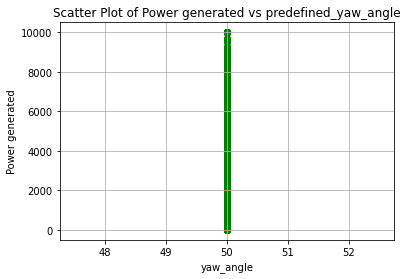

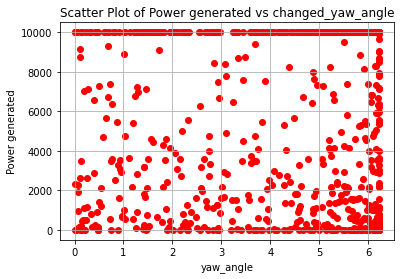

Power_list: [10000.006018635446, 10000.008299356803]
Predefined Yaw Angle 1: 56.214033821804406
Predefined Yaw Angle 2: 55.987180589319095
Changed Yaw Angle 1: 6.214033821804405
Changed Yaw Angle 2: 5.987180589319092
farm_power_baseline : [ 290.55841969 2547.73930731], farm_power_yaw : [ 797.85233833 5766.34913763]


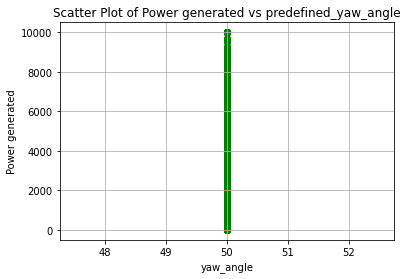

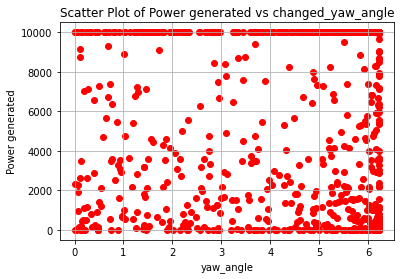

Power_list: [2547.739307305021, 5830.333276678791]
Predefined Yaw Angle 1: 55.37727073783038
Predefined Yaw Angle 2: 56.10027918186036
Changed Yaw Angle 1: 5.37727073783038
Changed Yaw Angle 2: 6.100279181860358
farm_power_baseline : [ 148.75388628 2637.85002692], farm_power_yaw : [ 485.80818116 5984.19100308]


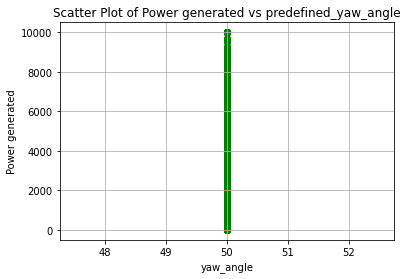

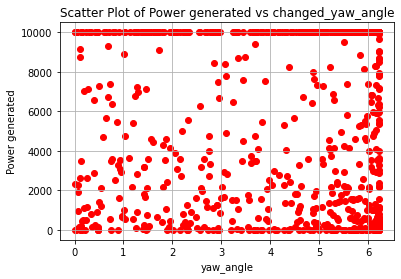

Power_list: [2637.850026918686, 6041.681753342064]
Predefined Yaw Angle 1: 56.10258266071346
Predefined Yaw Angle 2: 55.87334749694918
Changed Yaw Angle 1: 6.102582660713461
Changed Yaw Angle 2: 5.87334749694918
farm_power_baseline : [  45.96448392 1239.80703518], farm_power_yaw : [ 249.40270645 2881.9920064 ]


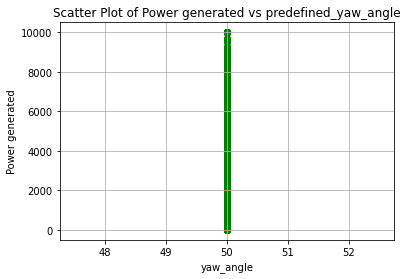

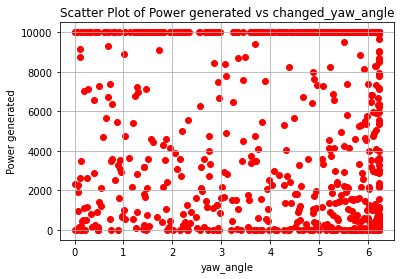

Power_list: [1239.8070351842834, 2913.105200450235]
Predefined Yaw Angle 1: 55.70492210990392
Predefined Yaw Angle 2: 54.30874807969479
Changed Yaw Angle 1: 5.704922109903919
Changed Yaw Angle 2: 4.308748079694789
farm_power_baseline : [4235.78449507 9445.62267133], farm_power_yaw : [ 9537.69352866 10000.00202601]


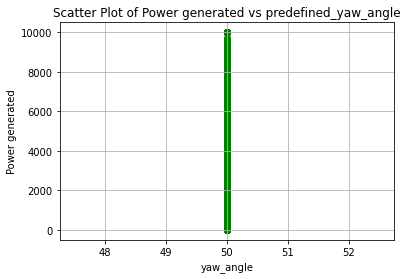

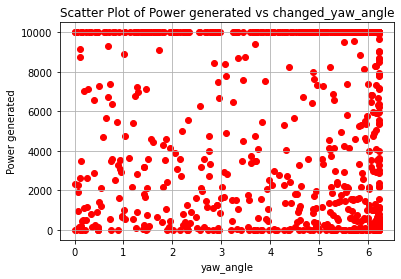

Power_list: [9445.622671329456, 10000.002026014314]
Predefined Yaw Angle 1: 54.689775702426424
Predefined Yaw Angle 2: 53.780699960863295
Changed Yaw Angle 1: 4.689775702426425
Changed Yaw Angle 2: 3.7806999608632945
farm_power_baseline : [10000.00132133  4560.45567489], farm_power_yaw : [10000.01409696  9999.98887567]


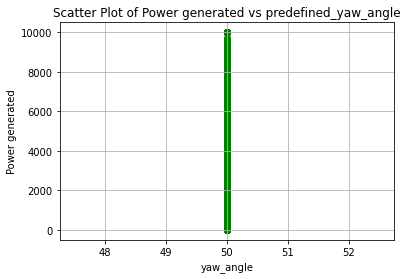

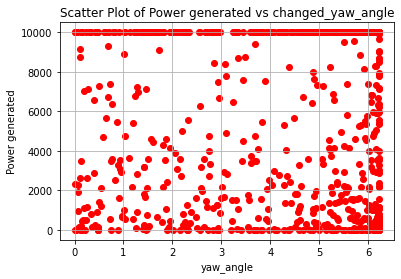

Power_list: [10000.001321330328, 10000.014096958152]
Predefined Yaw Angle 1: 56.09508532961267
Predefined Yaw Angle 2: 55.31620620742133
Changed Yaw Angle 1: 6.09508532961267
Changed Yaw Angle 2: 5.316206207421334
farm_power_baseline : [  666.47038485 10000.00165041], farm_power_yaw : [ 1638.89960443 10000.01410183]


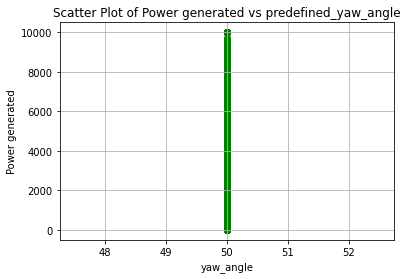

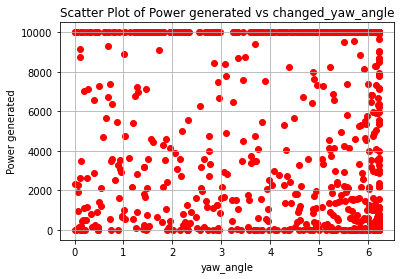

Power_list: [10000.001650410808, 10000.014101833014]
Predefined Yaw Angle 1: 54.13411353256801
Predefined Yaw Angle 2: 55.08647074651452
Changed Yaw Angle 1: 4.1341135325680085
Changed Yaw Angle 2: 5.08647074651452
farm_power_baseline : [9999.99613921  545.33604514], farm_power_yaw : [9999.99350315 1373.68221862]


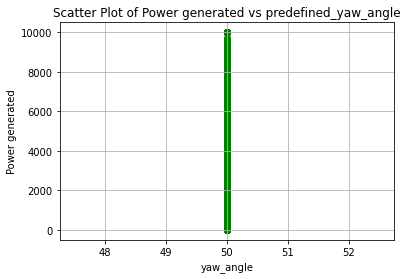

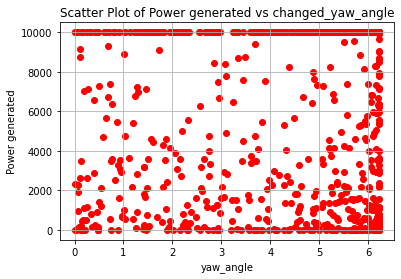

Power_list: [9999.996139211595, 9999.996267532086]
Predefined Yaw Angle 1: 55.581978876077066
Predefined Yaw Angle 2: 56.07368432258261
Changed Yaw Angle 1: 5.581978876077065
Changed Yaw Angle 2: 6.073684322582609
farm_power_baseline : [  147.09326811 10000.00532341], farm_power_yaw : [ 481.99055868 9999.99641392]


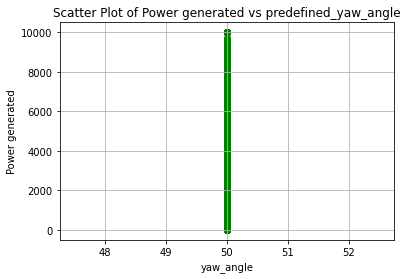

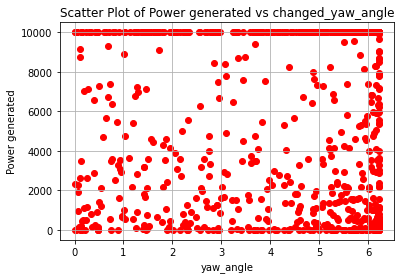

Power_list: [10000.0053234058, 9999.996413924473]
Predefined Yaw Angle 1: 52.13095033963766
Predefined Yaw Angle 2: 55.464563454898595
Changed Yaw Angle 1: 2.130950339637657
Changed Yaw Angle 2: 5.464563454898595
farm_power_baseline : [6184.3672262  4182.38383782], farm_power_yaw : [10000.0027315   9449.85556226]


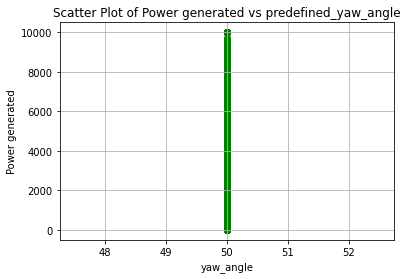

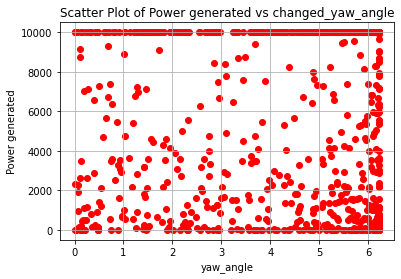

Power_list: [6184.367226198821, 10000.003170181055]
Predefined Yaw Angle 1: 55.07926194658608
Predefined Yaw Angle 2: 56.151913081707036
Changed Yaw Angle 1: 5.079261946586078
Changed Yaw Angle 2: 6.151913081707033
farm_power_baseline : [891.0645104  224.22713815], farm_power_yaw : [2132.40534756  657.30508599]


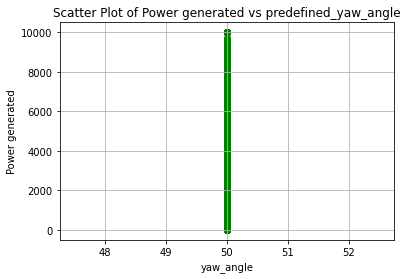

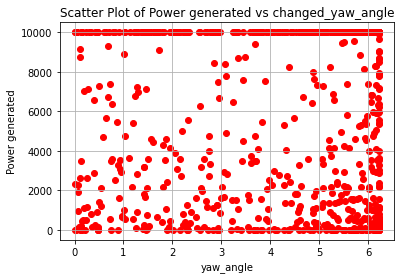

Power_list: [891.0645103998446, 2151.793528493324]
Predefined Yaw Angle 1: 55.78780447671715
Predefined Yaw Angle 2: 55.73152564678697
Changed Yaw Angle 1: 5.787804476717147
Changed Yaw Angle 2: 5.731525646786973
farm_power_baseline : [ 388.73625701 9999.9957882 ], farm_power_yaw : [ 1021.43094096 10000.00638569]


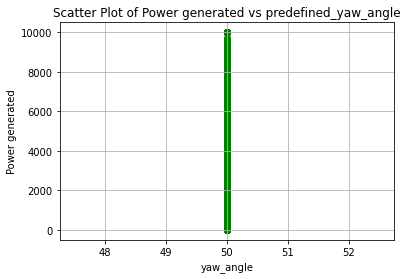

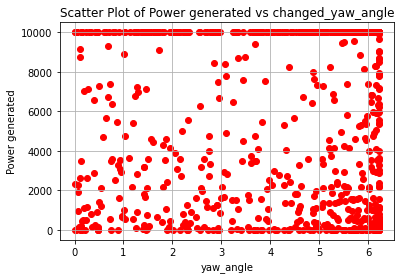

Power_list: [9999.995788200195, 10000.01057008439]
Predefined Yaw Angle 1: 55.95306960132311
Predefined Yaw Angle 2: 52.83424260316945
Changed Yaw Angle 1: 5.953069601323104
Changed Yaw Angle 2: 2.834242603169451
farm_power_baseline : [7147.83153574 6656.28930228], farm_power_yaw : [10000.00431202 10000.00549046]


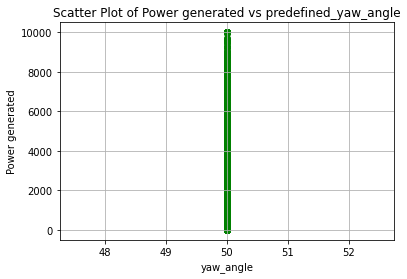

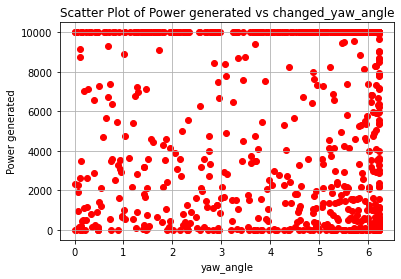

Power_list: [7147.8315357413485, 10000.005490460408]
Predefined Yaw Angle 1: 55.49718968592334
Predefined Yaw Angle 2: 52.18051884723268
Changed Yaw Angle 1: 5.49718968592334
Changed Yaw Angle 2: 2.1805188472326815
farm_power_baseline : [1400.69126866 9999.99447842], farm_power_yaw : [ 3263.94237881 10000.00628288]


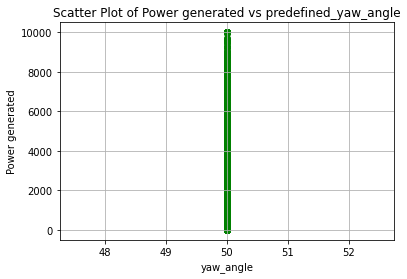

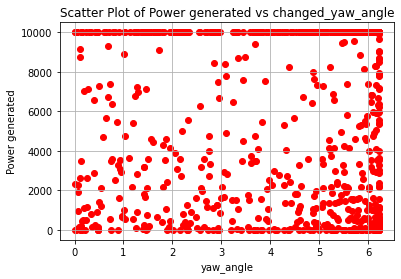

Power_list: [9999.994478419869, 10000.00628288411]
Predefined Yaw Angle 1: 55.51951443270926
Predefined Yaw Angle 2: 52.11773189505686
Changed Yaw Angle 1: 5.519514432709257
Changed Yaw Angle 2: 2.117731895056864
farm_power_baseline : [4373.20541194 8100.11107949], farm_power_yaw : [9840.03749608 9999.99596531]


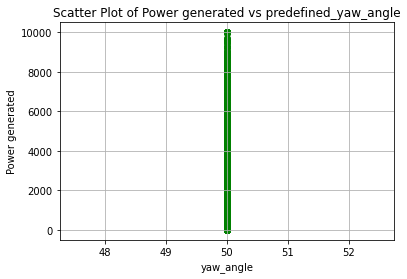

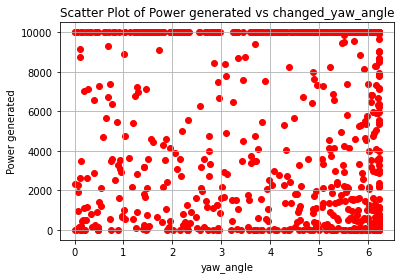

Power_list: [8100.111079488641, 9999.996431782449]
Predefined Yaw Angle 1: 54.59294209992671
Predefined Yaw Angle 2: 56.07904260269585
Changed Yaw Angle 1: 4.592942099926708
Changed Yaw Angle 2: 6.079042602695848
farm_power_baseline : [1314.24011792 7183.07755332], farm_power_yaw : [ 3057.0743403  10000.00425814]


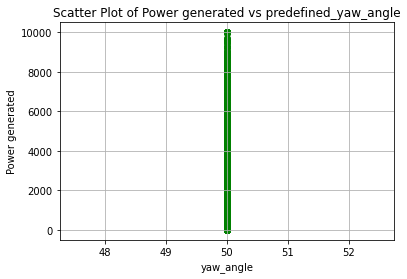

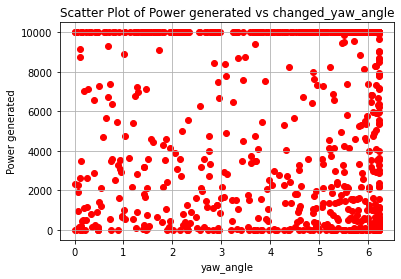

Power_list: [7183.077553320404, 10000.00425814168]
Predefined Yaw Angle 1: 55.56194071940309
Predefined Yaw Angle 2: 55.875880163145844
Changed Yaw Angle 1: 5.561940719403091
Changed Yaw Angle 2: 5.875880163145846
farm_power_baseline : [0. 0.], farm_power_yaw : [18.35910023 54.57278703]


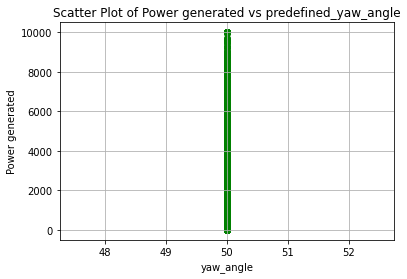

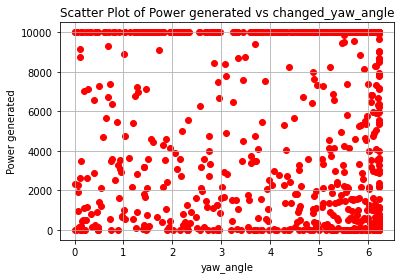

Power_list: [0.0, 55.89474775084281]
Predefined Yaw Angle 1: 55.0733880784858
Predefined Yaw Angle 2: 55.22576312627337
Changed Yaw Angle 1: 5.073388078485799
Changed Yaw Angle 2: 5.22576312627337
farm_power_baseline : [ 4288.01423062 10000.00502628], farm_power_yaw : [9642.0925594  9999.99085474]


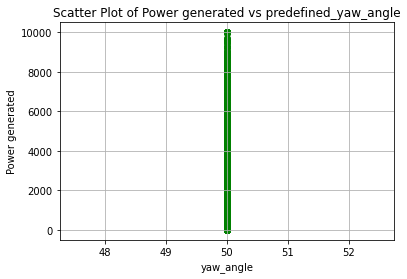

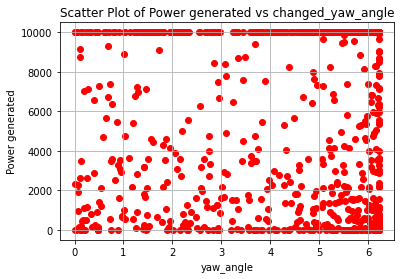

Power_list: [10000.005026280032, 9999.990854738575]
Predefined Yaw Angle 1: 55.02653561806025
Predefined Yaw Angle 2: 55.39282428671848
Changed Yaw Angle 1: 5.026535618060253
Changed Yaw Angle 2: 5.3928242867184775
farm_power_baseline : [ 353.79131069 9999.98812036], farm_power_yaw : [  954.01237417 10000.00779665]


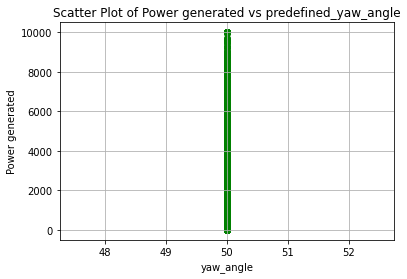

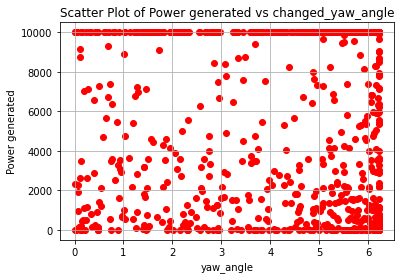

Power_list: [9999.988120358415, 10000.009174802366]
Predefined Yaw Angle 1: 56.16006965600391
Predefined Yaw Angle 2: 54.97038941355236
Changed Yaw Angle 1: 6.160069656003912
Changed Yaw Angle 2: 4.970389413552364
farm_power_baseline : [9999.99230649 9999.99370728], farm_power_yaw : [10000.01718744 10000.0125152 ]


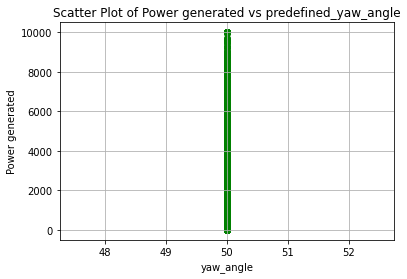

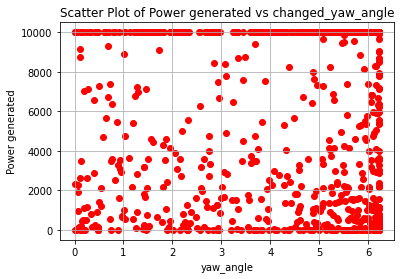

Power_list: [9999.993707281827, 10000.017187442087]
Predefined Yaw Angle 1: 55.00361645371903
Predefined Yaw Angle 2: 55.11715196016889
Changed Yaw Angle 1: 5.00361645371903
Changed Yaw Angle 2: 5.117151960168887
farm_power_baseline : [3229.70737729 9999.99579941], farm_power_yaw : [ 7324.9701028 10000.0068843]


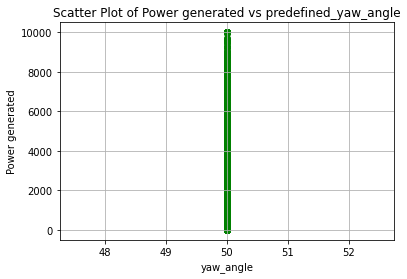

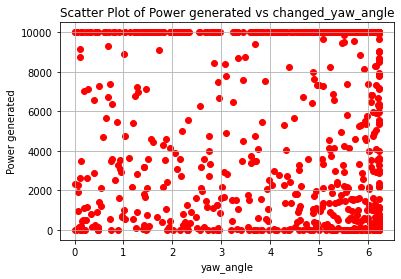

Power_list: [9999.995799406024, 10000.01011346074]
Predefined Yaw Angle 1: 56.182325160601486
Predefined Yaw Angle 2: 55.235628007583244
Changed Yaw Angle 1: 6.1823251606014855
Changed Yaw Angle 2: 5.235628007583242
farm_power_baseline : [4999.88528904   66.06368963], farm_power_yaw : [9999.99583694  304.38668048]


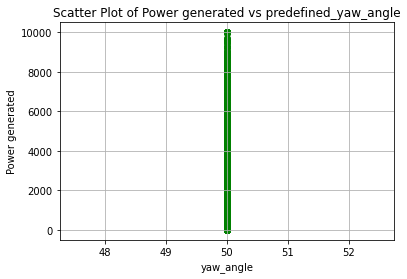

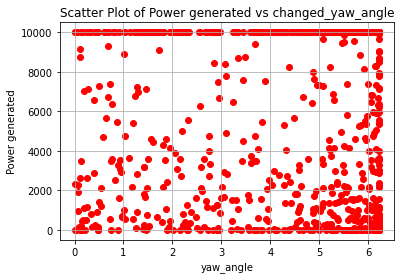

Power_list: [4999.885289044654, 9999.996586926822]
Predefined Yaw Angle 1: 56.04130971561735
Predefined Yaw Angle 2: 55.228461973722055
Changed Yaw Angle 1: 6.041309715617354
Changed Yaw Angle 2: 5.228461973722057
farm_power_baseline : [10000.00334974     0.        ], farm_power_yaw : [10000.01389695     0.        ]


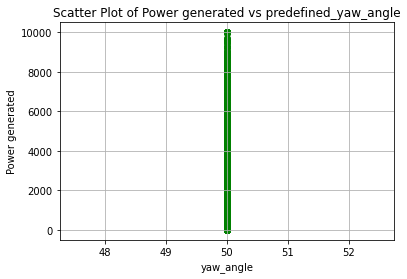

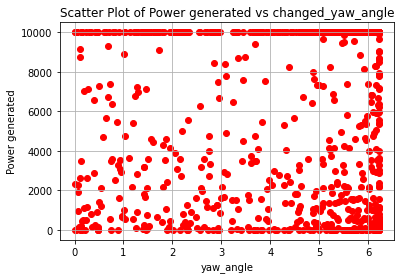

Power_list: [10000.003349741688, 10000.0138969539]
Predefined Yaw Angle 1: 56.22610699629017
Predefined Yaw Angle 2: 56.07795550033888
Changed Yaw Angle 1: 6.22610699629017
Changed Yaw Angle 2: 6.077955500338878
farm_power_baseline : [10000.00432329  1187.73357312], farm_power_yaw : [9999.97494983 2768.1962199 ]


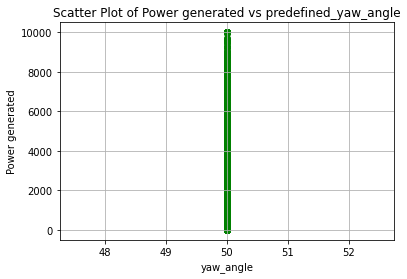

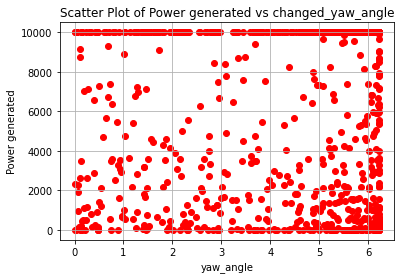

Power_list: [10000.004323294872, 9999.974949832438]
Predefined Yaw Angle 1: 56.18550923600078
Predefined Yaw Angle 2: 56.16743078874671
Changed Yaw Angle 1: 6.185509236000784
Changed Yaw Angle 2: 6.167430788746707
farm_power_baseline : [2565.6254506   363.55959791], farm_power_yaw : [5806.56821514  970.085805  ]


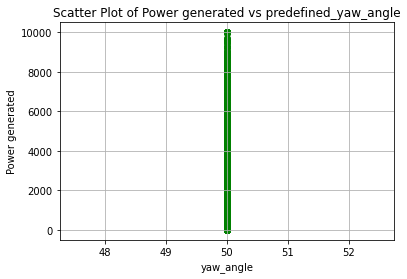

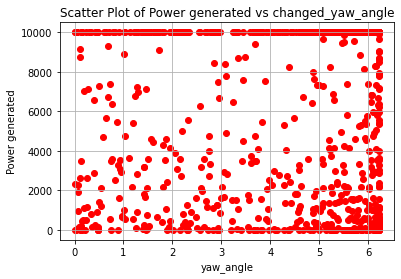

Power_list: [2565.625450599021, 5872.283991918607]
Predefined Yaw Angle 1: 55.93244874500262
Predefined Yaw Angle 2: 56.09241539979357
Changed Yaw Angle 1: 5.93244874500262
Changed Yaw Angle 2: 6.092415399793572
farm_power_baseline : [10000.00393185    72.06775709], farm_power_yaw : [10000.01384055   320.33147463]


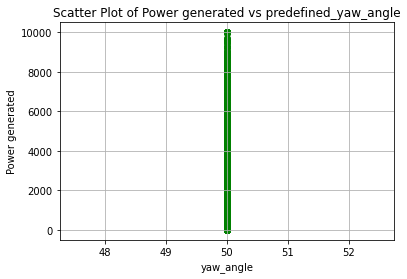

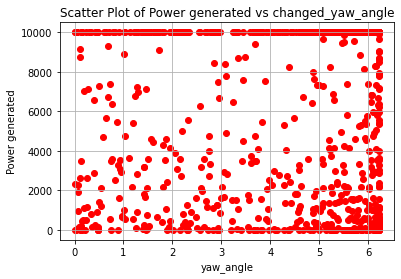

Power_list: [10000.003931845833, 10000.013840550255]
Predefined Yaw Angle 1: 56.162404183015475
Predefined Yaw Angle 2: 55.875253787657456
Changed Yaw Angle 1: 6.162404183015475
Changed Yaw Angle 2: 5.875253787657459
farm_power_baseline : [18.3643285  8.7909823], farm_power_yaw : [177.88551393 158.03159616]


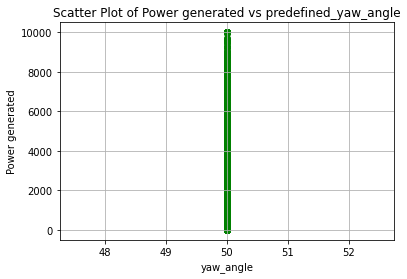

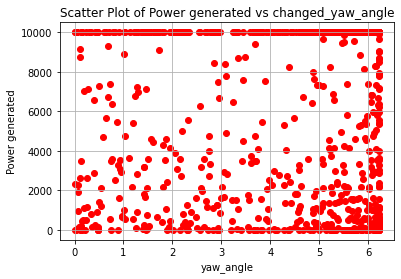

Power_list: [18.36432850397088, 180.66196343522657]
Predefined Yaw Angle 1: 55.84810163958985
Predefined Yaw Angle 2: 55.24036364063362
Changed Yaw Angle 1: 5.848101639589849
Changed Yaw Angle 2: 5.240363640633621
farm_power_baseline : [ 0.         41.85673719], farm_power_yaw : [ 39.2983781  238.77252251]


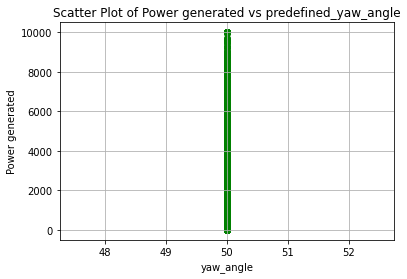

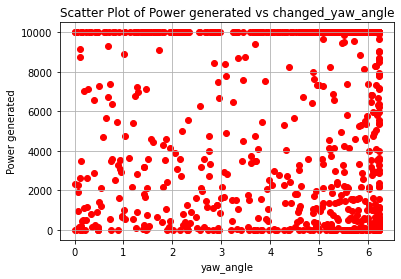

Power_list: [41.85673719316413, 242.05659556945744]
Predefined Yaw Angle 1: 56.18106282224479
Predefined Yaw Angle 2: 53.84968142573464
Changed Yaw Angle 1: 6.181062822244788
Changed Yaw Angle 2: 3.849681425734636
farm_power_baseline : [3814.34164767 2051.33239642], farm_power_yaw : [8612.37402465 4676.33223932]


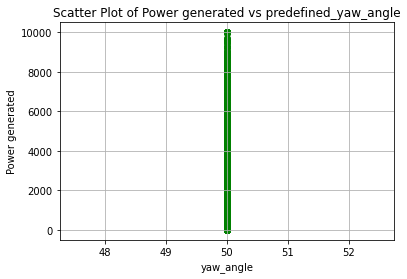

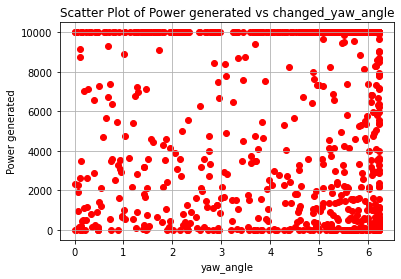

Power_list: [3814.3416476717753, 8612.374024649362]
Predefined Yaw Angle 1: 55.94324839585511
Predefined Yaw Angle 2: 55.0606838903115
Changed Yaw Angle 1: 5.94324839585511
Changed Yaw Angle 2: 5.060683890311501
farm_power_baseline : [9999.99856753  254.27792878], farm_power_yaw : [10000.01446244   720.00487343]


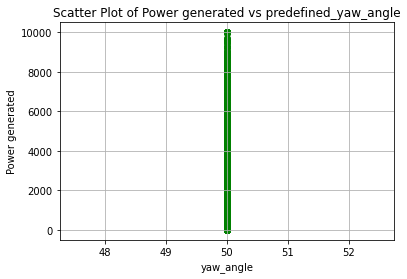

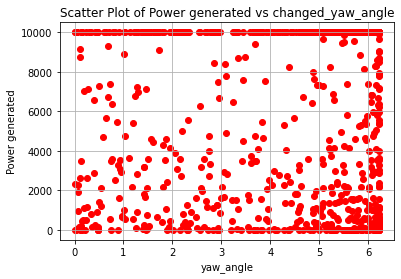

Power_list: [9999.99856753456, 10000.01446244244]
Predefined Yaw Angle 1: 56.05417970790127
Predefined Yaw Angle 2: 55.934828168610316
Changed Yaw Angle 1: 6.0541797079012705
Changed Yaw Angle 2: 5.934828168610314
farm_power_baseline : [6956.14243434 3652.10073544], farm_power_yaw : [10000.00483931  8238.66883763]


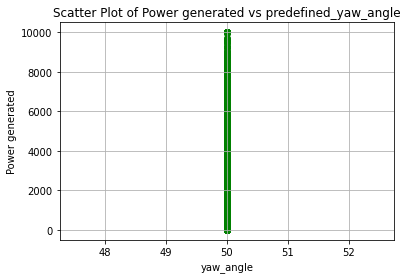

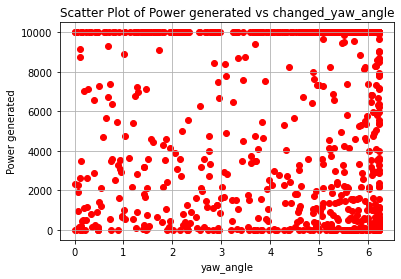

Power_list: [6956.142434336547, 10000.004839312276]
Predefined Yaw Angle 1: 56.16296397947661
Predefined Yaw Angle 2: 55.98390703170717
Changed Yaw Angle 1: 6.16296397947661
Changed Yaw Angle 2: 5.983907031707166
farm_power_baseline : [1799.51350212 5873.67377141], farm_power_yaw : [4111.12504503 9999.9977234 ]


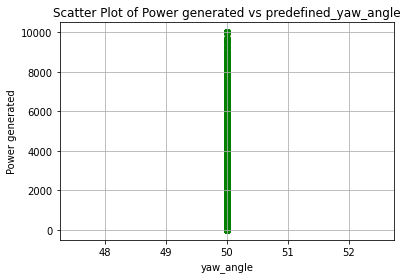

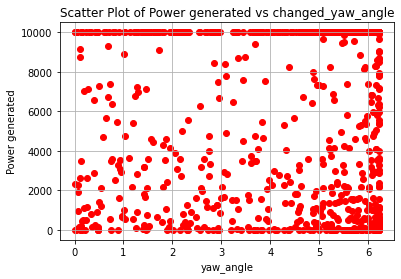

Power_list: [5873.673771406164, 9999.998648436098]
Predefined Yaw Angle 1: 55.685673314177045
Predefined Yaw Angle 2: 55.77371597740822
Changed Yaw Angle 1: 5.685673314177045
Changed Yaw Angle 2: 5.773715977408226
farm_power_baseline : [3326.76970188    0.        ], farm_power_yaw : [7529.20324814  132.79998579]


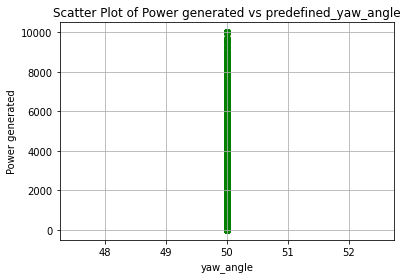

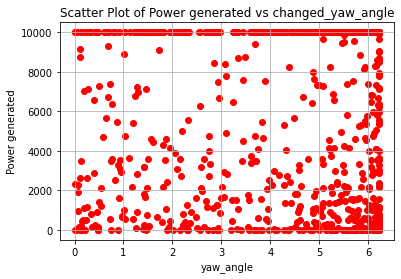

Power_list: [3326.76970187575, 7596.562623964257]
Predefined Yaw Angle 1: 56.22728890718194
Predefined Yaw Angle 2: 55.94029190990272
Changed Yaw Angle 1: 6.227288907181947
Changed Yaw Angle 2: 5.9402919099027205
farm_power_baseline : [ 899.56347697 1485.68666916], farm_power_yaw : [2146.99917873 3416.4065137 ]


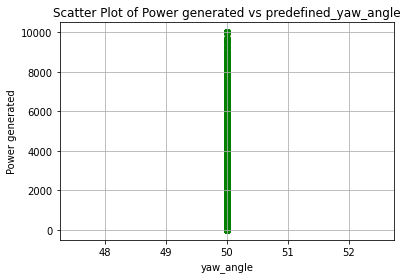

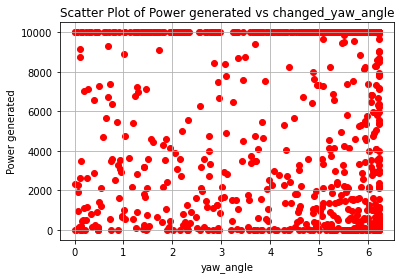

Power_list: [1485.6866691602895, 3455.036071796192]
Predefined Yaw Angle 1: 55.8922403388646
Predefined Yaw Angle 2: 56.00248737400043
Changed Yaw Angle 1: 5.892240338864604
Changed Yaw Angle 2: 6.002487374000431
farm_power_baseline : [3842.91154177  159.21973004], farm_power_yaw : [8653.53275936  508.50514225]


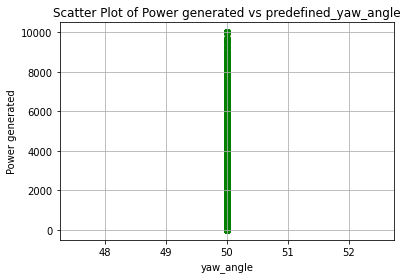

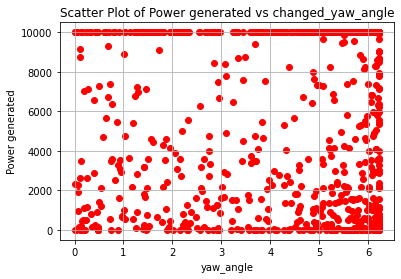

Power_list: [3842.9115417660296, 8736.626650686243]
Predefined Yaw Angle 1: 56.09242216852259
Predefined Yaw Angle 2: 55.87925172508589
Changed Yaw Angle 1: 6.0924221685225906
Changed Yaw Angle 2: 5.8792517250858864
farm_power_baseline : [10000.00323188  2160.9137593 ], farm_power_yaw : [10000.01392296  4906.07634714]


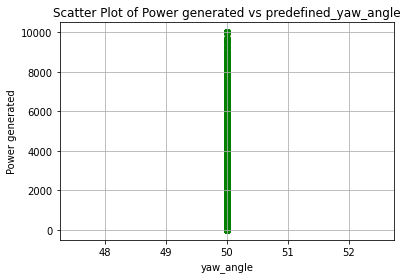

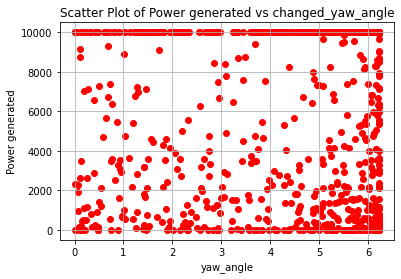

Power_list: [10000.003231883566, 10000.013922964152]
Predefined Yaw Angle 1: 55.999626983499866
Predefined Yaw Angle 2: 56.027089123518365
Changed Yaw Angle 1: 5.999626983499869
Changed Yaw Angle 2: 6.027089123518365
farm_power_baseline : [404.4320797   64.91903833], farm_power_yaw : [1051.59735804  300.89770694]


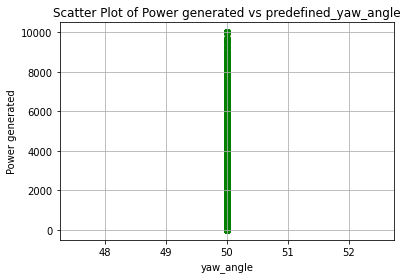

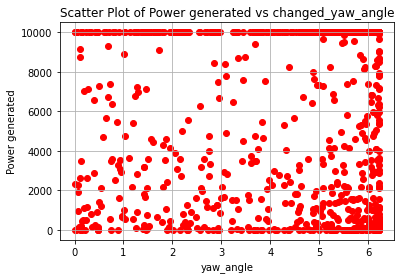

Power_list: [404.4320796994396, 1062.6903997854056]
Predefined Yaw Angle 1: 56.15614255866048
Predefined Yaw Angle 2: 54.019576455895695
Changed Yaw Angle 1: 6.1561425586604805
Changed Yaw Angle 2: 4.019576455895696
farm_power_baseline : [10000.00595299  4461.14384068], farm_power_yaw : [10000.00638325  9983.28481052]


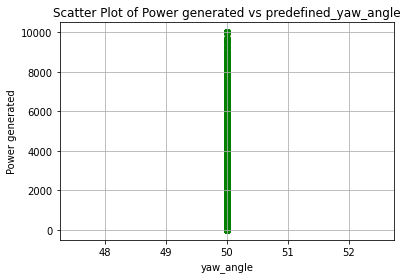

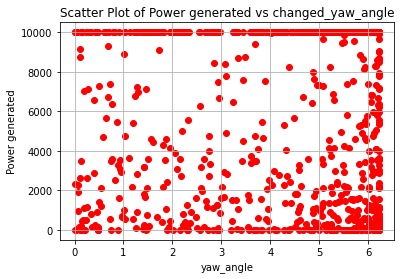

Power_list: [10000.00595298862, 10000.00644736818]
Predefined Yaw Angle 1: 56.065122636820405
Predefined Yaw Angle 2: 56.09167450837831
Changed Yaw Angle 1: 6.065122636820407
Changed Yaw Angle 2: 6.091674508378312
farm_power_baseline : [9114.39368514 4059.59656212], farm_power_yaw : [10000.00352266  9138.99542952]


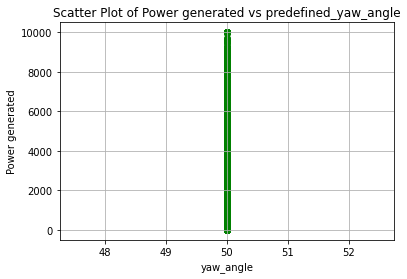

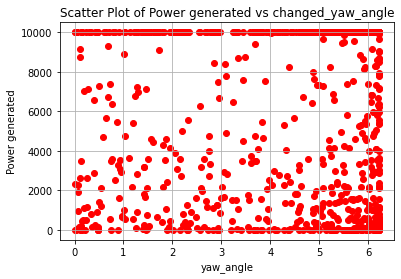

Power_list: [9114.393685138364, 10000.00352266488]
Predefined Yaw Angle 1: 55.93686533135441
Predefined Yaw Angle 2: 55.978179104834624
Changed Yaw Angle 1: 5.936865331354408
Changed Yaw Angle 2: 5.978179104834624
farm_power_baseline : [ 962.59120574 2300.87374404], farm_power_yaw : [2279.7318028 5240.2502179]


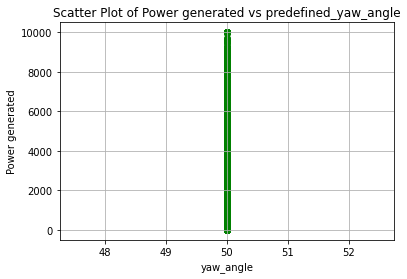

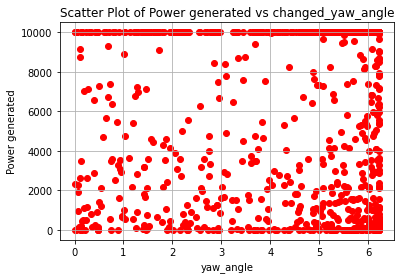

Power_list: [2300.873744043645, 5293.885951152149]
Predefined Yaw Angle 1: 56.13863919871204
Predefined Yaw Angle 2: 55.99896028345273
Changed Yaw Angle 1: 6.138639198712044
Changed Yaw Angle 2: 5.99896028345273
farm_power_baseline : [9999.9965358   439.31037887], farm_power_yaw : [9999.9755672  1130.17282221]


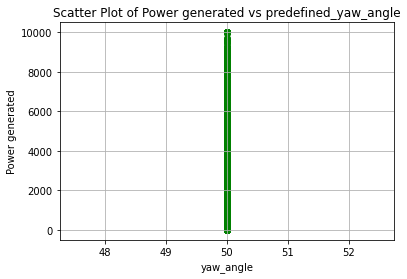

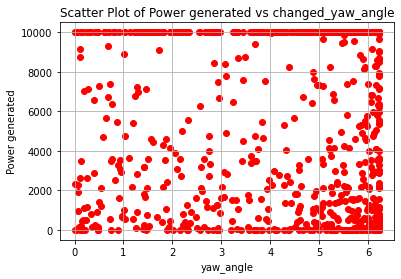

Power_list: [9999.99653580141, 9999.980106261904]
Predefined Yaw Angle 1: 55.01460838480222
Predefined Yaw Angle 2: 56.08002797229918
Changed Yaw Angle 1: 5.014608384802224
Changed Yaw Angle 2: 6.0800279722991775
farm_power_baseline : [9999.99674285  133.27888537], farm_power_yaw : [9999.9817568   452.00482099]


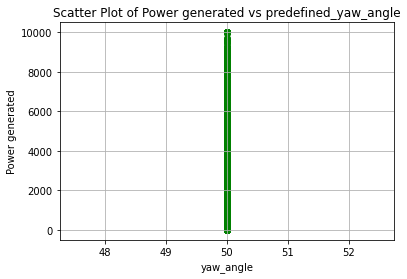

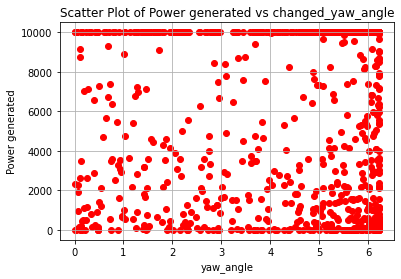

Power_list: [9999.996742854404, 9999.981756800953]
Predefined Yaw Angle 1: 55.695185060326374
Predefined Yaw Angle 2: 55.23055788149995
Changed Yaw Angle 1: 5.695185060326372
Changed Yaw Angle 2: 5.23055788149995
farm_power_baseline : [3460.03965916 5021.36195214], farm_power_yaw : [7836.12968522 9999.99623367]


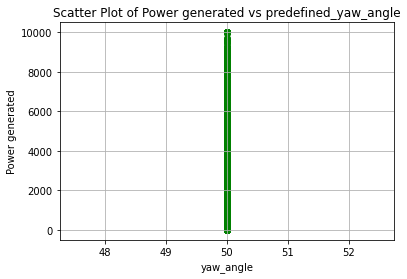

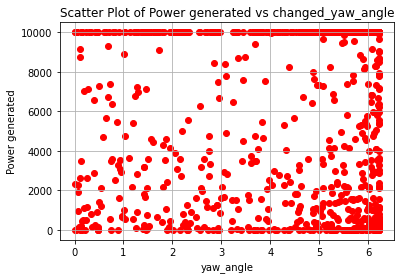

Power_list: [5021.361952137716, 9999.996917871405]
Predefined Yaw Angle 1: 55.86093221708963
Predefined Yaw Angle 2: 54.44617811090335
Changed Yaw Angle 1: 5.8609322170896325
Changed Yaw Angle 2: 4.446178110903347
farm_power_baseline : [4979.48862348 8163.53490942], farm_power_yaw : [9999.99565503 9999.99644745]


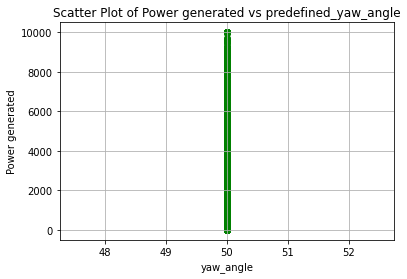

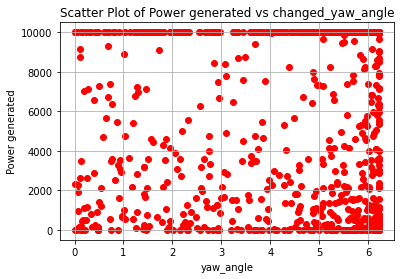

Power_list: [8163.53490941639, 9999.997171680583]
Predefined Yaw Angle 1: 55.826863995160906
Predefined Yaw Angle 2: 55.37583065580268
Changed Yaw Angle 1: 5.826863995160903
Changed Yaw Angle 2: 5.375830655802681
farm_power_baseline : [ 184.87627662 9999.99684383], farm_power_yaw : [ 572.81943594 9999.98626154]


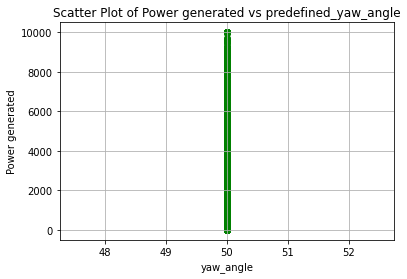

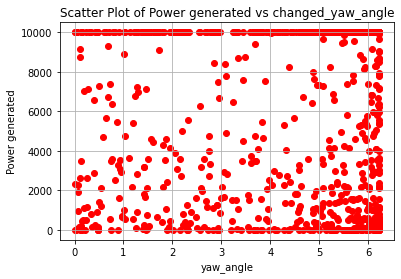

Power_list: [9999.996843834295, 9999.98626154027]
Predefined Yaw Angle 1: 56.162876627792855
Predefined Yaw Angle 2: 55.982118985351285
Changed Yaw Angle 1: 6.162876627792855
Changed Yaw Angle 2: 5.982118985351287
farm_power_baseline : [ 343.47990524 9950.10987002], farm_power_yaw : [  930.71438963 10000.00381453]


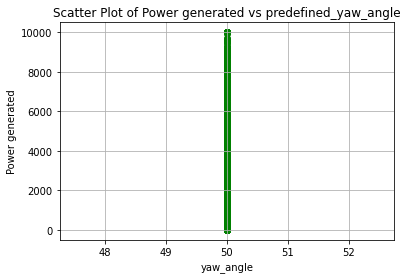

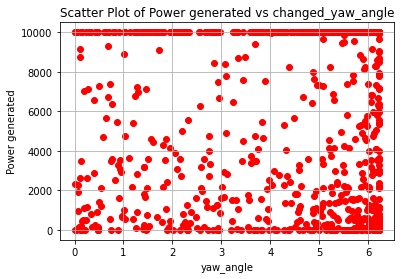

Power_list: [9950.109870016377, 10000.005672805024]
Predefined Yaw Angle 1: 54.67920934448543
Predefined Yaw Angle 2: 55.96265021251837
Changed Yaw Angle 1: 4.679209344485427
Changed Yaw Angle 2: 5.962650212518372
farm_power_baseline : [ 404.1913939  1160.32190951], farm_power_yaw : [1053.40200341 2720.05455664]


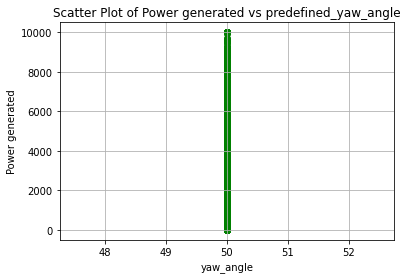

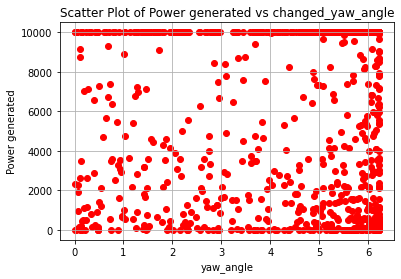

Power_list: [1160.3219095093932, 2741.633205989798]
Predefined Yaw Angle 1: 56.112747413962076
Predefined Yaw Angle 2: 53.63091046535179
Changed Yaw Angle 1: 6.112747413962075
Changed Yaw Angle 2: 3.630910465351788
farm_power_baseline : [2972.89225333 9999.99613973], farm_power_yaw : [6746.05682015 9999.99309247]


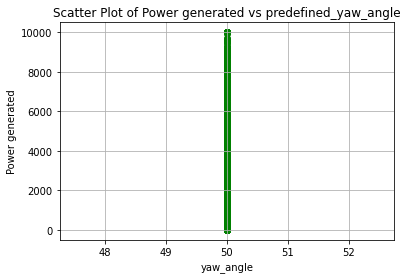

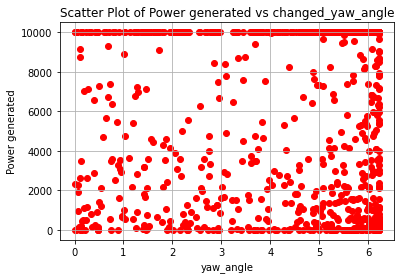

Power_list: [9999.996139725936, 9999.996245845065]
Predefined Yaw Angle 1: 55.788714212545514
Predefined Yaw Angle 2: 56.149660047424824
Changed Yaw Angle 1: 5.788714212545518
Changed Yaw Angle 2: 6.149660047424826
farm_power_baseline : [710.93996033   0.        ], farm_power_yaw : [1736.23880331   21.76574499]


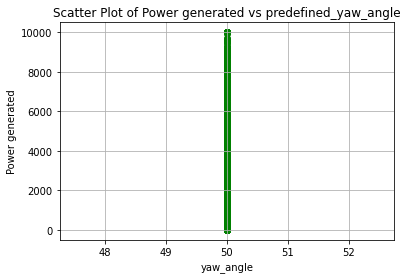

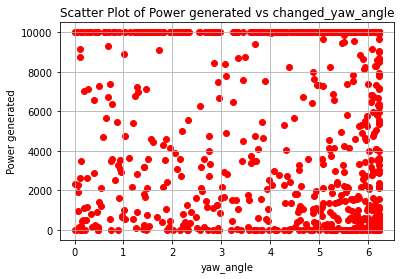

Power_list: [710.9399603306343, 1753.945940852195]
Predefined Yaw Angle 1: 55.89836827253288
Predefined Yaw Angle 2: 56.13828355588022
Changed Yaw Angle 1: 5.898368272532877
Changed Yaw Angle 2: 6.138283555880225
farm_power_baseline : [   0.         5348.90325604], farm_power_yaw : [   0.         9999.99647486]


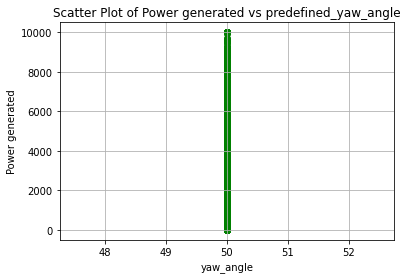

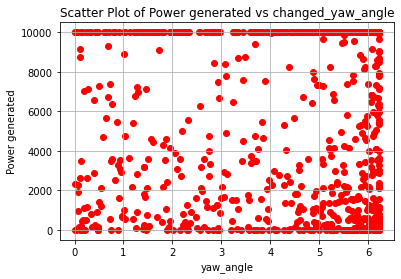

Power_list: [5348.903256036913, 9999.996474861142]
Predefined Yaw Angle 1: 55.986025687180614
Predefined Yaw Angle 2: 55.85614880262945
Changed Yaw Angle 1: 5.986025687180617
Changed Yaw Angle 2: 5.856148802629448
farm_power_baseline : [ 966.16560054 4862.17574173], farm_power_yaw : [2287.75393519 9999.99367065]


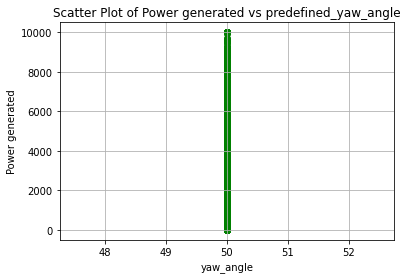

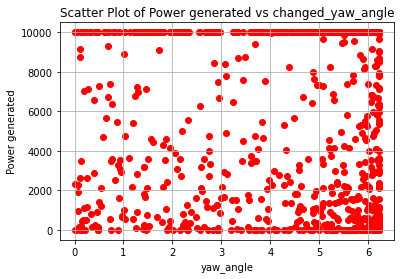

Power_list: [4862.17574173299, 9999.9944648919]
Predefined Yaw Angle 1: 56.153137980318654
Predefined Yaw Angle 2: 56.15805646170963
Changed Yaw Angle 1: 6.153137980318653
Changed Yaw Angle 2: 6.158056461709627
farm_power_baseline : [3642.3133281  9999.99611628], farm_power_yaw : [8212.94828025 9999.99247018]


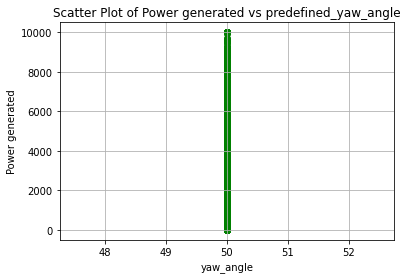

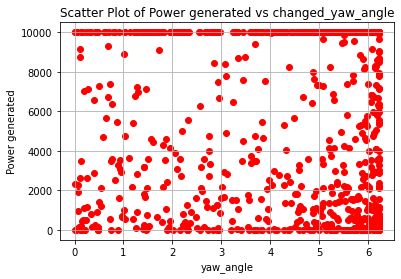

Power_list: [9999.996116279894, 9999.99720124346]
Predefined Yaw Angle 1: 56.1209020132199
Predefined Yaw Angle 2: 55.123498805678764
Changed Yaw Angle 1: 6.120902013219898
Changed Yaw Angle 2: 5.123498805678764
farm_power_baseline : [149.96864488   0.        ], farm_power_yaw : [488.68341021  13.49755239]


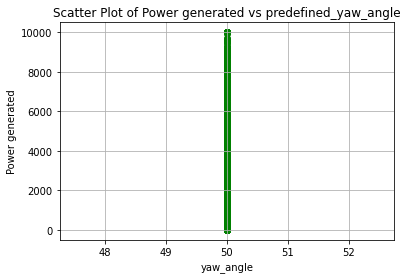

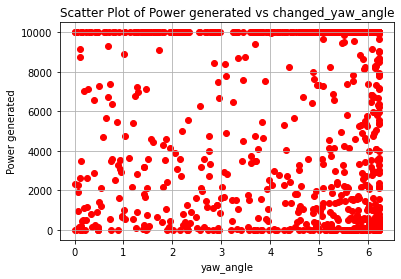

Power_list: [149.96864488194632, 493.8748507657217]
Predefined Yaw Angle 1: 55.7652746665273
Predefined Yaw Angle 2: 55.79529716961779
Changed Yaw Angle 1: 5.7652746665272945
Changed Yaw Angle 2: 5.795297169617792
farm_power_baseline : [ 201.50846464 3074.86521231], farm_power_yaw : [ 609.79362074 6959.94225762]


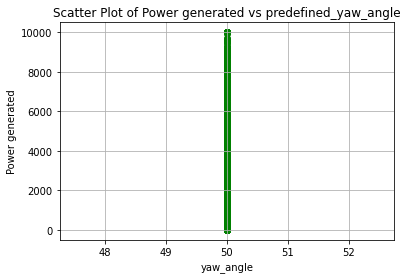

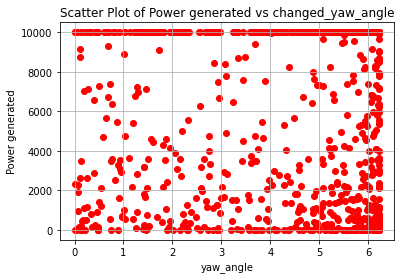

Power_list: [3074.865212306228, 7026.6753517042325]
Predefined Yaw Angle 1: 56.19490380306215
Predefined Yaw Angle 2: 55.85731313665803
Changed Yaw Angle 1: 6.1949038030621475
Changed Yaw Angle 2: 5.857313136658031
farm_power_baseline : [7085.53187423    0.        ], farm_power_yaw : [10000.00453159    19.09561814]


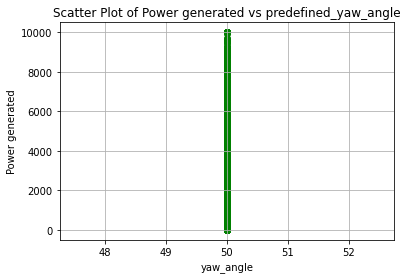

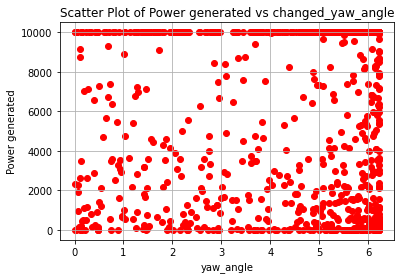

Power_list: [7085.531874227118, 10000.00453158938]
Predefined Yaw Angle 1: 56.202546542758455
Predefined Yaw Angle 2: 56.05096702585202
Changed Yaw Angle 1: 6.202546542758457
Changed Yaw Angle 2: 6.050967025852016
farm_power_baseline : [    0.         10000.00255977], farm_power_yaw : [   48.86239242 10000.0140082 ]


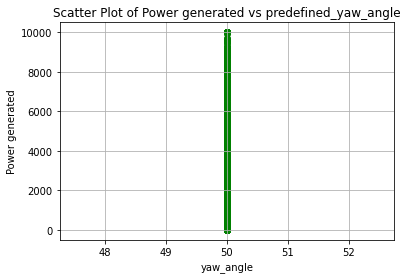

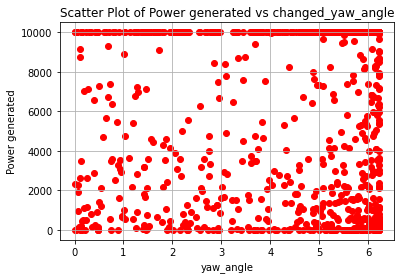

Power_list: [10000.002559768873, 10000.014008196145]
Predefined Yaw Angle 1: 56.0237349829517
Predefined Yaw Angle 2: 55.492933044726776
Changed Yaw Angle 1: 6.023734982951703
Changed Yaw Angle 2: 5.492933044726774
farm_power_baseline : [1960.95985271    0.        ], farm_power_yaw : [4471.89364424    0.        ]


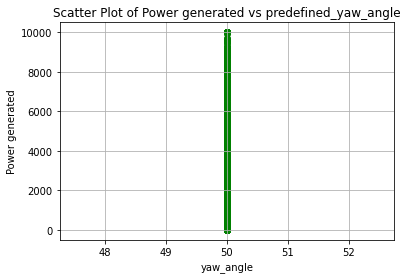

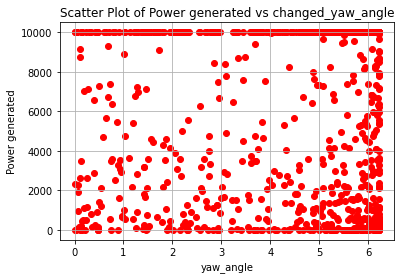

Power_list: [1960.9598527091364, 4514.556265161688]
Predefined Yaw Angle 1: 56.14959224764332
Predefined Yaw Angle 2: 54.19066325064457
Changed Yaw Angle 1: 6.149592247643321
Changed Yaw Angle 2: 4.190663250644566
farm_power_baseline : [ 563.98729373 2729.17498335], farm_power_yaw : [1413.95591937 6207.16679187]


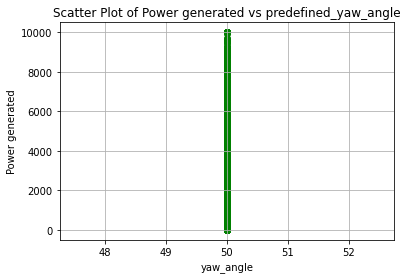

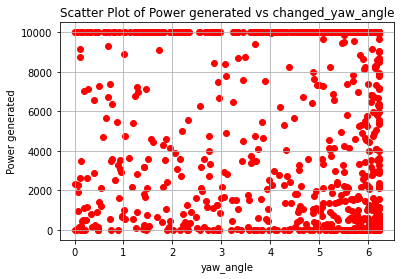

Power_list: [2729.1749833466856, 6255.848017966962]
Predefined Yaw Angle 1: 56.02802906389335
Predefined Yaw Angle 2: 56.103159656895386
Changed Yaw Angle 1: 6.028029063893347
Changed Yaw Angle 2: 6.1031596568953885
farm_power_baseline : [5331.43466595 7097.79895767], farm_power_yaw : [ 9999.99651146 10000.0045044 ]


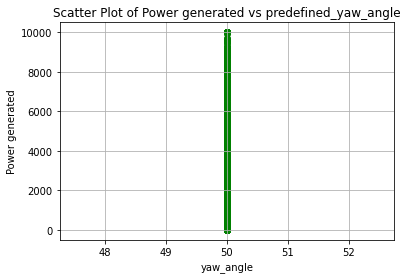

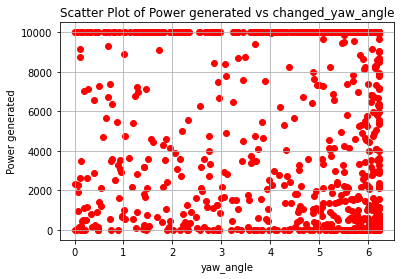

Power_list: [7097.798957669286, 10000.004504399247]
Predefined Yaw Angle 1: 56.19109281954224
Predefined Yaw Angle 2: 56.034833595968315
Changed Yaw Angle 1: 6.191092819542244
Changed Yaw Angle 2: 6.0348335959683155
farm_power_baseline : [4041.12786861 4785.51566222], farm_power_yaw : [9095.37176312 9999.9923064 ]


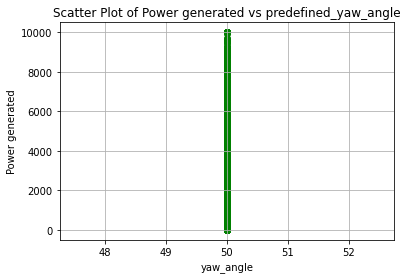

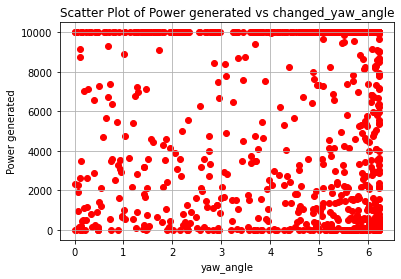

Power_list: [4785.515662219956, 9999.993148294792]
Predefined Yaw Angle 1: 55.969818754050834
Predefined Yaw Angle 2: 55.91419133332329
Changed Yaw Angle 1: 5.969818754050831
Changed Yaw Angle 2: 5.91419133332329
farm_power_baseline : [   0.         6981.86154046], farm_power_yaw : [    0.         10000.00477475]


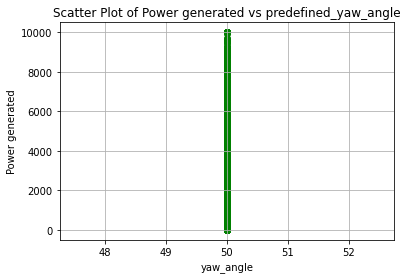

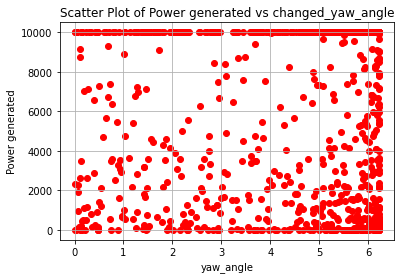

Power_list: [6981.861540457019, 10000.004774745128]
Predefined Yaw Angle 1: 55.77781549210048
Predefined Yaw Angle 2: 56.121881679358644
Changed Yaw Angle 1: 5.777815492100478
Changed Yaw Angle 2: 6.121881679358645
farm_power_baseline : [ 9358.29508876 10000.00306492], farm_power_yaw : [10000.00249407 10000.0139416 ]


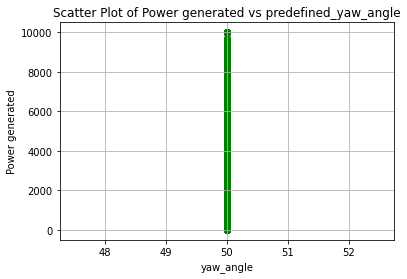

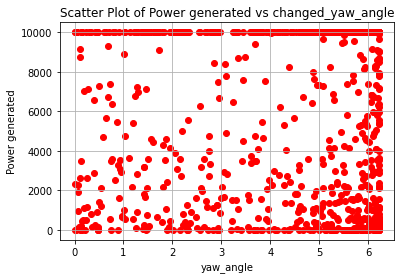

Power_list: [10000.003064917888, 10000.013941598456]
Predefined Yaw Angle 1: 55.98560277719951
Predefined Yaw Angle 2: 55.8406673145806
Changed Yaw Angle 1: 5.985602777199512
Changed Yaw Angle 2: 5.8406673145806
farm_power_baseline : [ 9999.99607109 10000.00598444], farm_power_yaw : [ 9999.9946704  10000.00752849]


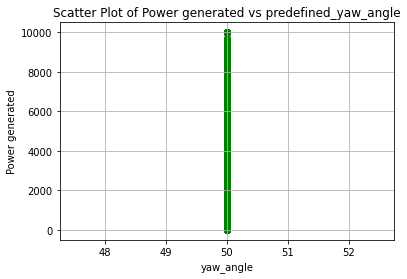

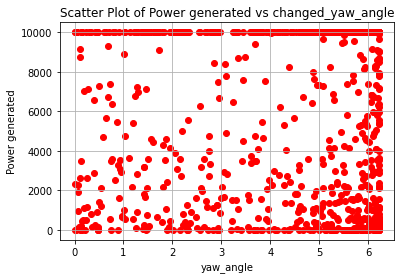

Power_list: [10000.005984442143, 10000.00752849484]
Predefined Yaw Angle 1: 55.3779216144008
Predefined Yaw Angle 2: 55.64342561476606
Changed Yaw Angle 1: 5.377921614400796
Changed Yaw Angle 2: 5.643425614766062
farm_power_baseline : [4722.88681643 2864.17861525], farm_power_yaw : [9999.99138987 6504.77162075]


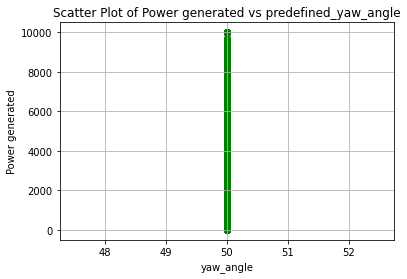

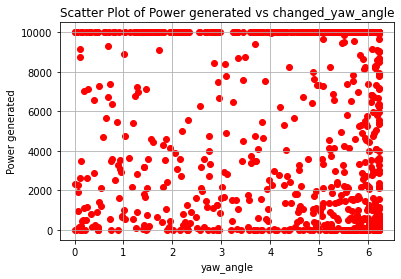

Power_list: [4722.8868164277055, 9999.992071186054]
Predefined Yaw Angle 1: 56.15703152183235
Predefined Yaw Angle 2: 55.01262022422219
Changed Yaw Angle 1: 6.157031521832349
Changed Yaw Angle 2: 5.012620224222187
farm_power_baseline : [2197.78991605 3614.99762637], farm_power_yaw : [5001.6071879  8168.43008867]


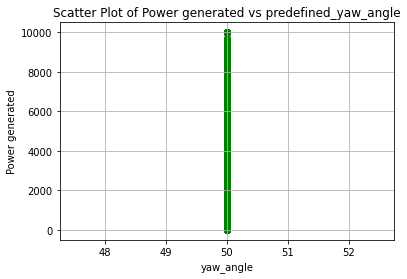

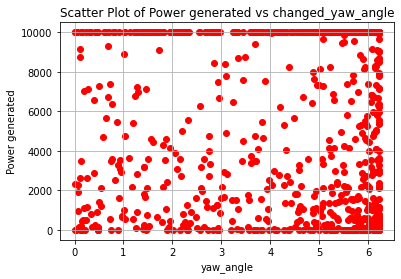

Power_list: [3614.9976263661824, 8240.973328474453]
Predefined Yaw Angle 1: 56.163876911098285
Predefined Yaw Angle 2: 55.82299244705796
Changed Yaw Angle 1: 6.1638769110982885
Changed Yaw Angle 2: 5.822992447057962
farm_power_baseline : [9483.77683325    0.        ], farm_power_yaw : [10000.00197868    69.15460451]


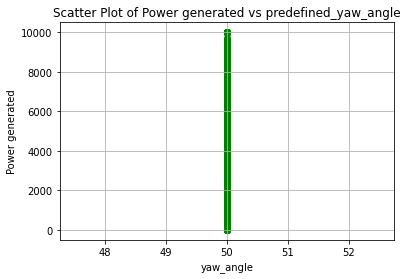

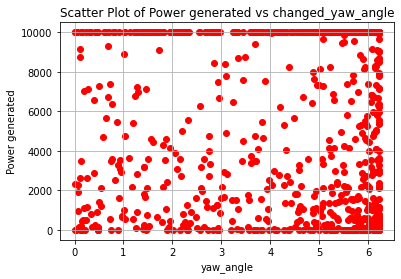

Power_list: [9483.776833245394, 10000.00197868239]
Predefined Yaw Angle 1: 56.22557596196881
Predefined Yaw Angle 2: 55.867239270672975
Changed Yaw Angle 1: 6.225575961968809
Changed Yaw Angle 2: 5.867239270672974
farm_power_baseline : [4935.28269742 5464.72929187], farm_power_yaw : [9999.99475865 9999.99624453]


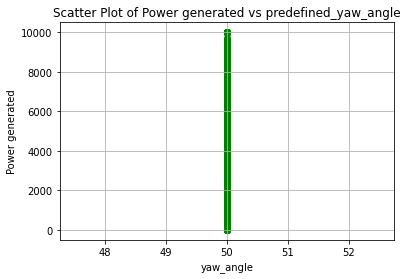

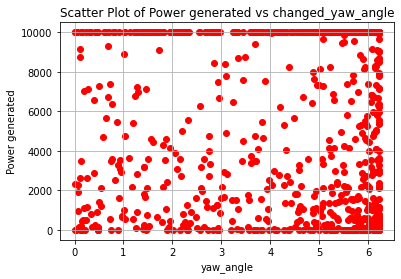

Power_list: [5464.729291873153, 9999.996244531838]
Predefined Yaw Angle 1: 53.5252557851997
Predefined Yaw Angle 2: 55.11838180796028
Changed Yaw Angle 1: 3.5252557851996946
Changed Yaw Angle 2: 5.118381807960286
farm_power_baseline : [3537.9309867    0.       ], farm_power_yaw : [8029.23272798   51.94963886]


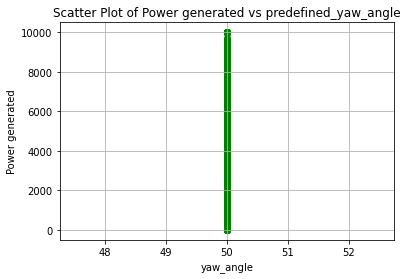

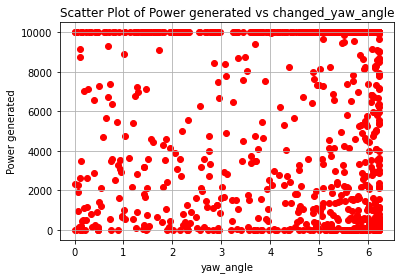

Power_list: [3537.9309866969984, 8073.373487469951]
Predefined Yaw Angle 1: 56.17249117196026
Predefined Yaw Angle 2: 56.03765335093049
Changed Yaw Angle 1: 6.172491171960259
Changed Yaw Angle 2: 6.0376533509304915
farm_power_baseline : [9999.99663149 9999.99205751], farm_power_yaw : [ 9999.99651048 10000.01630939]


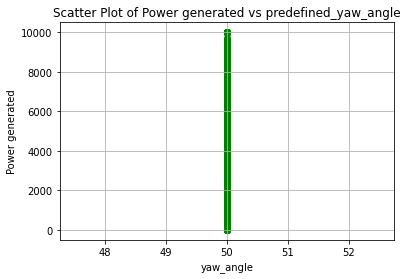

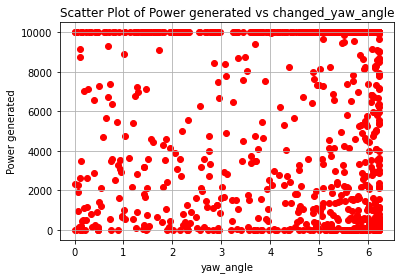

Power_list: [9999.996631494083, 10000.0179422043]
357.78665 318.67548
Predefined Yaw Angle 1: 56.18972395474194
Predefined Yaw Angle 2: 55.452274031732316
Changed Yaw Angle 1: 6.189723954741944
Changed Yaw Angle 2: 5.452274031732316
farm_power_baseline : [8974.42521518 9999.99598401], farm_power_yaw : [10000.00407295  9999.99832609]


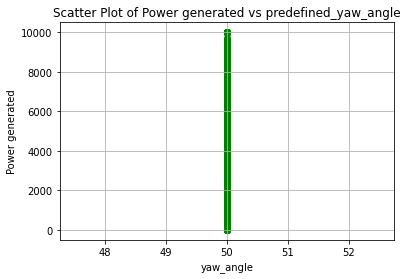

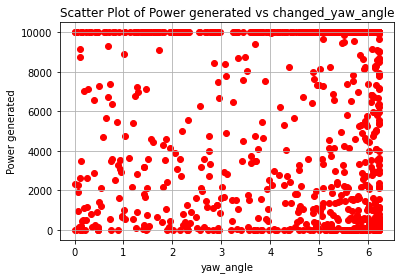

Power_list: [9999.995984006135, 10000.004072949447]
Wind_Direction:  299.8229675292969

Speed1:  4.627038955688477
 
Speed2:  11.89192008972168
 
Turbulance Intensity:  0.21088770031929016
 
Vear:  1.4300203323364258
 
Sheer:  0.007692048791795969
 
Episode:  1 Score:  10000.004072949447
------------------------------------
353.16214 353.68042
Predefined Yaw Angle 1: 56.1090109989527
Predefined Yaw Angle 2: 56.06322555634965
Changed Yaw Angle 1: 6.109010998952694
Changed Yaw Angle 2: 6.06322555634965
farm_power_baseline : [9999.99873076  491.61228597], farm_power_yaw : [10000.0144627   1252.82927972]


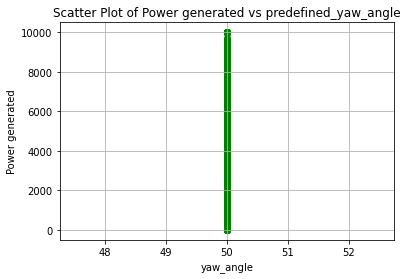

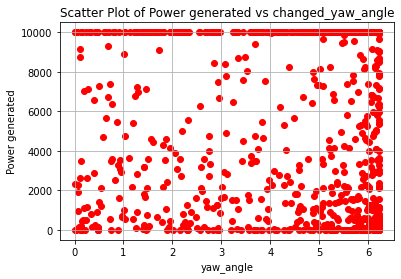

Power_list: [9999.998730757281, 10000.014462701516]
Wind_Direction:  156.8637237548828

Speed1:  3.3706281185150146
 
Speed2:  11.604812622070312
 
Turbulance Intensity:  0.4050328731536865
 
Vear:  0.662329912185669
 
Sheer:  -0.44403114914894104
 
Episode:  2 Score:  20000.01853565096
------------------------------------
330.06403 341.61133
Predefined Yaw Angle 1: 55.70587285841308
Predefined Yaw Angle 2: 55.852580166768746
Changed Yaw Angle 1: 5.705872858413078
Changed Yaw Angle 2: 5.8525801667687425
farm_power_baseline : [3905.84277648 2543.04873568], farm_power_yaw : [8794.58182089 5761.957903  ]


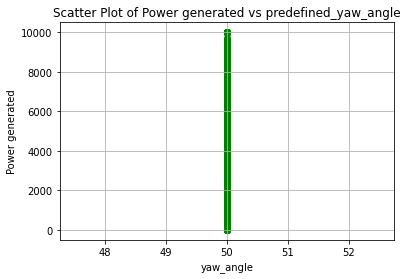

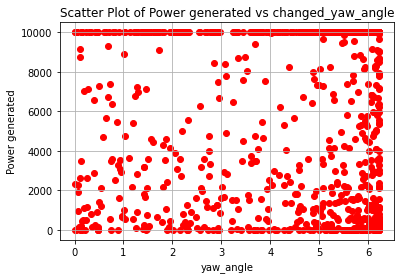

Power_list: [3905.8427764800463, 8877.618237346307]
Wind_Direction:  301.646484375

Speed1:  17.782243728637695
 
Speed2:  13.688218116760254
 
Turbulance Intensity:  0.9168194532394409
 
Vear:  1.0694903135299683
 
Sheer:  0.44875073432922363
 
Episode:  3 Score:  28877.63677299727
------------------------------------
276.66974 328.46997
Predefined Yaw Angle 1: 54.77396674659932
Predefined Yaw Angle 2: 55.62322021157563
Changed Yaw Angle 1: 4.773966746599318
Changed Yaw Angle 2: 5.623220211575631
farm_power_baseline : [10000.00578377  1182.90899834], farm_power_yaw : [10000.0097628  2766.5616301]


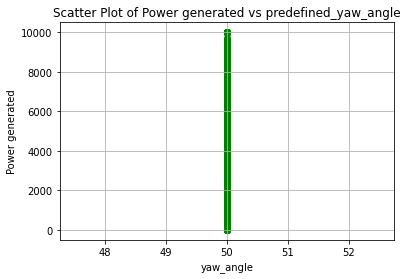

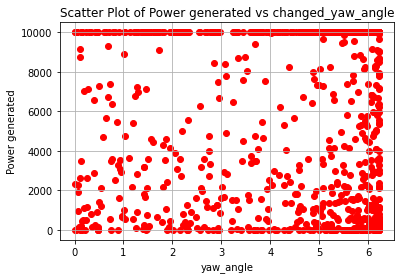

Power_list: [10000.005783769442, 10000.00976279967]
Wind_Direction:  141.138671875

Speed1:  9.003098487854004
 
Speed2:  12.633434295654297
 
Turbulance Intensity:  0.6264039874076843
 
Vear:  0.125248521566391
 
Sheer:  0.44537919759750366
 
Episode:  4 Score:  38877.64653579694
------------------------------------
354.52637 355.98734
Predefined Yaw Angle 1: 56.13282125699466
Predefined Yaw Angle 2: 56.10348882360612
Changed Yaw Angle 1: 6.1328212569946565
Changed Yaw Angle 2: 6.1034888236061215
farm_power_baseline : [1108.46691686    0.        ], farm_power_yaw : [2609.46325791    0.        ]


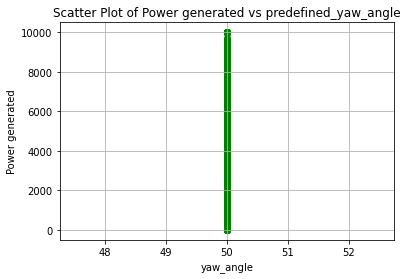

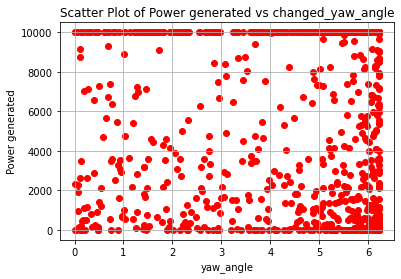

Power_list: [1108.4669168646758, 2637.2111431273997]
Wind_Direction:  311.99627685546875

Speed1:  14.75057315826416
 
Speed2:  17.481246948242188
 
Turbulance Intensity:  0.9180267453193665
 
Vear:  -0.7994271516799927
 
Sheer:  -0.2897949516773224
 
Episode:  5 Score:  41514.857678924345
------------------------------------
354.76324 344.20642
Predefined Yaw Angle 1: 56.1369555482709
Predefined Yaw Angle 2: 55.89787308005994
Changed Yaw Angle 1: 6.136955548270896
Changed Yaw Angle 2: 5.897873080059938
farm_power_baseline : [   0.         2804.81178644], farm_power_yaw : [   0.         6368.94036064]


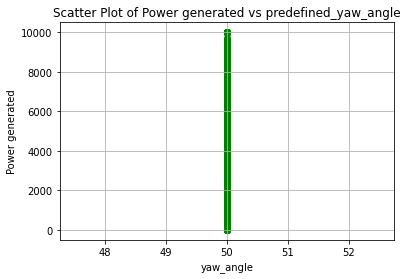

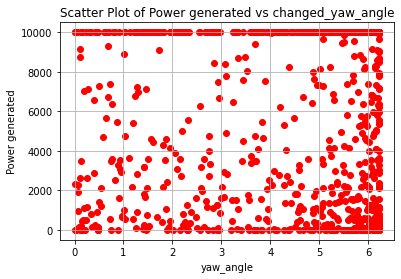

Power_list: [2804.811786440009, 6433.279042622848]
Wind_Direction:  185.66104125976562

Speed1:  6.0428009033203125
 
Speed2:  11.34683895111084
 
Turbulance Intensity:  0.7062245011329651
 
Vear:  0.3412304222583771
 
Sheer:  0.011453996412456036
 
Episode:  6 Score:  47948.13672154719
------------------------------------
343.40338 345.6887
Predefined Yaw Angle 1: 55.938688531436675
Predefined Yaw Angle 2: 55.923743559521185
Changed Yaw Angle 1: 5.938688531436677
Changed Yaw Angle 2: 5.923743559521186
farm_power_baseline : [8830.61297758 5951.81224507], farm_power_yaw : [10000.00397032  9999.9988998 ]


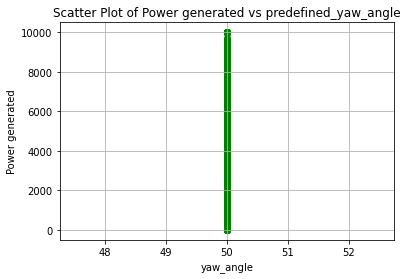

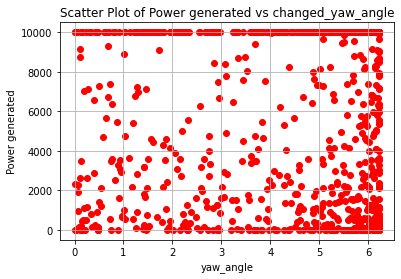

Power_list: [8830.612977584813, 10000.00431493997]
Wind_Direction:  35.67403793334961

Speed1:  7.0589799880981445
 
Speed2:  14.080792427062988
 
Turbulance Intensity:  0.9634199142456055
 
Vear:  -0.4900347590446472
 
Sheer:  0.11213529109954834
 
Episode:  7 Score:  57948.14103648716
------------------------------------
346.4477 325.26913
Predefined Yaw Angle 1: 55.99182179097706
Predefined Yaw Angle 2: 55.56735508138904
Changed Yaw Angle 1: 5.991821790977065
Changed Yaw Angle 2: 5.567355081389038
farm_power_baseline : [  0.        376.8870667], farm_power_yaw : [103.37123839 997.8832068 ]


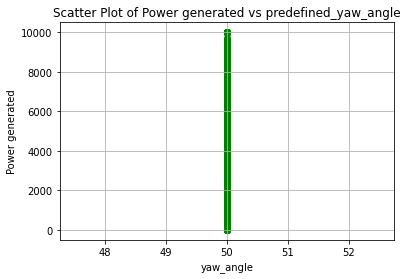

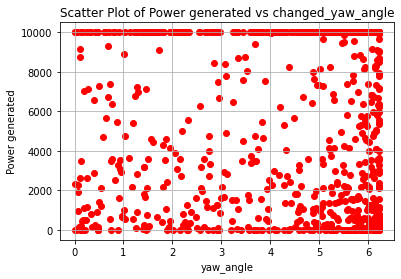

Power_list: [376.8870666991368, 1007.9694934639385]
Wind_Direction:  230.20947265625

Speed1:  13.260722160339355
 
Speed2:  12.73538875579834
 
Turbulance Intensity:  0.6582964062690735
 
Vear:  -0.7957115173339844
 
Sheer:  0.037442877888679504
 
Episode:  8 Score:  58956.110529951104
------------------------------------
352.00443 351.9509
Predefined Yaw Angle 1: 56.088805063130046
Predefined Yaw Angle 2: 56.033039690658036
Changed Yaw Angle 1: 6.088805063130045
Changed Yaw Angle 2: 6.033039690658038
farm_power_baseline : [7660.51623269 6800.44586223], farm_power_yaw : [ 9999.99870603 10000.00521573]


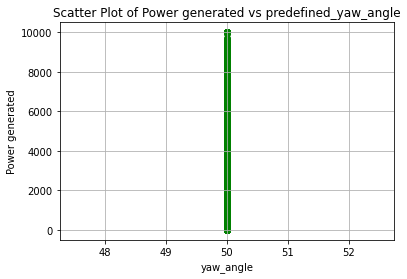

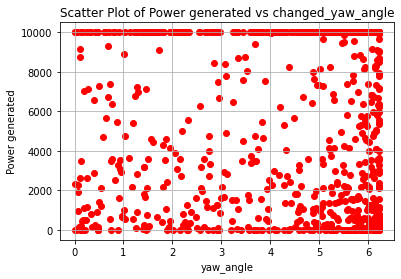

Power_list: [7660.51623269499, 10000.005215730544]
Wind_Direction:  1.5346554517745972

Speed1:  13.555290222167969
 
Speed2:  9.615145683288574
 
Turbulance Intensity:  0.680316686630249
 
Vear:  0.39410483837127686
 
Sheer:  -0.2857380211353302
 
Episode:  9 Score:  68956.11574568164
------------------------------------
344.17093 135.1208
Predefined Yaw Angle 1: 55.952084764351994
Predefined Yaw Angle 2: 52.24864064370414
Changed Yaw Angle 1: 5.952084764351993
Changed Yaw Angle 2: 2.2486406437041455
farm_power_baseline : [   0.         9999.99220248], farm_power_yaw : [    0.         10000.01724888]


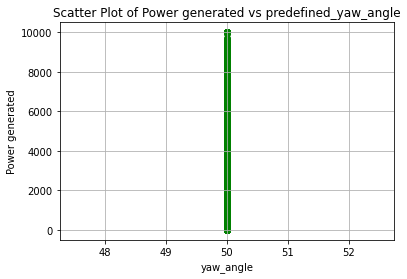

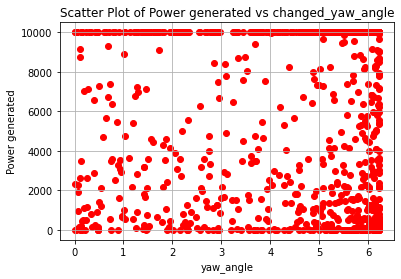

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Power_list: [9999.992202480318, 10000.017248875358]
Wind_Direction:  133.5959930419922

Speed1:  9.086457252502441
 
Speed2:  4.954886436462402
 
Turbulance Intensity:  0.5441938042640686
 
Vear:  0.11211972683668137
 
Sheer:  -0.476413369178772
 
Episode:  10 Score:  78956.132994557
------------------------------------
Predefined Yaw max power list: [9999.995984006135, 19999.994714763416, 23905.837491243463, 33905.84327501291, 35014.31019187758, 37819.12197831759, 46649.7349559024, 47026.622022601536, 54687.13825529652, 64687.13045777684]
Changed Yaw max Power list: [10000.004072949447, 20000.01853565096, 28877.63677299727, 38877.64653579694, 41514.857678924345, 47948.13672154719, 57948.14103648716, 58956.110529951104, 68956.11574568164, 78956.132994557]


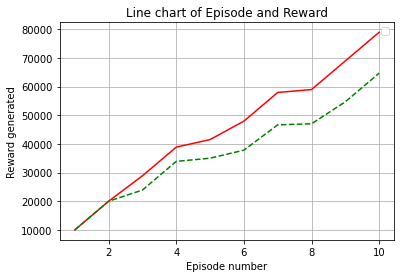

Mean of Predefined Yaw Power:  37369.57293267984
Mean of Changed Yaw Power:  45203.480062454306
StdDev of Predefined Yaw Power 16584.2695349178
StdDev of Changed Yaw Power 21749.0181357786


In [6]:
model = SAC(MlpPolicy, env, verbose=1,gamma = 0.99,train_freq=2)
model.learn(total_timesteps=500)
model.save("sac_wind_farm")

#del model remove to demonstrate saving and loading

#model = SAC.load("sac_wind_farm")

obs = env.reset()

episodes = 10
#done = False
ep_list = [i for i in range(1,11)]
score1 = 0
score2 = 0
rew = []
base_power = []
for episode in range(1, episodes+1):
    obs = env.reset() 
    #done = False
    #score = 0
    action, _states = model.predict(obs)
    print(action[0],action[1])
    obs, reward, done, info = env.step(action)
    #wind_direction - obs[0]
    #speed1 - obs[1]
    #speed2 - obs[2]
    #TI - obs[3]
    #vear - obs[4]
    #sheer - obs[5]
    print('Wind_Direction:  {}\n'.format(obs[0]))
    print('Speed1:  {}\n '.format(obs[1]))
    print('Speed2:  {}\n '.format(obs[2]))
    print('Turbulance Intensity:  {}\n '.format(obs[3]))
    print('Vear:  {}\n '.format(obs[4]))
    print('Sheer:  {}\n '.format(obs[5]))
    if done==True:
        break
    else:
        score1+=reward
        rew.append(score1)
        score2+=info.get('power')
        base_power.append(score2)
        
    print('Episode:  {} Score:  {}'.format(episode, score1))
    print("------------------------------------")

print('Predefined Yaw max power list:',base_power)
print('Changed Yaw max Power list:',rew)
plt.plot(ep_list, rew, color ="red")
plt.plot(ep_list,base_power,'--',color = "green")
plt.title('Line chart of Episode and Reward')
plt.xlabel('Episode number')
plt.ylabel('Reward generated')
plt.legend()
plt.grid()
plt.show()
print("Mean of Predefined Yaw Power: ",statistics.mean(base_power))
print("Mean of Changed Yaw Power: ",statistics.mean(rew))
print("StdDev of Predefined Yaw Power",statistics.stdev(base_power))
print("StdDev of Changed Yaw Power",statistics.stdev(rew))